In [2]:
import os
import tempfile

import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sb
import numpy as np
import torch
from rich import print
from scib_metrics.benchmark import Benchmarker

# Reproducibility
import scvi
from scvi.external import SysVI

# Define the path to the directory you want to change to
new_directory = '/scratch365/eaboelno/cVAE_analysis/sysVI/'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.1

In [2]:
adata = sc.read_h5ad('./adata_all_mergedHVG_CAPS_updateSYS.h5ad')
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    layers: 'counts', 'log1p_norm'

In [3]:
adata.obs

,sample_id,publication,sample_id_anon,individual_id_anon,replicate,treatment,condition,tissue,time,batch,...,age_scale,age_cat,pmi_cat,pmi_cat2,cell_cycle_diff,cell_type_eval,library_type,sample_type,organism,system
GTATTTCGTCCACATA-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,0,adult,None,None,-0.039946,excitatory neurons,10X 3p kit v3.1,sn,mouse,0
ATACCTTGTCGACGCT-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,0,adult,None,None,-0.030285,inhibitory neurons,10X 3p kit v3.1,sn,mouse,0
TCAAGACGTGCTGCAC-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,0,adult,None,None,0.002119,excitatory neurons,10X 3p kit v3.1,sn,mouse,0
AGTACTGTCAAGTAAG-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,0,adult,None,None,0.039672,excitatory neurons,10X 3p kit v3.1,sn,mouse,0
TCCCAGTTCCGATGCG-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,0,adult,None,None,-0.016213,inhibitory neurons,10X 3p kit v3.1,sn,mouse,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ind102-Sample4:TTTGTTGAGCGACTGA-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,0.301502181578831,inbetween,6H_to_12H,up_to_12H,0.059753,oligodendrocytes,10X 3p kit v3.3,sn,human,2
Ind102-Sample4:TTTGTTGAGTAGCTCT-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,0.301502181578831,inbetween,6H_to_12H,up_to_12H,0.037903,microglia,10X 3p kit v3.3,sn,human,2
Ind102-Sample4:TTTGTTGCAGACGATG-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,0.301502181578831,inbetween,6H_to_12H,up_to_12H,-0.052304,microglia,10X 3p kit v3.3,sn,human,2
Ind102-Sample4:TTTGTTGCATACAGAA-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,0.301502181578831,inbetween,6H_to_12H,up_to_12H,-0.023288,oligodendrocytes,10X 3p kit v3.3,sn,human,2


In [6]:
print(adata.X[:10, :10])

(0, 0)        0.514019250869751
  (0, 1)        0.514019250869751
  (0, 2)        1.9527411460876465
  (0, 4)        2.5723040103912354
  (0, 7)        0.514019250869751
  (0, 8)        0.514019250869751
  (1, 0)        0.8590490818023682
  (1, 1)        1.1123087406158447
  (1, 4)        2.215445041656494
  (1, 8)        0.5190659761428833
  (2, 0)        0.8548349142074585
  (2, 1)        1.476469874382019
  (2, 2)        2.80556058883667
  (2, 4)        2.7203314304351807
  (3, 1)        1.3199665546417236
  (3, 2)        2.6889679431915283
  (3, 4)        1.8697373867034912
  (3, 7)        0.522254467010498
  (4, 1)        0.8767248392105103
  (4, 2)        0.8767248392105103
  (4, 4)        1.5057518482208252
  (4, 5)        0.5315150618553162
  (4, 8)        0.8767248392105103
  (5, 0)        0.5346282720565796
  (5, 1)        0.5346282720565796
  (5, 2)        2.2493703365325928
  (5, 4)        2.6190474033355713
  (6, 0)        0.5380162000656128
  (6, 2)        2.855891704559326
  (6, 4)        1.7897979021072388
  (6, 8)        0.5380162000656128
  (7, 1)        0.5430452823638916
  (7, 2)        1.7998406887054443
  (7, 4)        2.0137243270874023
  (7, 7)        0.5430452823638916
  (8, 0)        0.5519569516181946
  (8, 1)        1.3728526830673218
  (8, 2)        2.887195110321045
  (8, 4)        2.286433219909668
  (8, 5)        0.5519569516181946
  (8, 7)        0.9055519104003906
  (8, 8)        0.5519569516181946
  (8, 9)        0.5519569516181946
  (9, 0)        0.9251258969306946
  (9, 1)        1.5697537660598755
  (9, 2)        1.958508014678955
  (9, 4)        2.3158087730407715
  (9, 7)        0.5659345984458923
  (9, 8)        0.5659345984458923

In [7]:
print(adata.raw.X[:10, :10])

(0, 5)        1.0
  (3, 3)        1.0
  (3, 5)        2.0
  (3, 8)        1.0
  (4, 5)        1.0
  (5, 2)        1.0
  (5, 4)        1.0
  (5, 5)        3.0
  (5, 8)        2.0
  (6, 5)        1.0
  (8, 5)        2.0
  (9, 5)        6.0

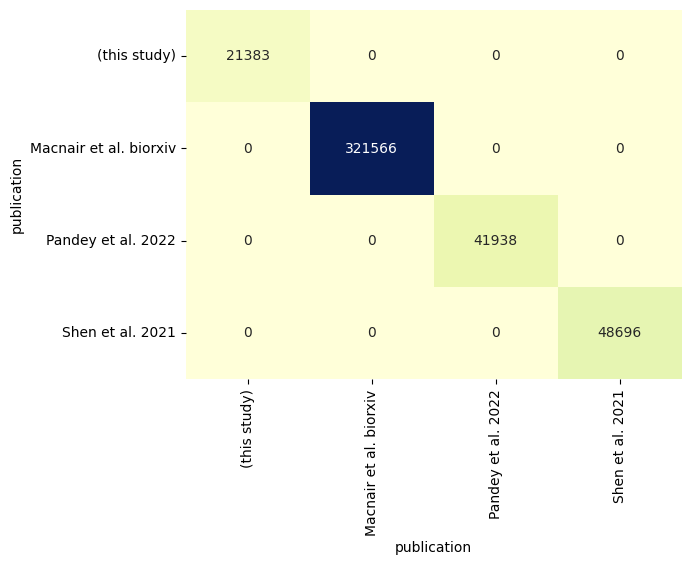

In [4]:
crosstab_df = pd.crosstab(adata.obs.publication, adata.obs.publication)

# Create the heatmap with integer annotations
sb.heatmap(crosstab_df, cmap="YlGnBu", annot=True, fmt="d", cbar=False)

# Show the heatmap
plt.show()

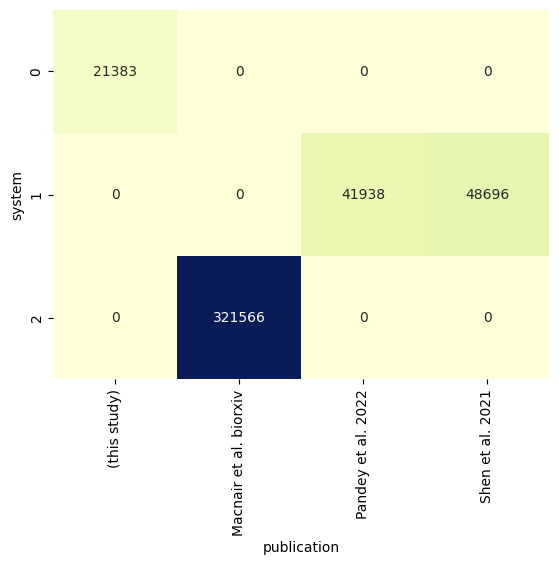

In [5]:
crosstab_df = pd.crosstab(adata.obs.system, adata.obs.publication)

# Create the heatmap with integer annotations
sb.heatmap(crosstab_df, cmap="YlGnBu", annot=True, fmt="d", cbar=False)

# Show the heatmap
plt.show()

# Initiate model

In [8]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    layers: 'counts', 'log1p_norm'

In [9]:
# Setup adata for training
SysVI.setup_anndata(
    adata=adata,
    batch_key="system",
    categorical_covariate_keys=["batch"],
)

INFO     Using column names from columns of adata.obsm['system']                                                   
INFO     Using column names from columns of adata.obsm['covariates']                                               


In [10]:
# Initialise the model
model = SysVI(adata=adata)

INFO     The model has been initialized                                                                            


In [11]:
# Train
max_epochs = 200
model.train(
    max_epochs=max_epochs,
    # Parameters used for checking losses
    log_every_n_steps=1,
    check_val_every_n_epoch=1,
    val_check_interval=1.0,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Epoch 200/200: 100%|███████████████████████████████████████████████████████| 200/200 [3:15:37<00:00, 56.13s/it, v_num=1, loss_train=-1.76e+3]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|███████████████████████████████████████████████████████| 200/200 [3:15:37<00:00, 58.69s/it, v_num=1, loss_train=-1.76e+3]


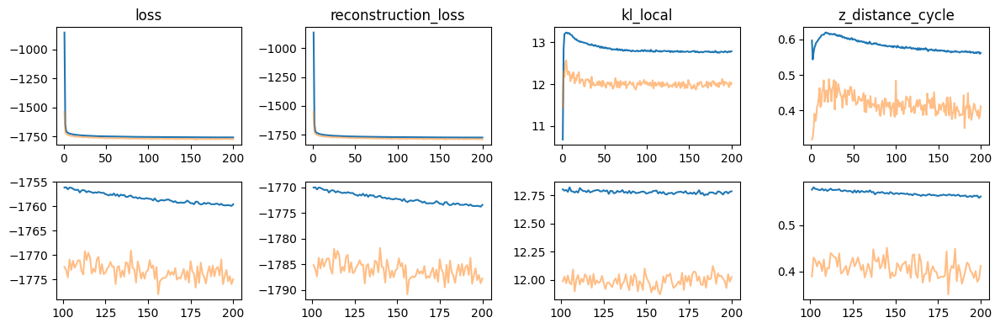

In [12]:
# Plot loses
# The plotting code below was specifcally adapted to the above specified model and its training
# If changing the model or training the plotting functions may need to be addapted accordingly

# Make detailed plot after N epochs
epochs_detail_plot = 100
steps_detail_plot = epochs_detail_plot * int(
    model.trainer.logger.history["loss_validation"].shape[0] / max_epochs
)
detail_plot = epochs_detail_plot

# Losses to plot
losses = [
    "loss_train",
    "reconstruction_loss_train",
    "kl_local_train",
    "z_distance_cycle_train",
]
fig, axs = plt.subplots(2, len(losses), figsize=(len(losses) * 3, 4))
for ax_i, l_train in enumerate(losses):
    l_val = l_train.replace("_train", "_validation")
    l_name = l_train.replace("_train", "")
    # Change idx of epochs to start with 1 so that below adjustment when
    # train on step which only works for val leads to appropriate multiplication
    l_val_values = model.trainer.logger.history[l_val].copy()
    l_val_values.index = l_val_values.index + 1
    l_train_values = model.trainer.logger.history[l_train].copy()
    l_train_values.index = l_train_values.index + 1
    # This happens if log on step as currently this works only for val loss
    if l_train_values.shape[0] < l_val_values.shape[0]:
        l_train_values.index = l_train_values.index * int(
            l_val_values.shape[0] / l_train_values.shape[0]
        )
    for l_values, c, alpha, dp in [
        # Train loss logged on epoch in either case now
        (l_train_values, "tab:blue", 1, epochs_detail_plot),
        (l_val_values, "tab:orange", 0.5, detail_plot),
    ]:
        axs[0, ax_i].plot(l_values.index, l_values.values.ravel(), c=c, alpha=alpha)
        axs[0, ax_i].set_title(l_name)
        axs[1, ax_i].plot(
            l_values.index[dp:], l_values.values.ravel()[dp:], c=c, alpha=alpha
        )

fig.tight_layout()

In [13]:
# Get embedidng - save it into X of new AnnData
embed = model.get_latent_representation(adata=adata)
embed = sc.AnnData(embed, obs=adata.obs)
# Make system categorical for plotting below
embed.obs["sysVI"] = embed.obs["system"].map({0: "mouse-sn", 1: "mouse-sc", 2: "human-sn"})

In [14]:
embed

AnnData object with n_obs × n_vars = 433583 × 15
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sysVI'

In [15]:
# Compute UMAP
sc.pp.neighbors(embed, use_rep="X")
sc.tl.umap(embed)

In [16]:
embed.obs

,sample_id,publication,sample_id_anon,individual_id_anon,replicate,treatment,condition,tissue,time,batch,...,age_cat,pmi_cat,pmi_cat2,cell_cycle_diff,cell_type_eval,library_type,sample_type,organism,system,sysVI
GTATTTCGTCCACATA-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,adult,None,None,-0.039946,excitatory neurons,10X 3p kit v3.1,sn,mouse,0,mouse-sn
ATACCTTGTCGACGCT-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,adult,None,None,-0.030285,inhibitory neurons,10X 3p kit v3.1,sn,mouse,0,mouse-sn
TCAAGACGTGCTGCAC-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,adult,None,None,0.002119,excitatory neurons,10X 3p kit v3.1,sn,mouse,0,mouse-sn
AGTACTGTCAAGTAAG-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,adult,None,None,0.039672,excitatory neurons,10X 3p kit v3.1,sn,mouse,0,mouse-sn
TCCCAGTTCCGATGCG-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,...,adult,None,None,-0.016213,inhibitory neurons,10X 3p kit v3.1,sn,mouse,0,mouse-sn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ind102-Sample4:TTTGTTGAGCGACTGA-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,inbetween,6H_to_12H,up_to_12H,0.059753,oligodendrocytes,10X 3p kit v3.3,sn,human,2,human-sn
Ind102-Sample4:TTTGTTGAGTAGCTCT-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,inbetween,6H_to_12H,up_to_12H,0.037903,microglia,10X 3p kit v3.3,sn,human,2,human-sn
Ind102-Sample4:TTTGTTGCAGACGATG-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,inbetween,6H_to_12H,up_to_12H,-0.052304,microglia,10X 3p kit v3.3,sn,human,2,human-sn
Ind102-Sample4:TTTGTTGCATACAGAA-1_macnair,Human_MS,Macnair et al. biorxiv,Ind102-Sample4,Ind102,1,MS_patient,MS,White matter,64 years,122,...,inbetween,6H_to_12H,up_to_12H,-0.023288,oligodendrocytes,10X 3p kit v3.3,sn,human,2,human-sn


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


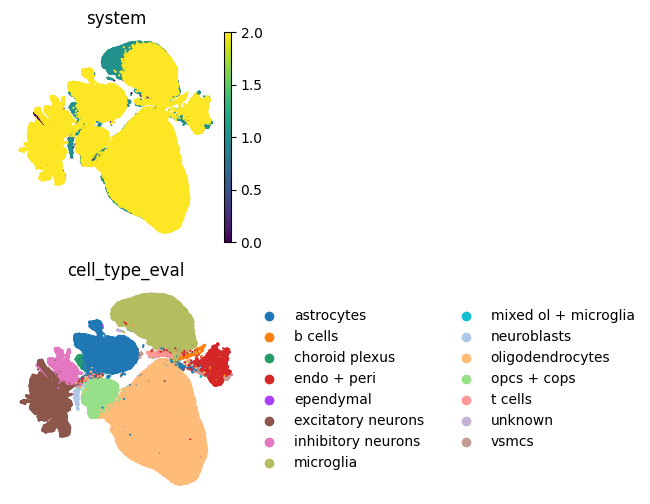

In [17]:
# Plot UMAP embedding

# Obs columns to color by
cols = ["system", "cell_type_eval"]

# One plot per obs column used for coloring
fig, axs = plt.subplots(len(cols), 1, figsize=(3, 3 * len(cols)))
for col, ax in zip(cols, axs):
    sc.pl.embedding(
        embed,
        "X_umap",
        color=col,
        s=10,
        ax=ax,
        show=False,
        sort_order=False,
        frameon=False,
    )

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/sc

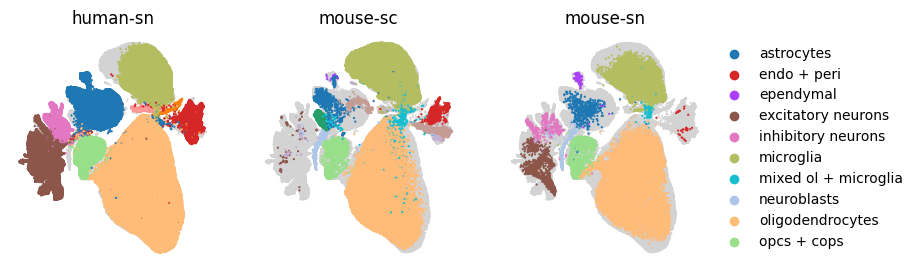

In [18]:
# Plot UMAP embedding per system
systems = sorted(embed.obs.sysVI.unique())
ncols = len(systems)
# Plot systems side by side
fig, axs = plt.subplots(1, ncols, figsize=(3 * ncols, 3))
for i, system in enumerate(systems):
    ax = axs[i]
    # Plot all cells as background and on top cells from one system colored by cell type
    sc.pl.umap(embed, ax=ax, show=False, s=5, frameon=False)
    sc.pl.umap(
        embed[embed.obs.sysVI == system, :],
        color="cell_type_eval",
        ax=ax,
        show=False,
        s=10,
        frameon=False,
        title=system,  # Fix: Use `system` instead of `systems`
    )
    # Keep legend only on the last plot (assuming this legend contains all categories)
    if i != ncols - 1:
        ax.get_legend().remove()

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/sc

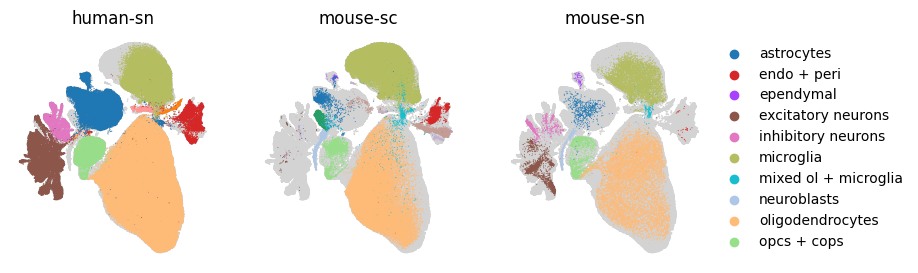

In [27]:
# Plot UMAP embedding per system
systems = sorted(embed.obs.sysVI.unique())
ncols = len(systems)
# Plot systems side by side
fig, axs = plt.subplots(1, ncols, figsize=(3 * ncols, 3))
for i, system in enumerate(systems):
    ax = axs[i]
    # Plot all cells as background and on top cells from one system colored by cell type
    sc.pl.umap(embed, ax=ax, show=False, s=5, frameon=False)
    sc.pl.umap(
        embed[embed.obs.sysVI == system, :],
        color="cell_type_eval",
        ax=ax,
        show=False,
        s=2,
        frameon=False,
        title=system,  # Fix: Use `system` instead of `systems`
    )
    # Keep legend only on the last plot (assuming this legend contains all categories)
    if i != ncols - 1:
        ax.get_legend().remove()

# Alternate- adapt the adata directly like in scVI

In [19]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: 'layer_information', 'system_order', 'covariate_categ_orders', 'covariate_key_orders', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'system', 'covariates'
    layers: 'counts', 'log1p_norm'

In [20]:
SYSVI_LATENT_KEY = "X_sysVI"
adata.obsm[SYSVI_LATENT_KEY] = model.get_latent_representation(adata=adata)

In [21]:
sc.pp.neighbors(adata, use_rep = 'X_sysVI', n_neighbors=30) #can go up if the dataset is very large
sc.tl.umap(adata, min_dist=0.2) #increase min_dist reduces general features 
sc.tl.leiden(adata, resolution=0.5, key_added="sys_leiden_0.5")
sc.tl.leiden(adata, resolution=1, key_added="sys_leiden_1")
sc.tl.leiden(adata, resolution=1.5, key_added="sys_leiden_1.5")
sc.tl.leiden(adata, resolution=2, key_added="sys_leiden_2")

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seei

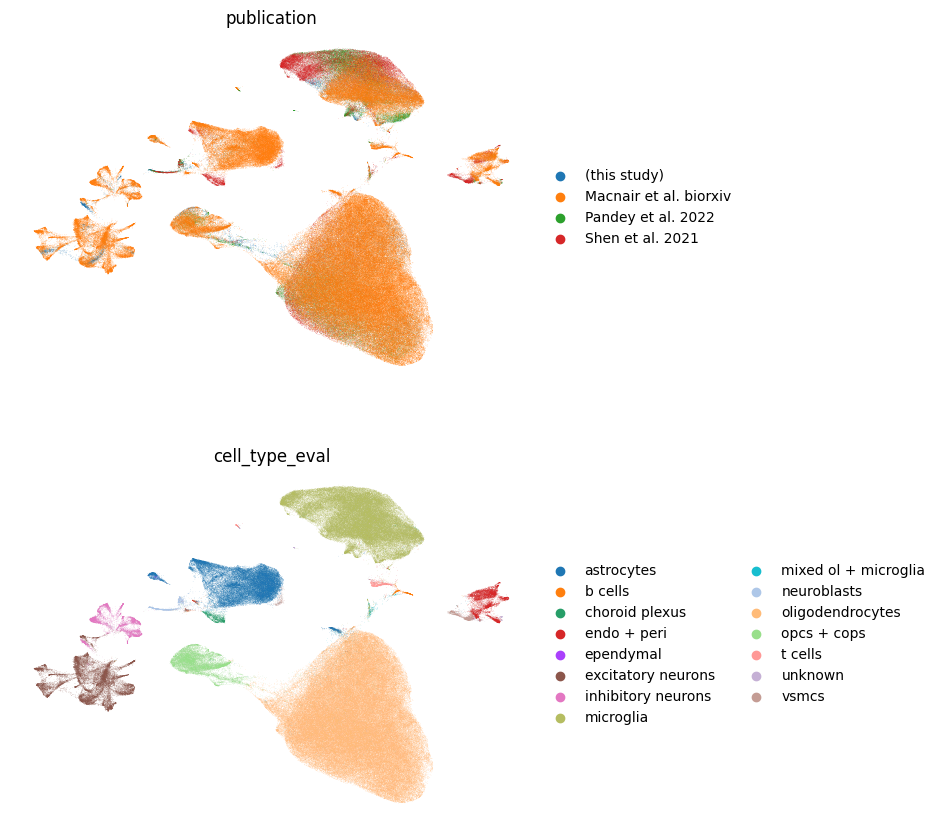

In [22]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["publication", "cell_type_eval"],
    frameon=False,
    ncols=1,
)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/sc

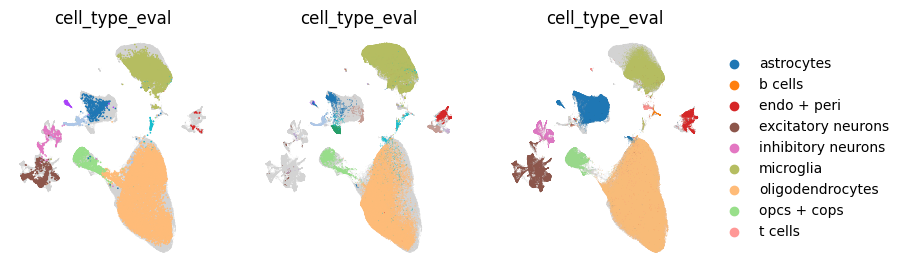

In [30]:
# Plot UMAP embedding per system
systems = sorted(adata.obs.system.unique())
ncols = len(systems)
# Plot systems side by side
fig, axs = plt.subplots(1, ncols, figsize=(3 * ncols, 3))
for i, system in enumerate(systems):
    ax = axs[i]
    # Plot all cells as background and on top cells from one system colored by cell type
    sc.pl.umap(adata, ax=ax, show=False, frameon=False)
    sc.pl.umap(
        adata[adata.obs.system == system, :],
        color="cell_type_eval",
        ax=ax,
        show=False,
        frameon=False,
        #title=system,  # Fix: Use `system` instead of `systems`
    )
    # Keep legend only on the last plot (assuming this legend contains all categories)
    if i != ncols - 1:
        ax.get_legend().remove()

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seei

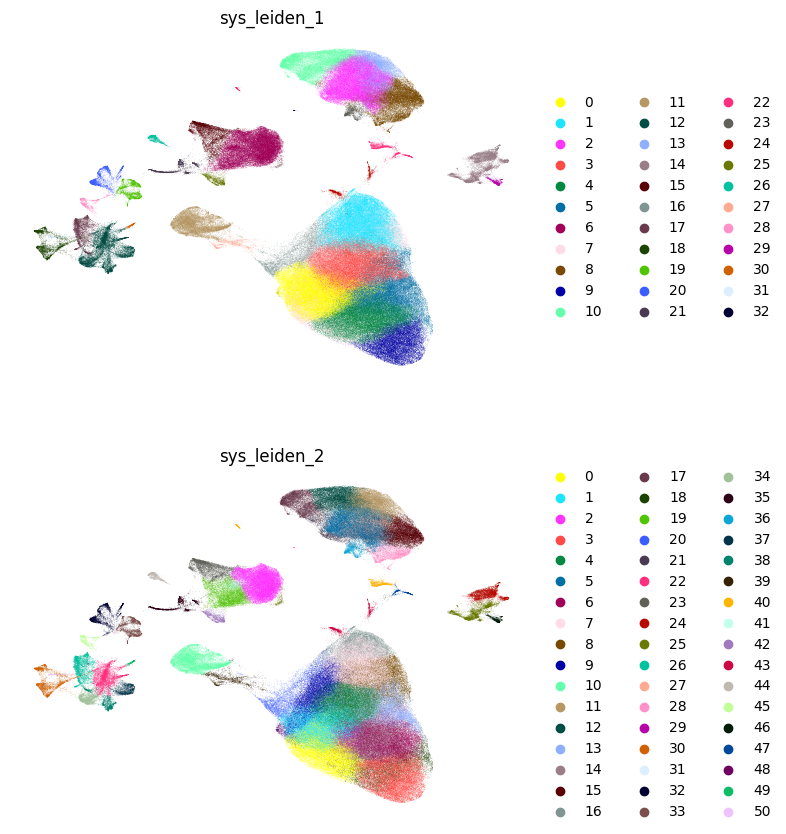

In [23]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["sys_leiden_1", "sys_leiden_2"],
    frameon=False,
    ncols=1,
)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


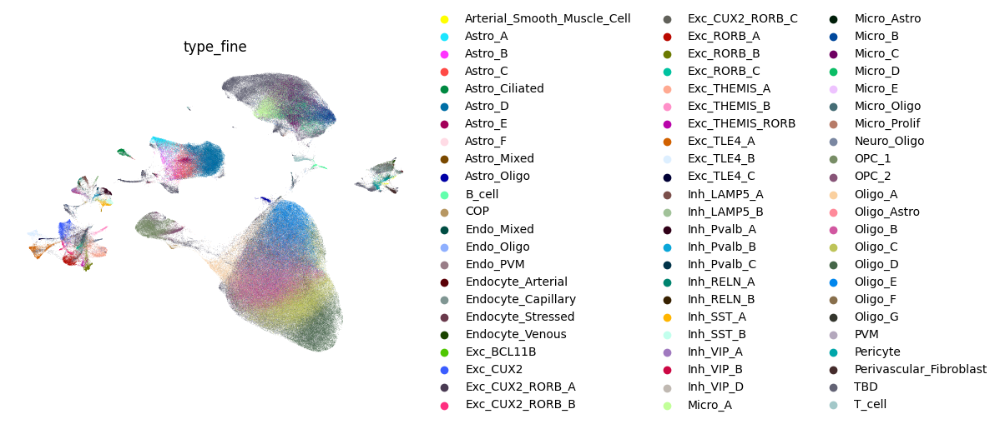

In [24]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["type_fine"],
    frameon=False,
    ncols=1,
)

In [32]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: 'layer_information', 'system_order', 'covariate_categ_orders', 'covariate_key_orders', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'publication_colors', 'cell_type_eval_colors', 'sys

In [34]:
embed

AnnData object with n_obs × n_vars = 433583 × 15
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sysVI'
    uns: 'neighbors', 'umap', 'cell_type_eval_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [31]:
model.save('sysVI_all.model')

In [40]:
model

cVAE model with optional VampPrior and latent cycle-consistency loss
Training status: Trained

In [41]:
model.save_state_dict('sysVI_all.pt')

AttributeError: 'SysVI' object has no attribute 'save_state_dict'

In [ ]:
system_data = adata.obsm['system']
print(system_data)

In [36]:
adata.obsm['system']

,0,1,2
GTATTTCGTCCACATA-1_adams_mouse,1.0,0.0,0.0
ATACCTTGTCGACGCT-1_adams_mouse,1.0,0.0,0.0
TCAAGACGTGCTGCAC-1_adams_mouse,1.0,0.0,0.0
AGTACTGTCAAGTAAG-1_adams_mouse,1.0,0.0,0.0
TCCCAGTTCCGATGCG-1_adams_mouse,1.0,0.0,0.0
...,...,...,...
Ind102-Sample4:TTTGTTGAGCGACTGA-1_macnair,0.0,0.0,1.0
Ind102-Sample4:TTTGTTGAGTAGCTCT-1_macnair,0.0,0.0,1.0
Ind102-Sample4:TTTGTTGCAGACGATG-1_macnair,0.0,0.0,1.0
Ind102-Sample4:TTTGTTGCATACAGAA-1_macnair,0.0,0.0,1.0


In [37]:
# Change column names in obsm['system']
adata.obsm['system'].columns = ['mouse-sn', 'mouse-sc', 'human-sn']

In [38]:
adata.write_h5ad('./sysVI_h2m_all_output.h5ad')

In [39]:
embed.write("./sysVI_embed.h5ad")

# Play with plotting

         Falling back to preprocessing with `sc.pp.pca` and default params.


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be r

categories: astrocytes, b cells, choroid plexus, etc.
var_group_labels: OL lineage, OPC markers, COP markers, etc.


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


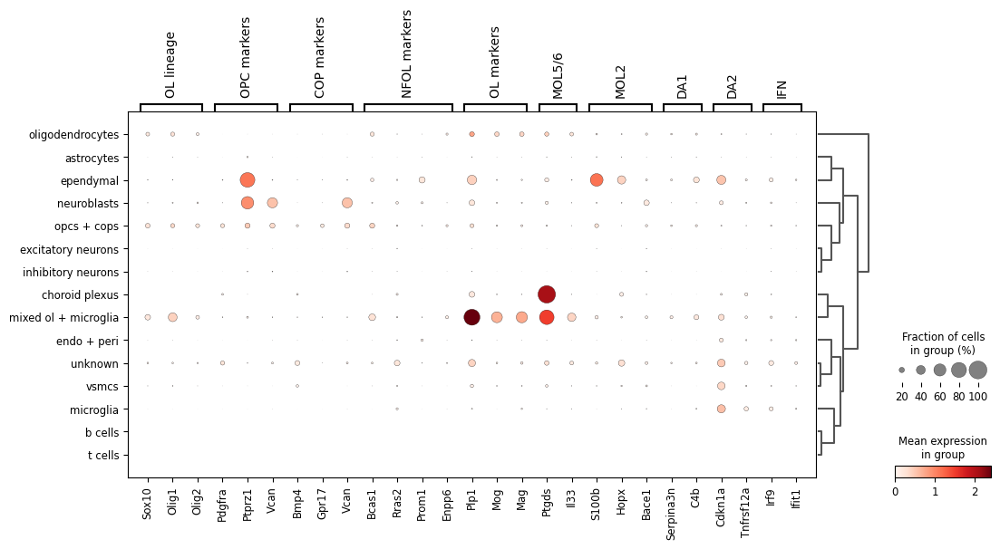

In [42]:
marker_genes = {
    'OL lineage': ['Sox10', 'Olig1', 'Olig2'],
    'OPC markers': ['Pdgfra', 'Ptprz1', 'Vcan'],
    'COP markers': ['Bmp4', 'Gpr17', 'Vcan'],
    'NFOL markers': ['Bcas1', 'Rras2', 'Prom1', 'Enpp6'],
    'OL markers': ['Plp1', 'Mog', 'Mag'],
    'MOL5/6': ['Ptgds', 'Il33'],
    'MOL2': ['S100b', 'Hopx', 'Bace1'],
    'DA1': ['Serpina3n', 'C4b'],
    'DA2': ['Cdkn1a', 'Tnfrsf12a'],
    'IFN': ['Irf9', 'Ifit1']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

sc.pl.dotplot(
    adata,
    groupby="cell_type_eval",
    var_names=all_genes,
    use_raw=True,
    log=True,
    dendrogram=True,
    var_group_positions=[(0, 2), (3, 5), (6, 8), (9,12), (13, 15), (16, 17), (18, 20), (21, 22), (23, 24), (25,26)],
    var_group_labels=list(marker_genes.keys()),
    show=True
)

In [43]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: 'layer_information', 'system_order', 'covariate_categ_orders', 'covariate_key_orders', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'publication_colors', 'cell_type_eval_colors', 'sys

categories: astrocytes, b cells, choroid plexus, etc.
var_group_labels: OL lineage, OPC markers, COP markers, etc.


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Pa

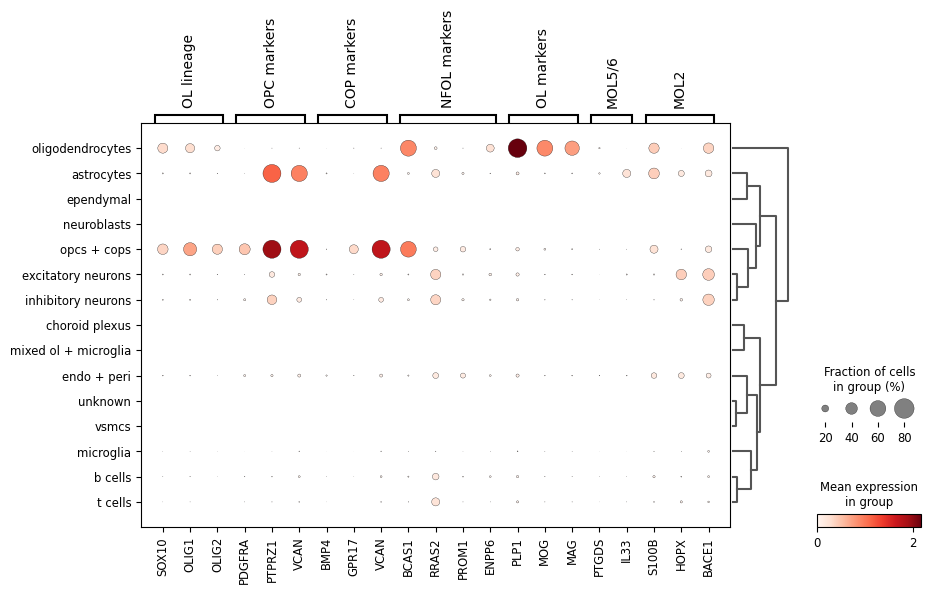

In [46]:
marker_genes = {
    'OL lineage': ['SOX10', 'OLIG1', 'OLIG2'],
    'OPC markers': ['PDGFRA', 'PTPRZ1', 'VCAN'],
    'COP markers': ['BMP4', 'GPR17', 'VCAN'],
    'NFOL markers': ['BCAS1', 'RRAS2', 'PROM1', 'ENPP6'],
    'OL markers': ['PLP1', 'MOG', 'MAG'],
    'MOL5/6': ['PTGDS', 'IL33'],
    'MOL2': ['S100B', 'HOPX', 'BACE1']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

sc.pl.dotplot(
    adata,
    groupby="cell_type_eval",
    var_names=all_genes,
    use_raw=True,
    log=True,
    dendrogram=True,
    var_group_positions=[(0, 2), (3, 5), (6, 8), (9,12), (13, 15), (16, 17), (18, 20)],
    var_group_labels=list(marker_genes.keys()),
    show=True
)

## Continue exploration

In [3]:
adata= sc.read_h5ad('./sysVI_h2m_all_output.h5ad')
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_colors', 'sys_

In [33]:
cells_per_batch = adata.obs.groupby(['publication', 'batch']).size().reset_index(name='N_cells')
adata

/tmp/143724.1.gpu-long/ipykernel_2374442/4132104740.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cells_per_batch = adata.obs.groupby(['publication', 'batch']).size().reset_index(name='N_cells')


AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_colors', 'sys_

In [58]:
import pandas as pd

# Assuming adata is your dataset

# Unique values and frequencies of 'library_type'
unique_sample_types_counts = adata.obs['library_type'].value_counts().reset_index()
unique_sample_types_counts.columns = ['Library Type', 'Frequency']

# Unique values and frequencies of 'publication'
unique_publications_counts = adata.obs['publication'].value_counts().reset_index()
unique_publications_counts.columns = ['Publication', 'Frequency']

# Display as tables
print("Unique Sample Types:")
print(unique_sample_types_counts)

print("\nUnique Publications:")
print(unique_publications_counts)


Unique Sample Types:

Library Type  Frequency
0  10X 3p kit v3.3     321566
1    10X 3p kit v2      90634
2  10X 3p kit v3.1      21383

Unique Publications:

Publication  Frequency
0  Macnair et al. biorxiv     321566
1        Shen et al. 2021      48696
2      Pandey et al. 2022      41938
3            (this study)      21383

In [36]:
cells_per_batch

,publication,batch,N_cells
0,(this study),1,2414
1,(this study),2,2200
2,(this study),3,3905
3,(this study),4,2315
4,(this study),5,3717
...,...,...,...
483,Shen et al. 2021,118,0
484,Shen et al. 2021,119,0
485,Shen et al. 2021,120,0
486,Shen et al. 2021,121,0


/tmp/143724.1.gpu-long/ipykernel_2374442/30581703.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, order=desired_order)


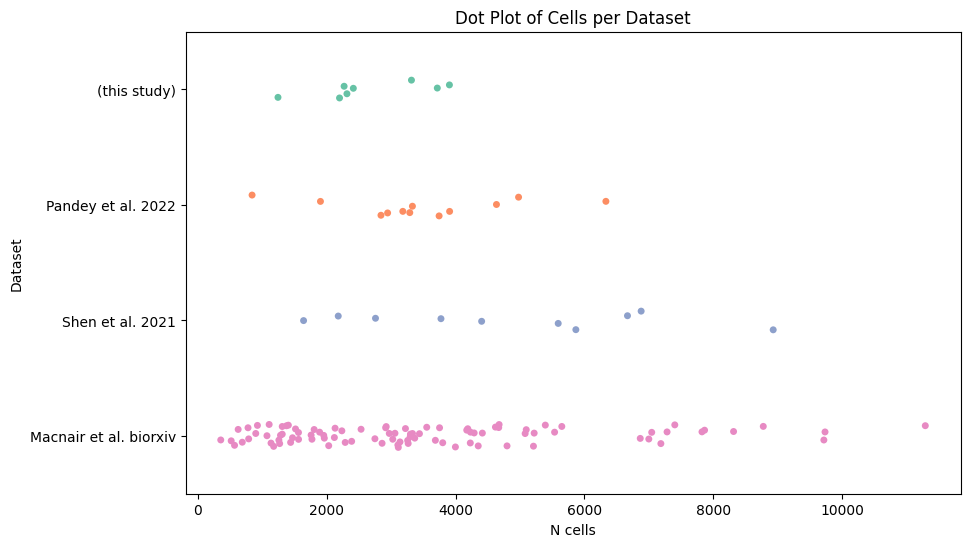

In [42]:
# Define the desired order of datasets
desired_order = ["(this study)", "Pandey et al. 2022", "Shen et al. 2021", "Macnair et al. biorxiv"]

# Set up the color palette
palette = sb.color_palette("Set2", len(cells_per_batch['publication'].unique()))

# Set up the plot
plt.figure(figsize=(10, 6))

# Create the dot plot with different colors for each dataset and reordered y-axis
sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, order=desired_order)

# Set labels and title
plt.xlabel('N cells')
plt.ylabel('Dataset')

# Show plot
plt.show()

/tmp/143724.1.gpu-long/ipykernel_2374442/747953464.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, order=desired_order)


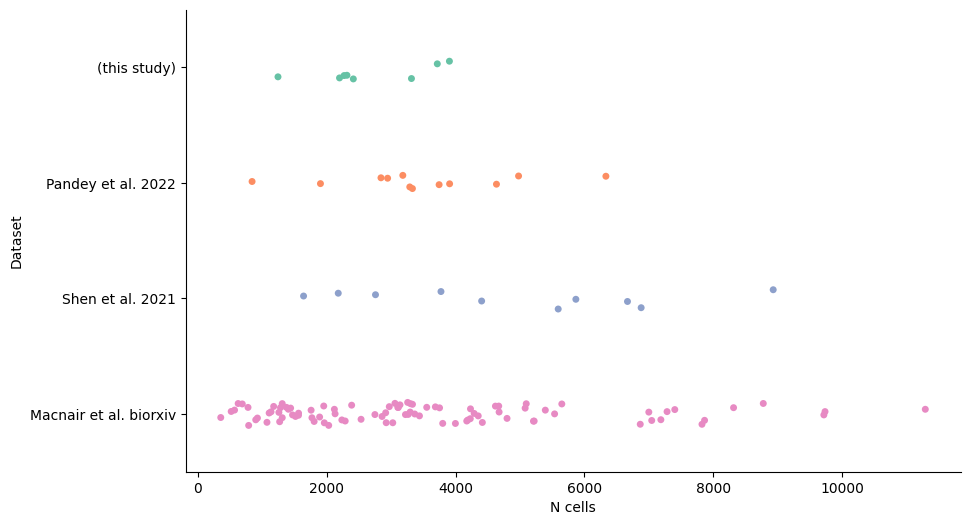

In [43]:
# Define the desired order of datasets
desired_order = ["(this study)", "Pandey et al. 2022", "Shen et al. 2021", "Macnair et al. biorxiv"]

# Set up the color palette
palette = sb.color_palette("Set2", len(cells_per_batch['publication'].unique()))

# Set up the plot
plt.figure(figsize=(10, 6))

# Create the dot plot with different colors for each dataset and reordered y-axis
sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, order=desired_order)

# Set labels
plt.xlabel('N cells')
plt.ylabel('Dataset')

# Remove the title
plt.title('')

# Remove top and right spines
sb.despine()

# Show plot
plt.show()

/tmp/143724.1.gpu-long/ipykernel_2374442/909476037.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cells_per_batch = adata.obs.groupby(['publication', 'batch']).size().reset_index(name='N_cells')
/tmp/143724.1.gpu-long/ipykernel_2374442/909476037.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette,


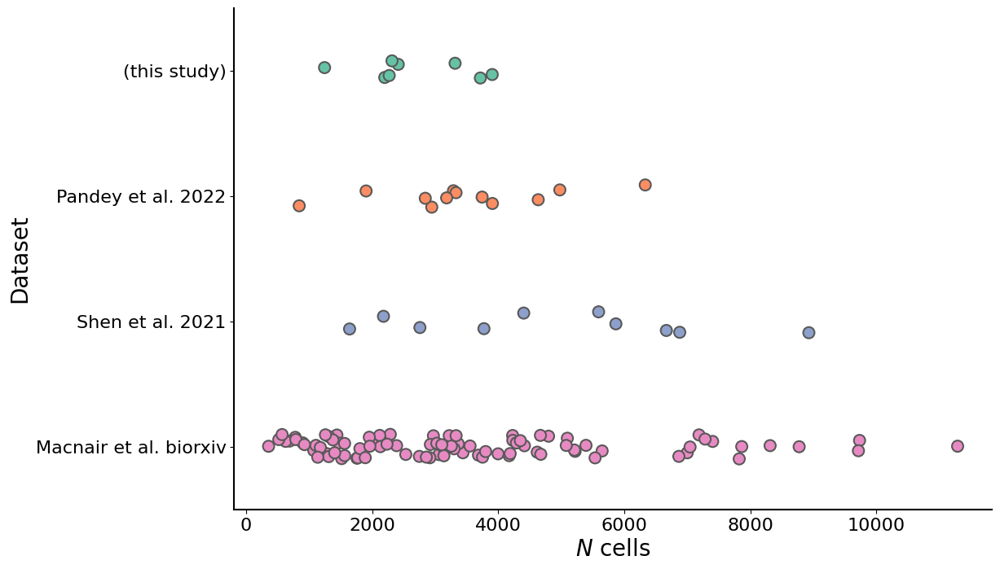

In [88]:
cells_per_batch = adata.obs.groupby(['publication', 'batch']).size().reset_index(name='N_cells')
# Assuming cells_per_batch_filtered contains your data

# Define the desired order of datasets
desired_order = ["(this study)", "Pandey et al. 2022", "Shen et al. 2021", "Macnair et al. biorxiv"]

# Set up the color palette
palette = sb.color_palette("Set2", len(cells_per_batch_filtered['publication'].unique()))

# Set up the plot
plt.figure(figsize=(12, 8))  # Increase figure size

# Create the dot plot with different colors for each dataset and reordered y-axis
sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, 
             order=desired_order,
             size=10, linewidth=1.5)  # Increase dot size and line width

# Set labels
plt.xlabel(r'$\mathit{N}$ cells', fontsize=20)  # Make "N" italic and increase font size
plt.ylabel('Dataset', fontsize=20)  # Increase font size

# Set x-axis color and thickness
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1.5)

# Set y-axis color and thickness
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1.5)

# Remove the title
plt.title('')

# Increase font size for tick labels
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Remove top and right spines
sb.despine()

# Show plot
plt.show()


In [ ]:

# Define the desired order of datasets
desired_order = ["(this study)", "Pandey et al. 2022", "Shen et al. 2021", "Macnair et al. biorxiv"]

# Set up the color palette
palette = sb.color_palette("Set2", len(cells_per_batch_filtered['publication'].unique()))

# Set up the plot
plt.figure(figsize=(12, 8))  # Increase figure size

# Create the dot plot with different colors for each dataset and reordered y-axis
sb.stripplot(x='N_cells', y='publication', data=cells_per_batch_filtered, jitter=True, palette=palette, 
             order=desired_order,
             size=10, linewidth=1.5)  # Increase dot size and line width

# Set labels
plt.xlabel(r'$\mathit{N}$ cells', fontsize=20)  # Make "N" italic and increase font size
plt.ylabel('Dataset', fontsize=20)  # Increase font size

# Set x-axis color and thickness
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['bottom'].set_linewidth(1.5)

# Set y-axis color and thickness
plt.gca().spines['left'].set_color('black')
plt.gca().spines['left'].set_linewidth(1.5)

# Remove the title
plt.title('')

# Increase font size for tick labels
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Remove top and right spines
sb.despine()

# Minimize white space between y-axis values
plt.tight_layout()

# Show plot
plt.show()


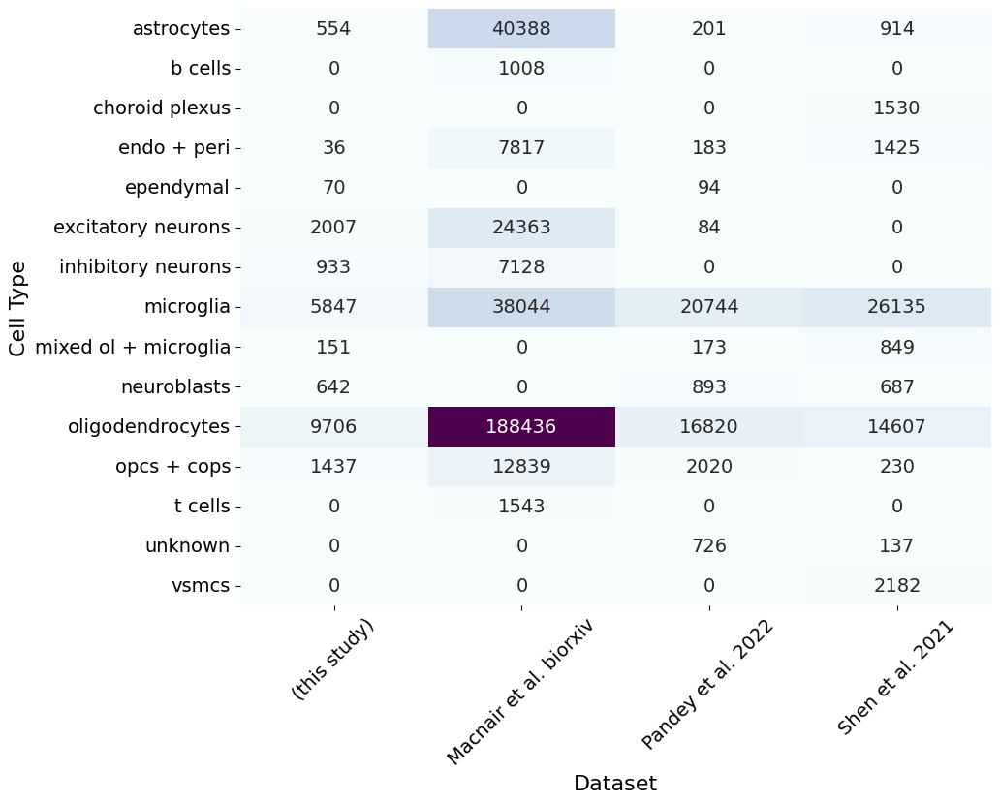

In [79]:
crosstab_df = pd.crosstab(adata.obs.cell_type_eval, adata.obs.publication)

# Set up the heatmap
plt.figure(figsize=(10, 8))  # Adjust figure size if needed
heatmap = sb.heatmap(crosstab_df, cmap="BuPu", annot=True, fmt="d", cbar=False, annot_kws={"size": 14})  # Increase font size of annotations

# Set labels
heatmap.set_xlabel('Dataset', fontsize=16)  # Set x-axis label
heatmap.set_ylabel('Cell Type', fontsize=16)  # Set y-axis label

# Increase font size of row and column labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=14)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)

# Rotate x-axis labels
plt.xticks(rotation=45)  # Rotate labels by 45 degrees

# Show the heatmap
plt.show()

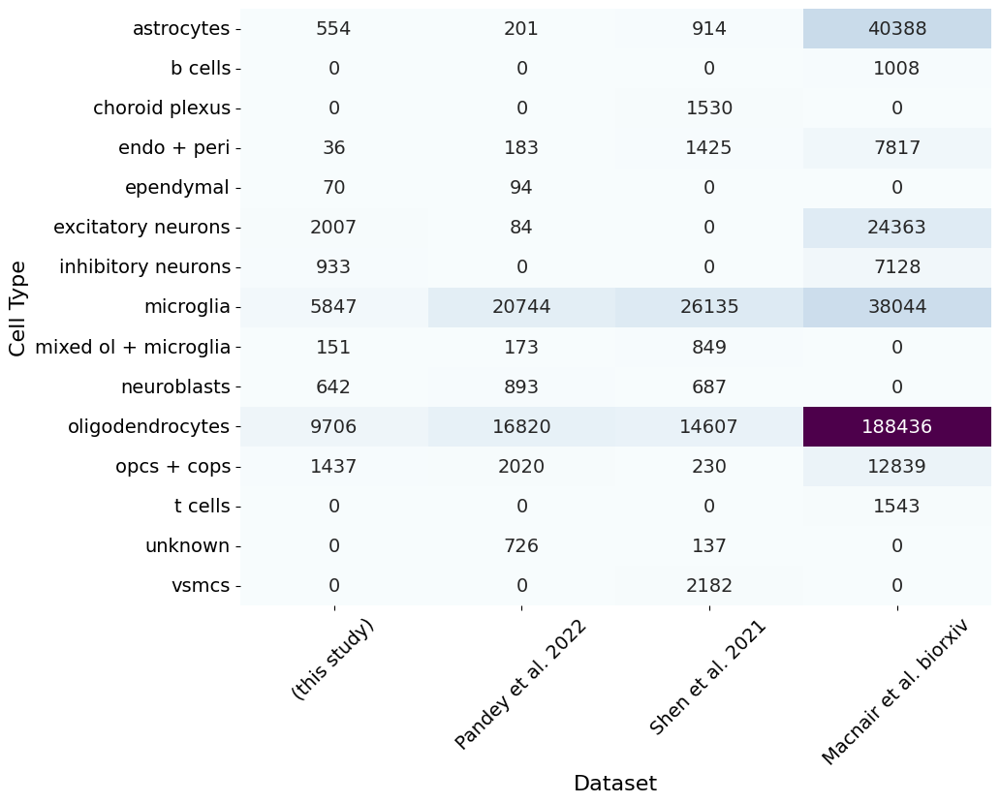

In [81]:
crosstab_df = pd.crosstab(adata.obs.cell_type_eval, adata.obs.publication)

# Define the desired order of datasets
desired_order = ["(this study)", "Pandey et al. 2022", "Shen et al. 2021", "Macnair et al. biorxiv"]

# Reorder columns based on the desired order
crosstab_df = crosstab_df[desired_order]

# Set up the heatmap
plt.figure(figsize=(10, 8))  # Adjust figure size if needed
heatmap = sb.heatmap(crosstab_df, cmap="BuPu", annot=True, fmt="d", cbar=False, annot_kws={"size": 14})  # Increase font size of annotations

# Set labels
heatmap.set_xlabel('Dataset', fontsize=16)  # Set x-axis label
heatmap.set_ylabel('Cell Type', fontsize=16)  # Set y-axis label

# Increase font size of row and column labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=14)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)

# Rotate x-axis labels
plt.xticks(rotation=45)  # Rotate labels by 45 degrees

# Show the heatmap
plt.show()

/tmp/143724.1.gpu-long/ipykernel_2374442/573603974.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cells_per_cell_type = adata.obs.groupby('cell_type_eval').size().reset_index(name='N_cells')


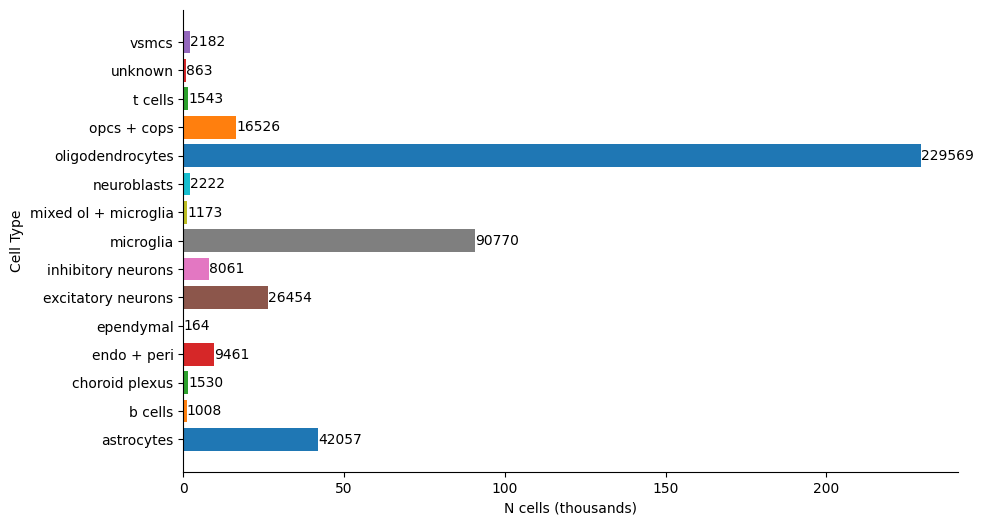

In [47]:
# Aggregate data to calculate the number of cells per cell type
cells_per_cell_type = adata.obs.groupby('cell_type_eval').size().reset_index(name='N_cells')

# Convert N_cells to thousands
cells_per_cell_type['N_cells_thousands'] = cells_per_cell_type['N_cells'] / 1000

# Set up the plot
plt.figure(figsize=(10, 6))

# Define colors for each bar
colors = plt.cm.tab10.colors[:len(cells_per_cell_type)]

# Create the bar chart with custom colors
bars = plt.barh(cells_per_cell_type['cell_type_eval'], cells_per_cell_type['N_cells_thousands'], color=colors)

# Add total cell number as a label at the end of each bar
for bar, cell_count in zip(bars, cells_per_cell_type['N_cells']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{cell_count}', 
             va='center', ha='left', fontsize=10)

# Set x-axis label to N cells (thousands)
plt.xlabel('N cells (thousands)')

# Set y-axis label to Cell type
plt.ylabel('Cell Type')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Show plot
plt.show()

/tmp/143724.1.gpu-long/ipykernel_2374442/501368284.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cells_per_cell_type_organism = adata.obs.groupby(['cell_type_eval', 'organism']).size().reset_index(name='N_cells')


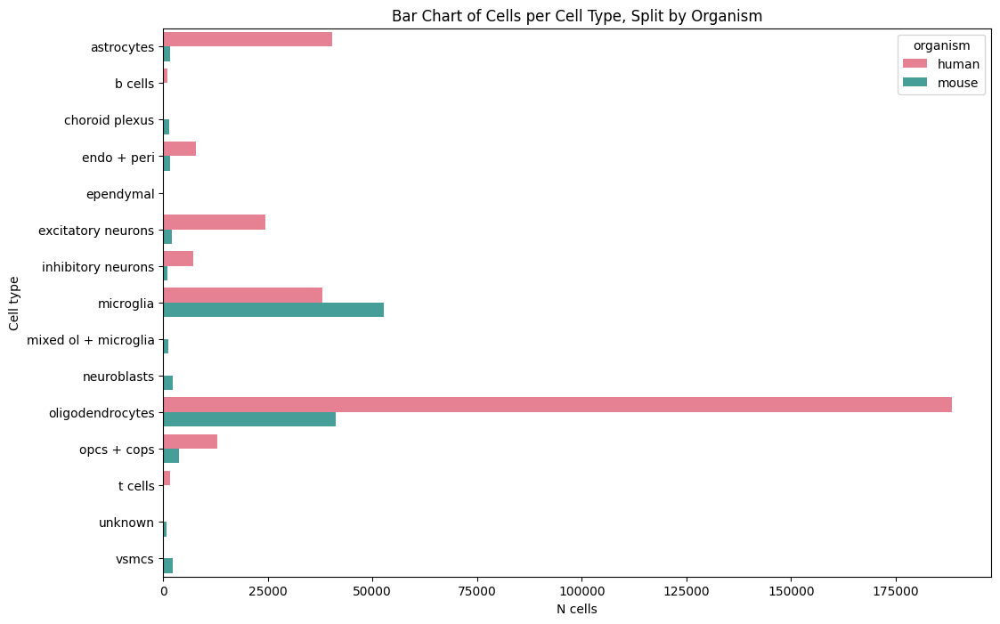

In [50]:
# Aggregate data to calculate the number of cells per cell type and organism
cells_per_cell_type_organism = adata.obs.groupby(['cell_type_eval', 'organism']).size().reset_index(name='N_cells')

# Set up the plot
plt.figure(figsize=(12, 8))

# Create the bar plot
sb.barplot(x='N_cells', y='cell_type_eval', hue='organism', data=cells_per_cell_type_organism, palette='husl')

# Set labels and title
plt.xlabel('N cells')
plt.ylabel('Cell type')
plt.title('Bar Chart of Cells per Cell Type, Split by Organism')

# Show plot
plt.show()


In [4]:
adata.obs["cell_type_eval"].value_counts()

cell_type_eval
oligodendrocytes        229569
microglia                90770
astrocytes               42057
excitatory neurons       26454
opcs + cops              16526
endo + peri               9461
inhibitory neurons        8061
neuroblasts               2222
vsmcs                     2182
t cells                   1543
choroid plexus            1530
mixed ol + microglia      1173
b cells                   1008
unknown                    863
ependymal                  164
Name: count, dtype: int64

In [6]:
desired_cell_types = ['oligodendrocytes', 'opcs + cops']
adata_ol = adata[adata.obs['cell_type_eval'].isin(desired_cell_types)].copy()
sc.pp.filter_genes(adata_ol, min_cells=1)
adata_ol

AnnData object with n_obs × n_vars = 246095 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name', 'n_cells'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_col

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seei

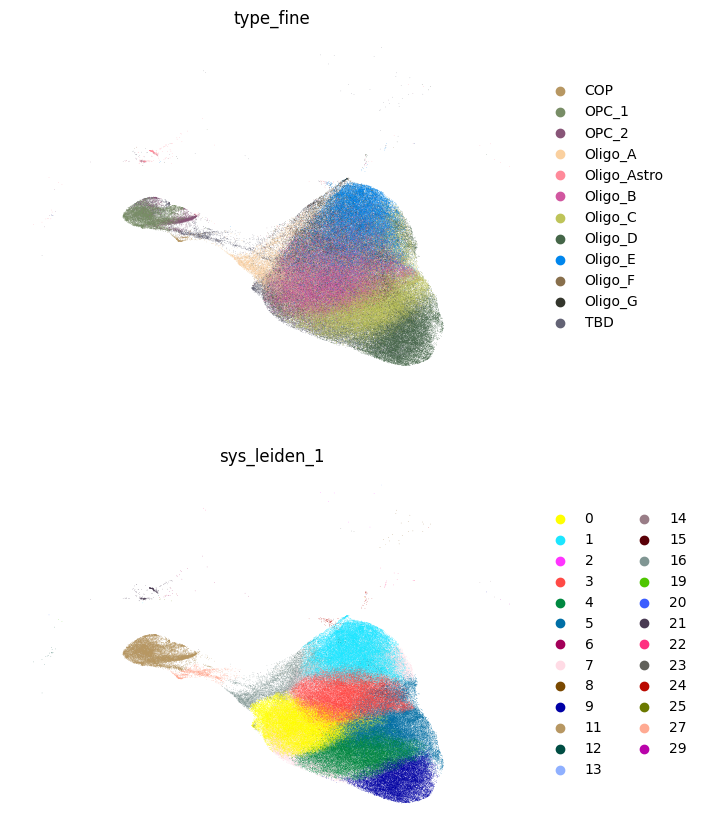

In [8]:
sc.pl.embedding(
    adata_ol,
    basis='X_umap',
    color=["type_fine", "sys_leiden_1"],
    frameon=False,
    ncols=1,
)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Pa

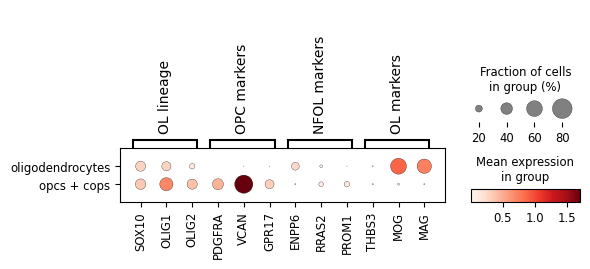

In [11]:
genes_to_plot = ['SOX10', 'OLIG1', 'OLIG2', 'PDGFRA', 'VCAN', 'GPR17', 'ENPP6',
                 'RRAS2', 'PROM1', 'THBS3', 'MOG', 'MAG']

marker_genes = {
    'OL lineage': ['SOX10', 'OLIG1', 'OLIG2'],
    'OPC markers': ['PDGFRA', 'PTPRZ1', 'VCAN'],
    'NFOL markers': ['BMP4', 'GPR17', 'BCAS1', 'RRAS2', 'PROM1', 'ENPP6'],
    'OL markers': ['PLP1', 'MOG', 'MAG']
}

sc.pl.dotplot(
    adata_ol,
    groupby="cell_type_eval",
    var_names=genes_to_plot,
    use_raw=True,
    log=True,
    dendrogram=True,
    var_group_positions=[(0, 2), (3, 5), (6, 8), (9, 11)],  # Adjust based on the number of genes in each category
    var_group_labels=list(marker_genes.keys()),  # Use marker gene category names as labels
    show=True
)

categories: COP, OPC_1, OPC_2, etc.
var_group_labels: OL lineage, OPC markers, NFOL markers, etc.


/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Pa

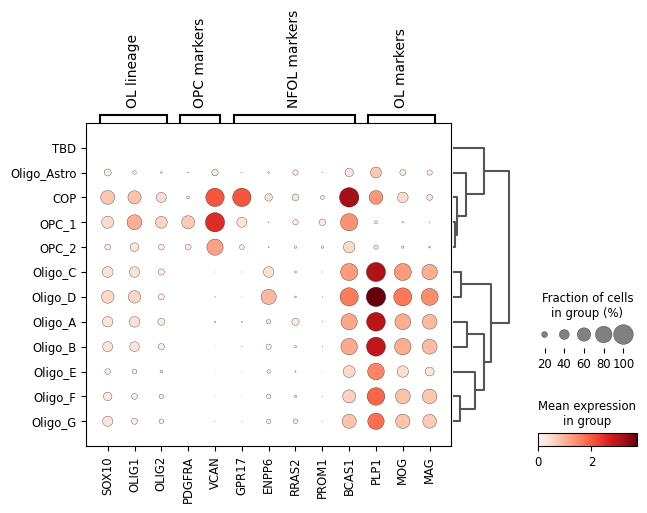

In [13]:
genes_to_plot = ['SOX10', 'OLIG1', 'OLIG2', 'PDGFRA', 'VCAN', 'GPR17', 'ENPP6',
                 'RRAS2', 'PROM1', 'BCAS1', 'PLP1', 'MOG', 'MAG']

marker_genes = {
    'OL lineage': ['SOX10', 'OLIG1', 'OLIG2'],
    'OPC markers': ['PDGFRA', 'PTPRZ1', 'VCAN'],
    'NFOL markers': ['BMP4', 'GPR17', 'BCAS1', 'RRAS2', 'PROM1', 'ENPP6'],
    'OL markers': ['PLP1', 'MOG', 'MAG']
}

sc.pl.dotplot(
    adata_ol,
    groupby="type_fine",
    var_names=genes_to_plot,
    use_raw=True,
    log=True,
    dendrogram=True,
    var_group_positions=[(0, 2), (3, 4), (5, 9), (10, 12)],  # Adjust based on the number of genes in each category
    var_group_labels=list(marker_genes.keys()),  # Use marker gene category names as labels
    show=True
)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seei

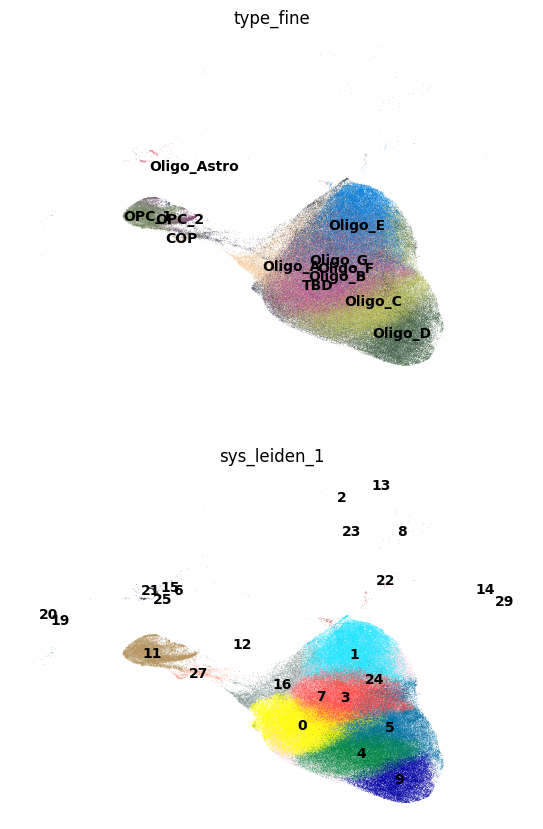

In [15]:
sc.pl.embedding(
    adata_ol,
    basis='X_umap',
    color=["type_fine", "sys_leiden_1"],
    frameon=False,
    ncols=1,
    legend_loc='on data'
)

/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/afs/crc.nd.edu/user/e/eaboelno/miniforge3/envs/sysVI/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seei

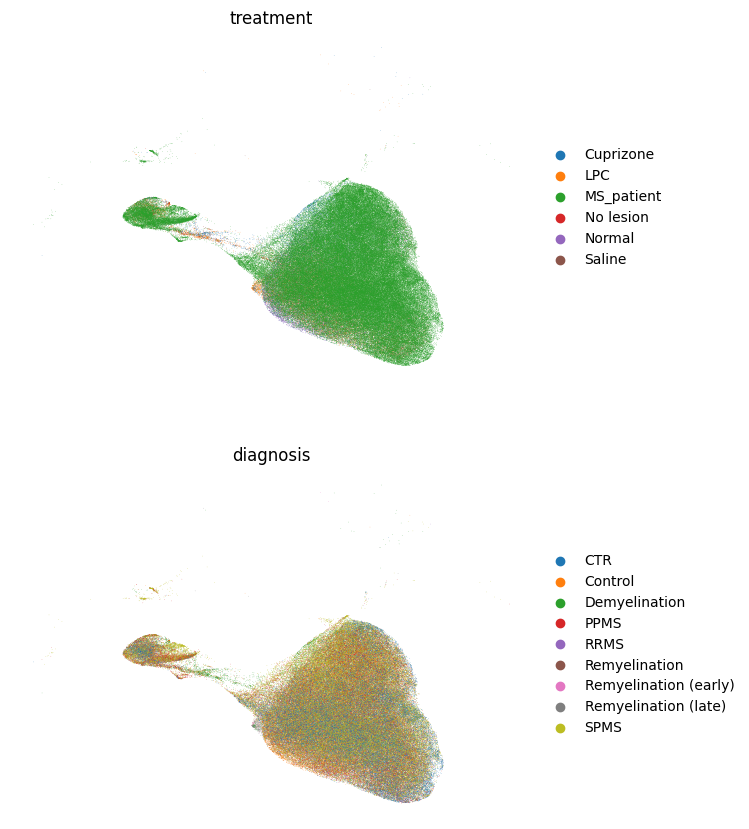

In [17]:
sc.pl.embedding(
    adata_ol,
    basis='X_umap',
    color=["treatment", "diagnosis"],
    frameon=False,
    ncols=1
)

In [23]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_colors', 'sys_

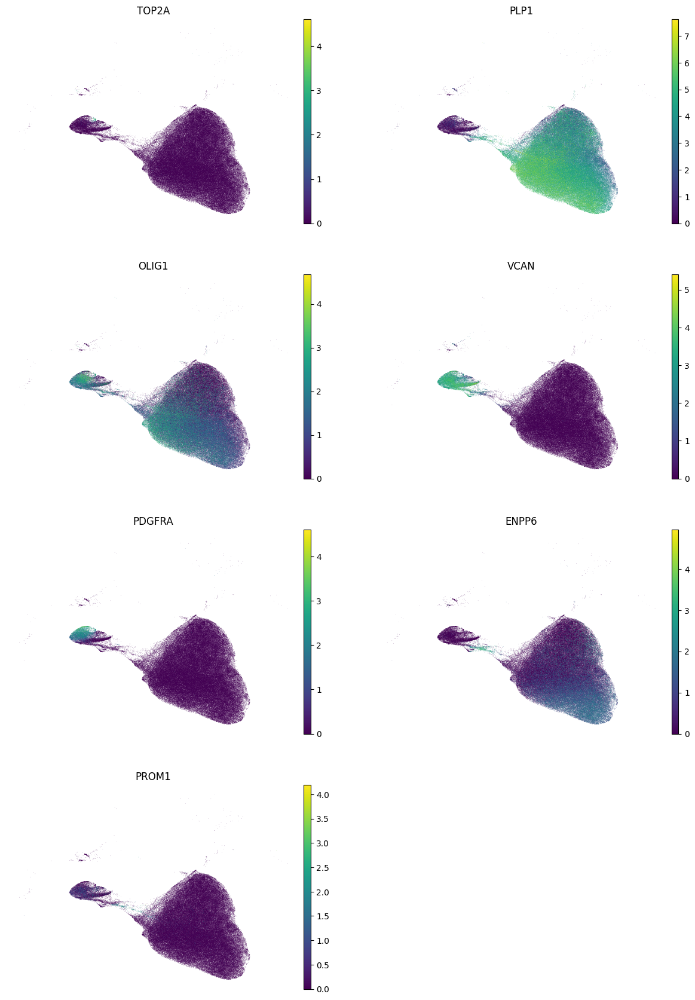

In [27]:
sc.pl.umap(adata_ol, 
           color=['TOP2A','PLP1', 'OLIG1', 'VCAN', 'PDGFRA', 'ENPP6', 'PROM1'], 
           legend_loc = "on data", 
           layer = 'log1p_norm',
           frameon=False, 
           ncols=2
          )

# Re-compute the UMAP

In [100]:
from sklearn.preprocessing import LabelEncoder

In [89]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_colors', 'sys_

In [90]:
sc.tl.umap(adata, min_dist=0.2, n_components=3)

In [91]:
color = dict(zip(range(0,15), plt.cm.tab20(range(0,15)))) #length of cell_type_eval

In [93]:
adata

AnnData object with n_obs × n_vars = 433583 × 2904
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'sys_leiden_0.5', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2'
    var: 'human_gene_id', 'mouse_gene_id', 'mouse_gene_name', 'human_gene_name'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'cell_type_eval_colors', 'covariate_categ_orders', 'covariate_key_orders', 'layer_information', 'leiden', 'neighbors', 'publication_colors', 'sys_leiden_1_colors', 'sys_

In [101]:
unique_cell_types = adata.obs['cell_type_eval'].unique()
print("Unique Cell Types:")
print(unique_cell_types)

Unique Cell Types:

['excitatory neurons', 'inhibitory neurons', 'oligodendrocytes', 'astrocytes', 'microglia', ..., 'unknown', 
'choroid plexus', 'vsmcs', 't cells', 'b cells']
Length: 15
Categories (15, object): ['astrocytes', 'b cells', 'choroid plexus', 'endo + peri', ..., 'opcs + cops', 't cells', 
'unknown', 'vsmcs']

In [95]:
umap = adata.obsm['X_umap']

In [99]:
umap

array([[-1.3295585 ,  1.3356452 , -0.0565336 ],
       [-2.5282445 ,  3.0542402 ,  2.9831111 ],
       [-0.58000314,  4.722775  , -1.4376509 ],
       ...,
       [10.346327  , 10.768317  ,  0.7862222 ],
       [11.218347  , -2.0566707 ,  3.2815144 ],
       [ 8.697527  , -0.335497  , -2.5738842 ]], dtype=float32)

/tmp/143724.1.gpu-long/ipykernel_2374442/3279773986.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],


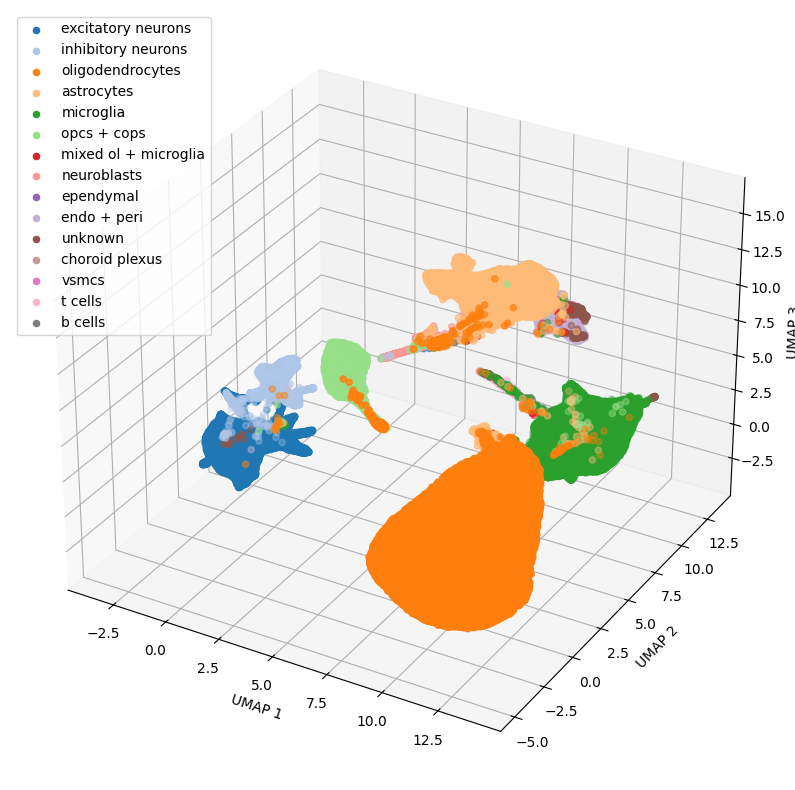

In [103]:
color = dict(zip(adata.obs['cell_type_eval'].unique(), plt.cm.tab20(range(len(adata.obs['cell_type_eval'].unique())))))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

# Iterate over unique cell types and plot each one separately with its respective color
for cell_type in adata.obs['cell_type_eval'].unique():
    cell_type_umap = umap[adata.obs['cell_type_eval'] == cell_type]
    ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],
               c=color[cell_type], label=cell_type)

# Set labels and legend
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_zlabel('UMAP 3')
ax.legend()

plt.show()

/tmp/143724.1.gpu-long/ipykernel_2374442/2882726553.py:9: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],


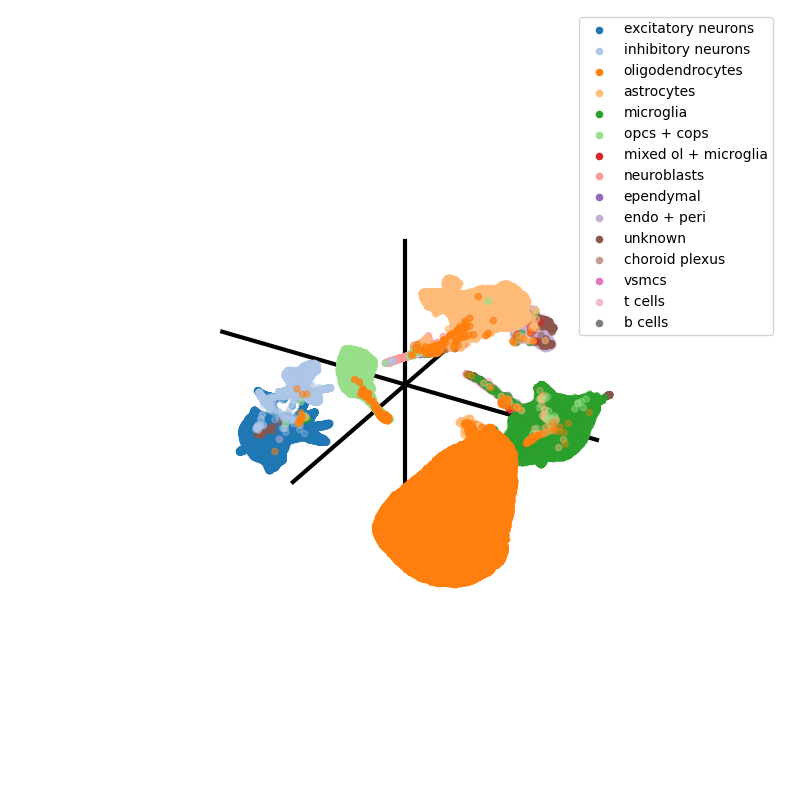

In [104]:
color = dict(zip(adata.obs['cell_type_eval'].unique(), plt.cm.tab20(range(len(adata.obs['cell_type_eval'].unique())))))

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

# Iterate over unique cell types and plot each one separately with its respective color
for cell_type in adata.obs['cell_type_eval'].unique():
    cell_type_umap = umap[adata.obs['cell_type_eval'] == cell_type]
    ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],
               c=color[cell_type], label=cell_type)

# Set labels and legend
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_zlabel('UMAP 3')
ax.legend()

# Get centers
x_center= (umap[:,0].max() + umap[:,0].min())/2
y_center= (umap[:,1].max() + umap[:,1].min())/2
z_center= (umap[:,2].max() + umap[:,2].min())/2

#Add lines
ax.plot([x_center,x_center], [y_center,y_center], [umap[:,2].min() - 2, umap[:,2].max() +2], c = 'k', lw = 3)
ax.plot([x_center,x_center], [umap[:,1].min() - 2, umap[:,1].max() +2], [z_center,z_center], c = 'k', lw = 3)
ax.plot([umap[:,0].min() - 2, umap[:,0].max() +2], [y_center,y_center], [z_center,z_center], c = 'k', lw = 3)

ax.axis('off')

plt.show()

In [105]:
!mkdir plot3d

/tmp/143724.1.gpu-long/ipykernel_2374442/669391141.py:10: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


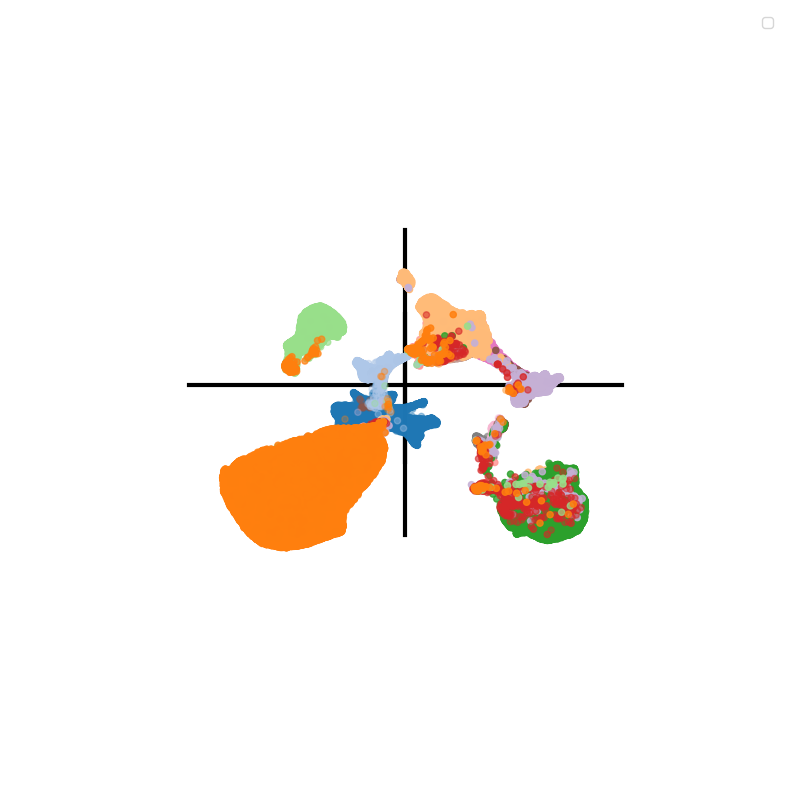

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


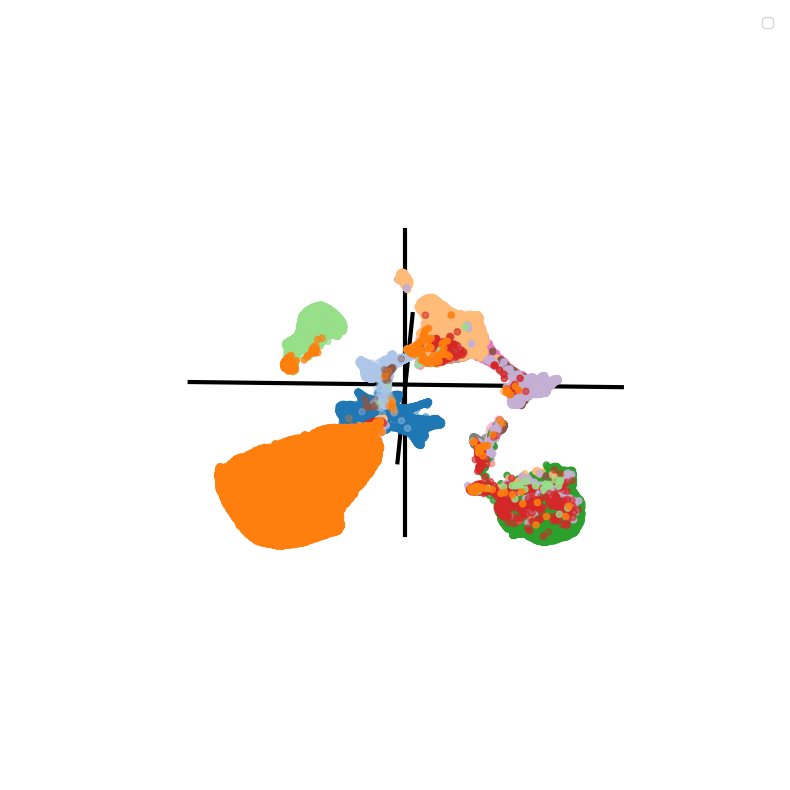

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


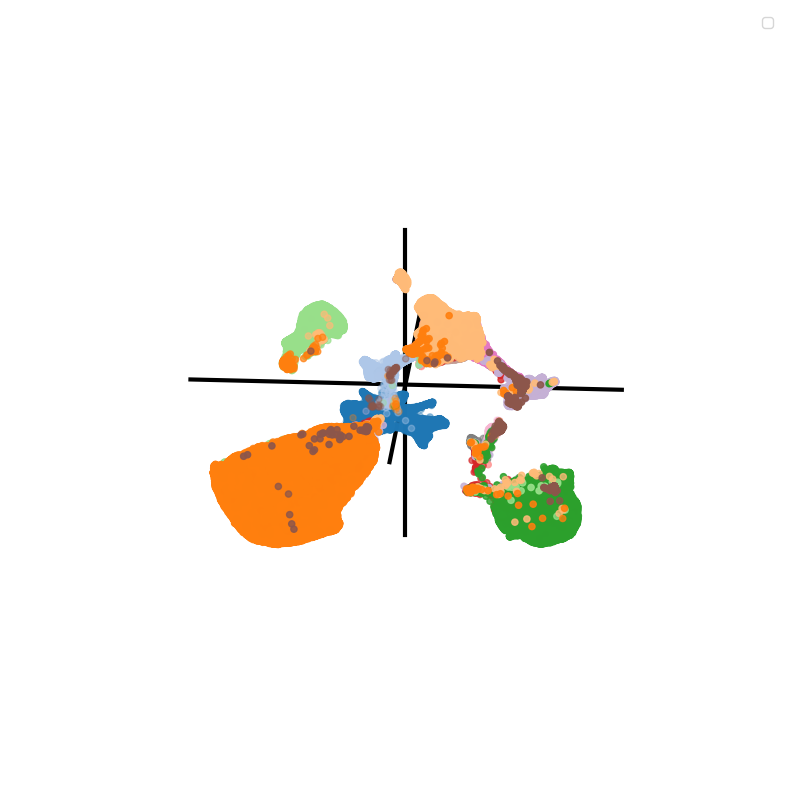

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


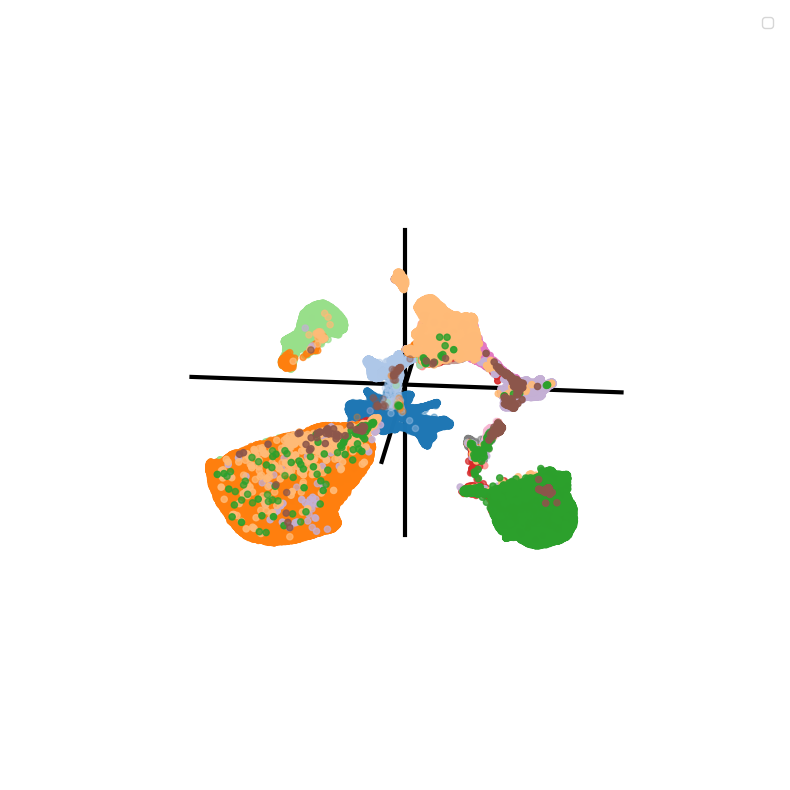

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


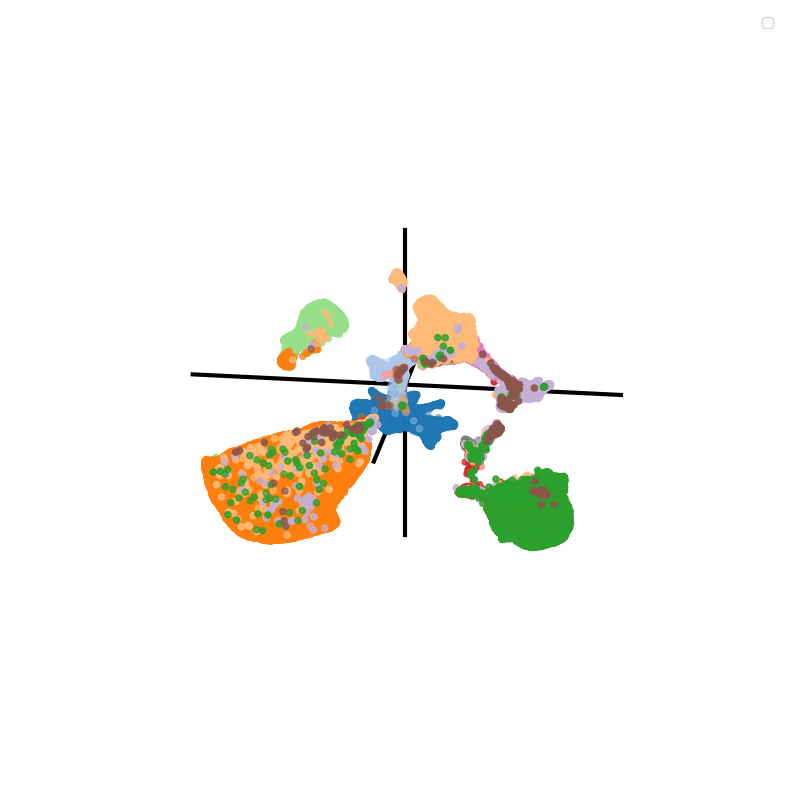

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


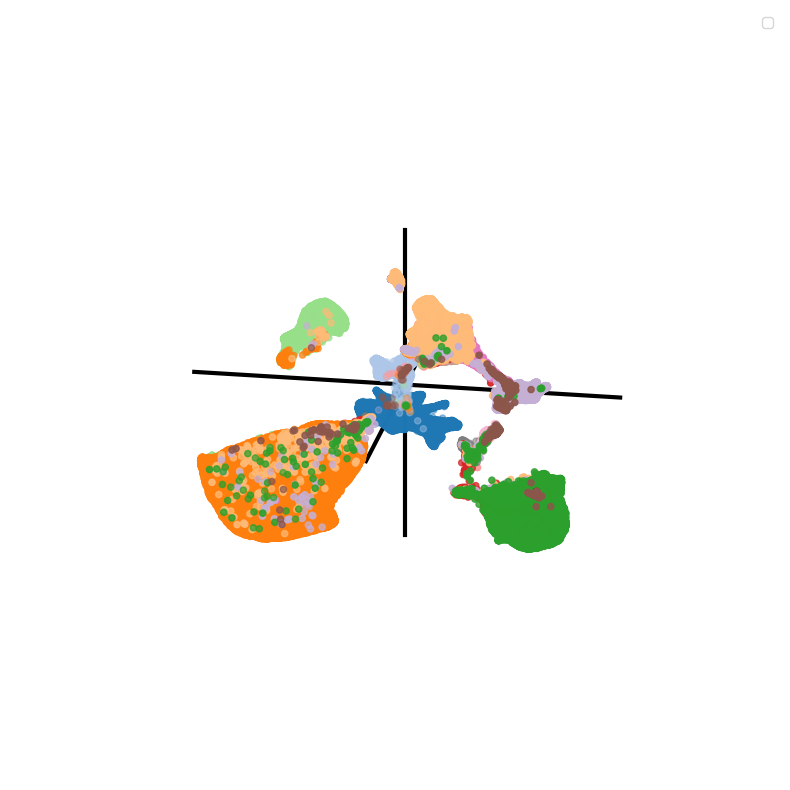

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


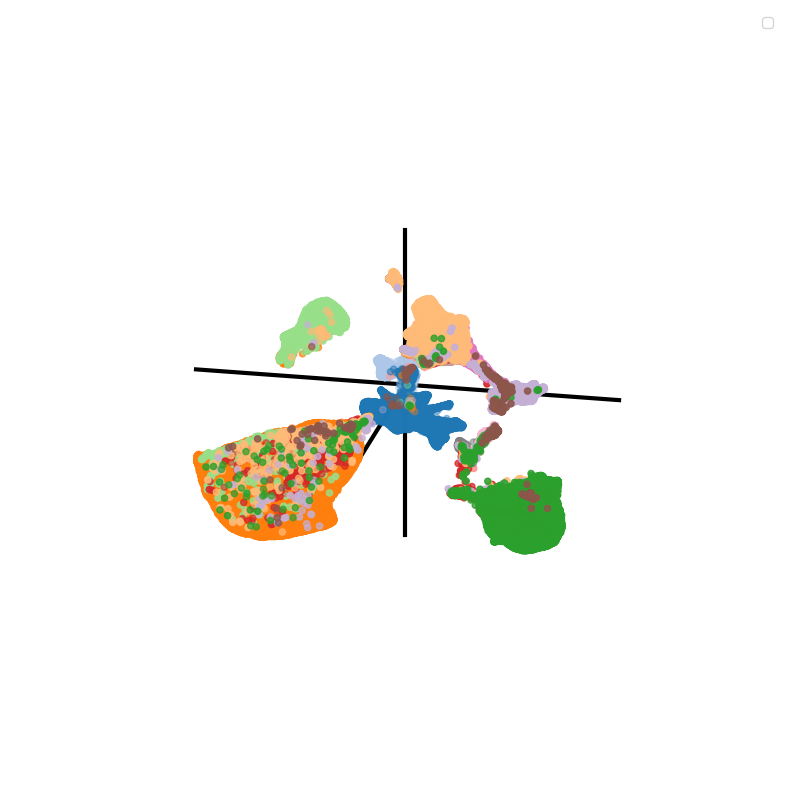

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


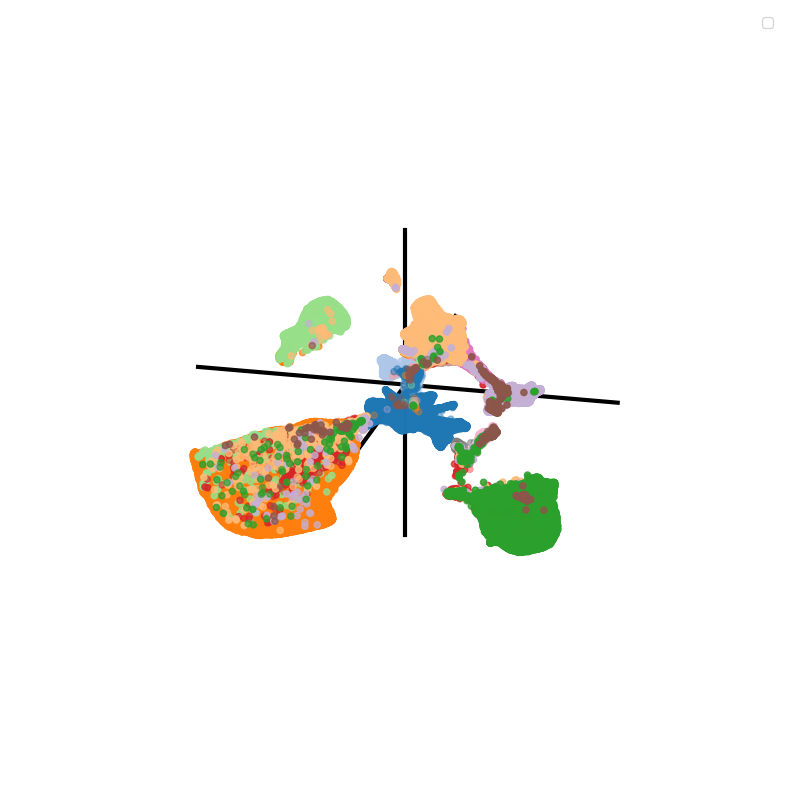

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


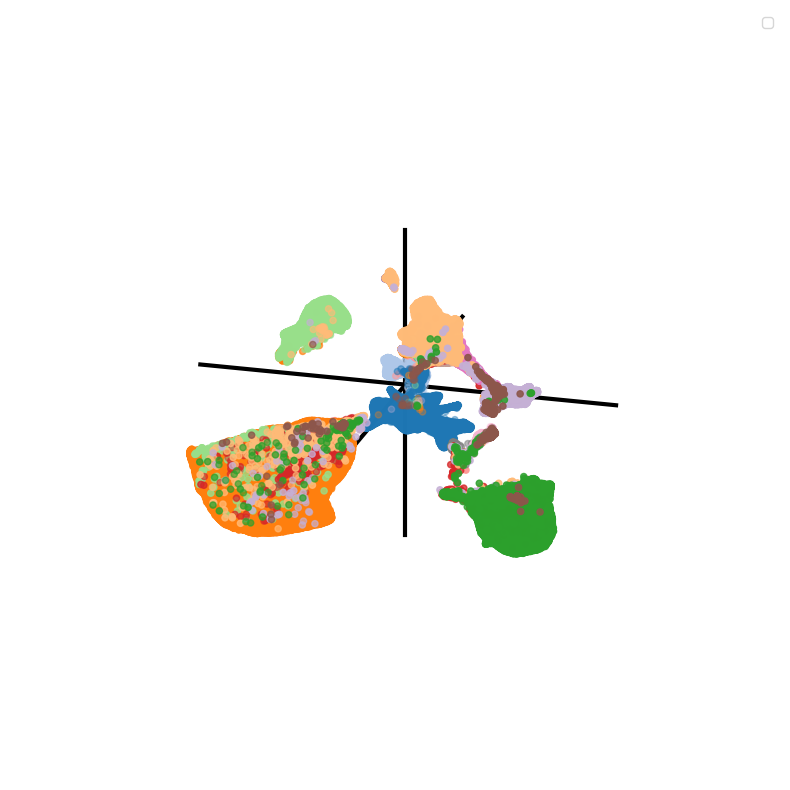

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


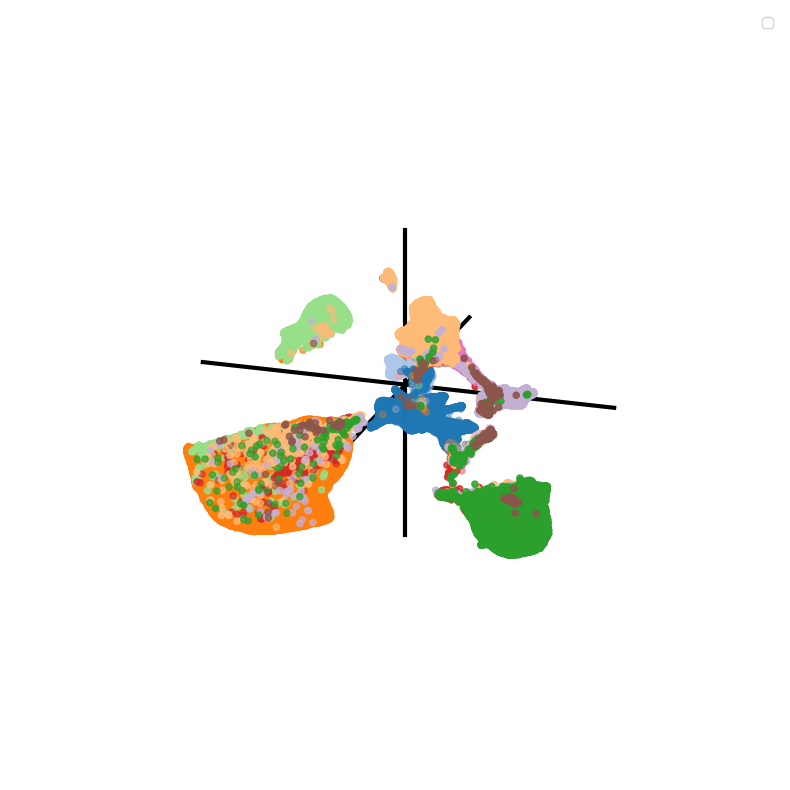

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


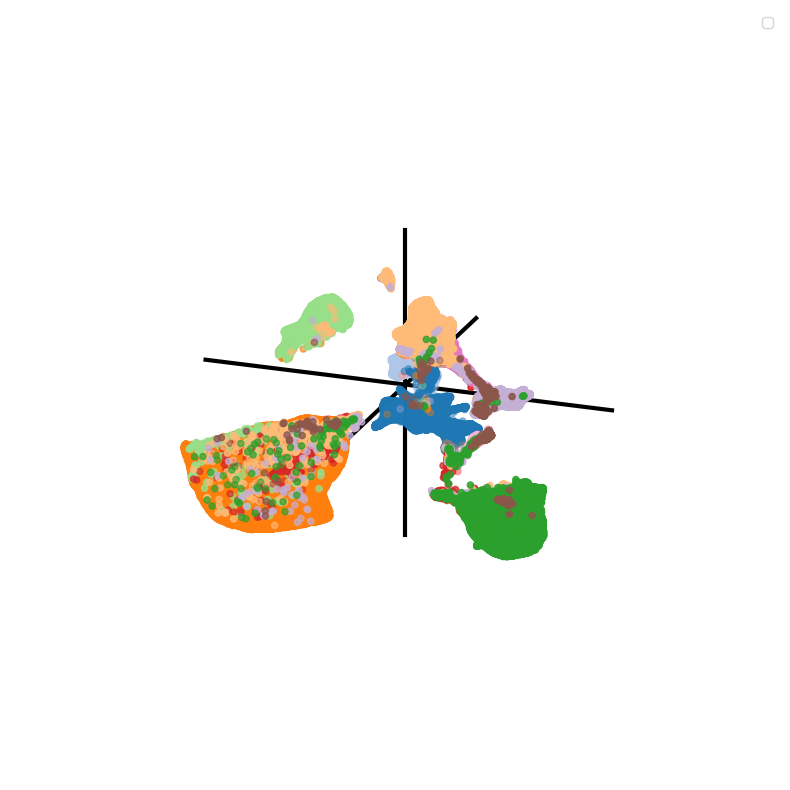

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


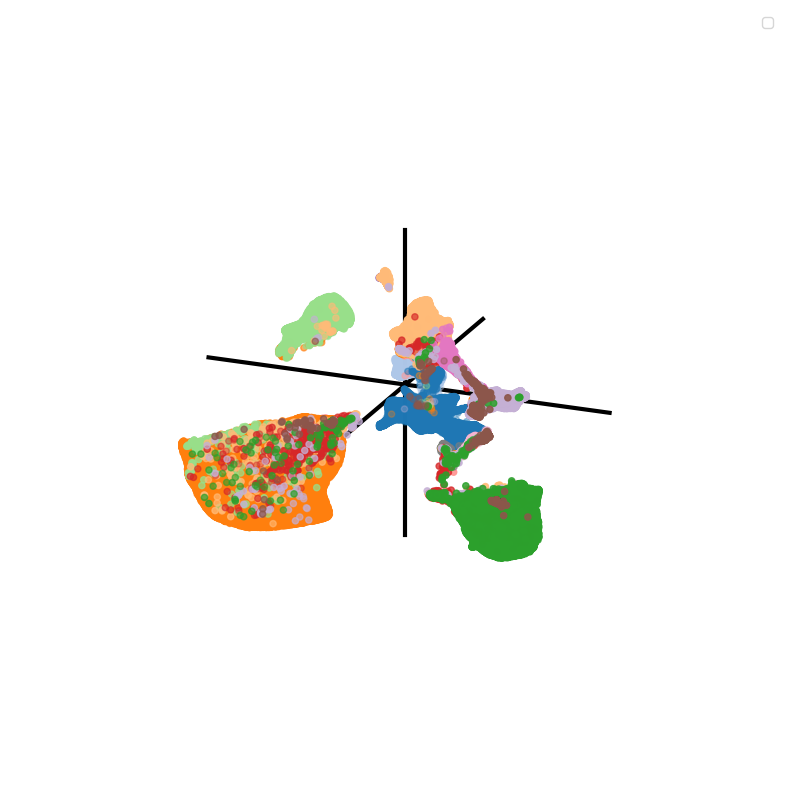

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


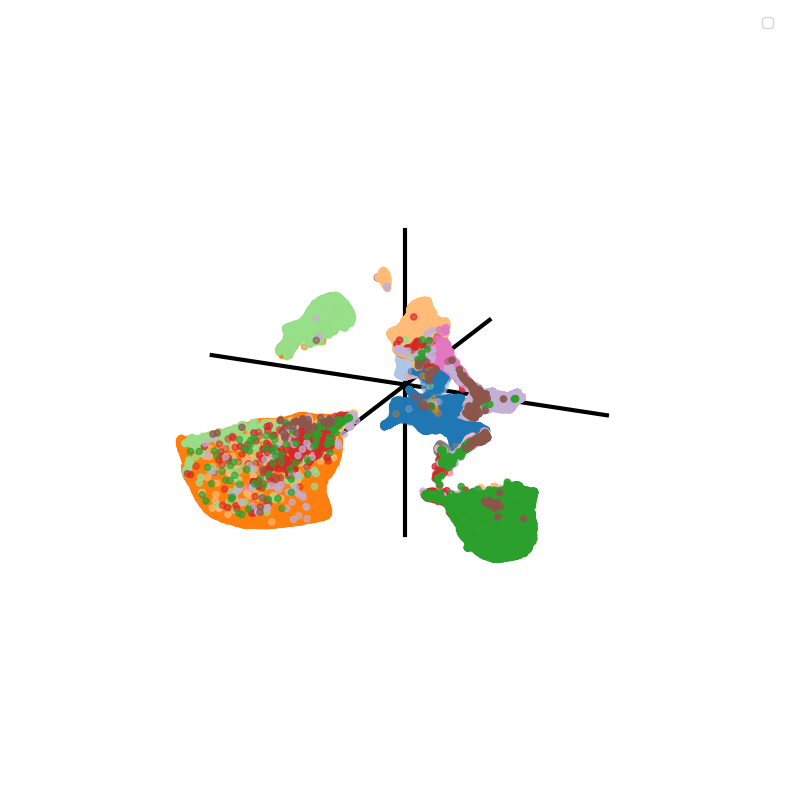

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


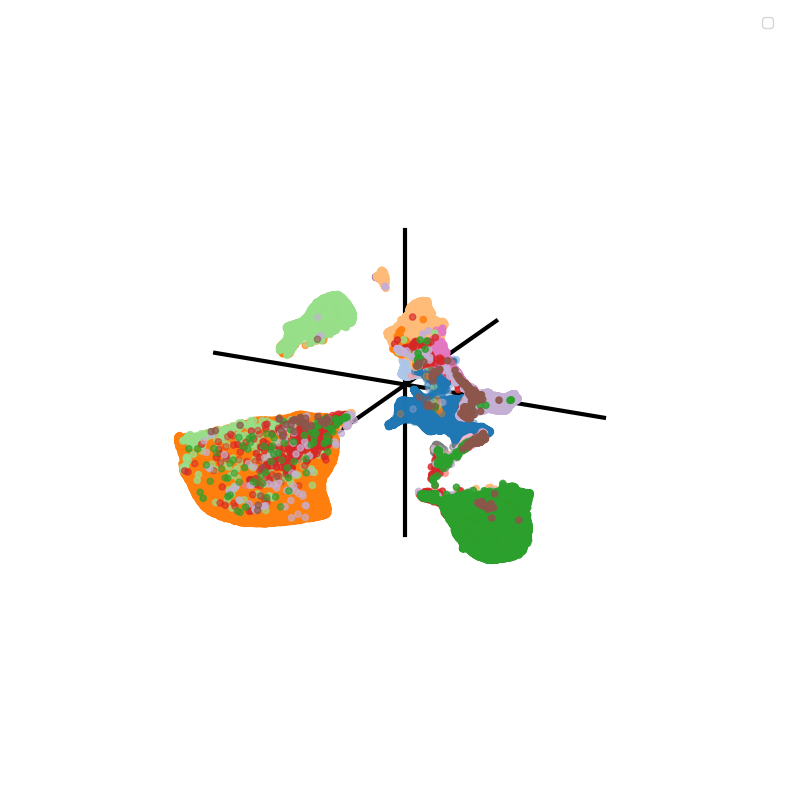

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


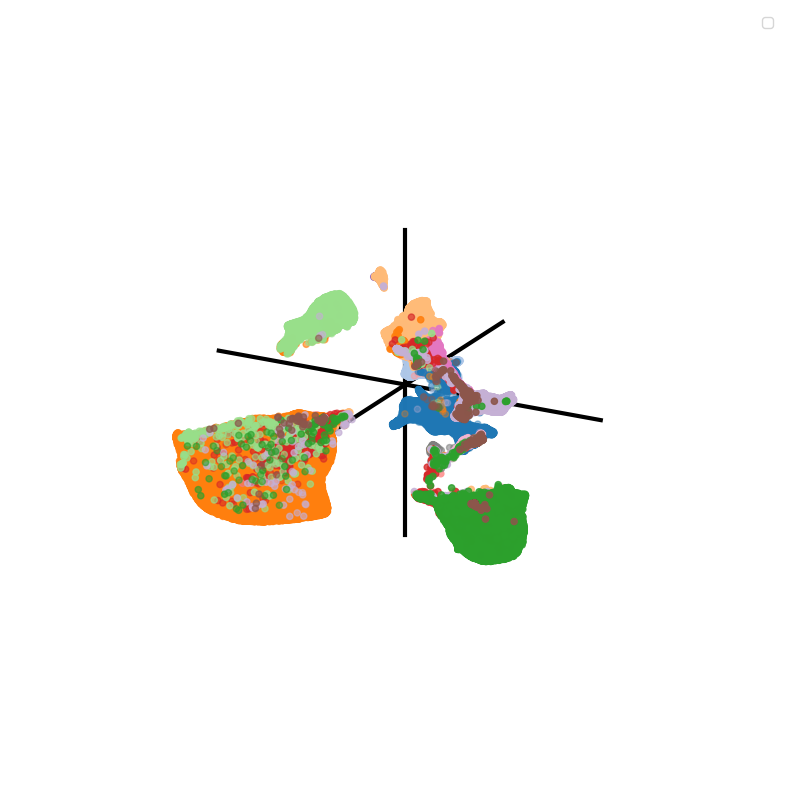

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


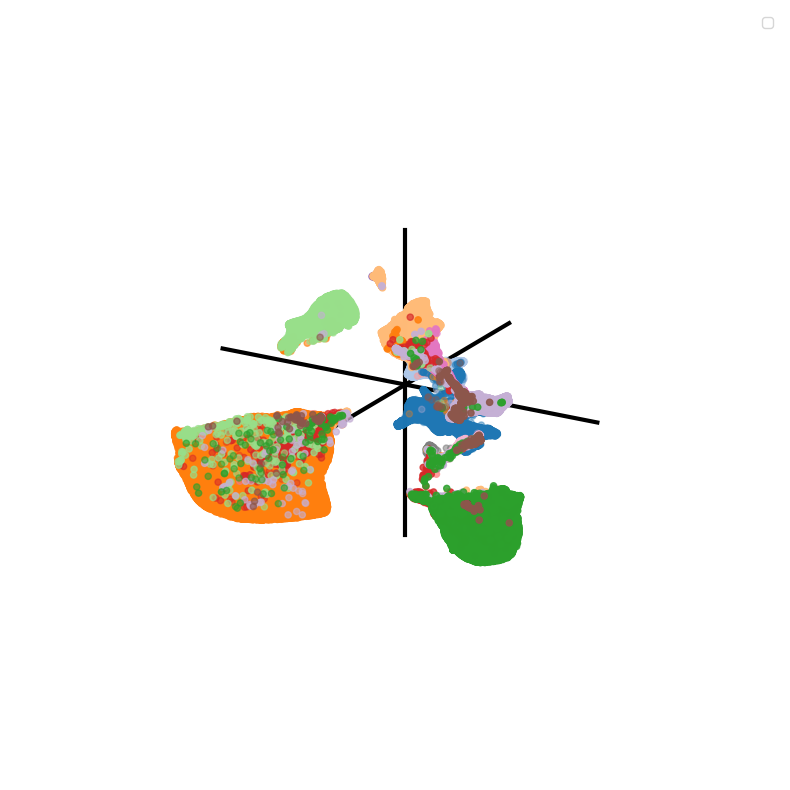

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


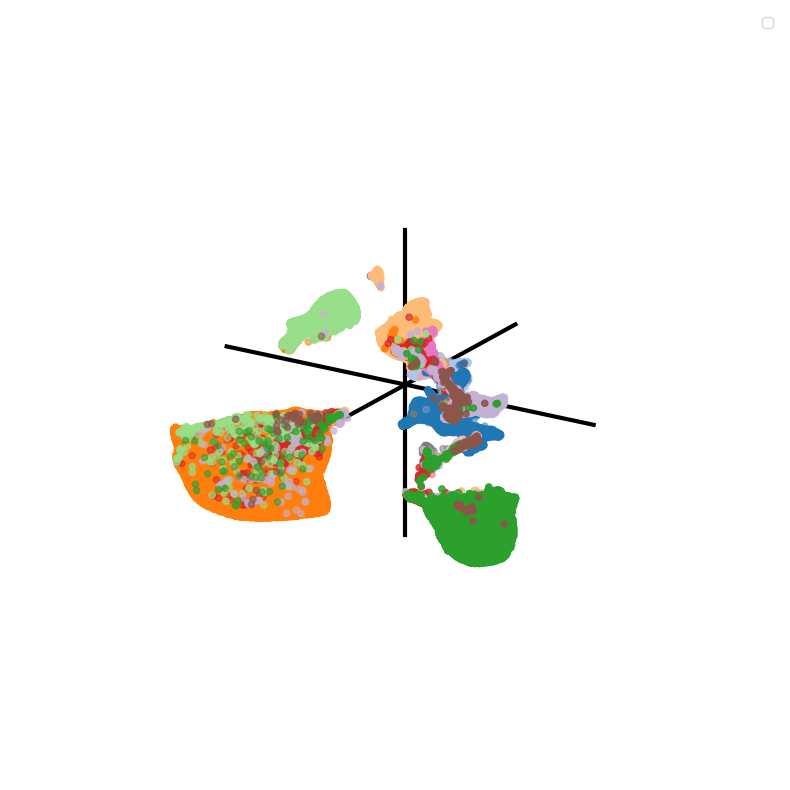

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


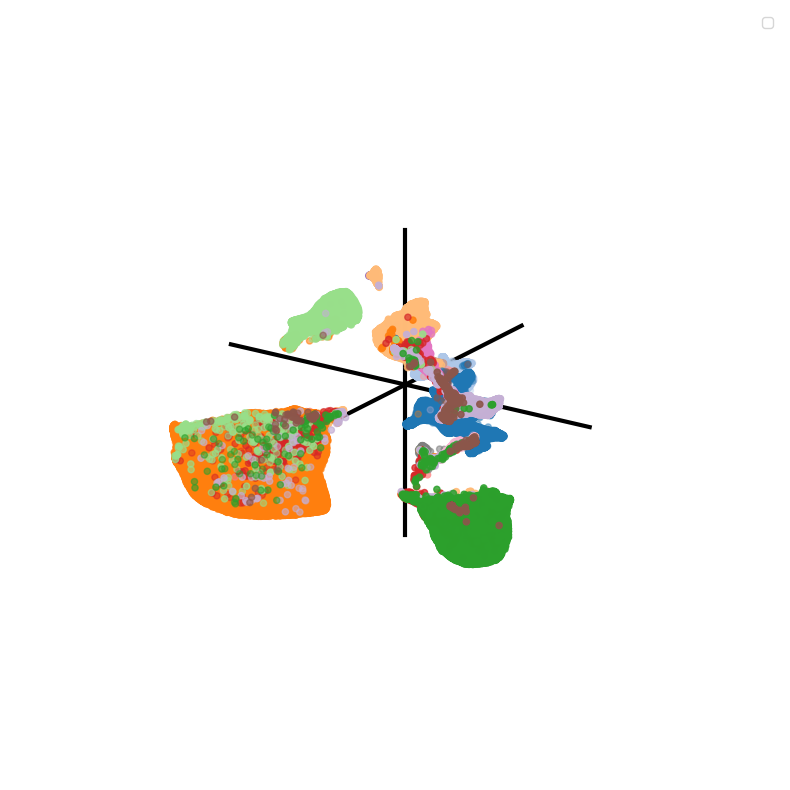

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


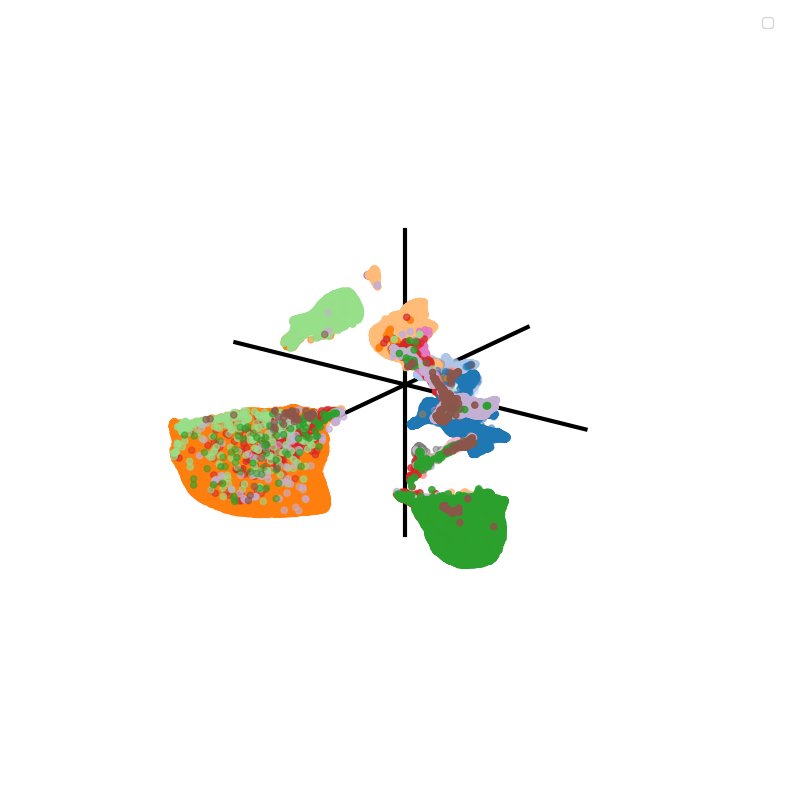

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


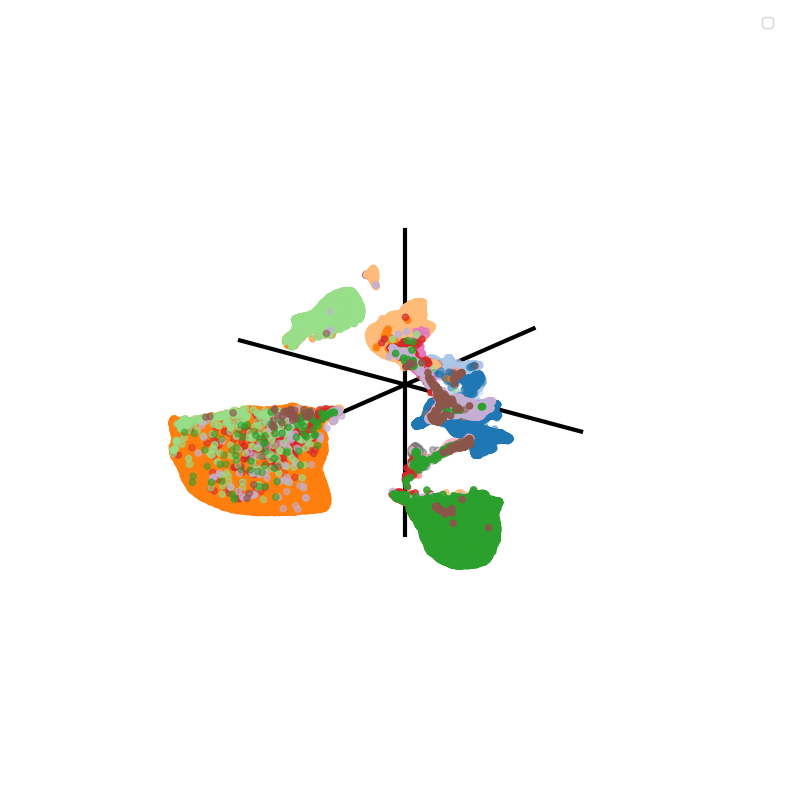

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


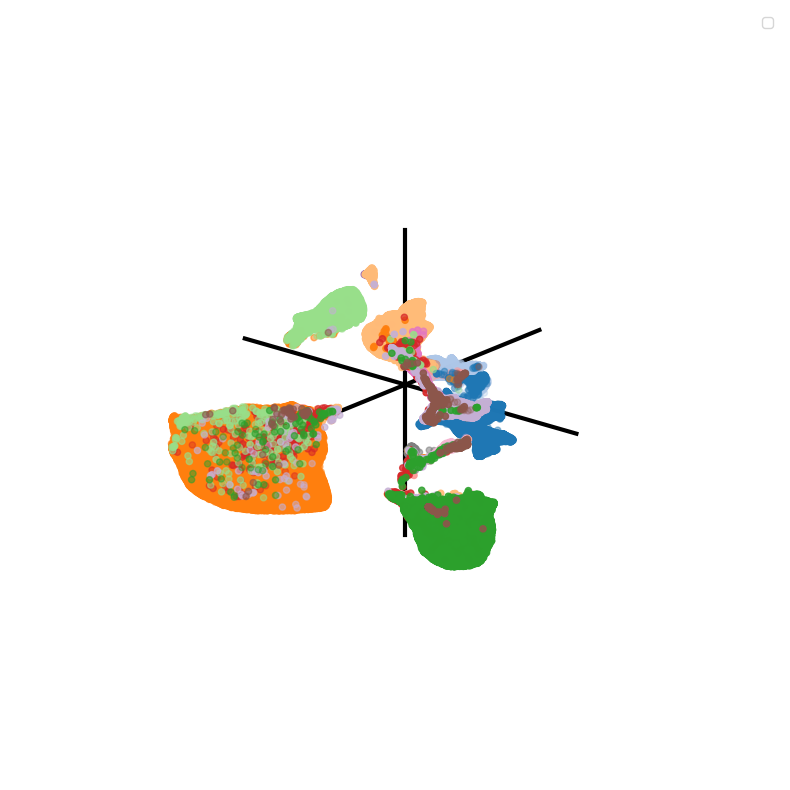

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


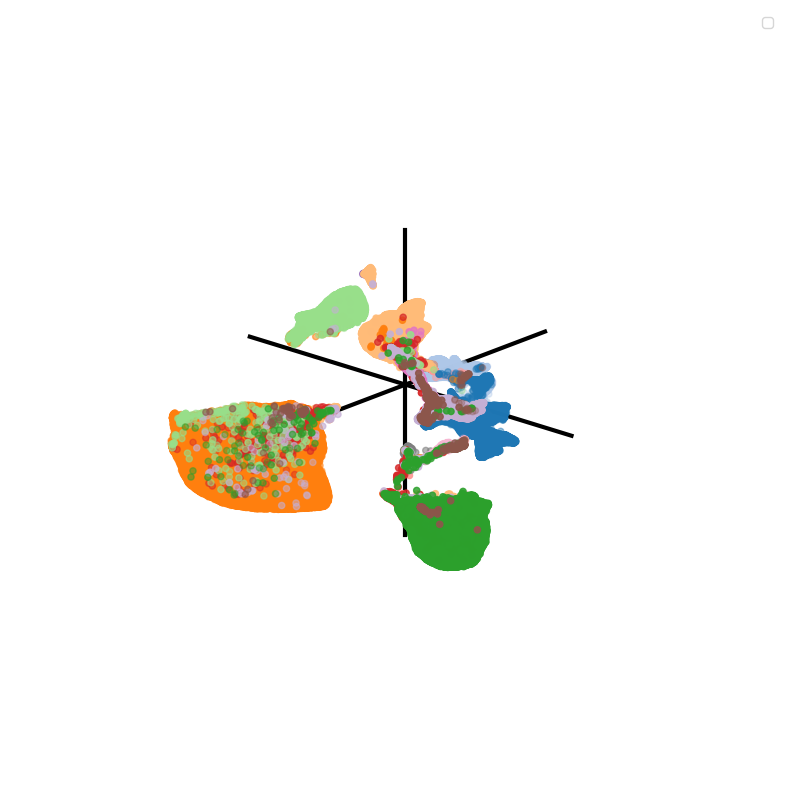

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


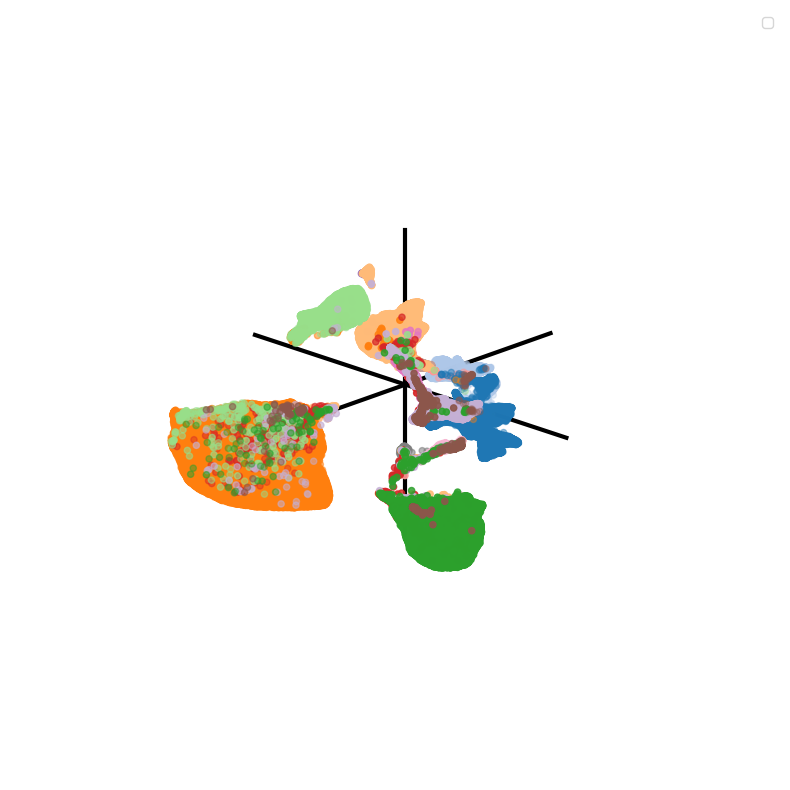

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


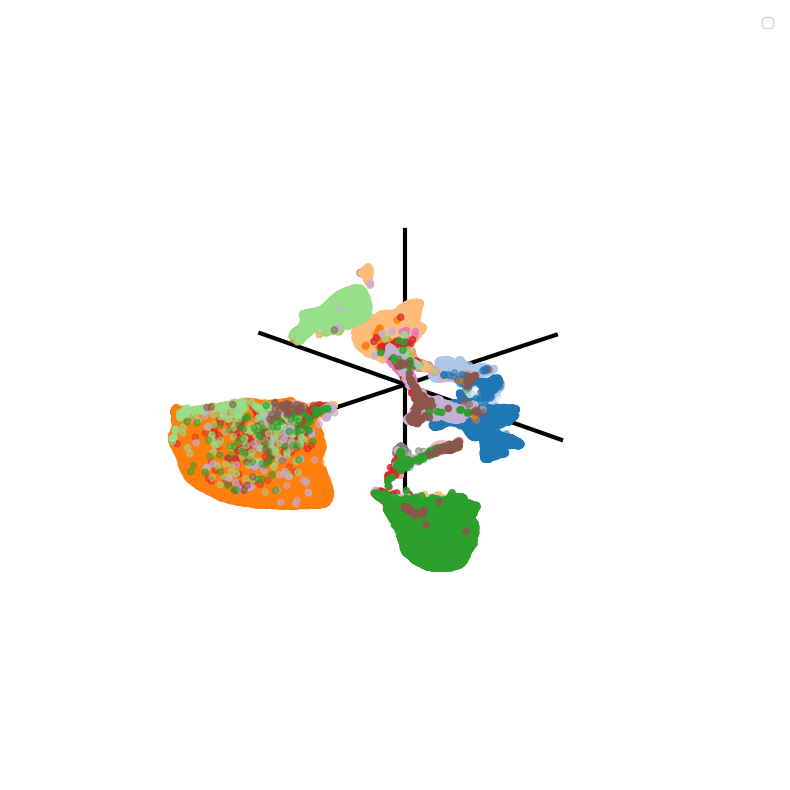

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


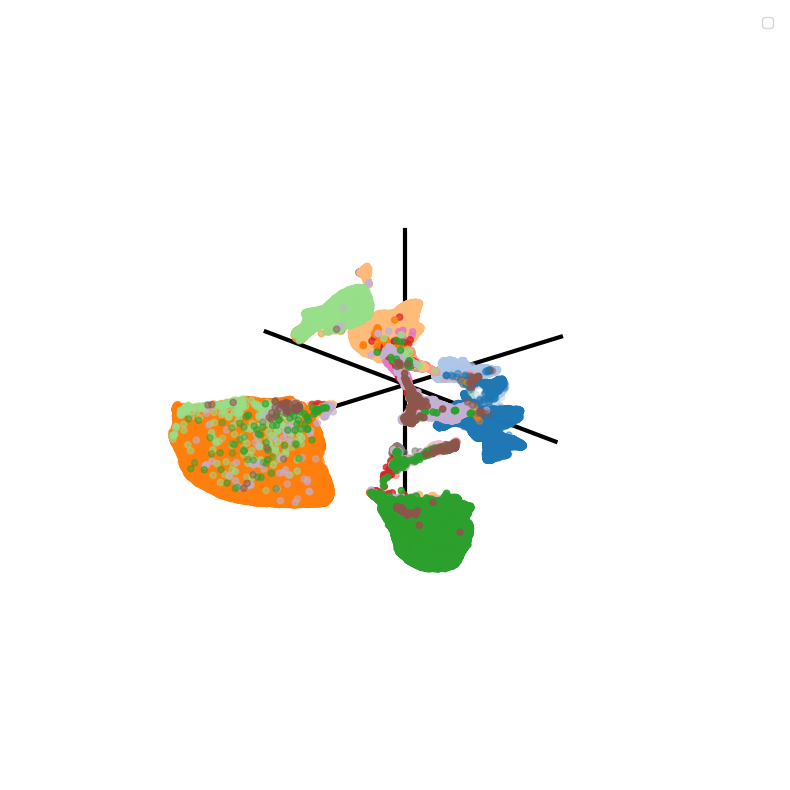

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


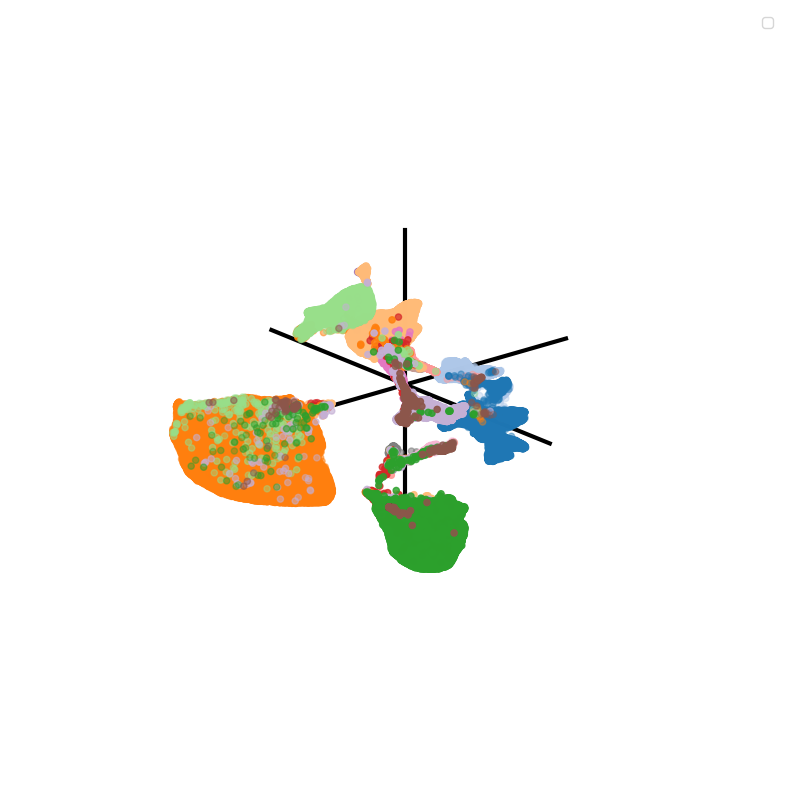

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


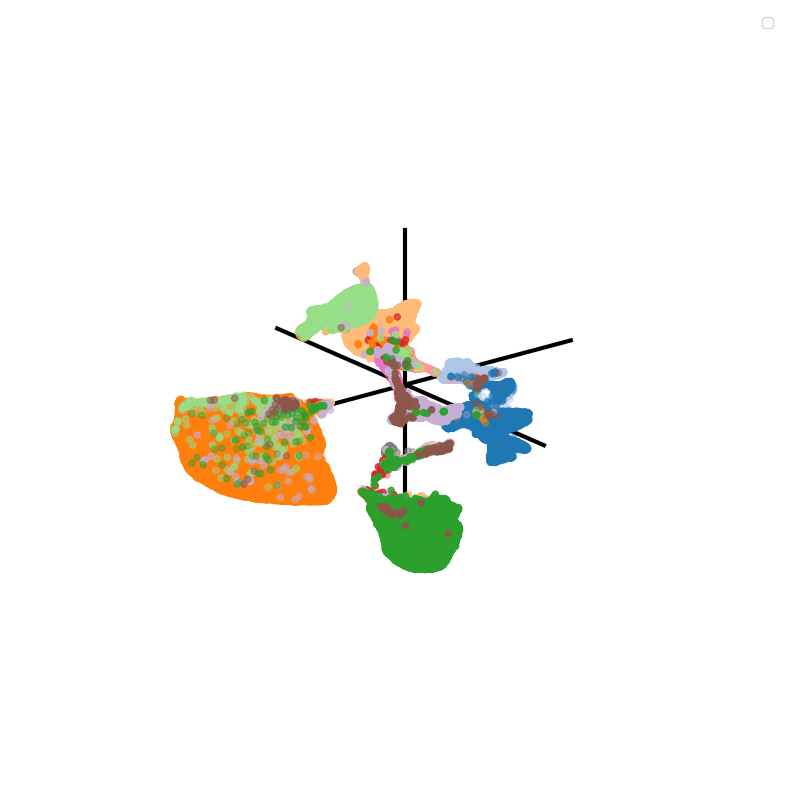

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


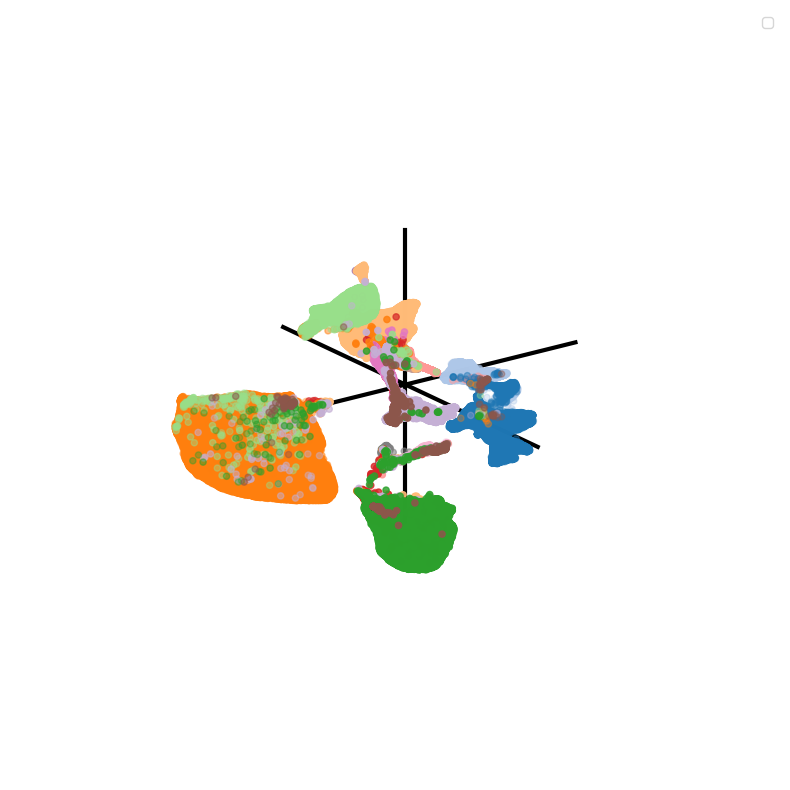

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


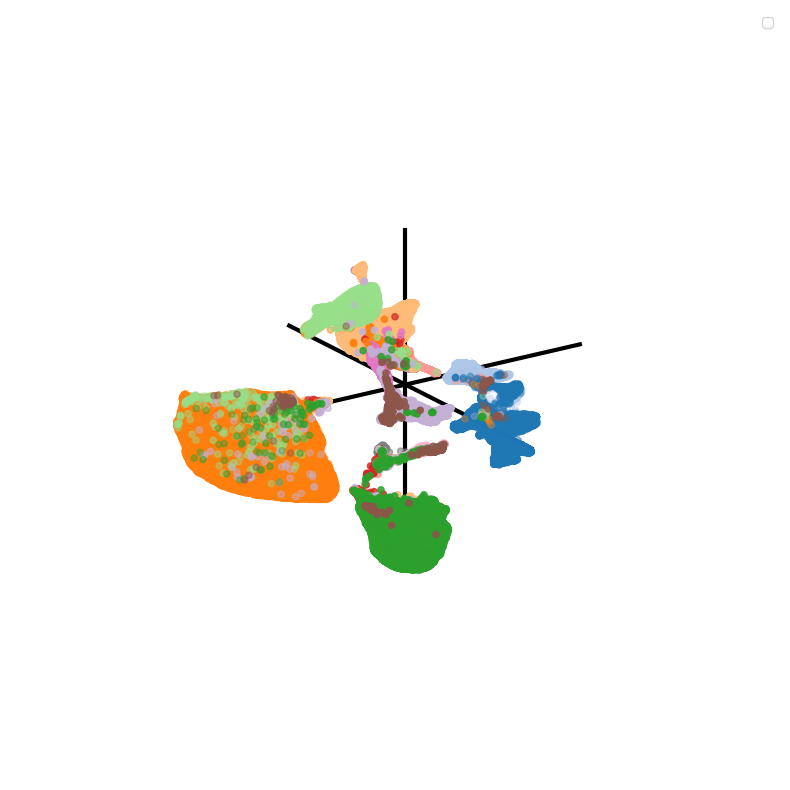

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


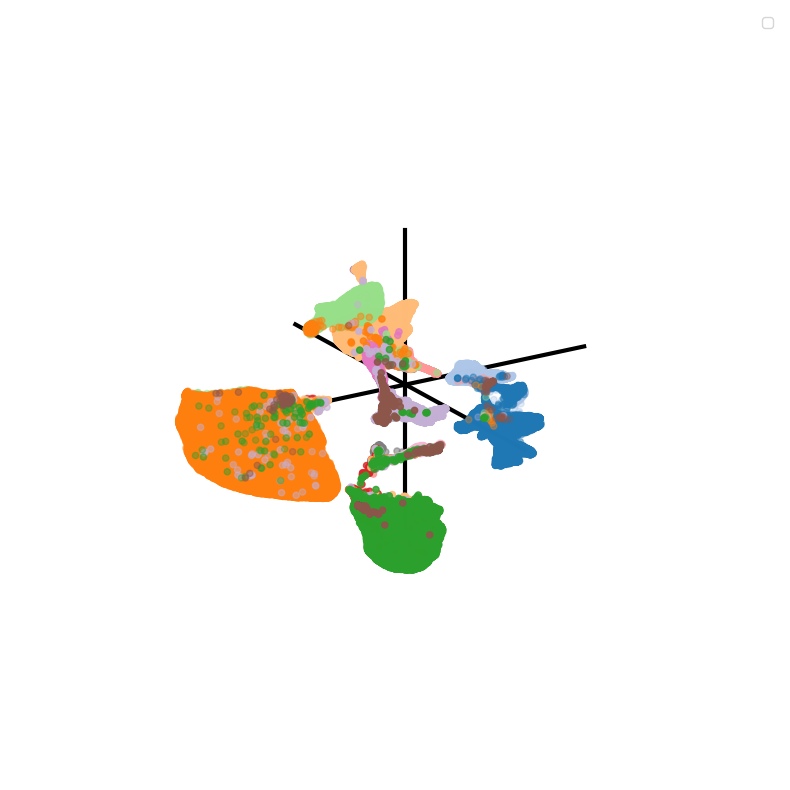

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


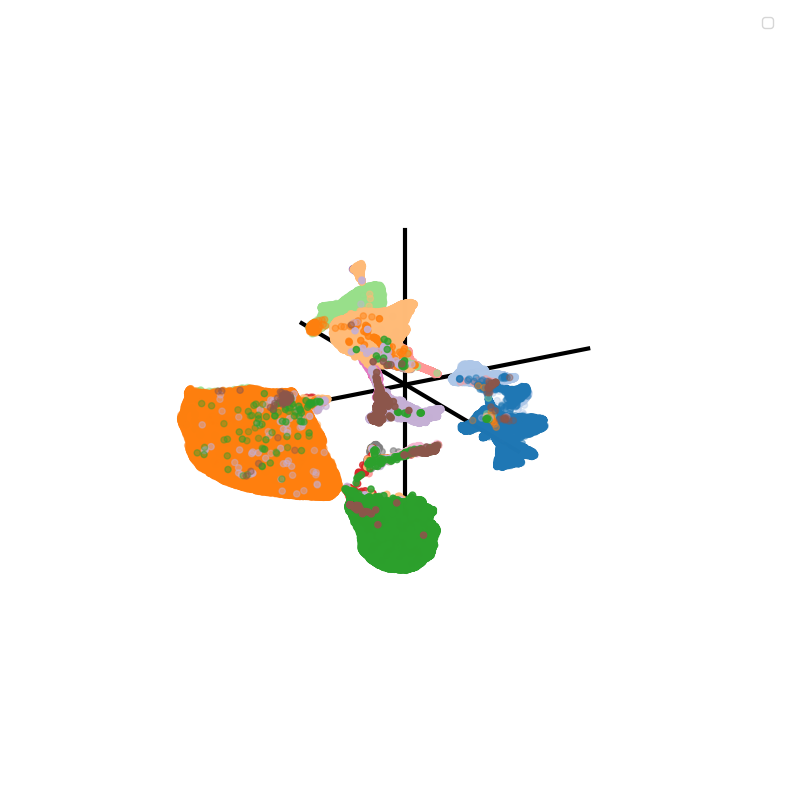

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


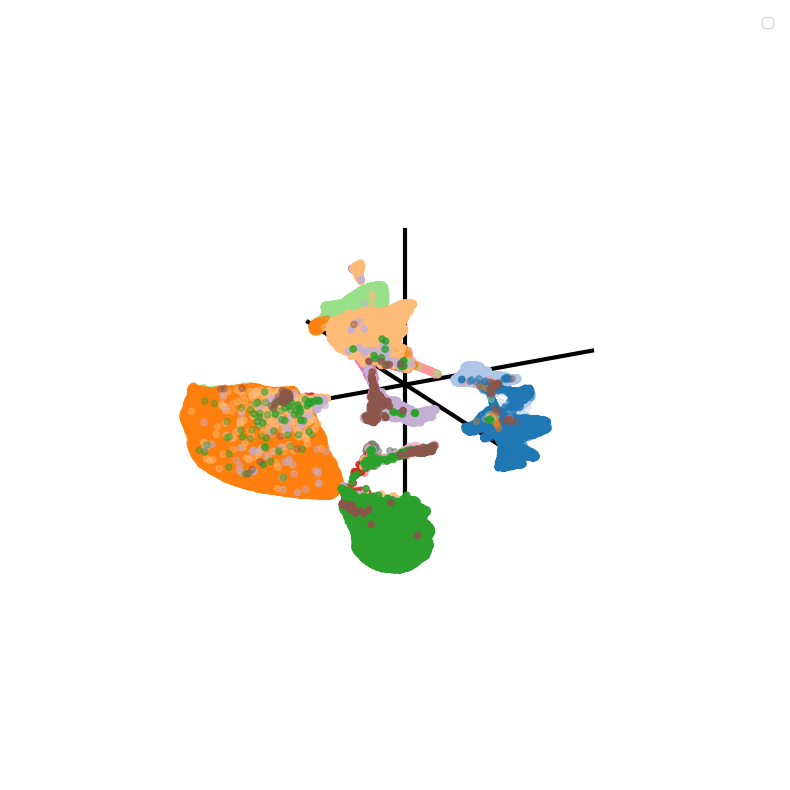

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


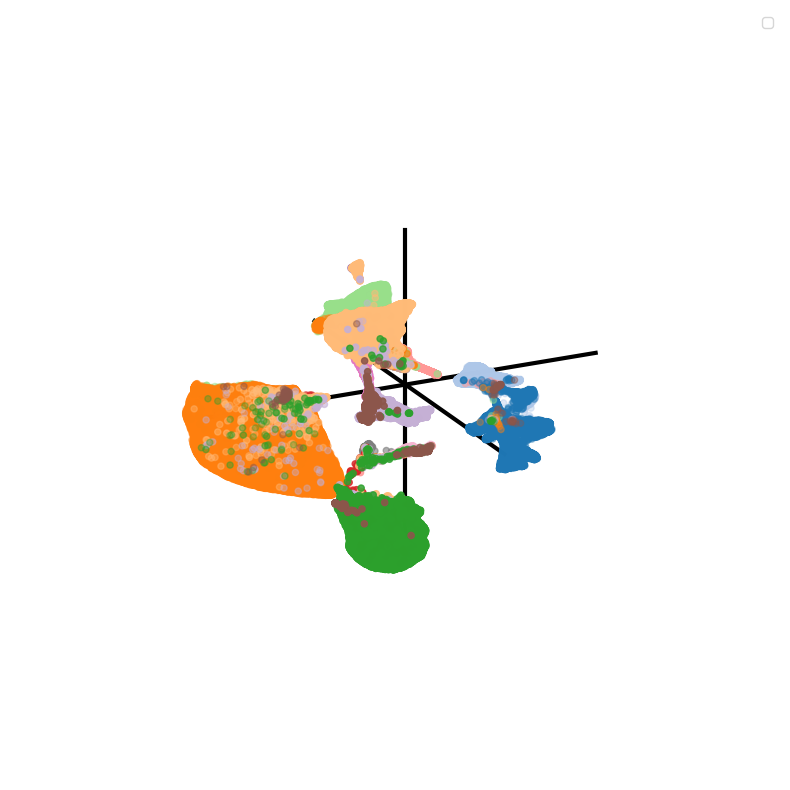

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


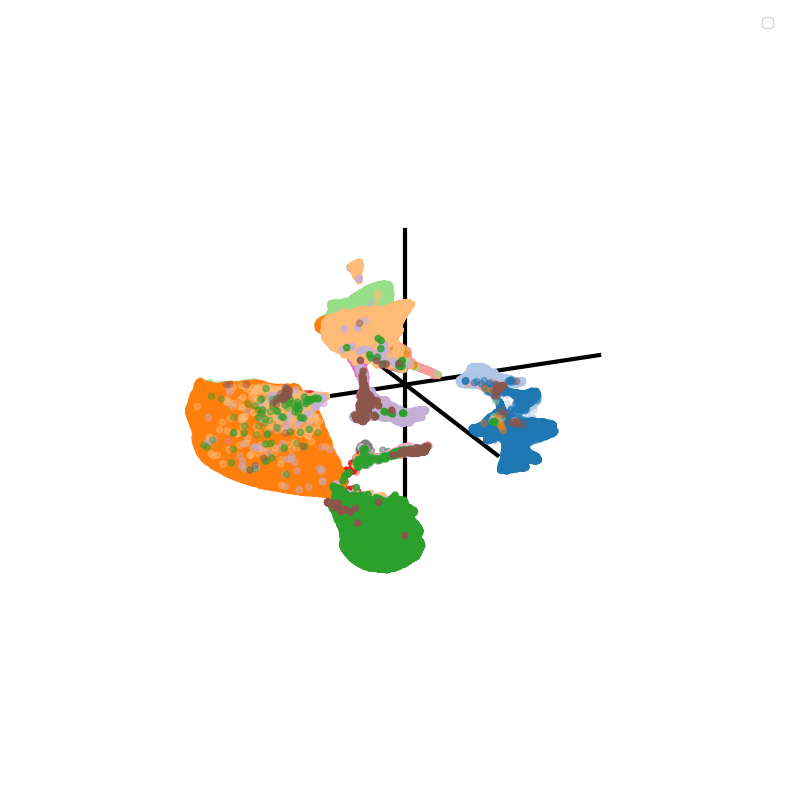

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


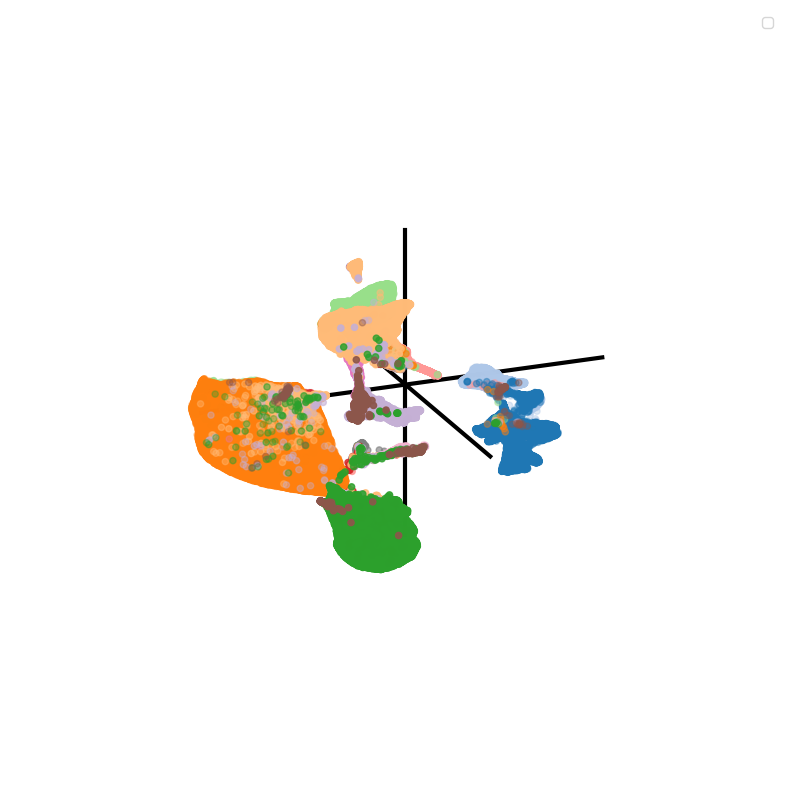

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


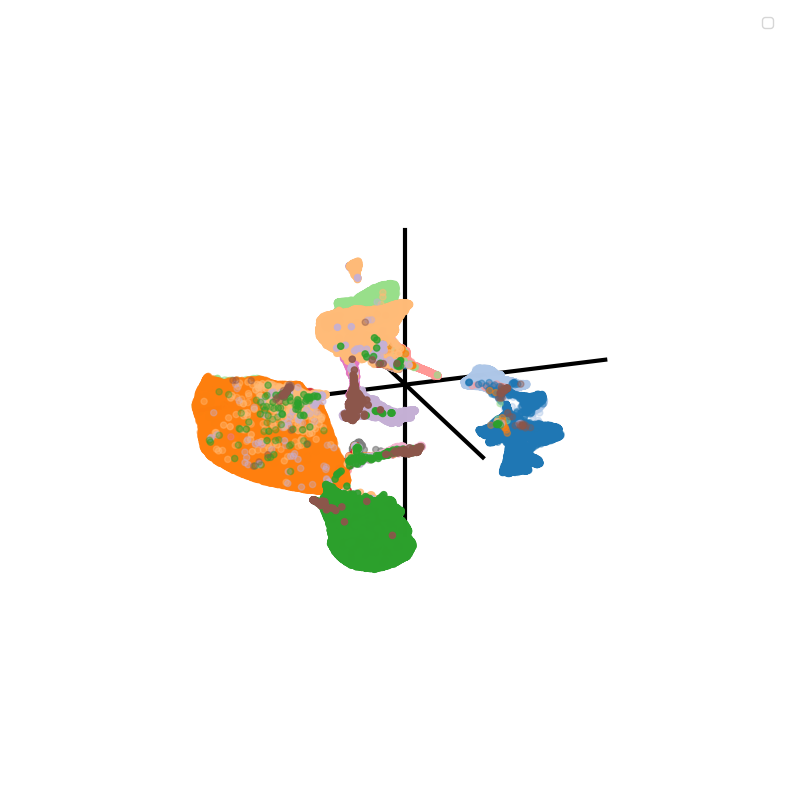

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


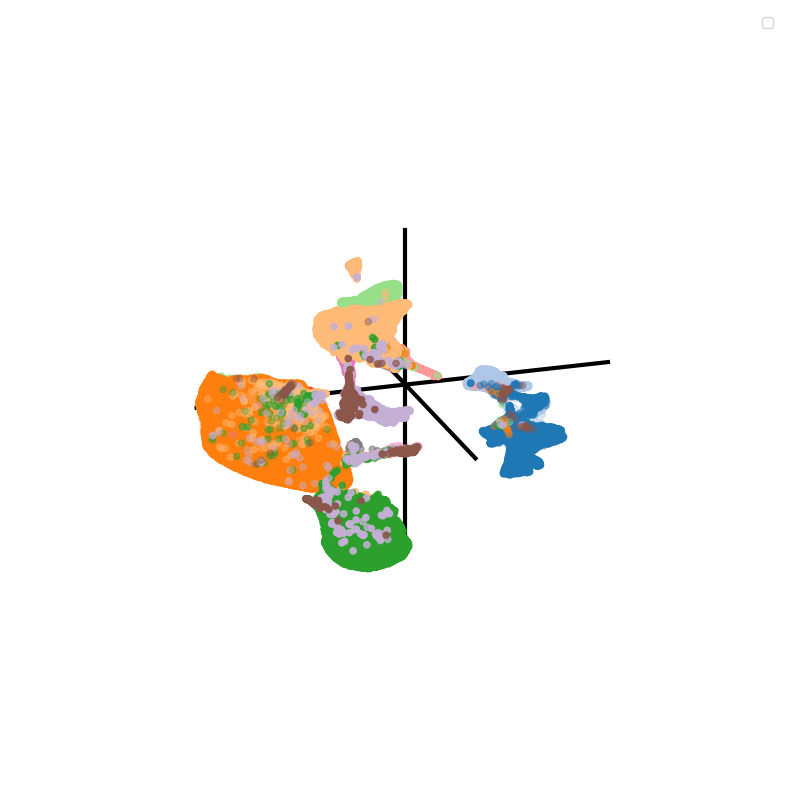

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


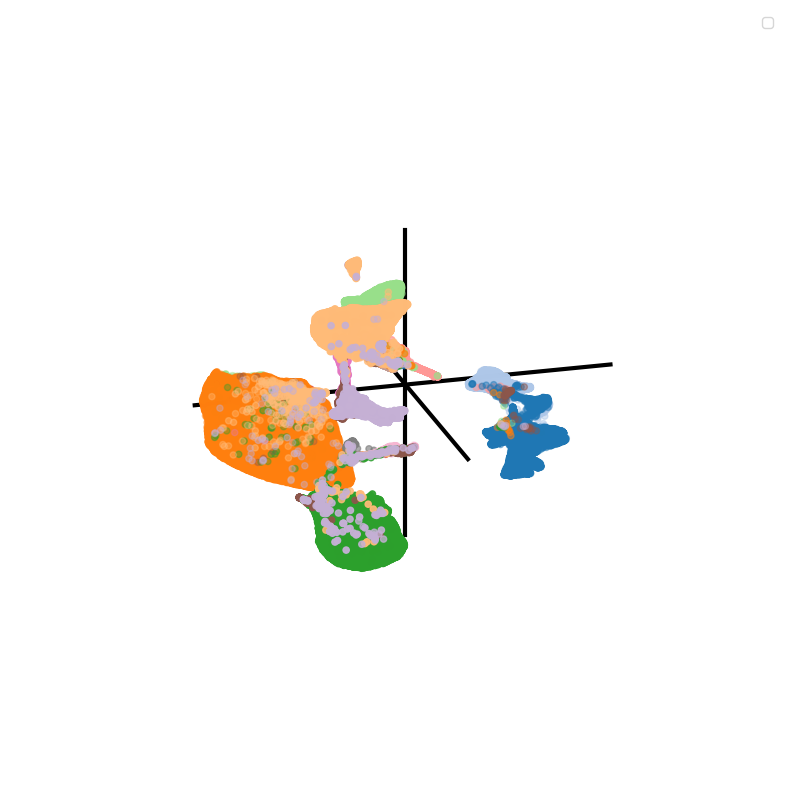

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


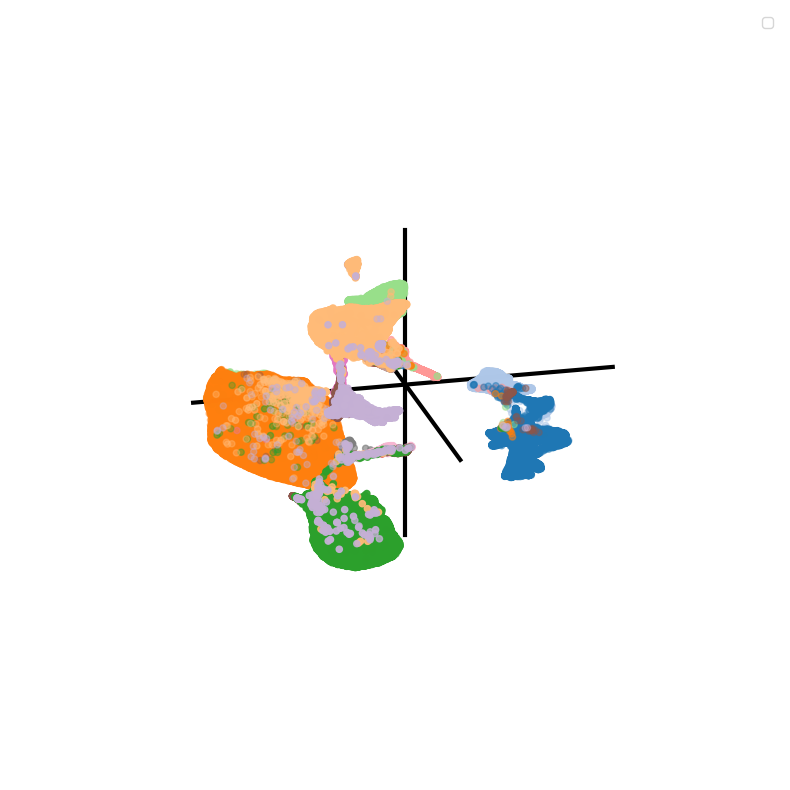

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


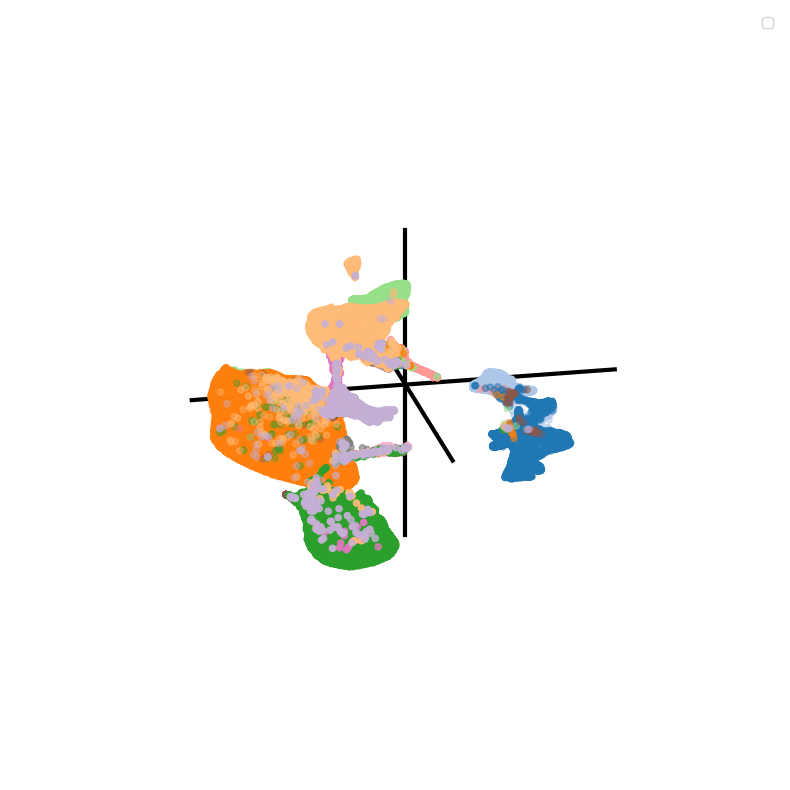

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


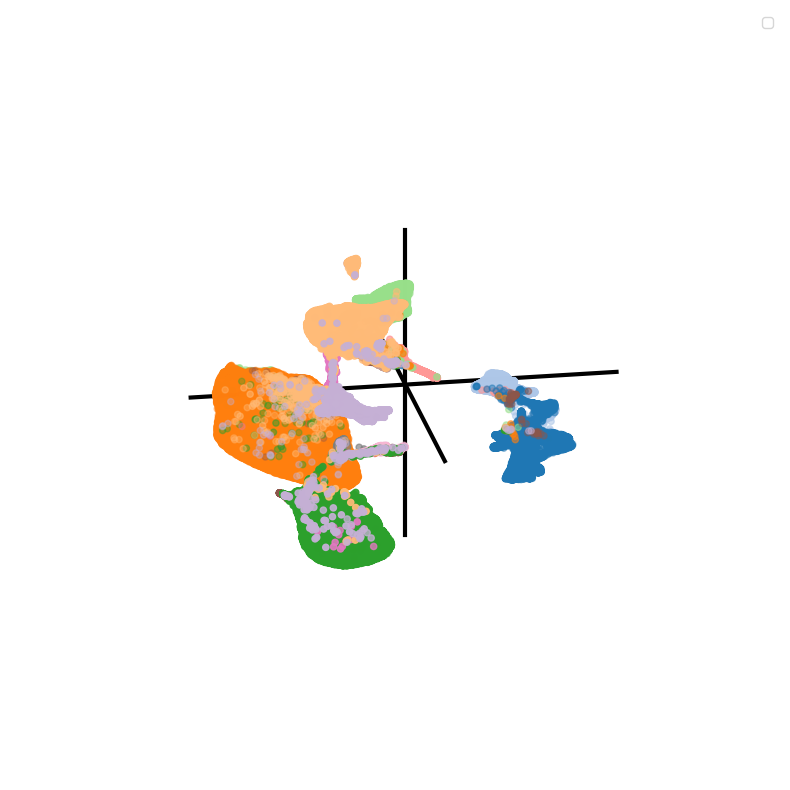

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


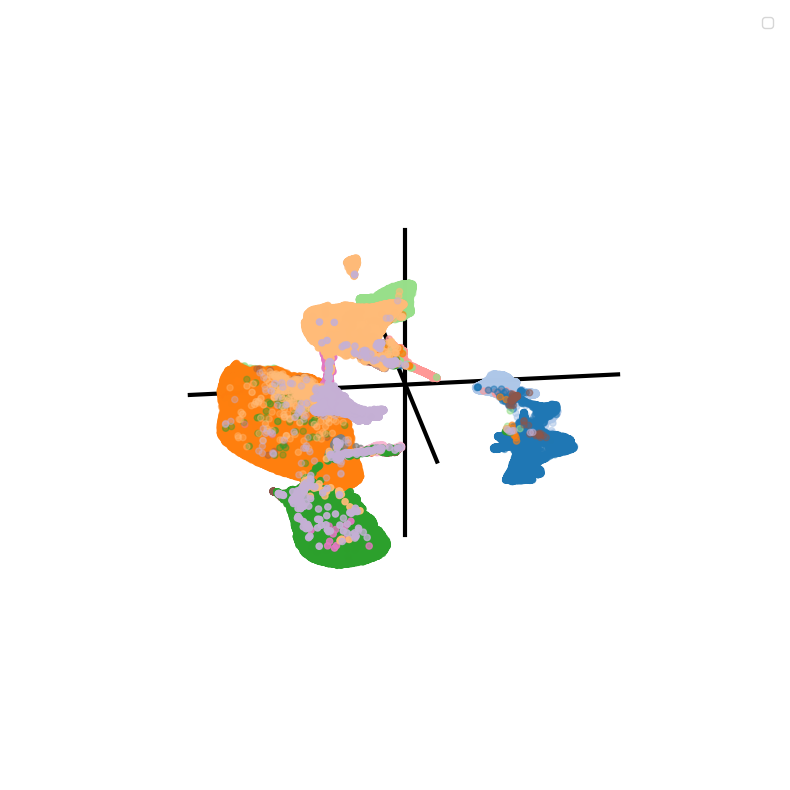

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


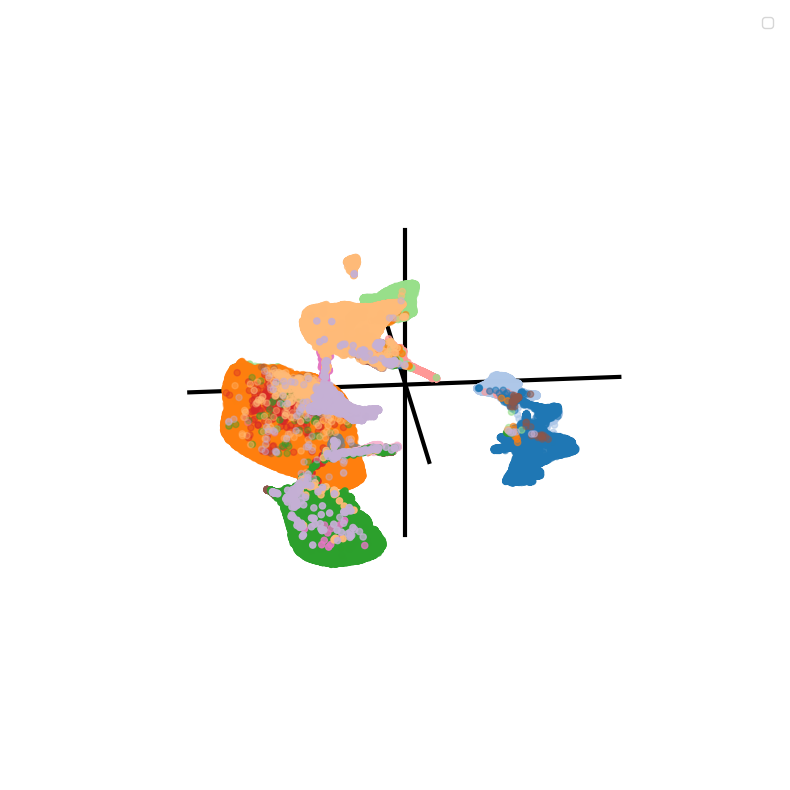

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


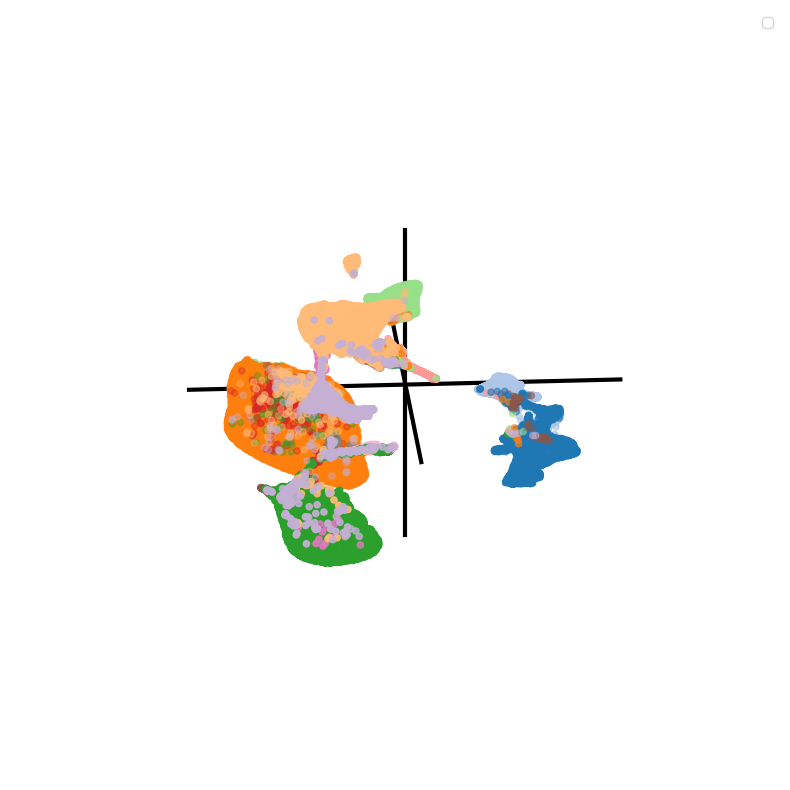

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


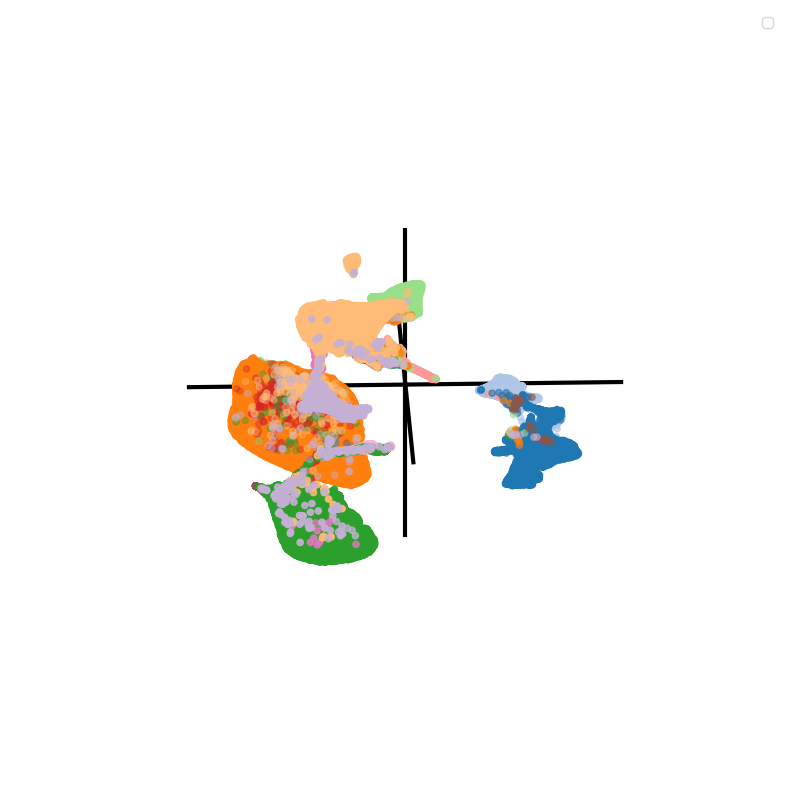

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


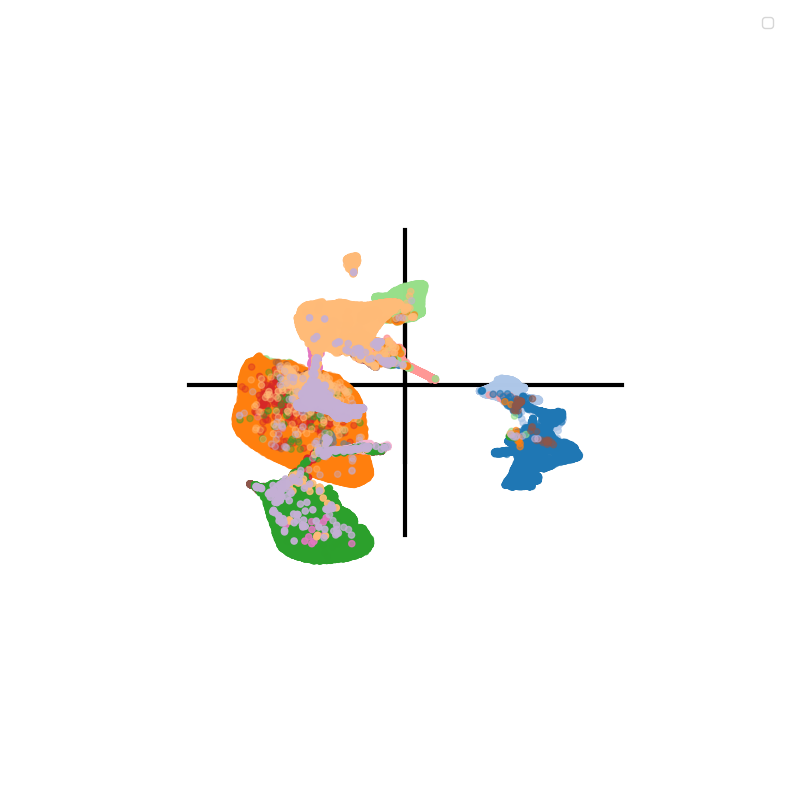

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


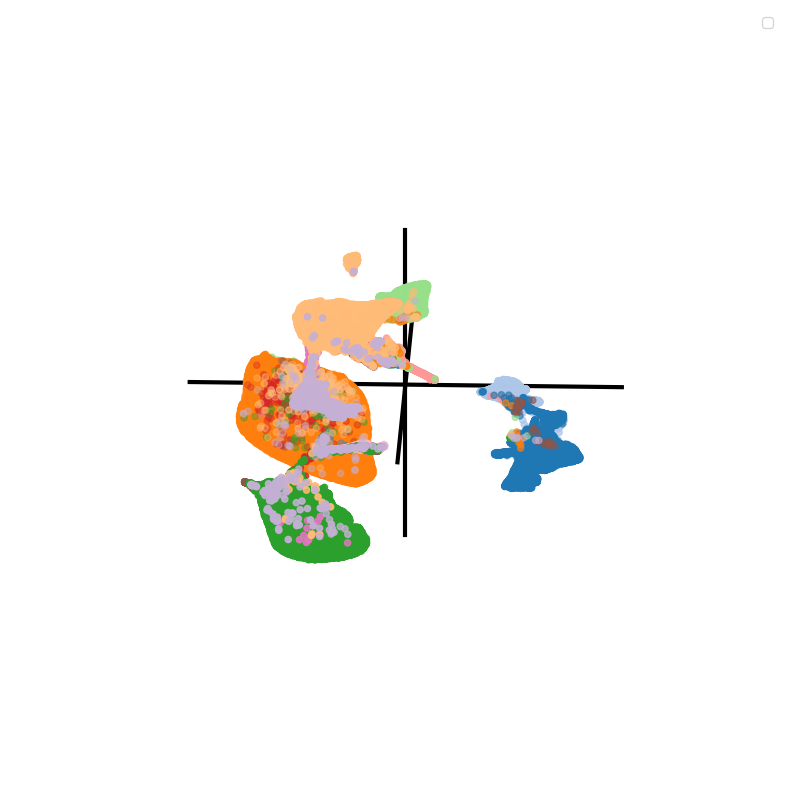

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


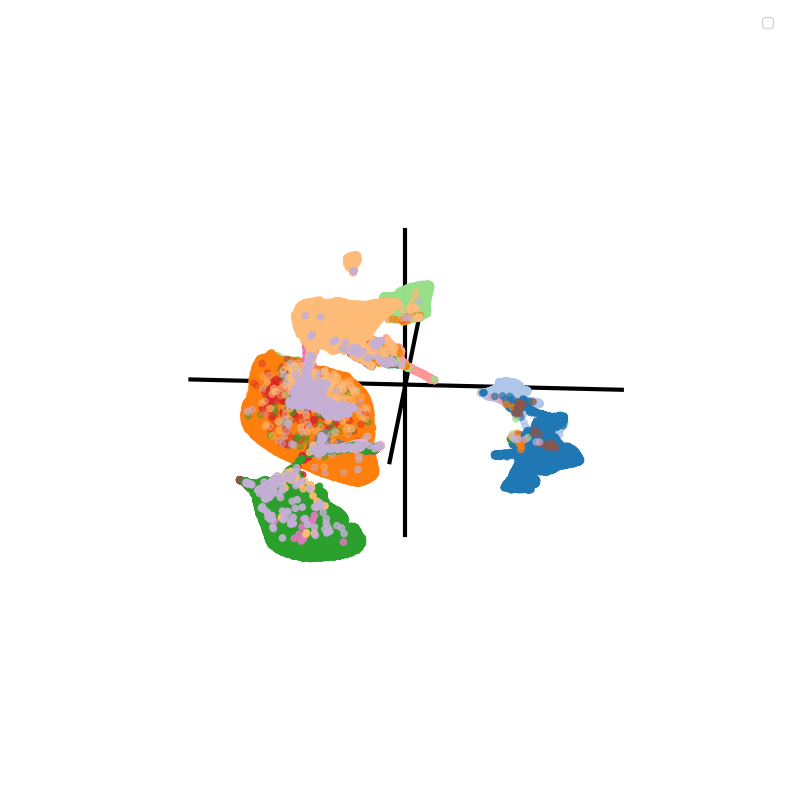

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


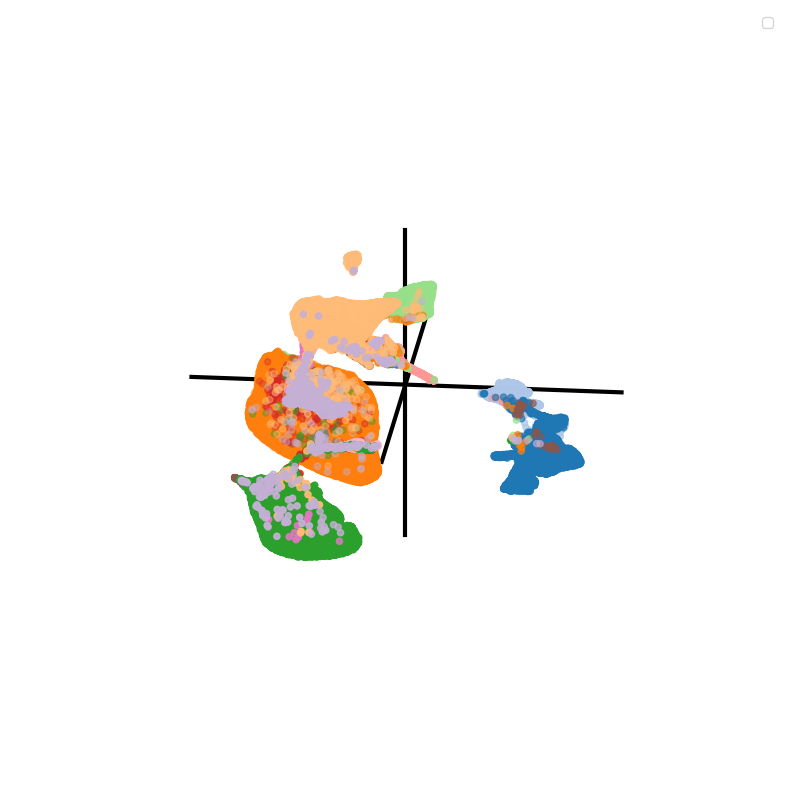

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


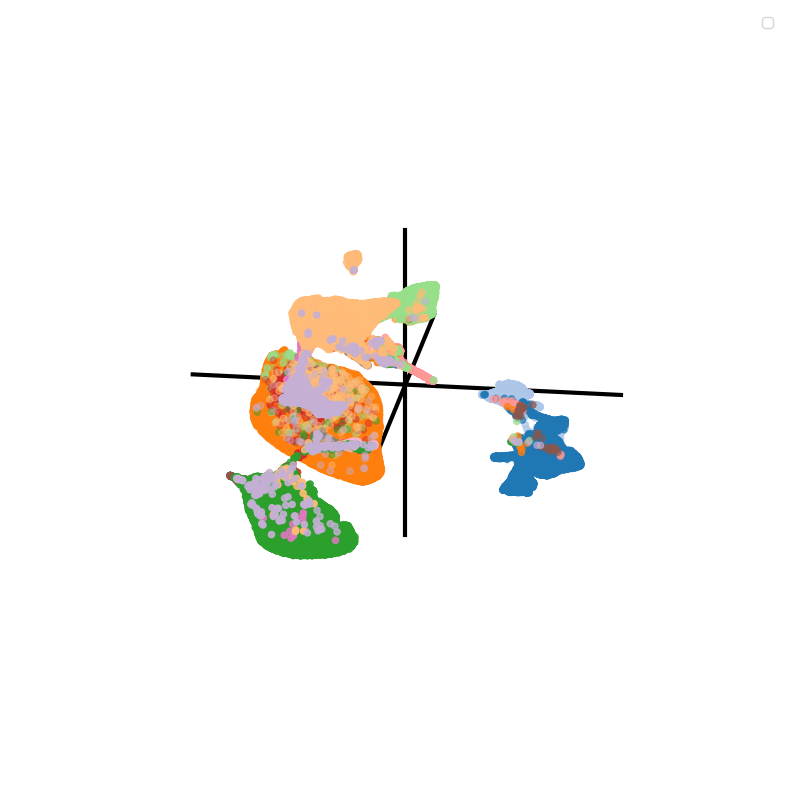

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


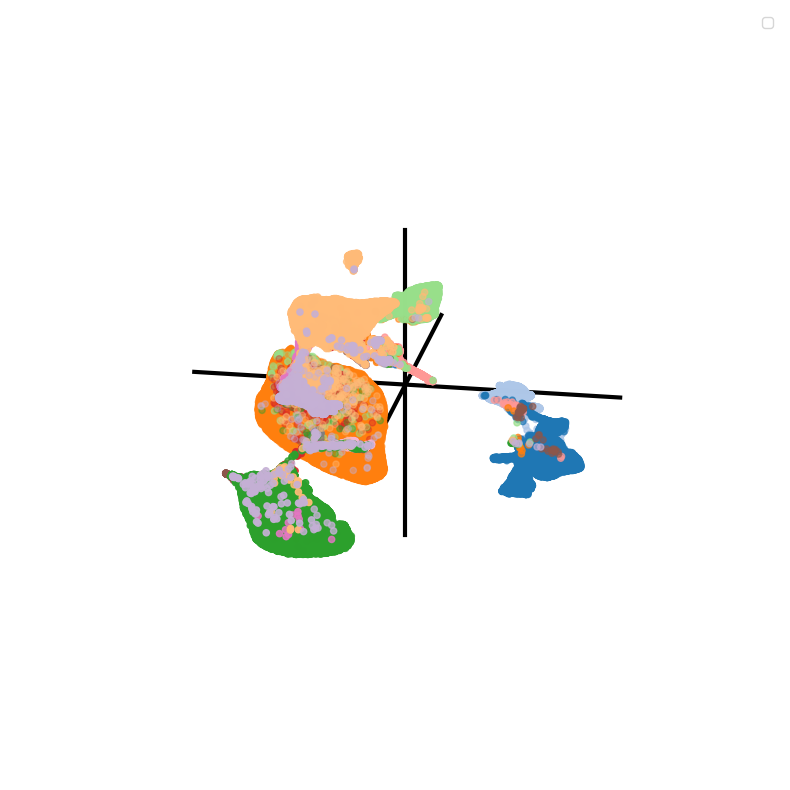

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


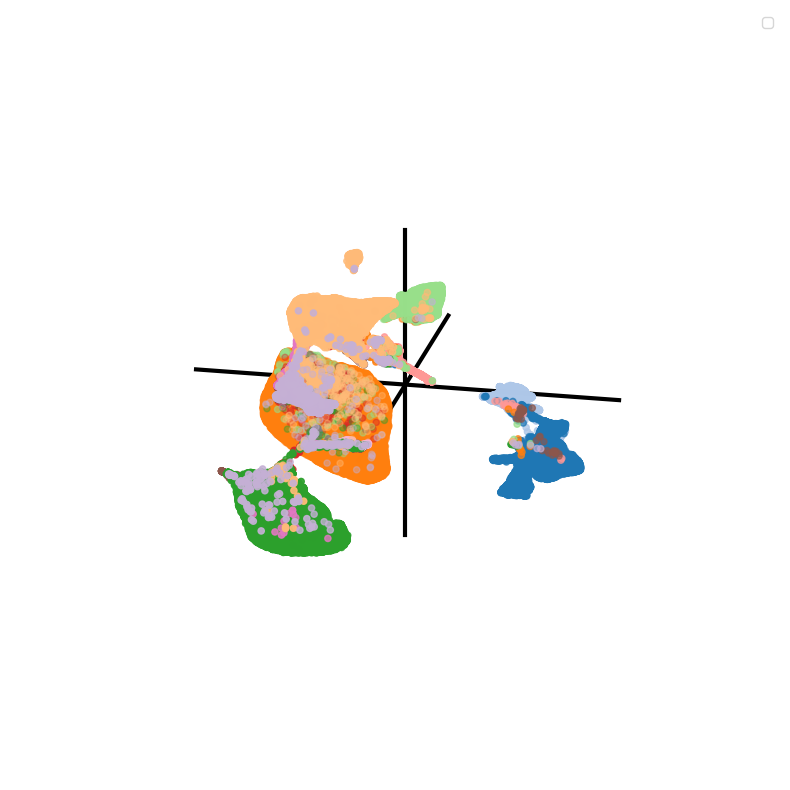

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


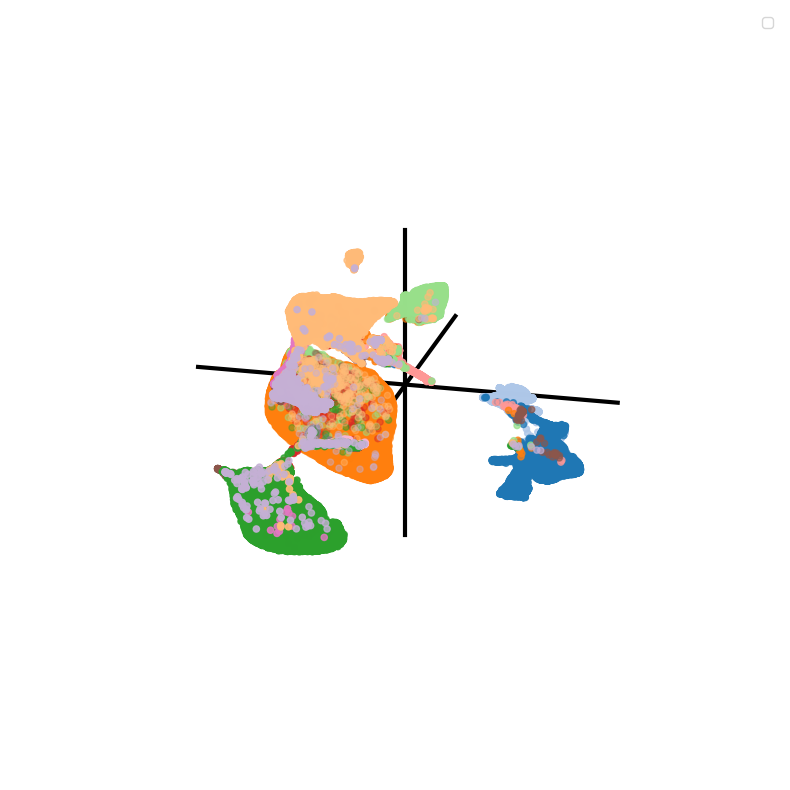

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


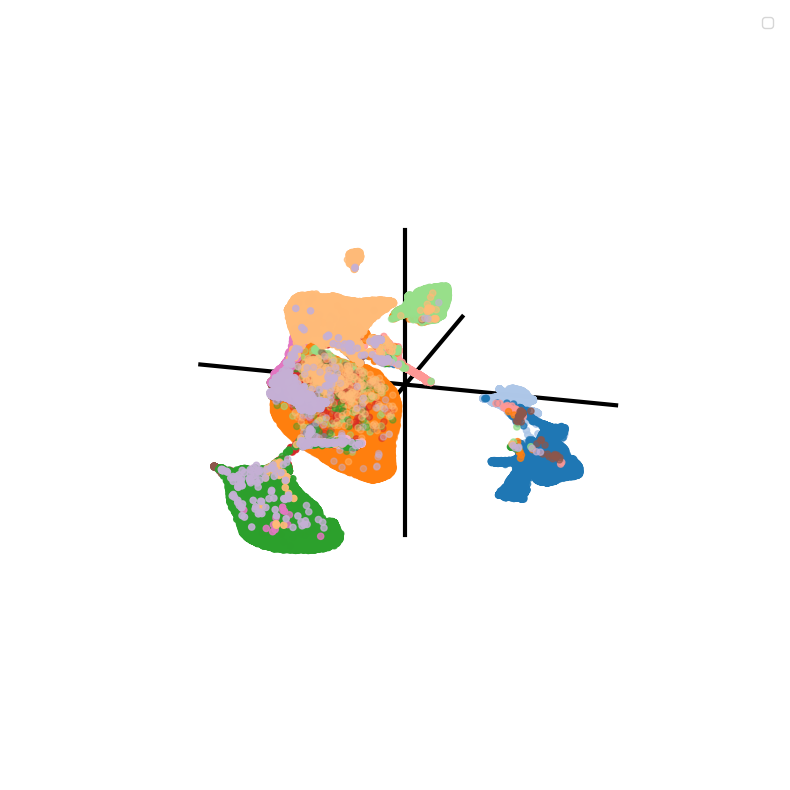

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


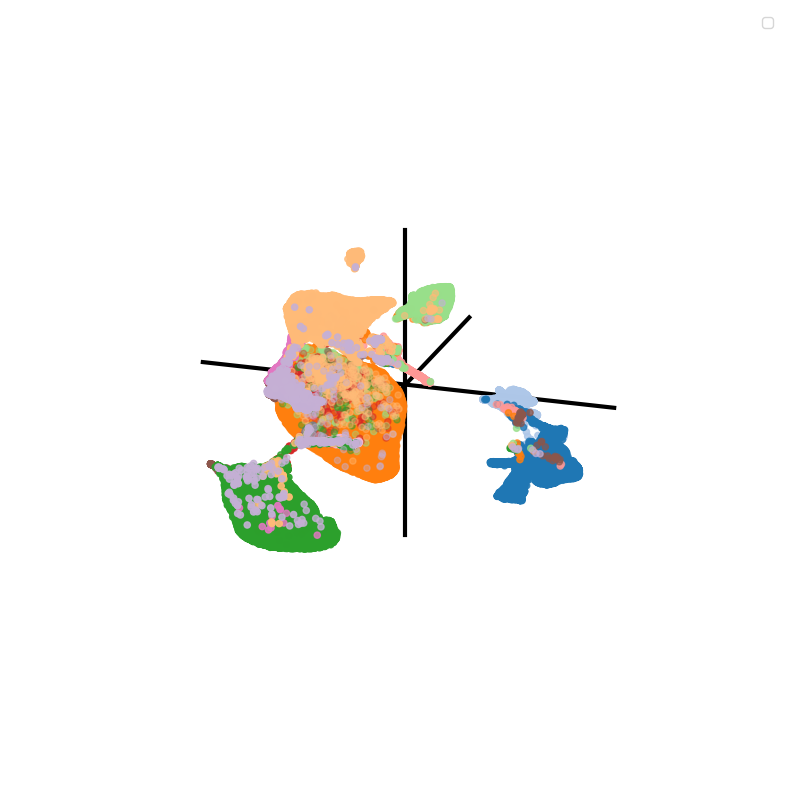

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


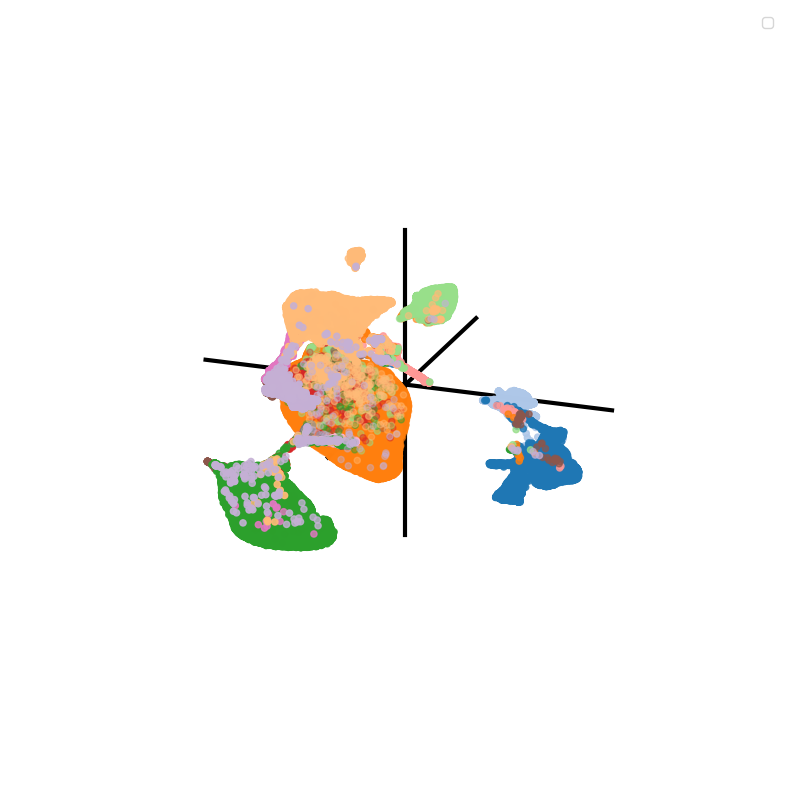

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


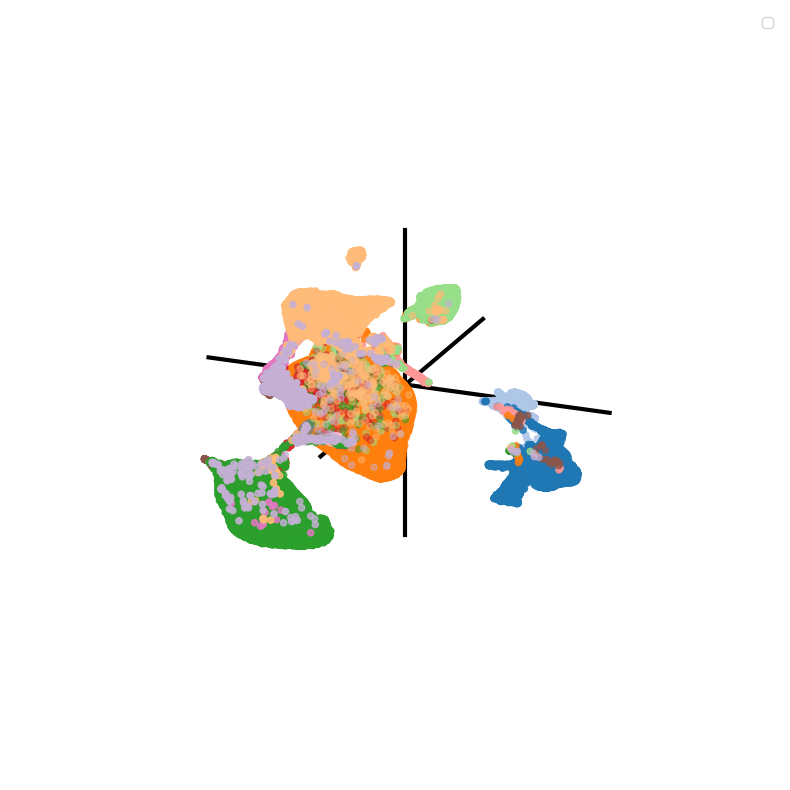

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


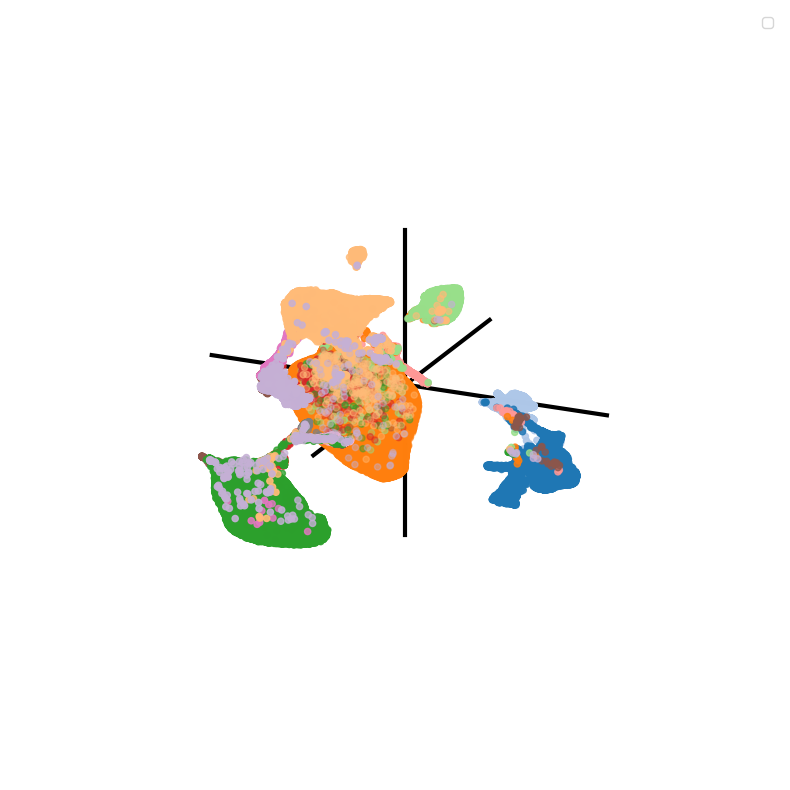

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


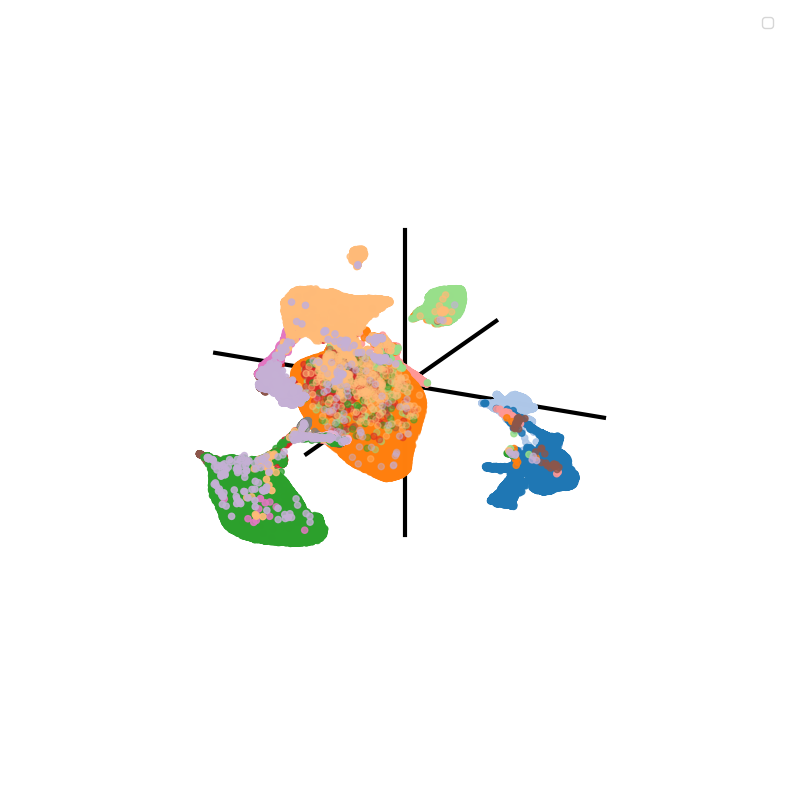

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


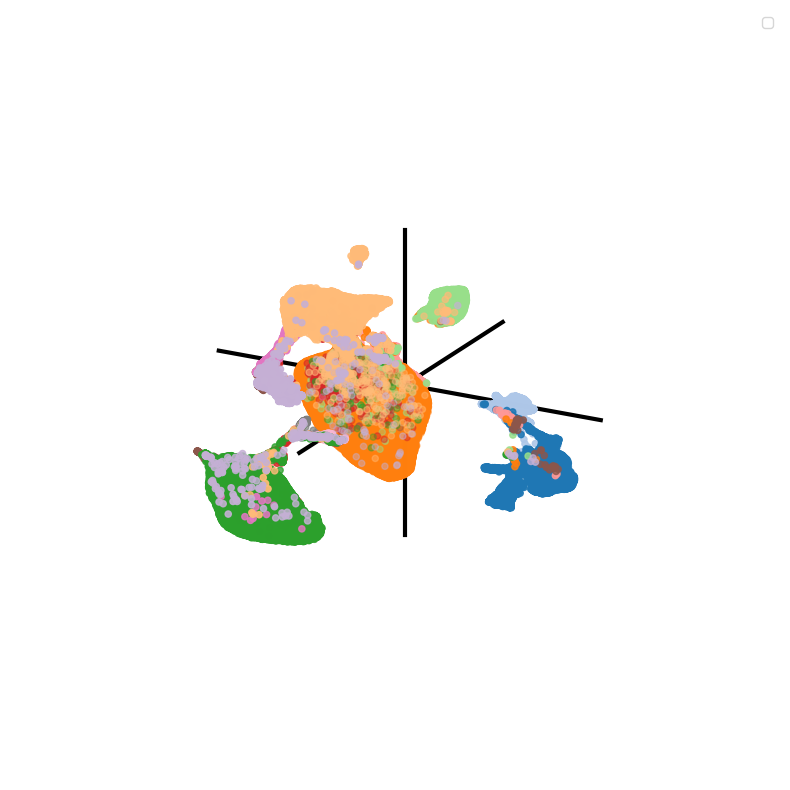

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


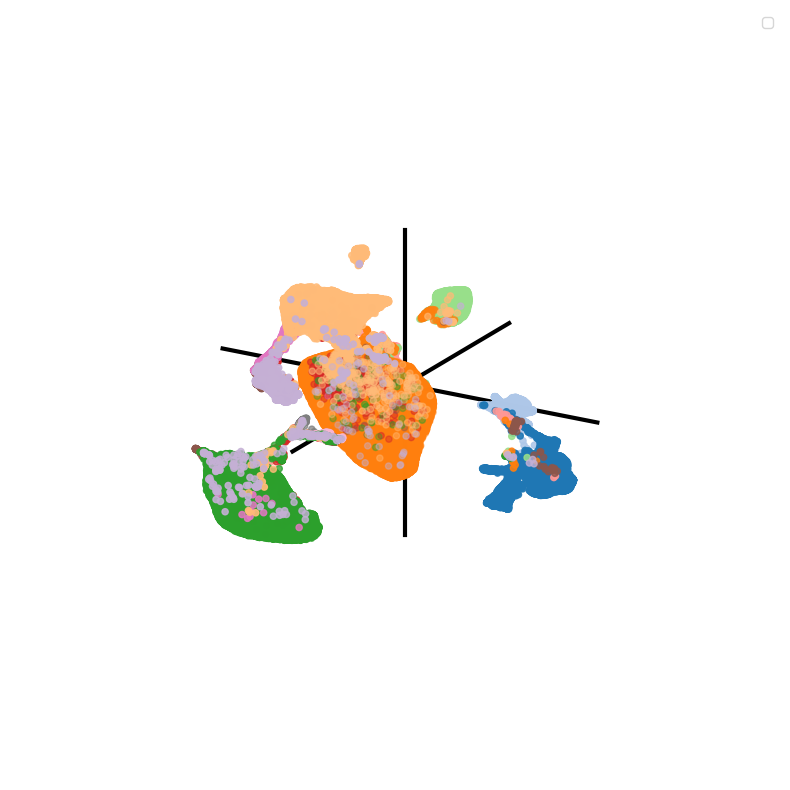

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


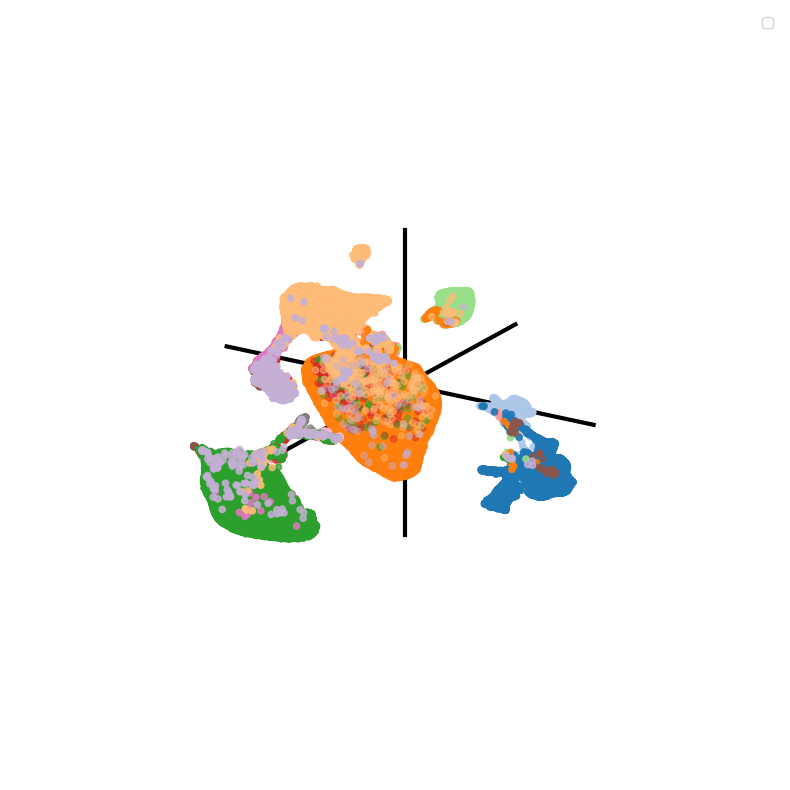

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


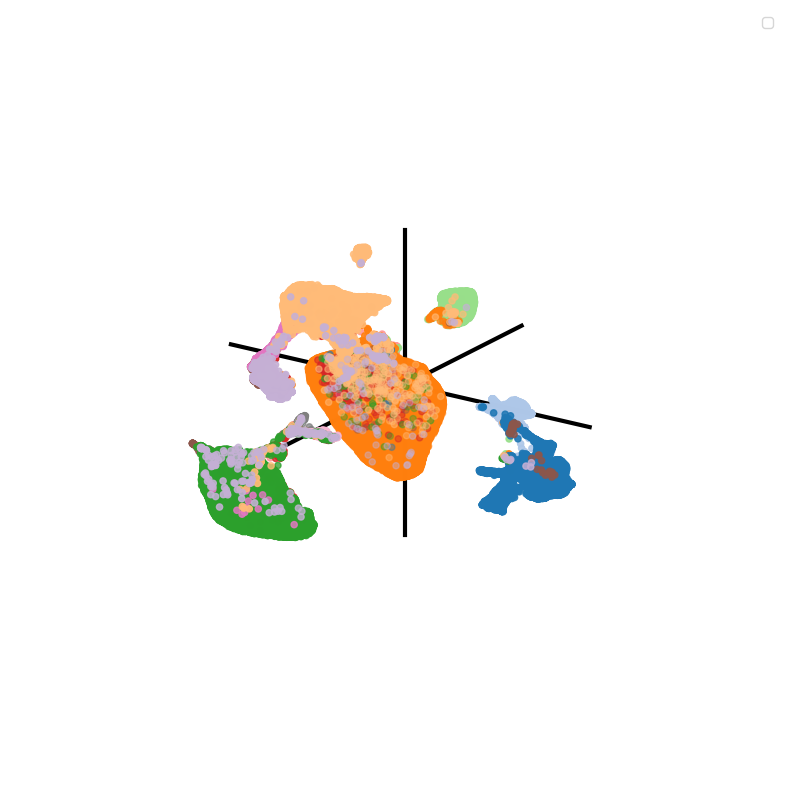

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


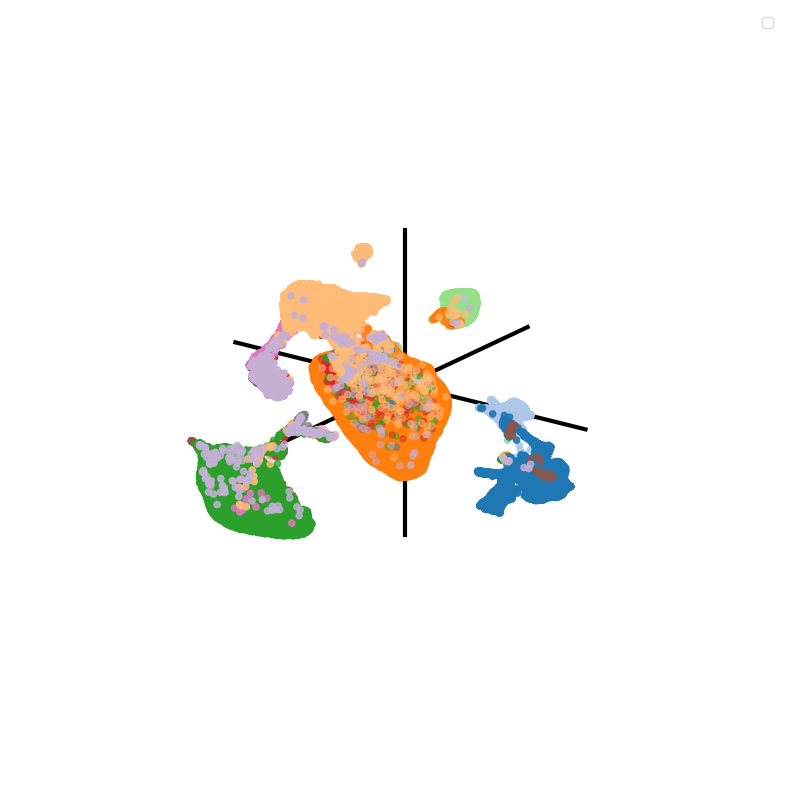

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


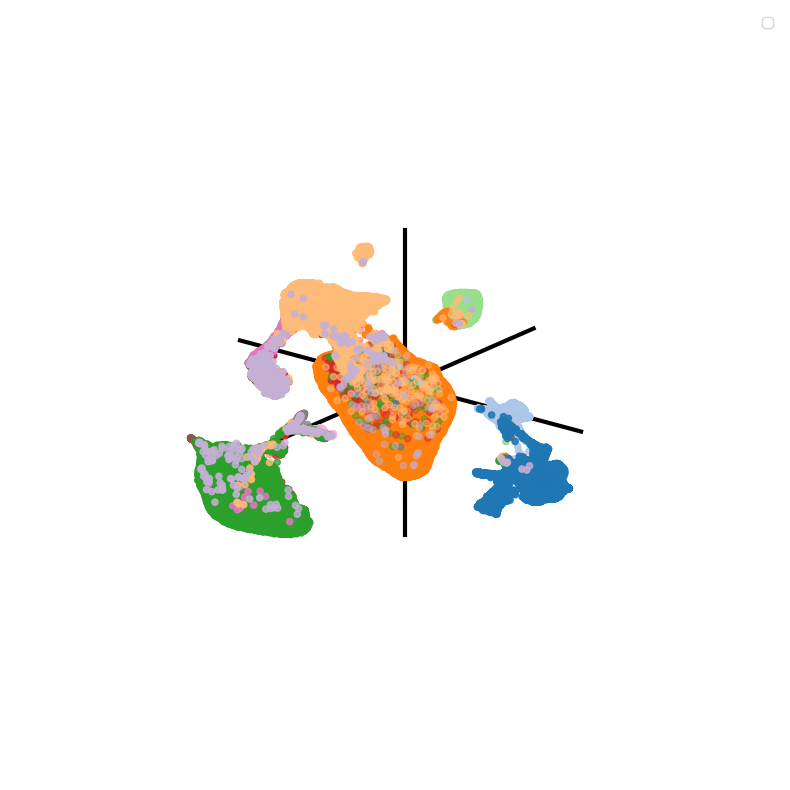

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


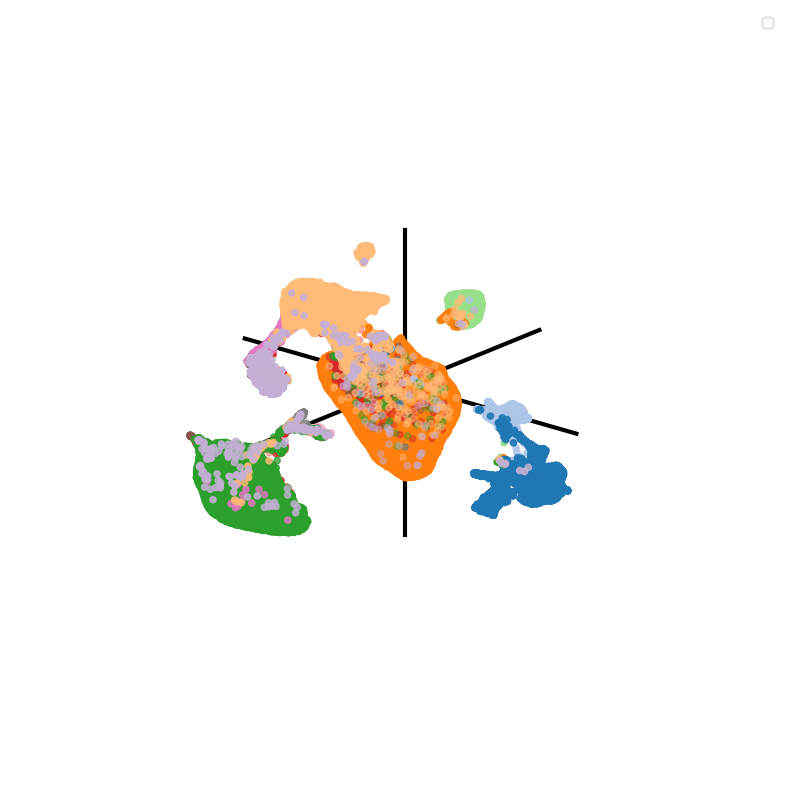

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


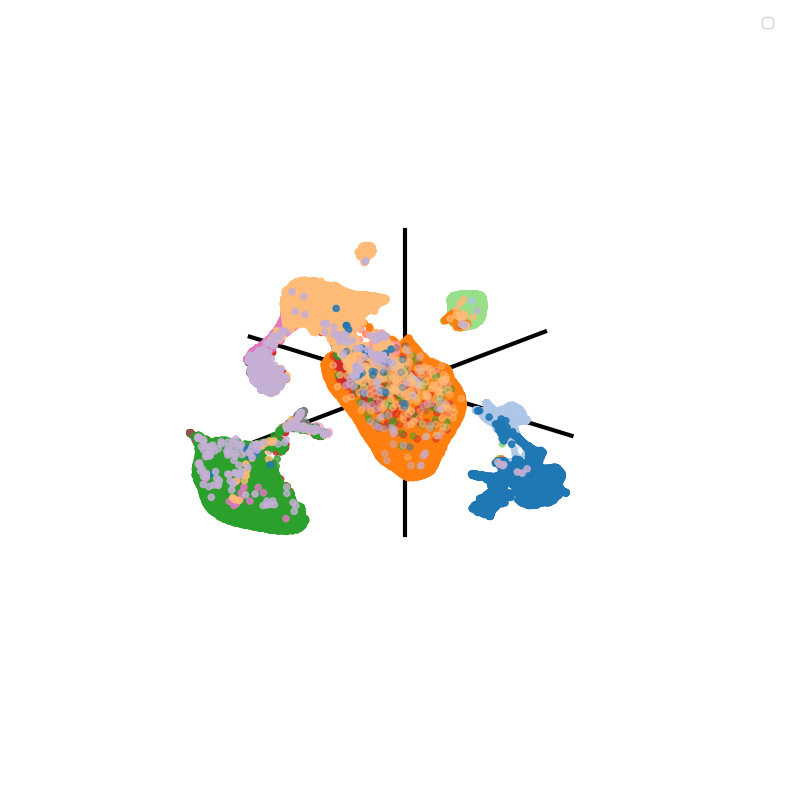

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


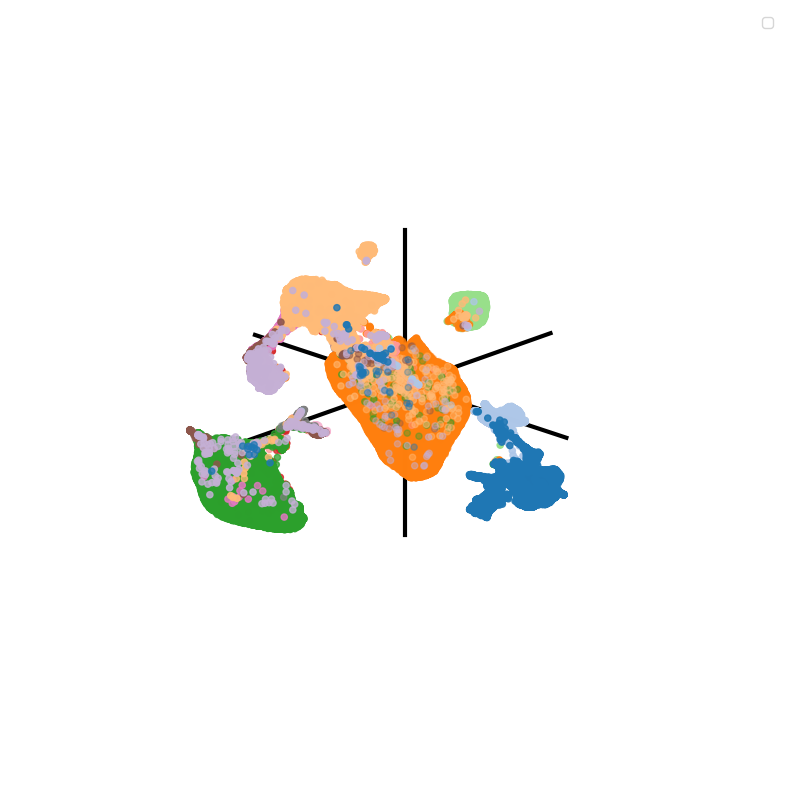

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


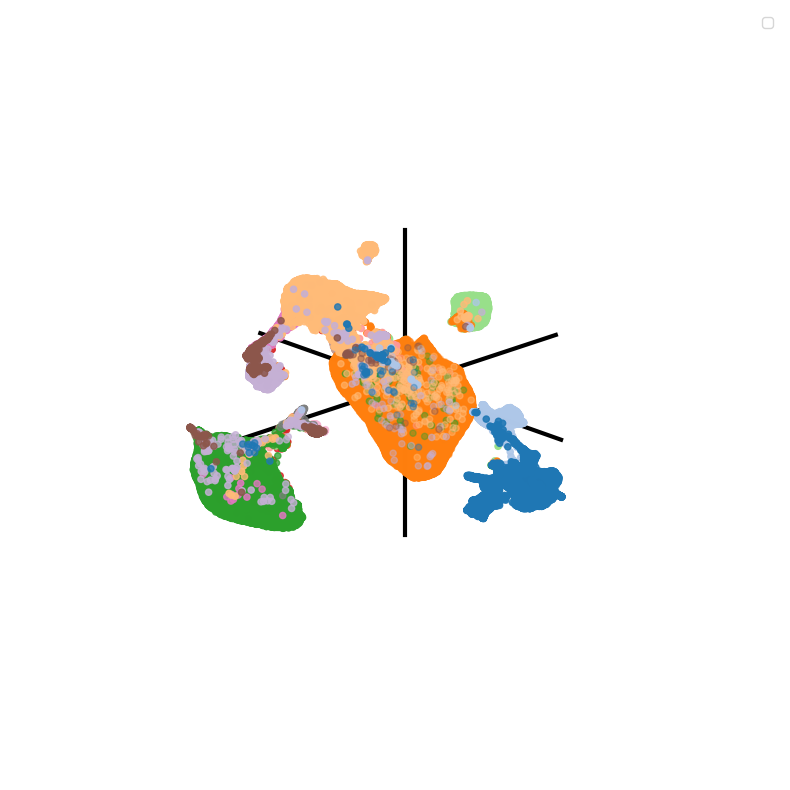

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


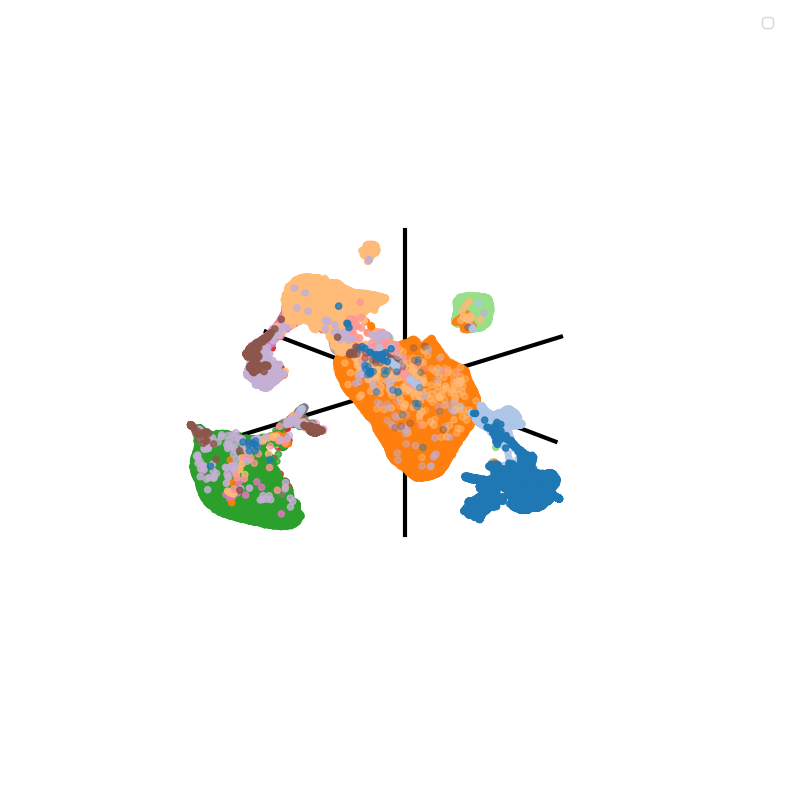

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


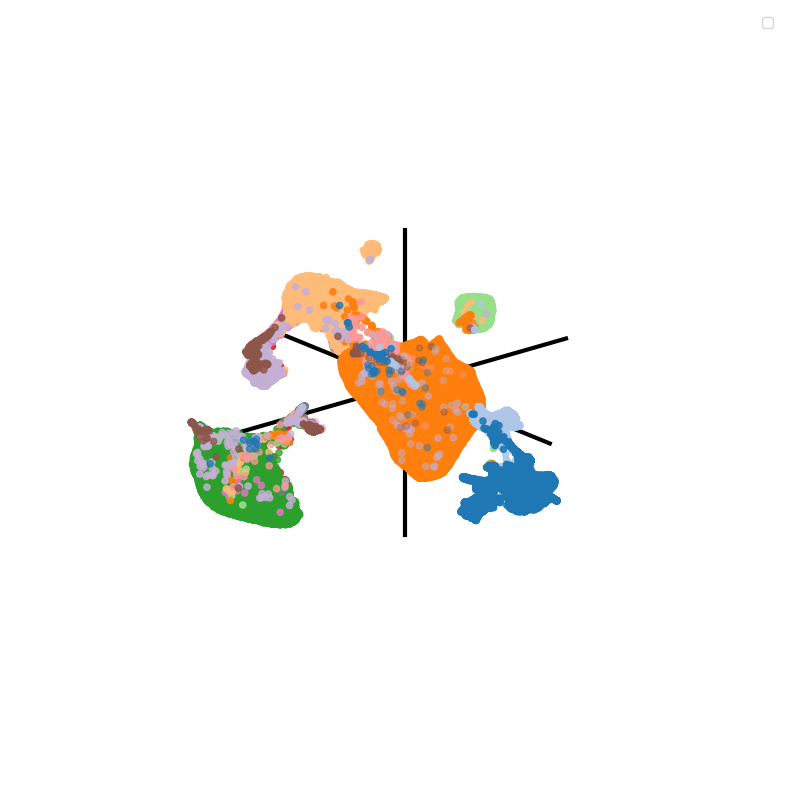

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


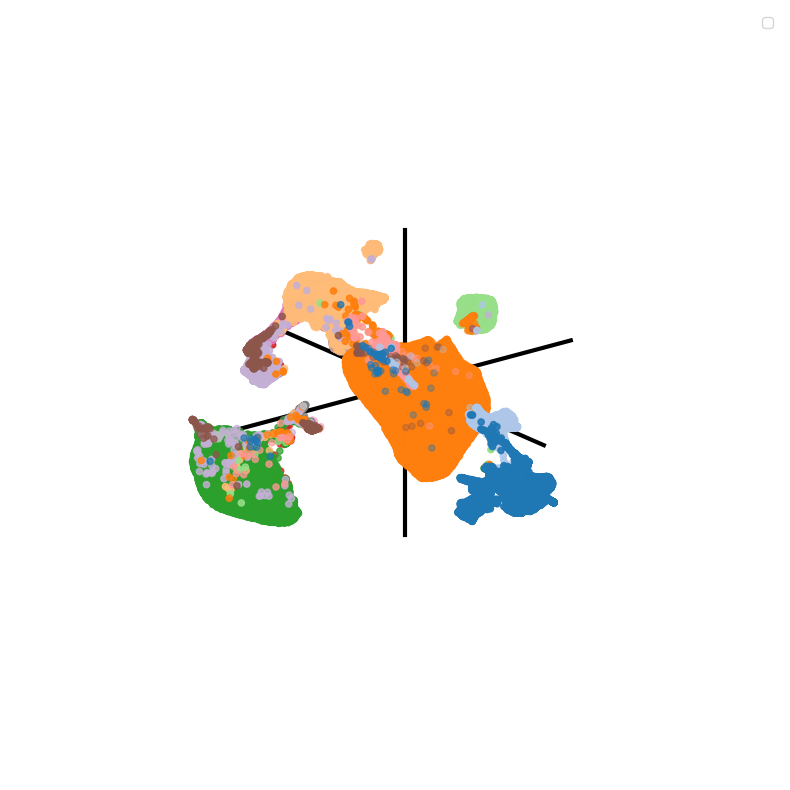

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


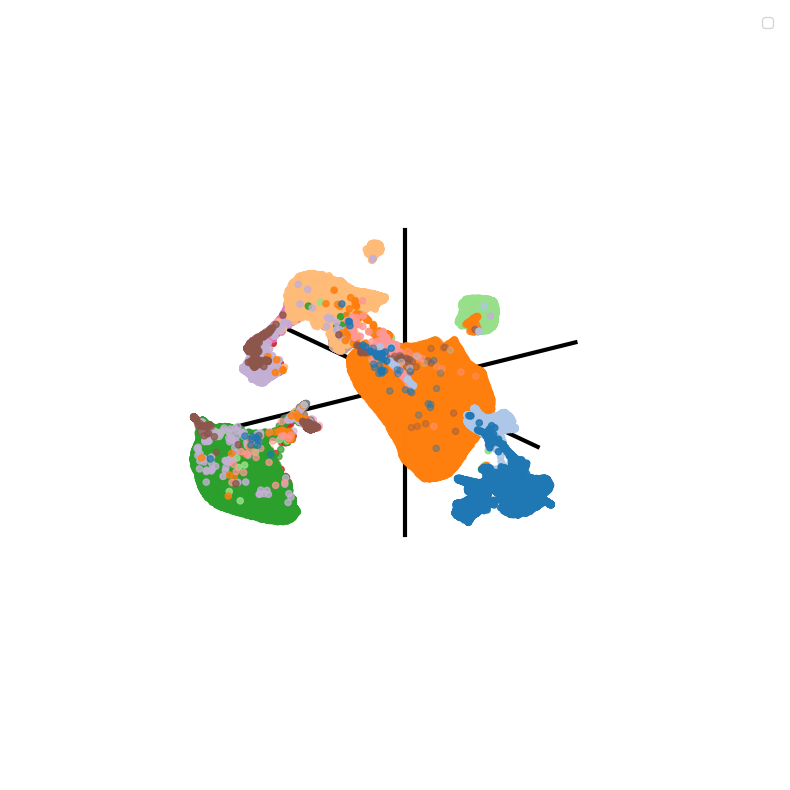

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


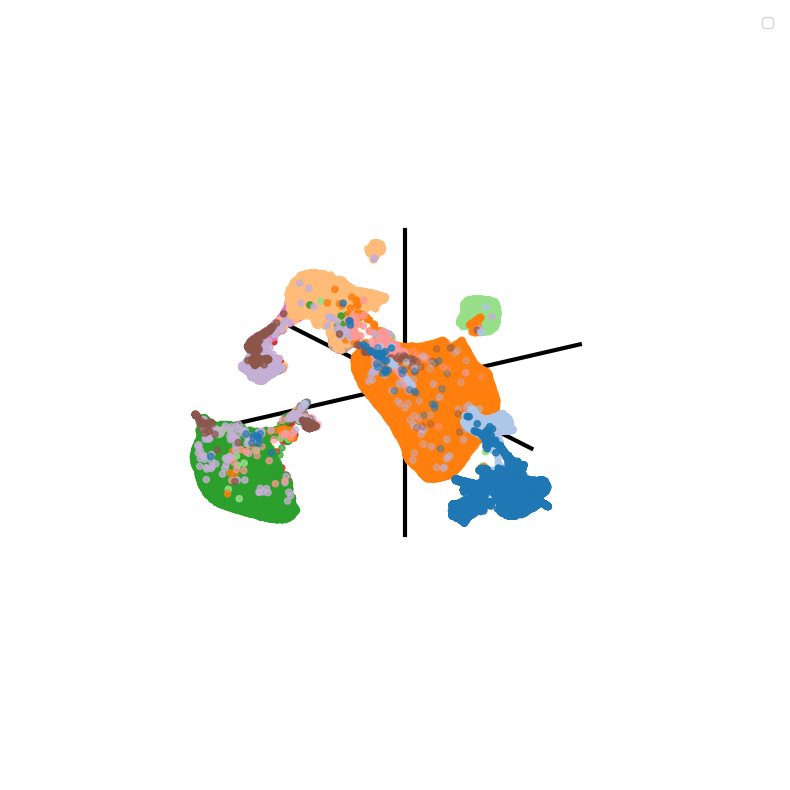

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


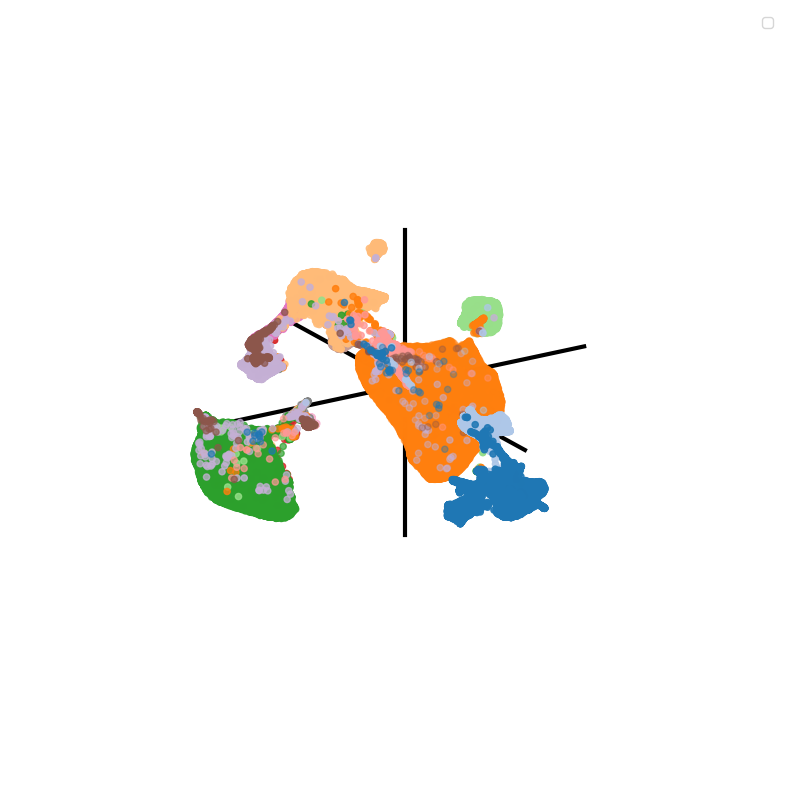

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


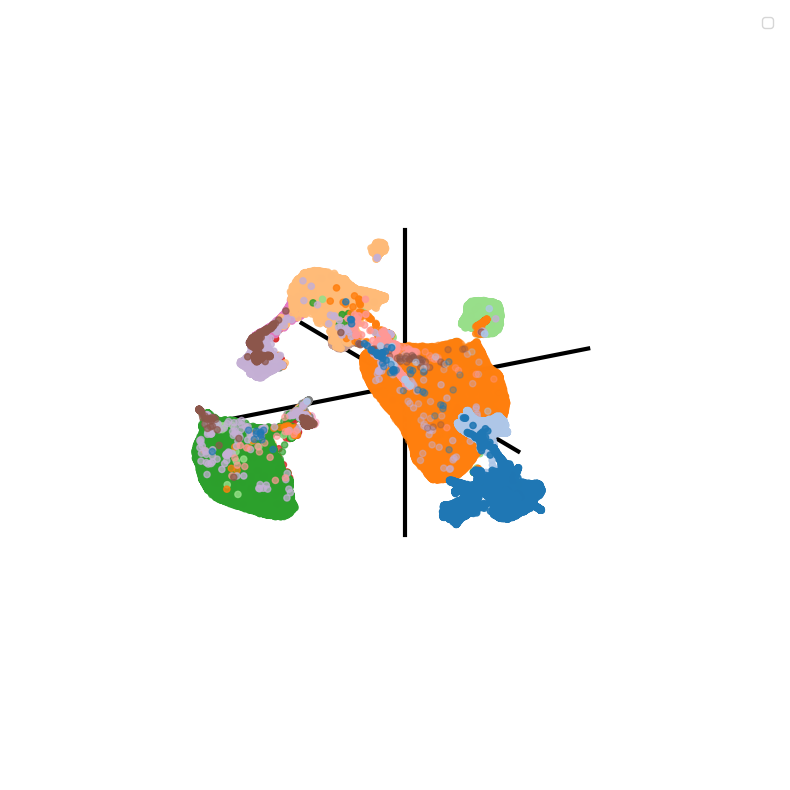

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


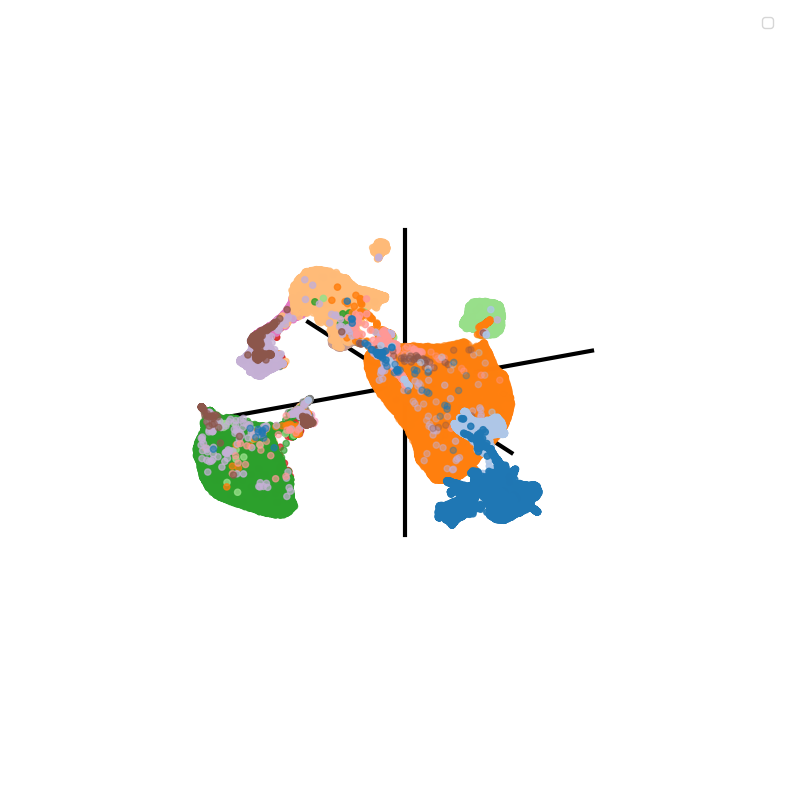

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


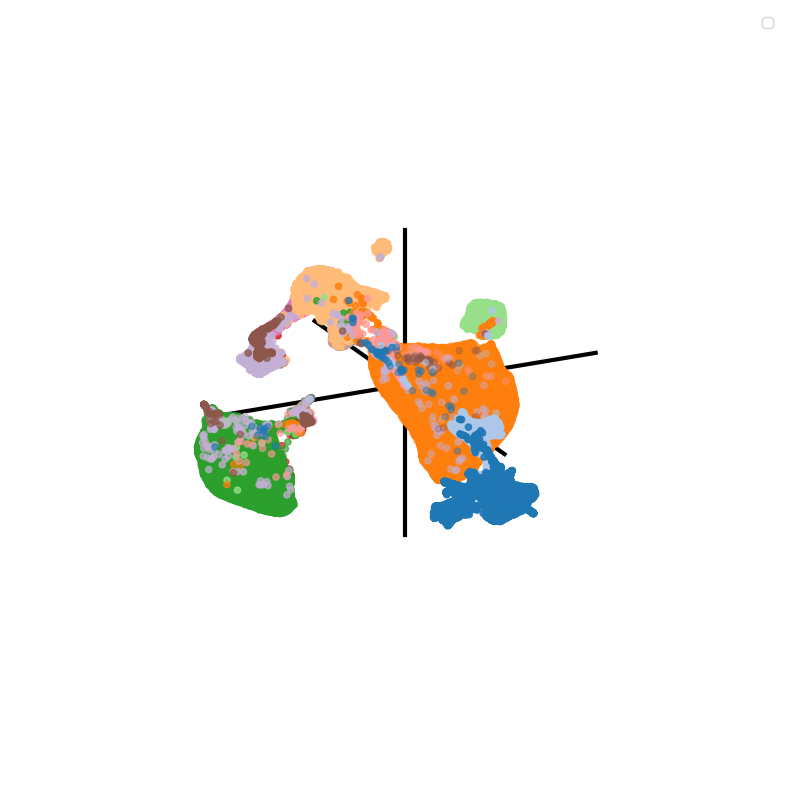

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


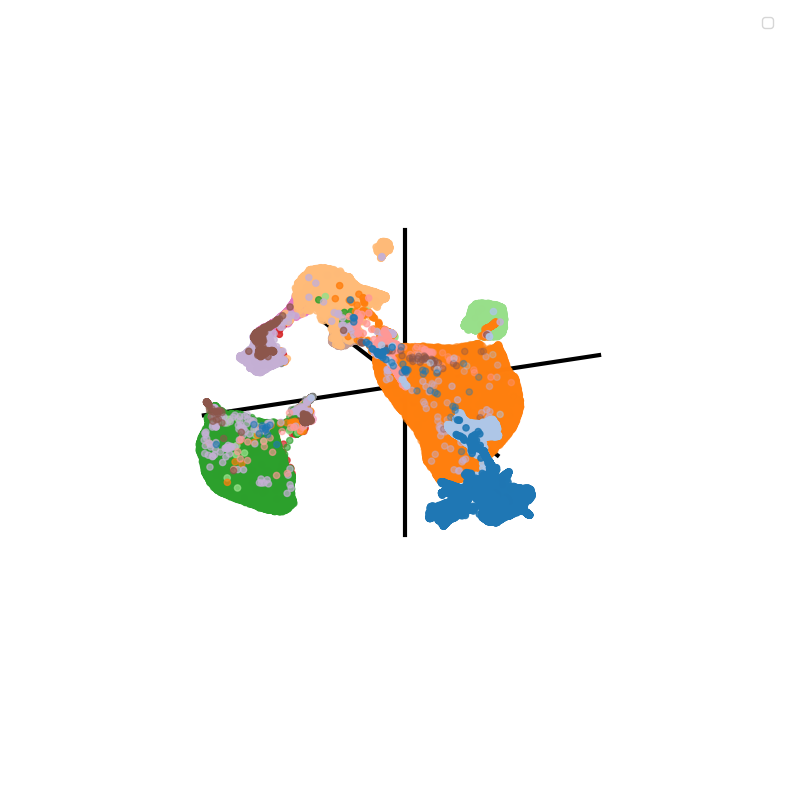

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


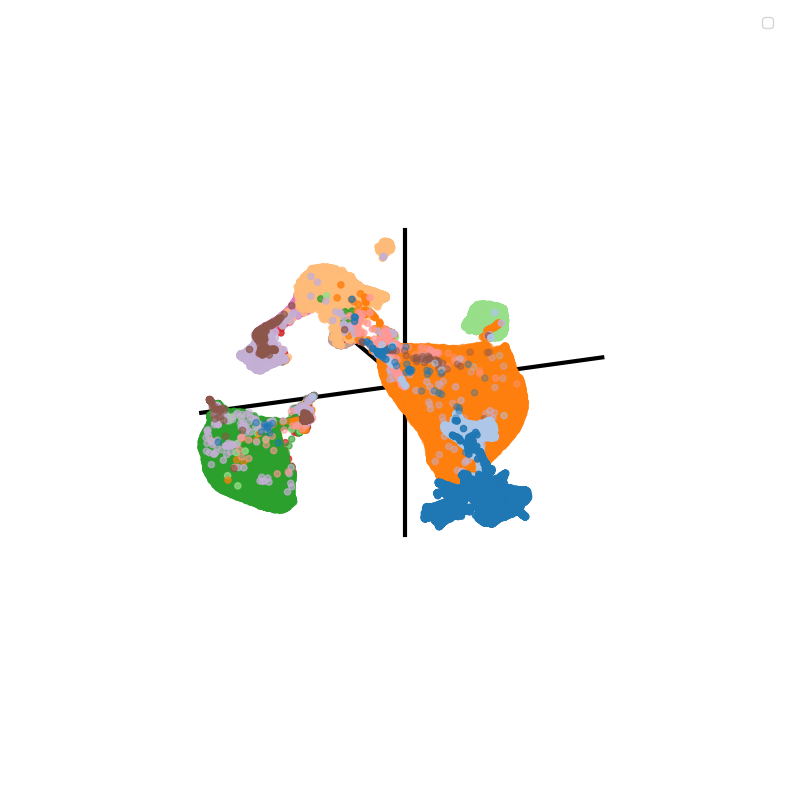

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


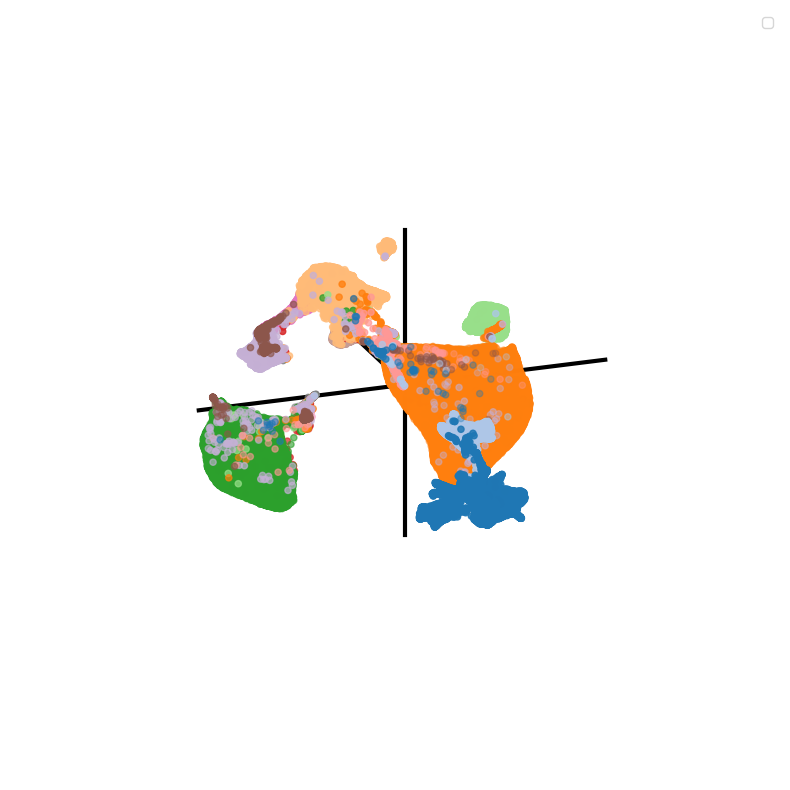

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


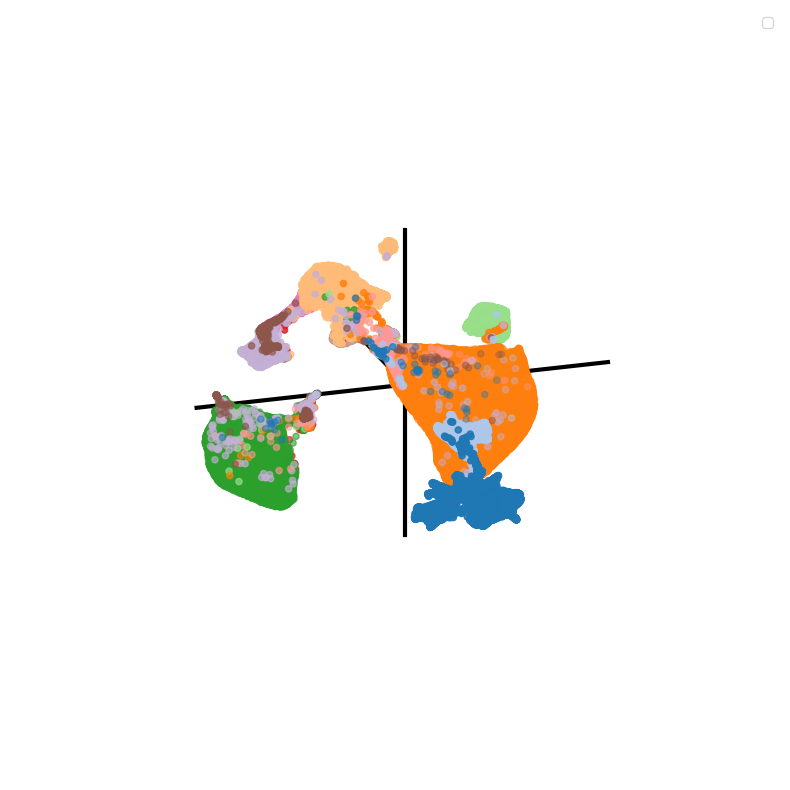

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


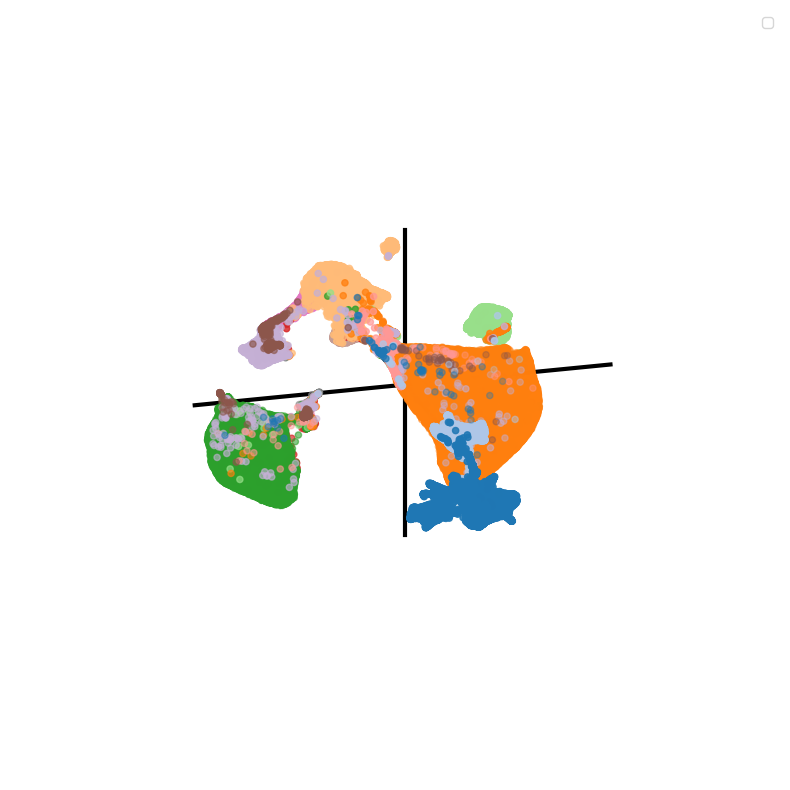

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


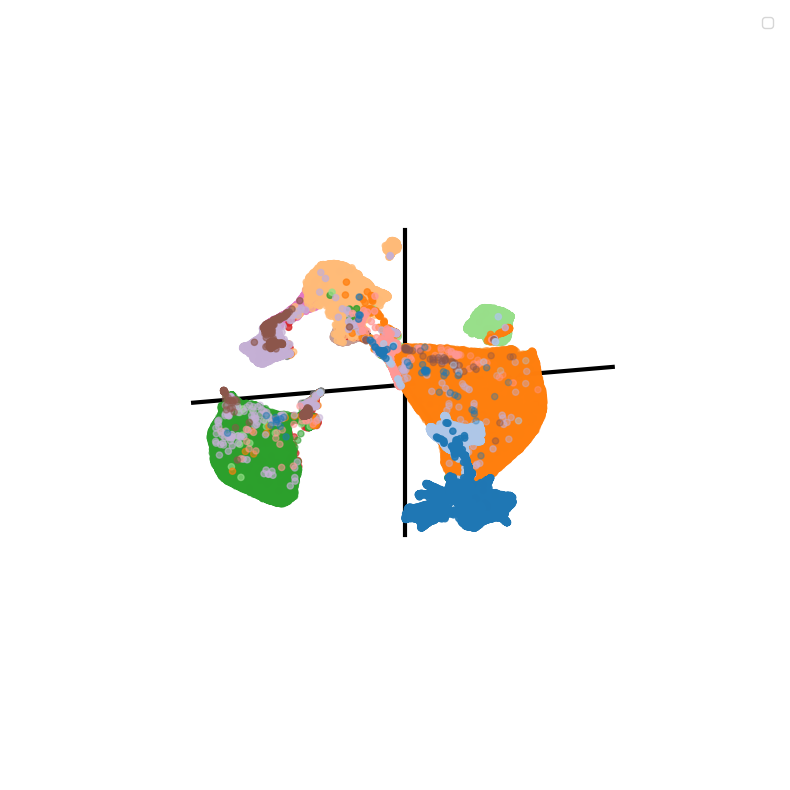

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


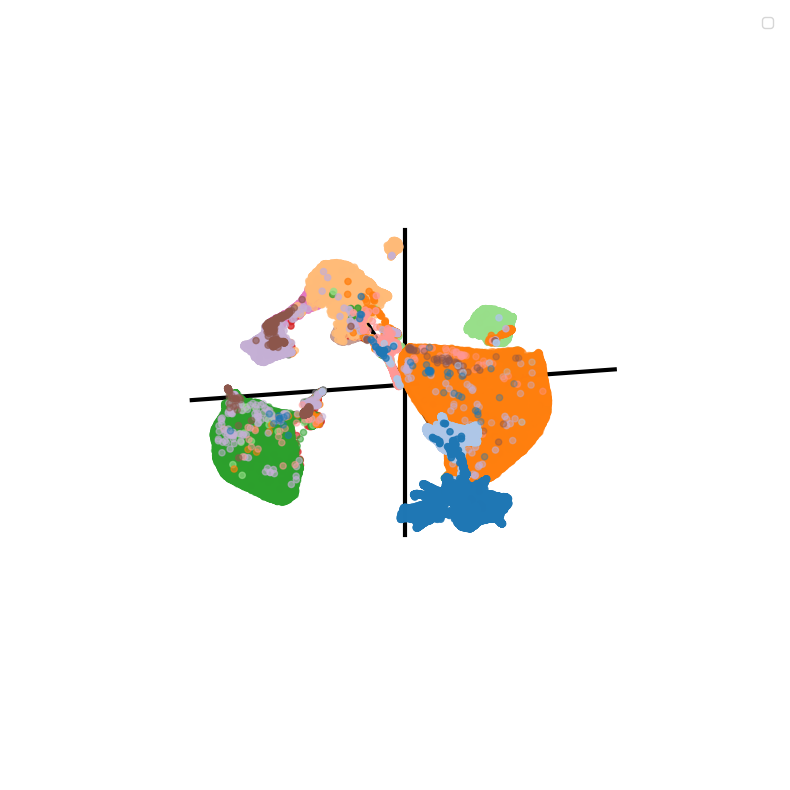

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


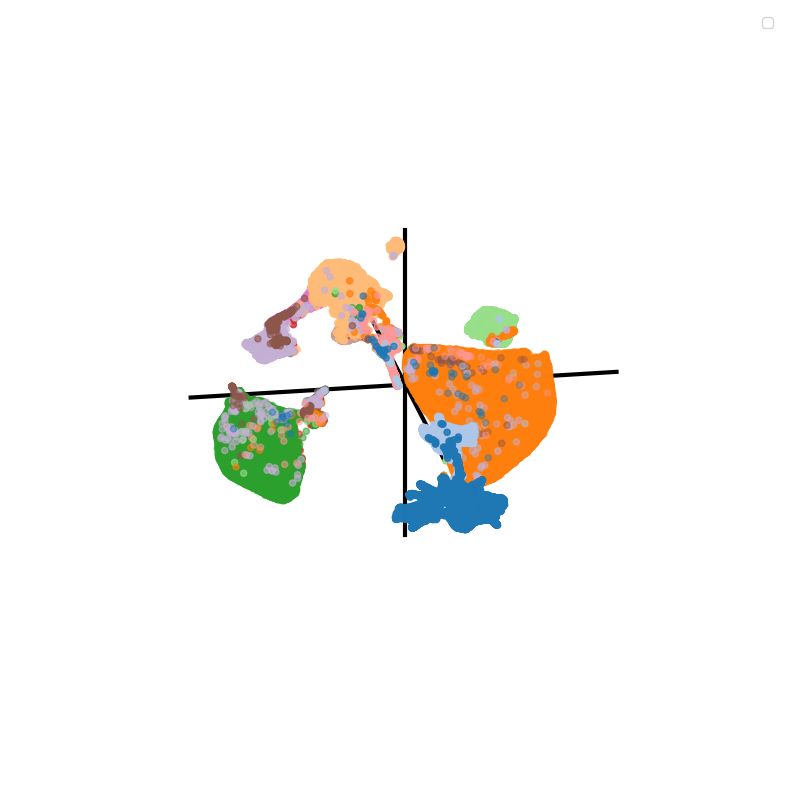

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


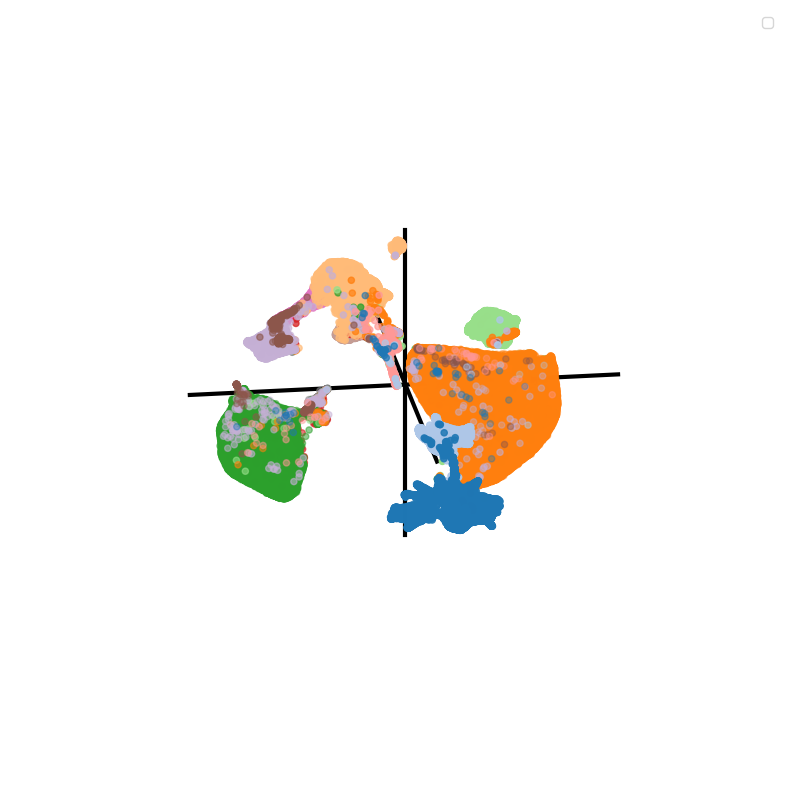

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


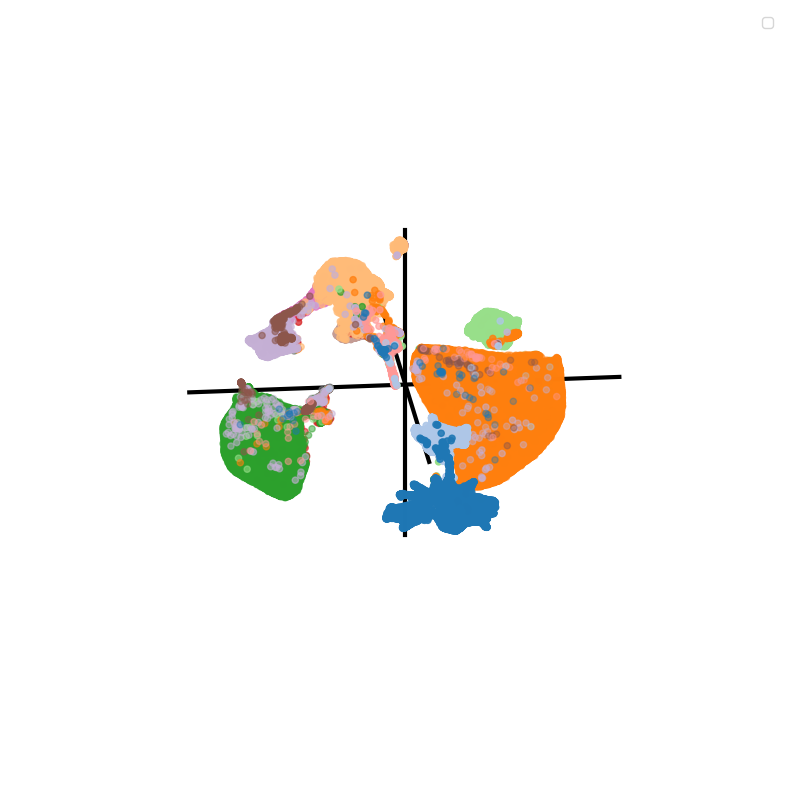

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


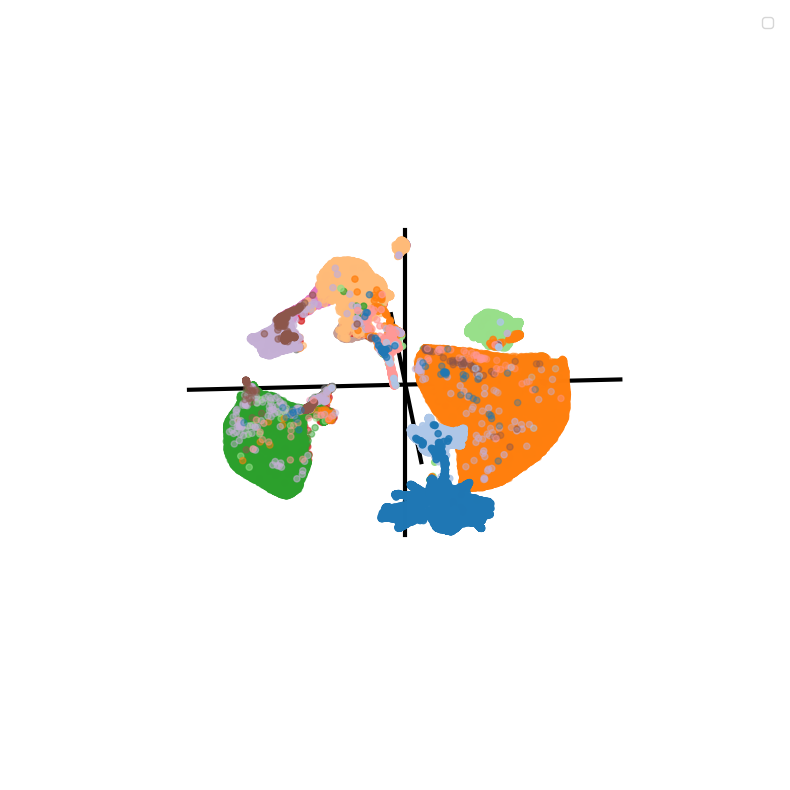

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


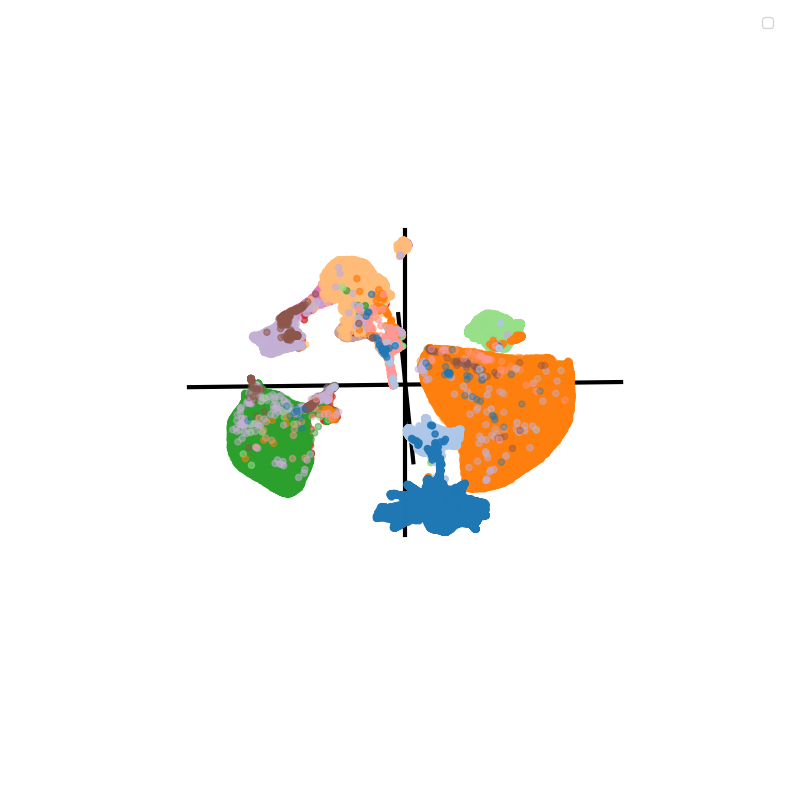

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


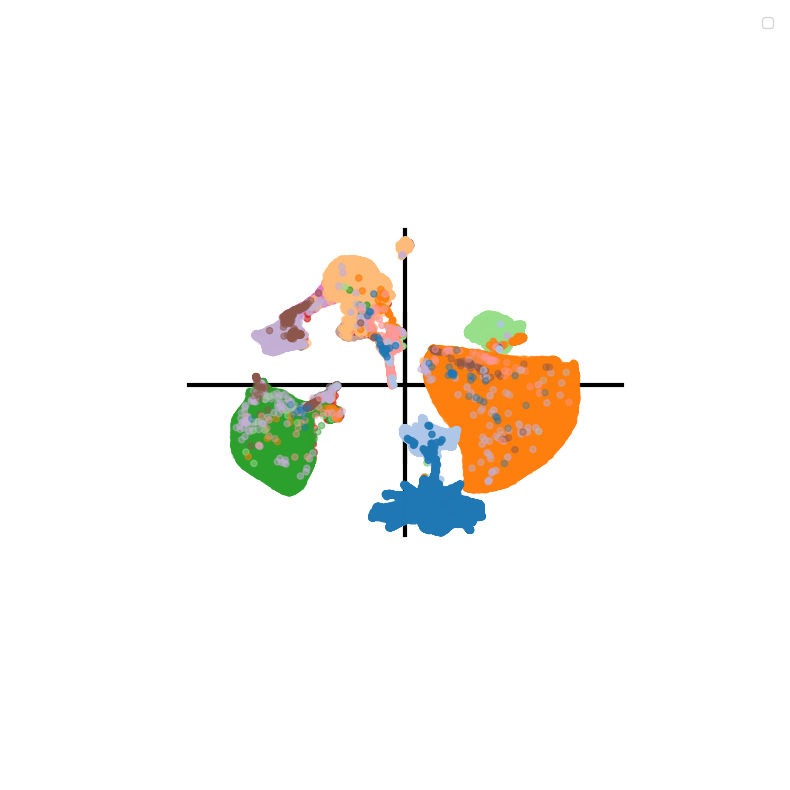

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


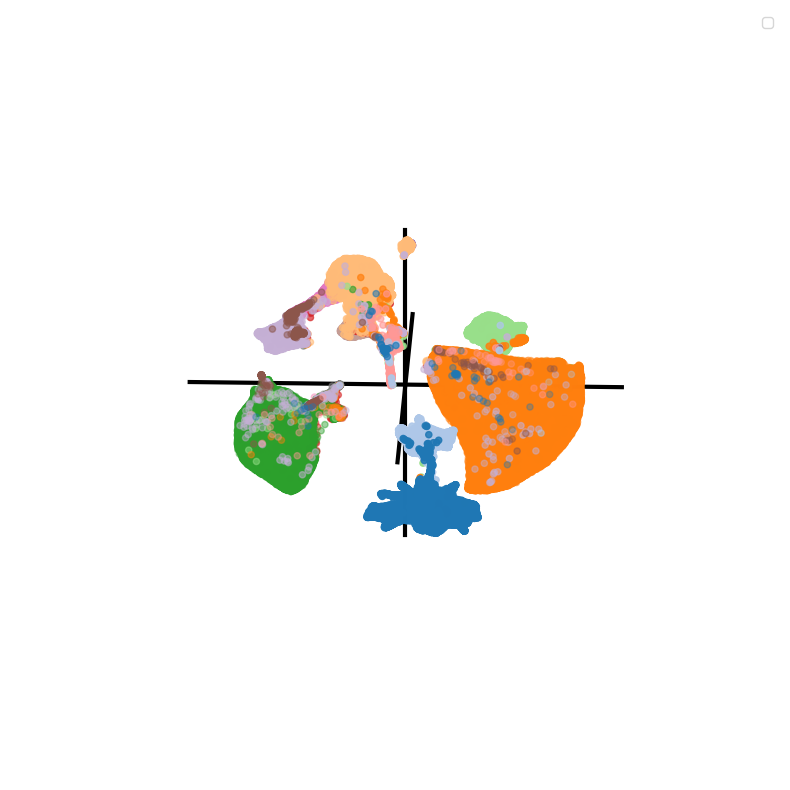

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


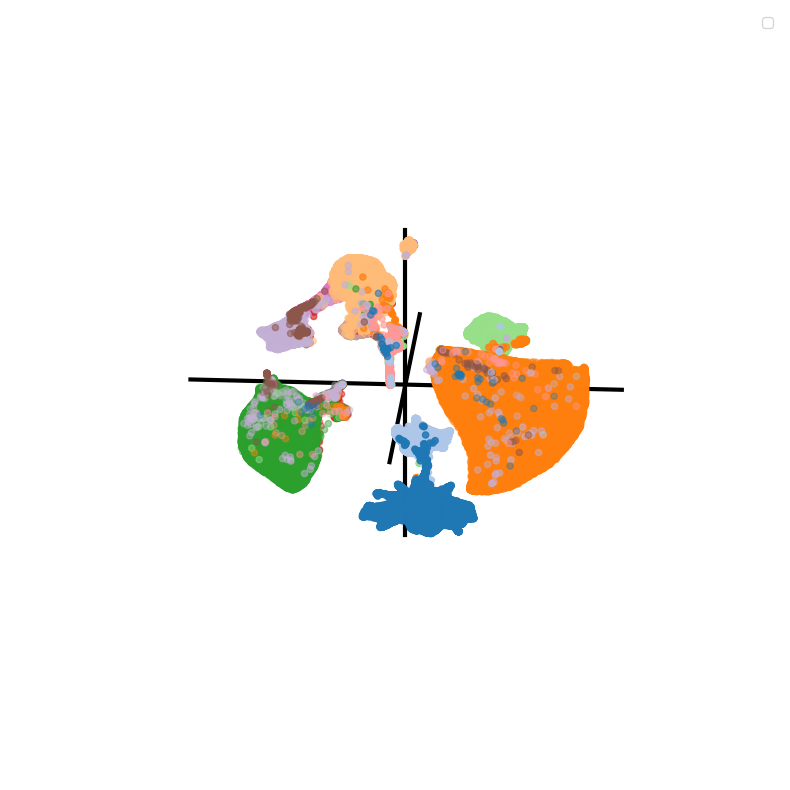

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


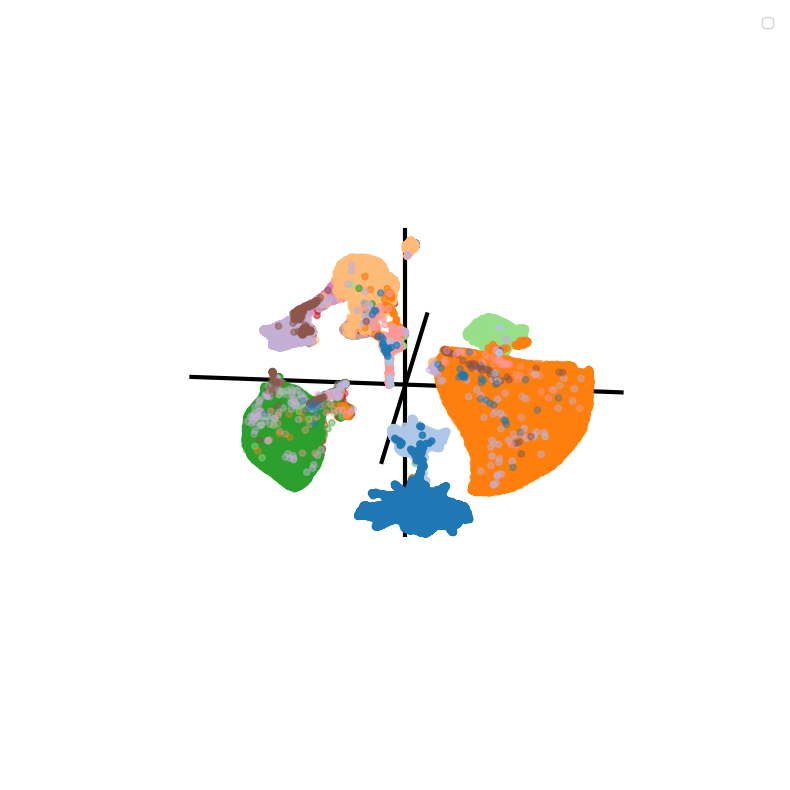

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


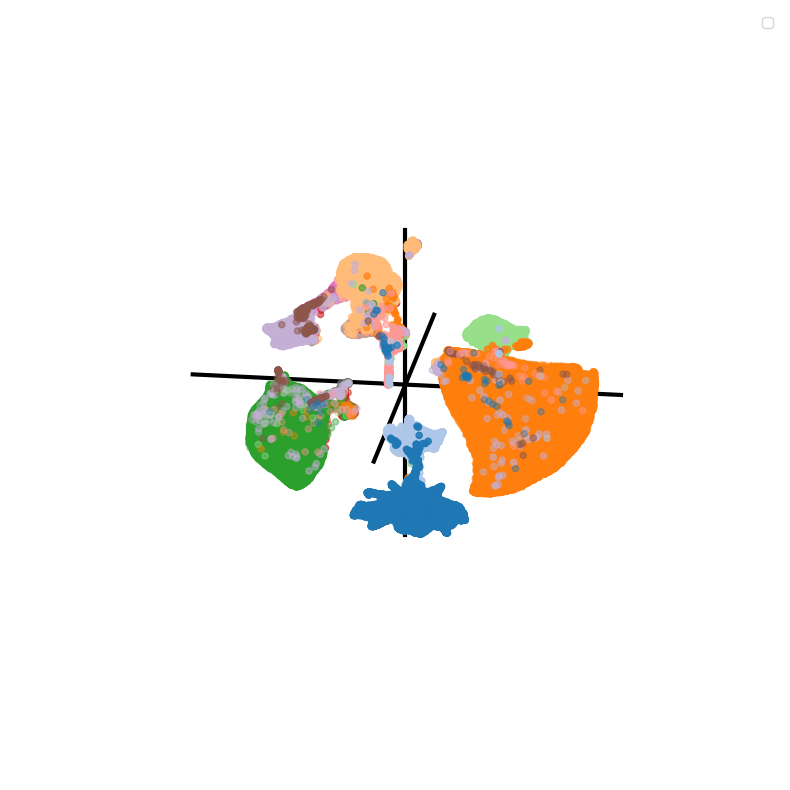

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


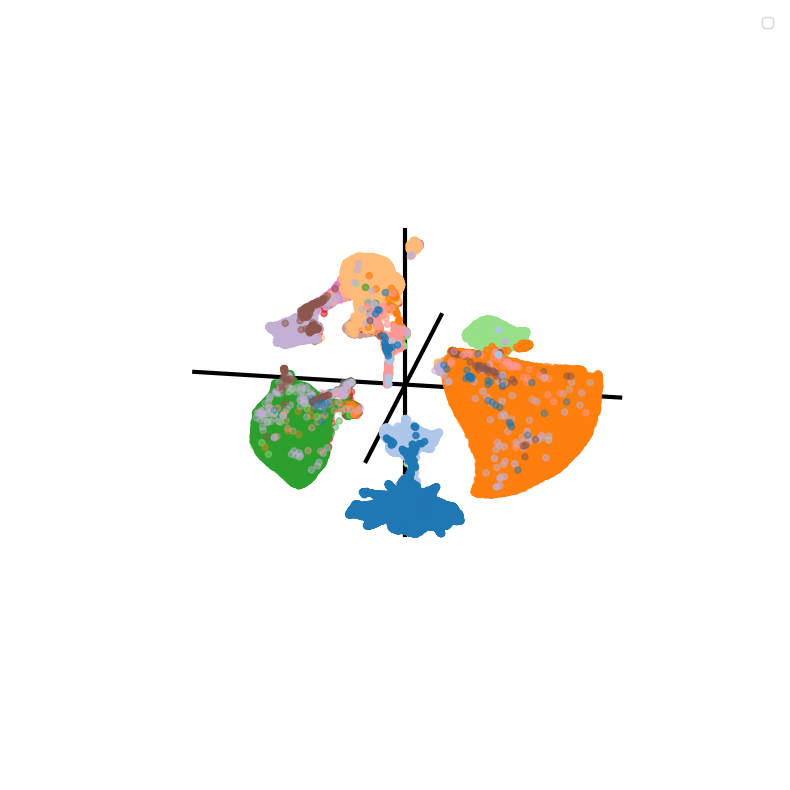

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


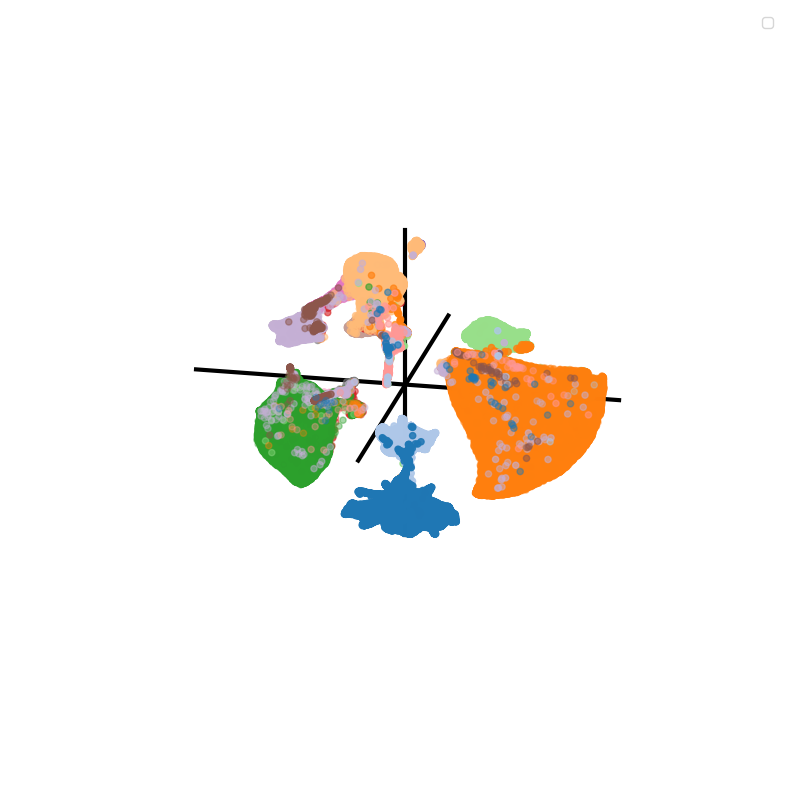

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


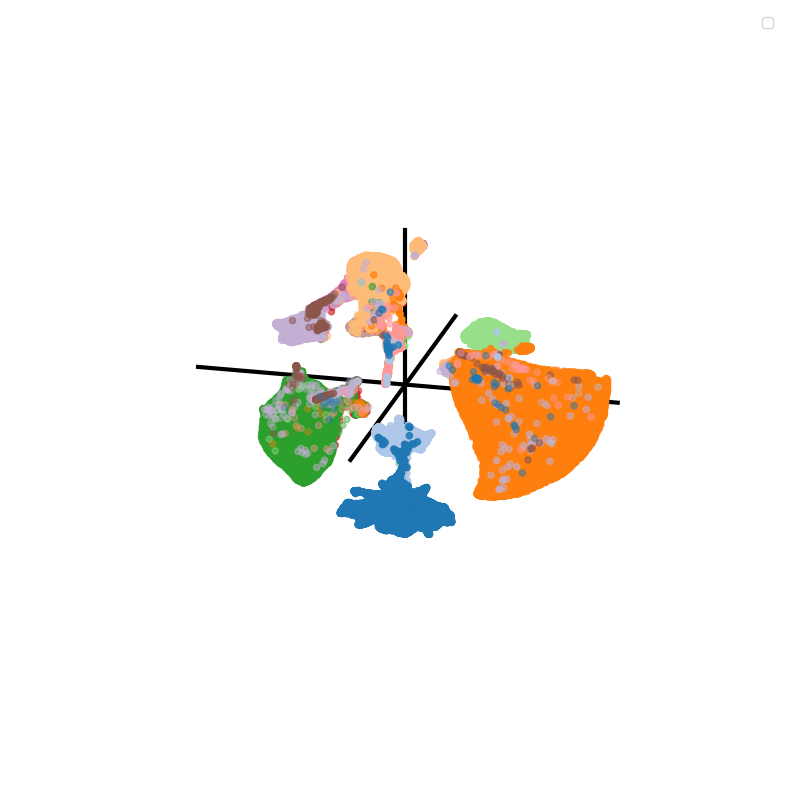

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


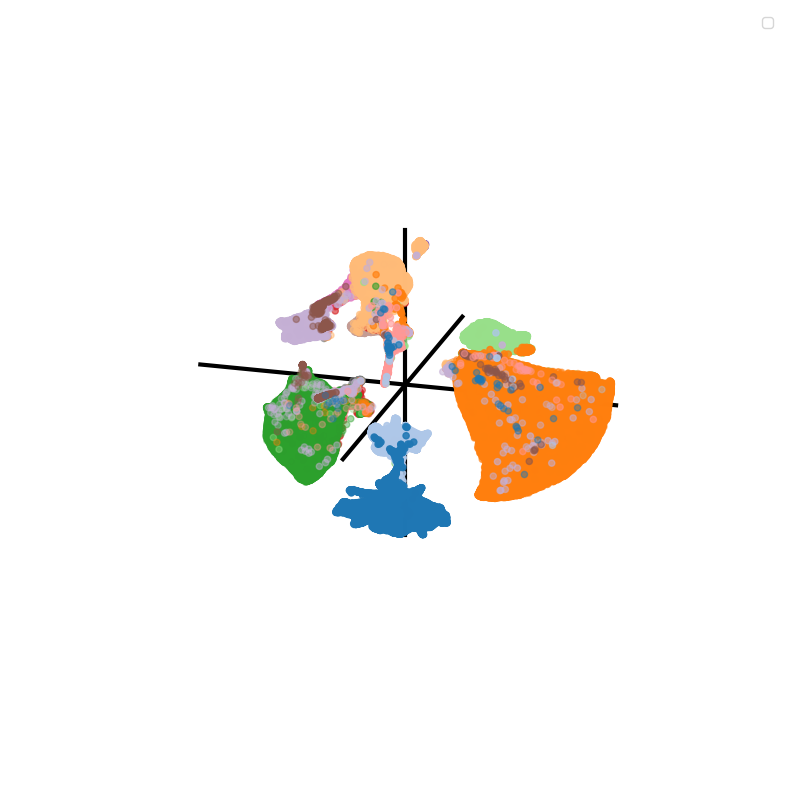

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


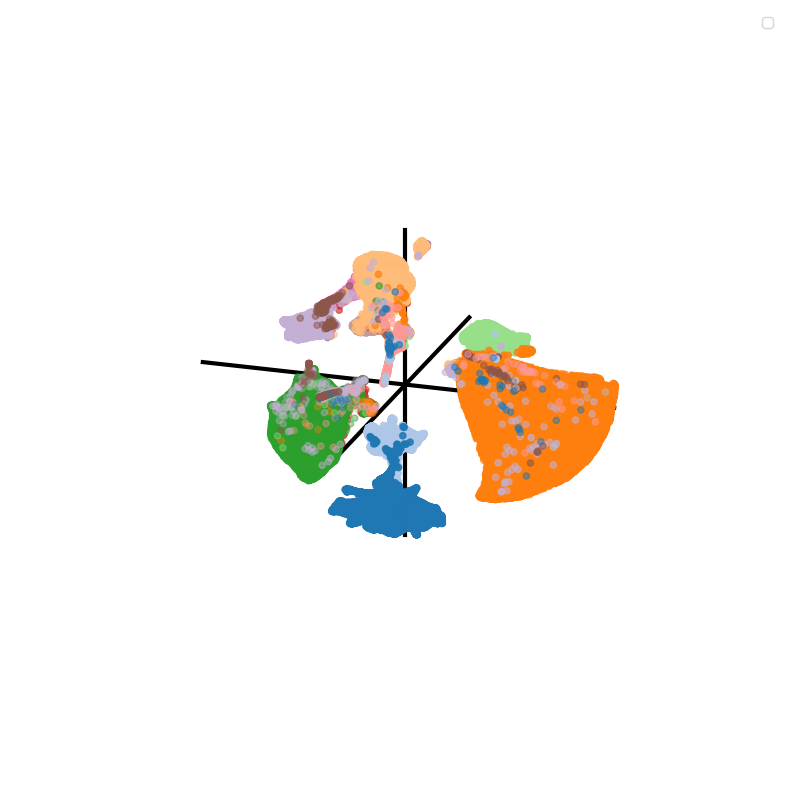

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


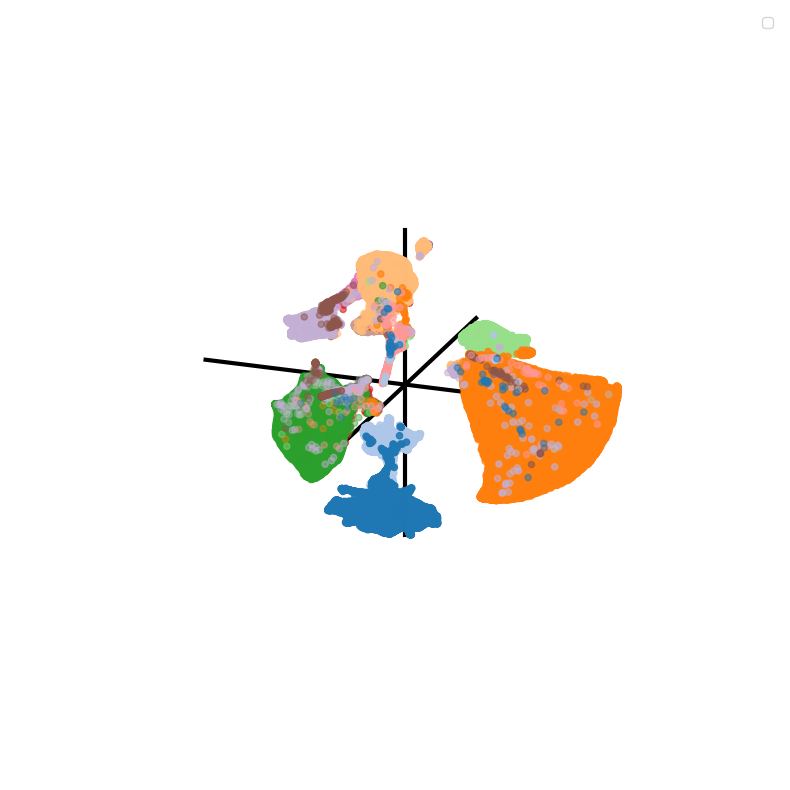

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


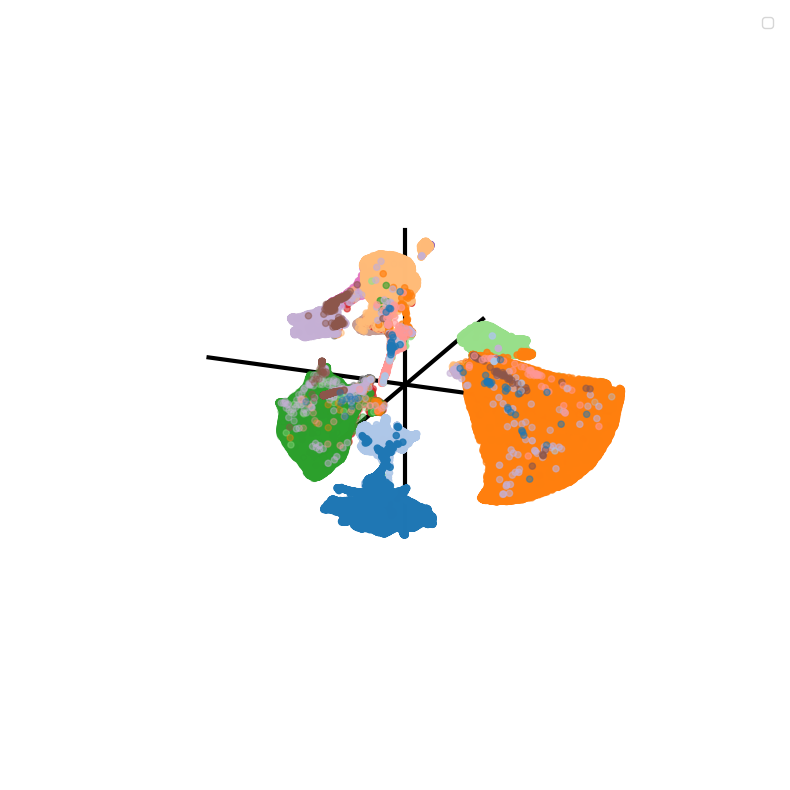

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


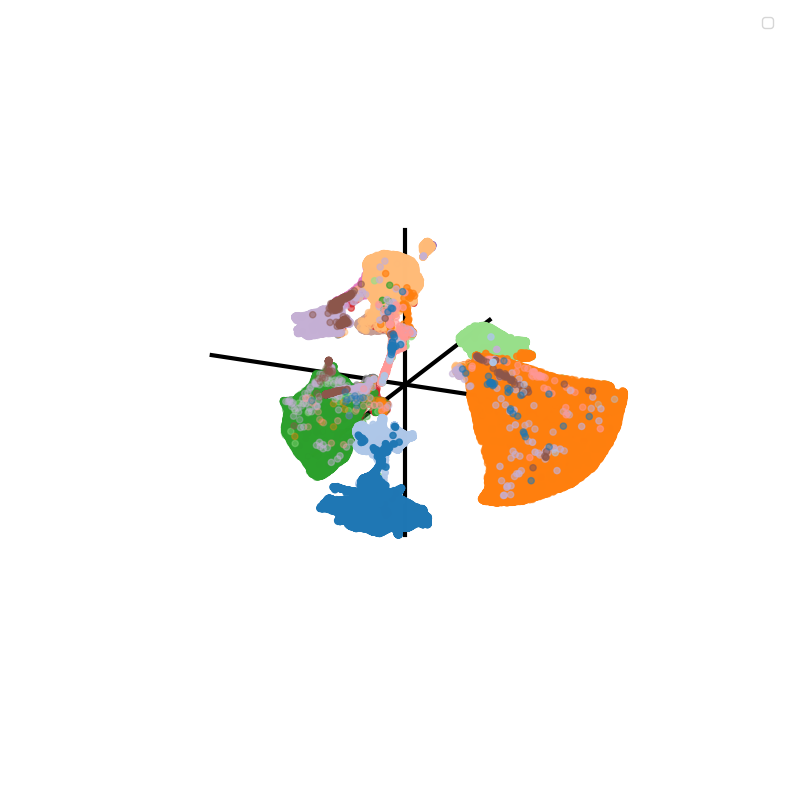

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


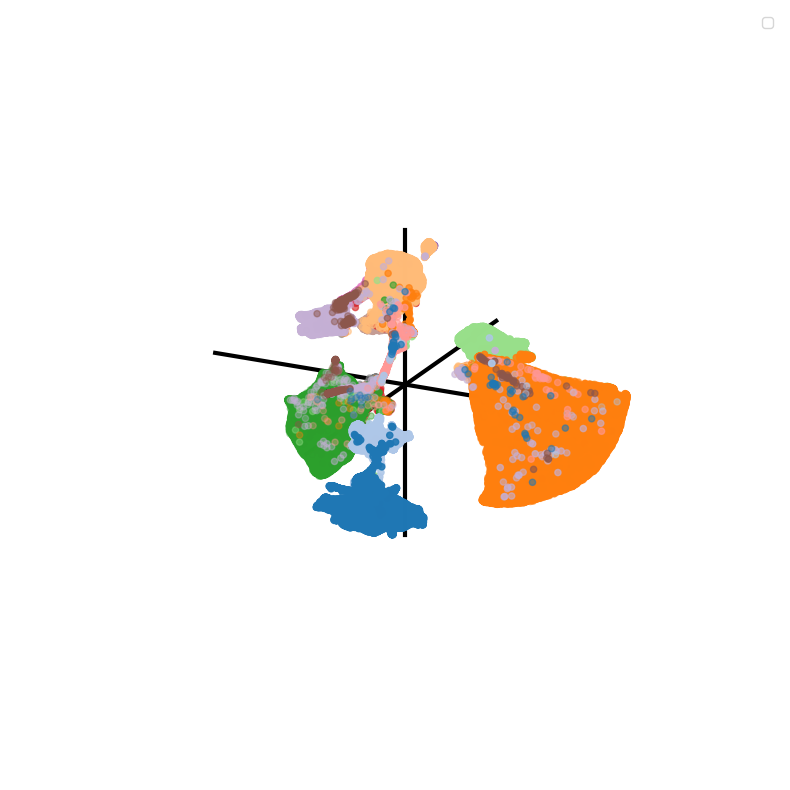

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


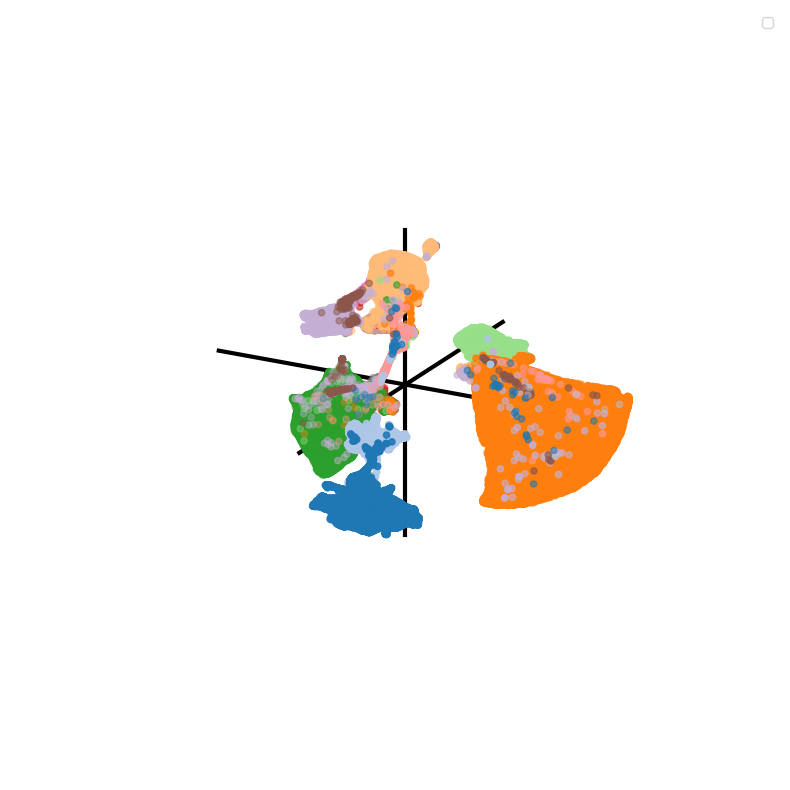

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


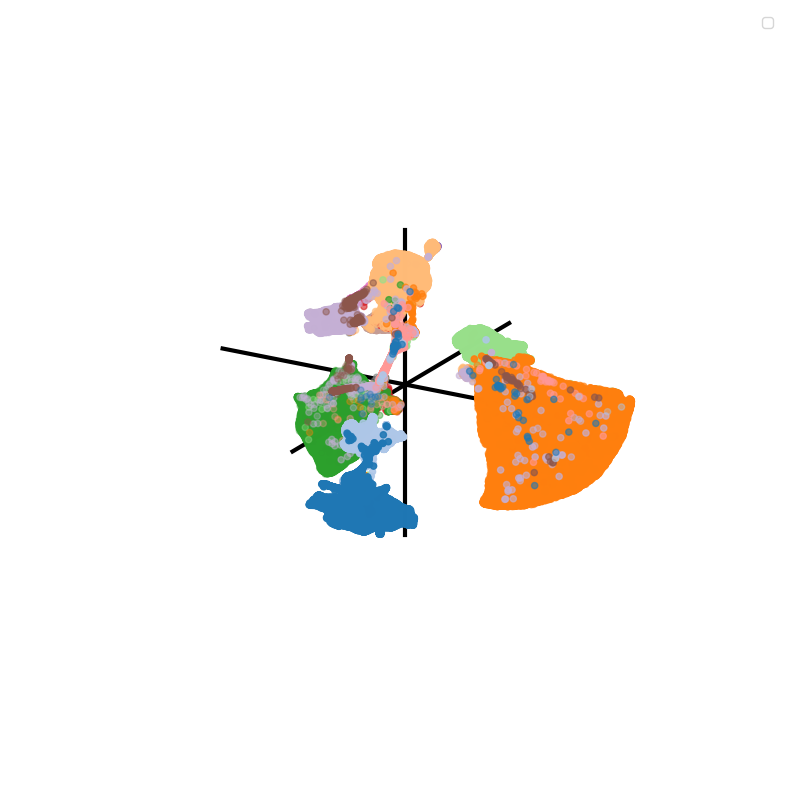

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


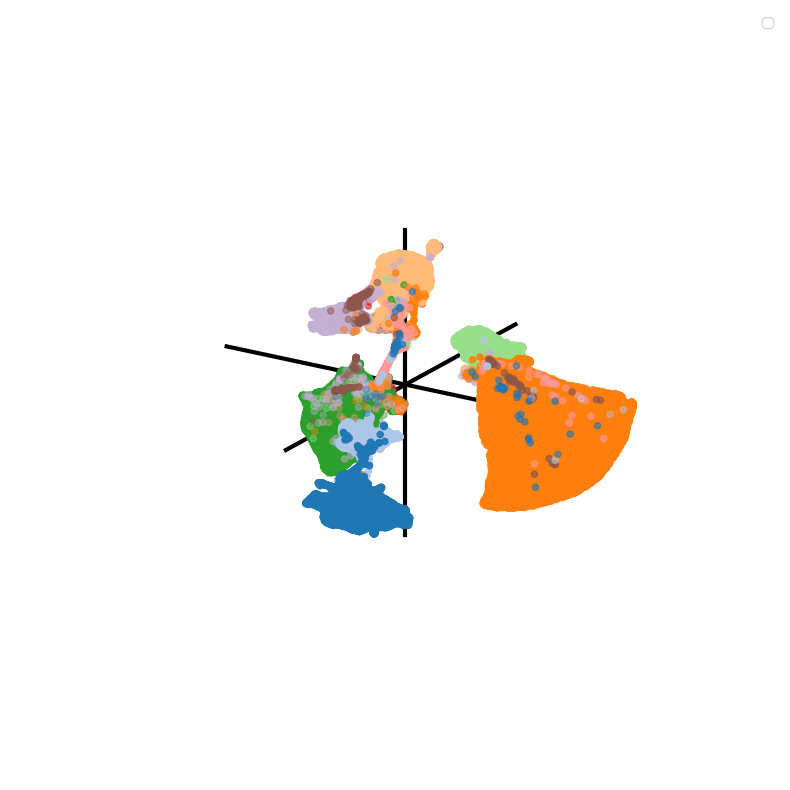

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


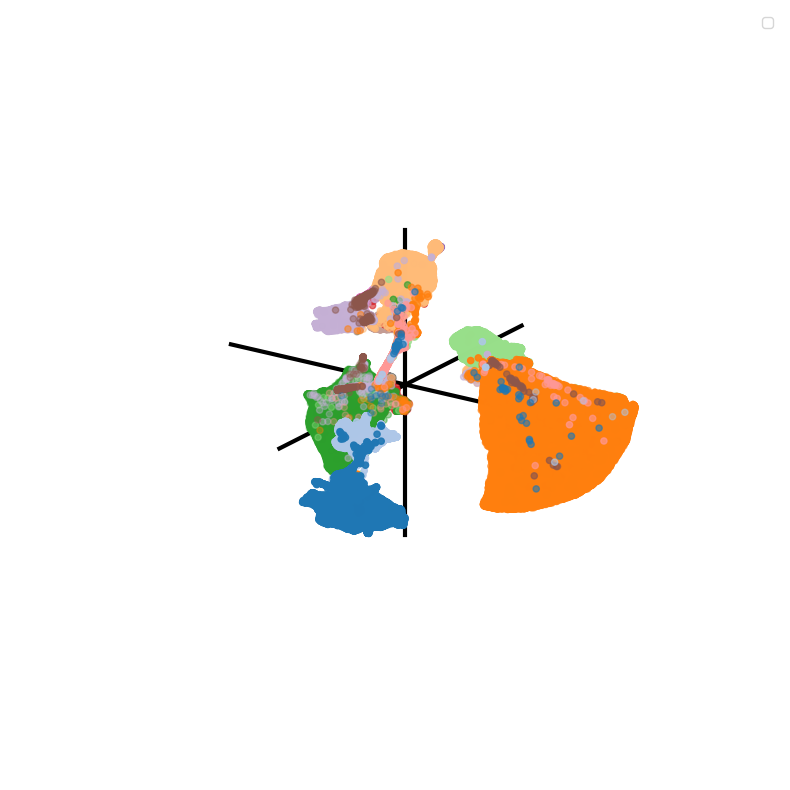

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


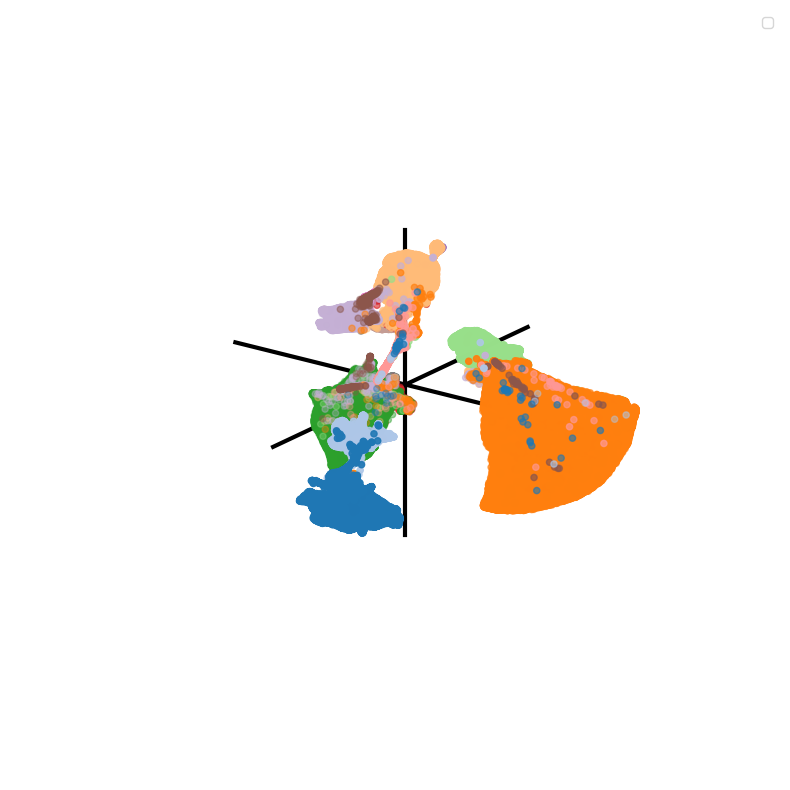

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


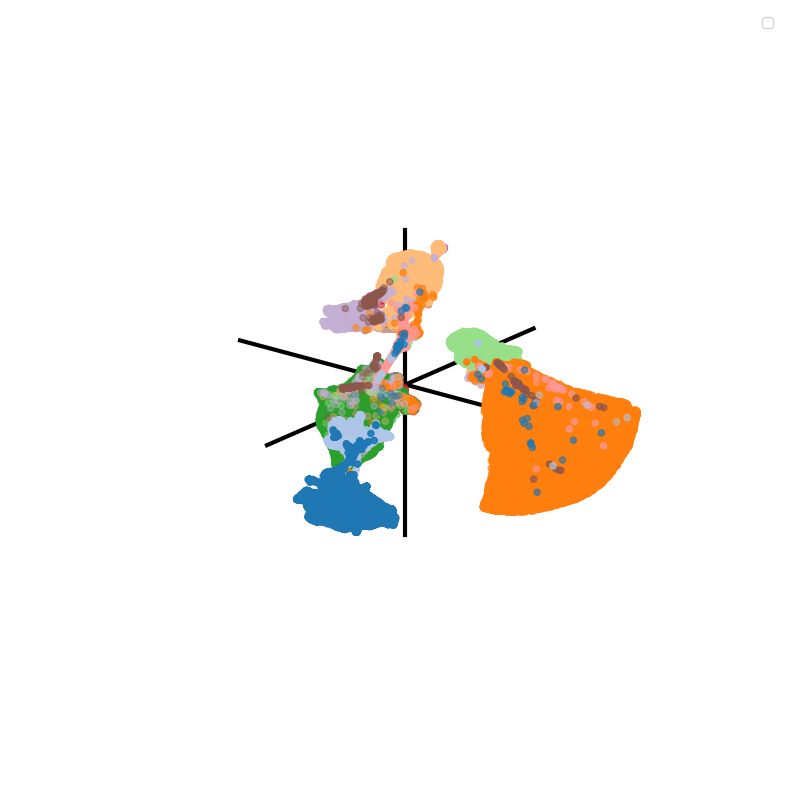

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


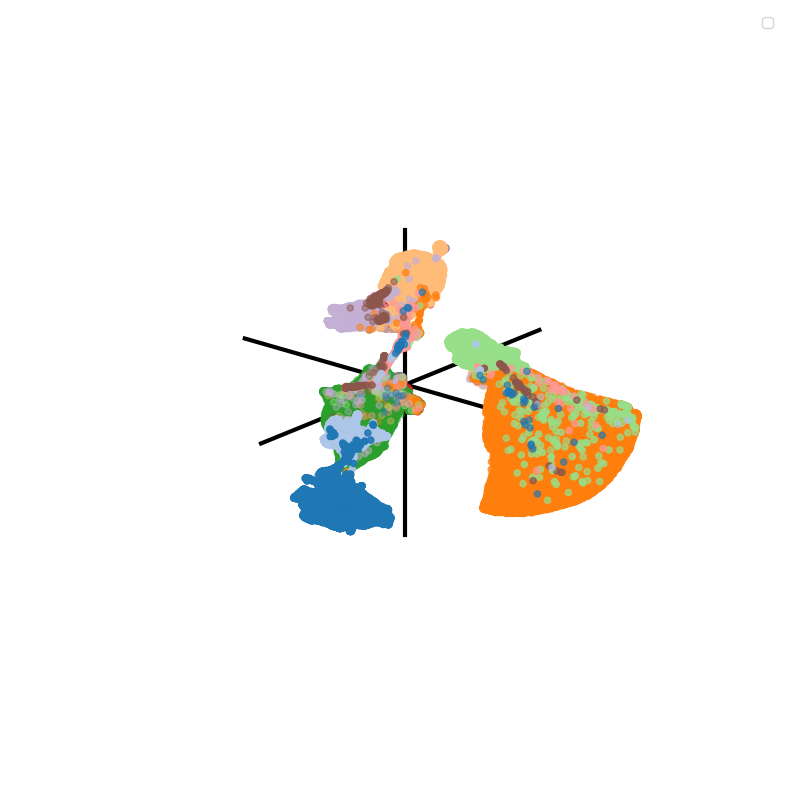

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


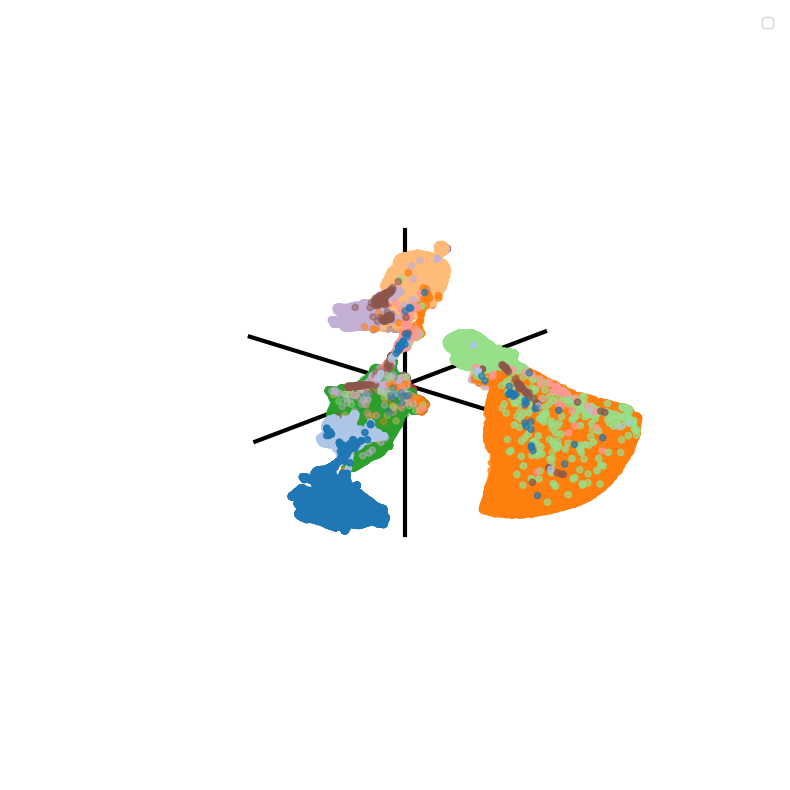

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


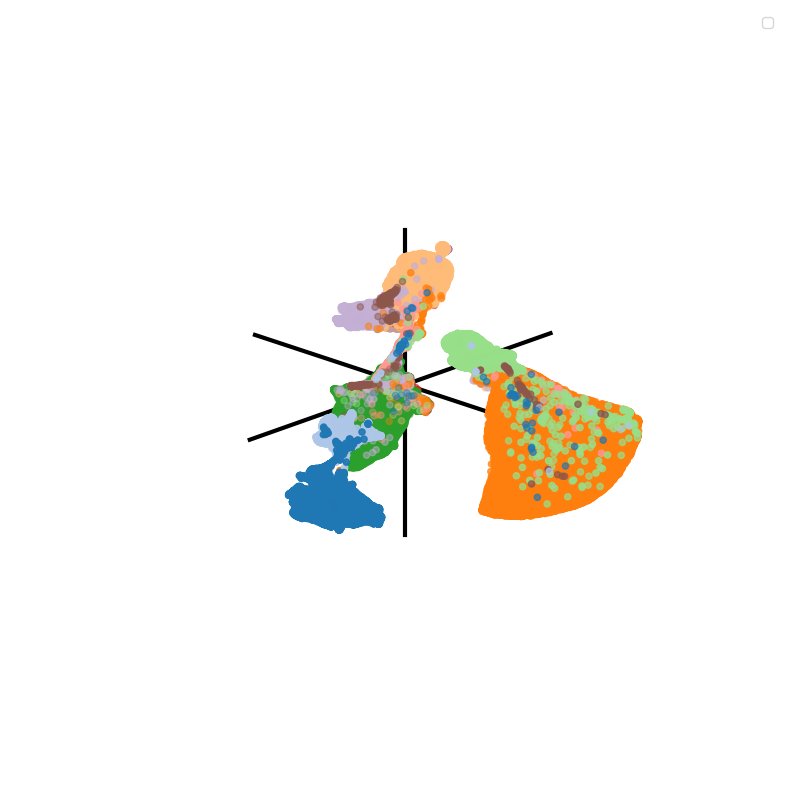

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


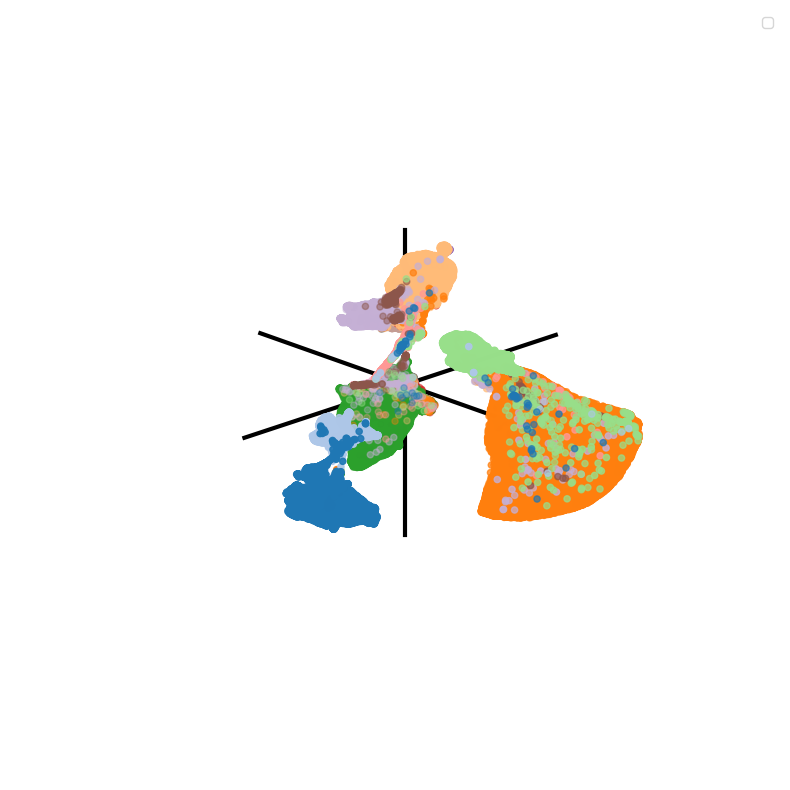

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


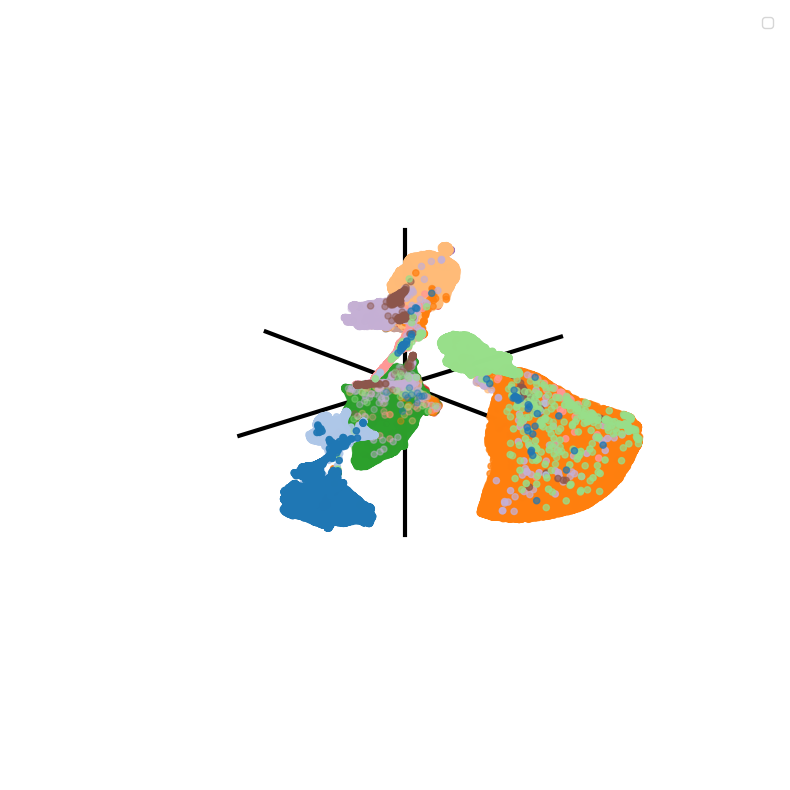

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


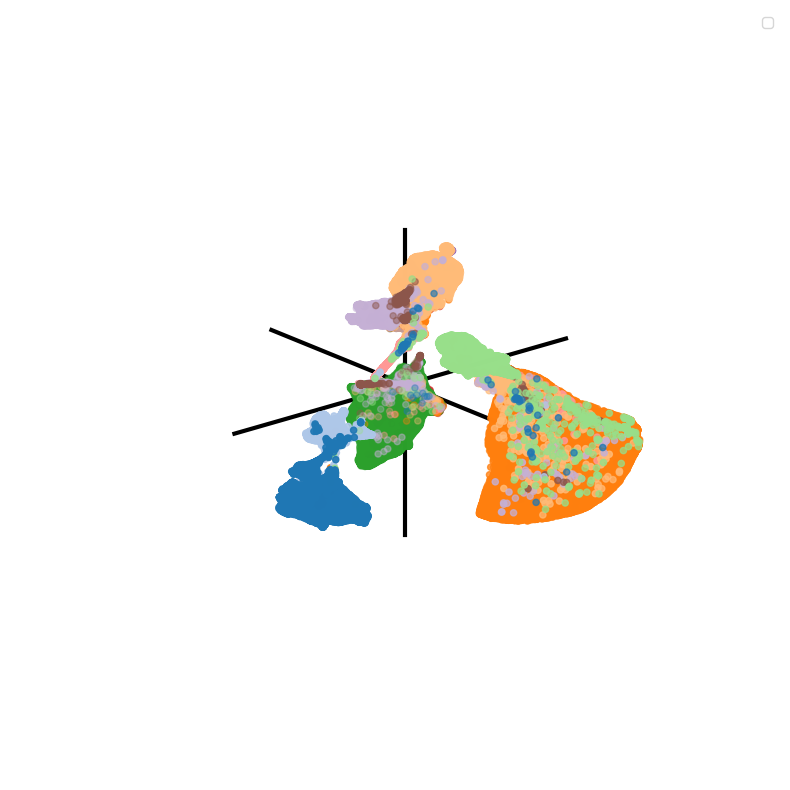

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


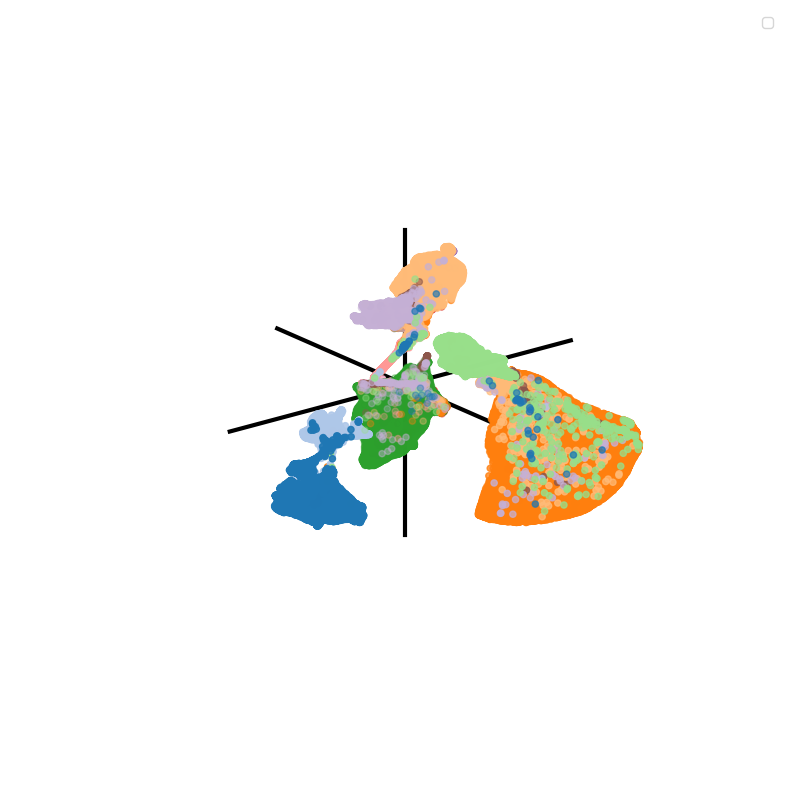

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


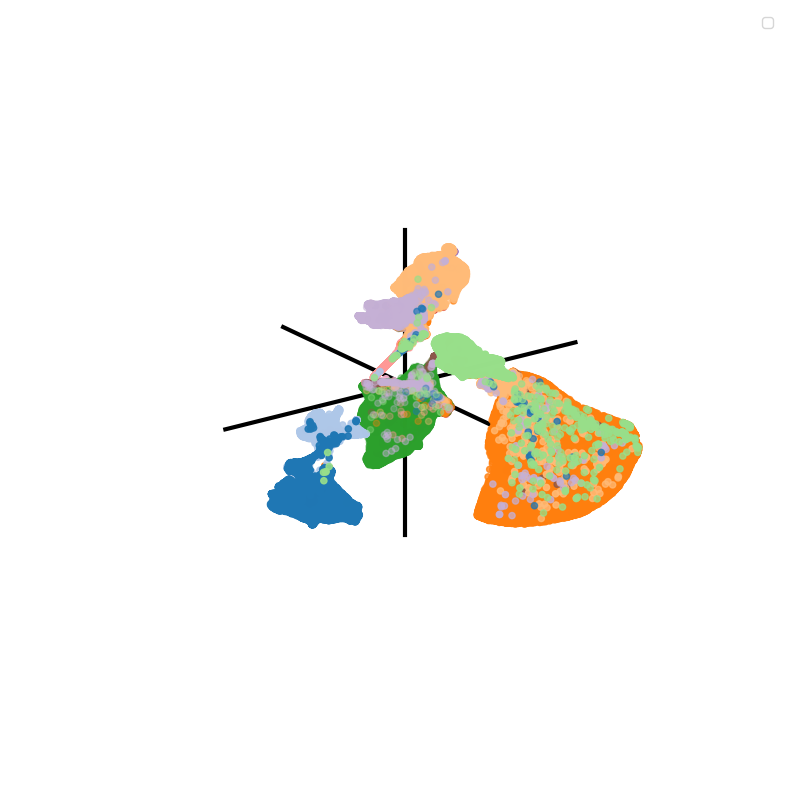

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


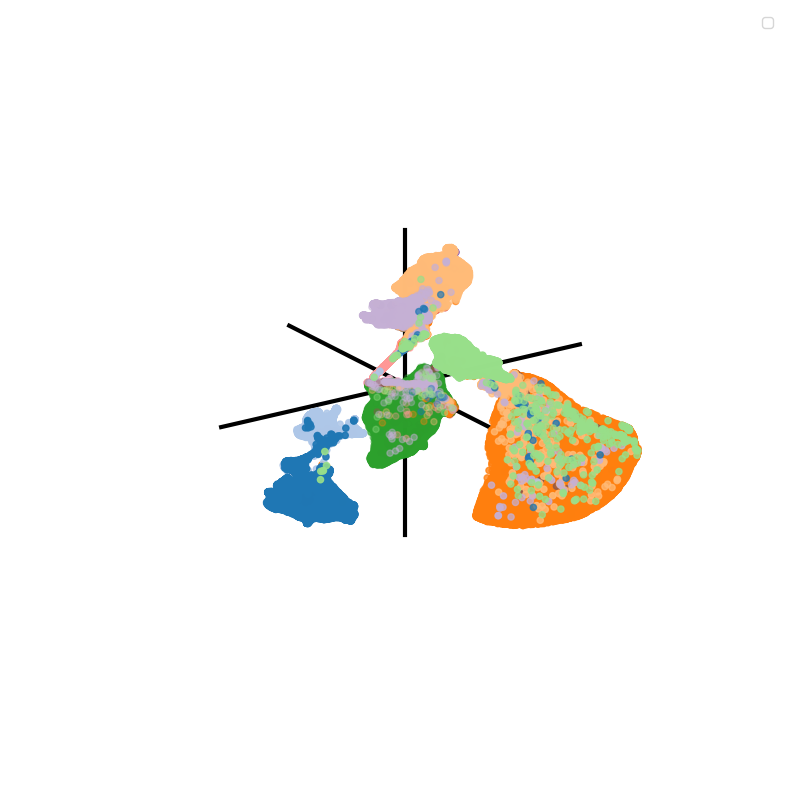

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


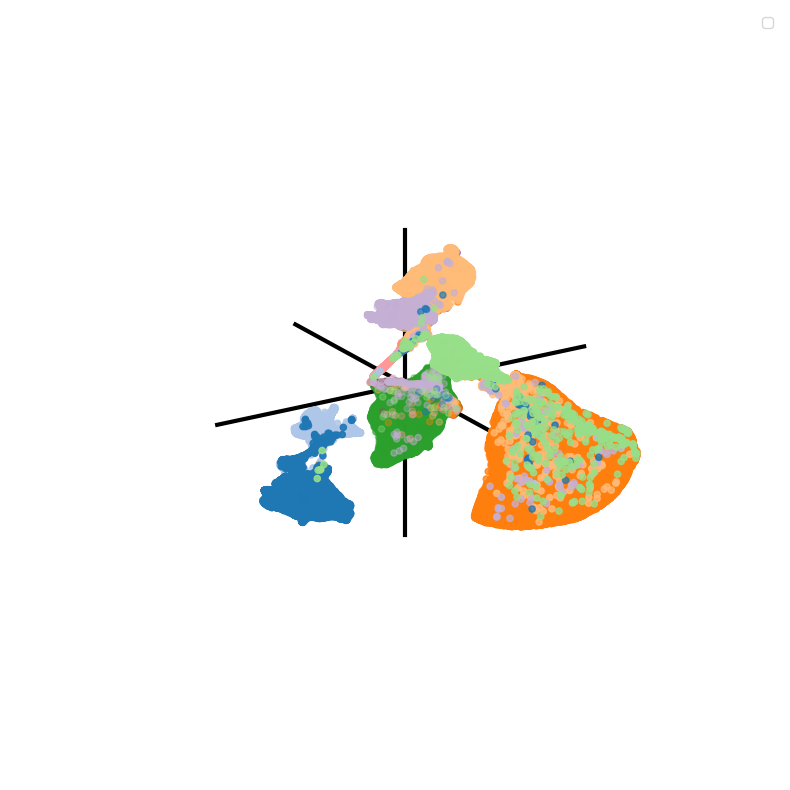

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


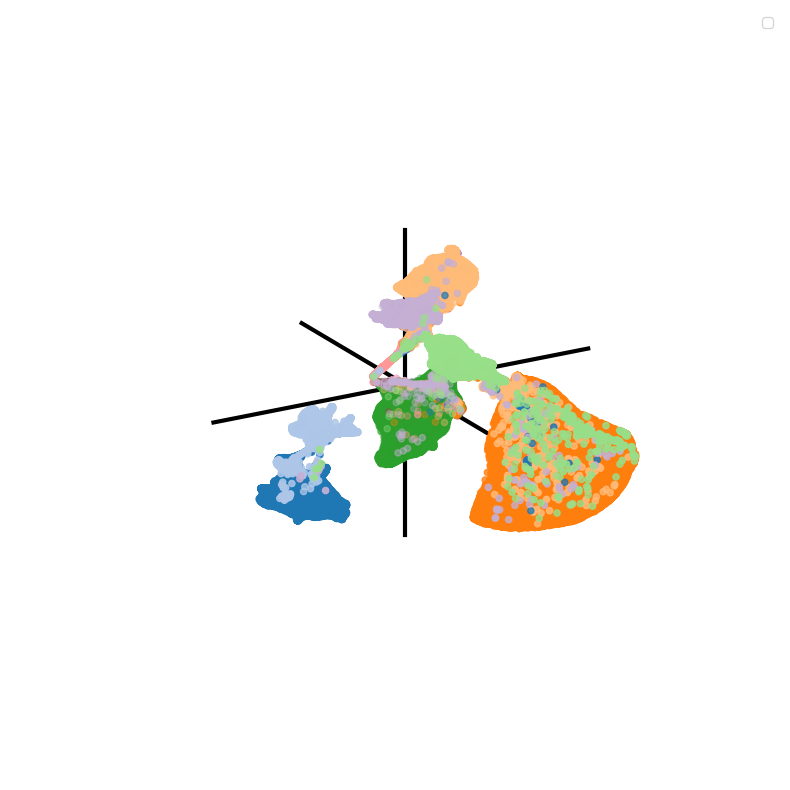

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


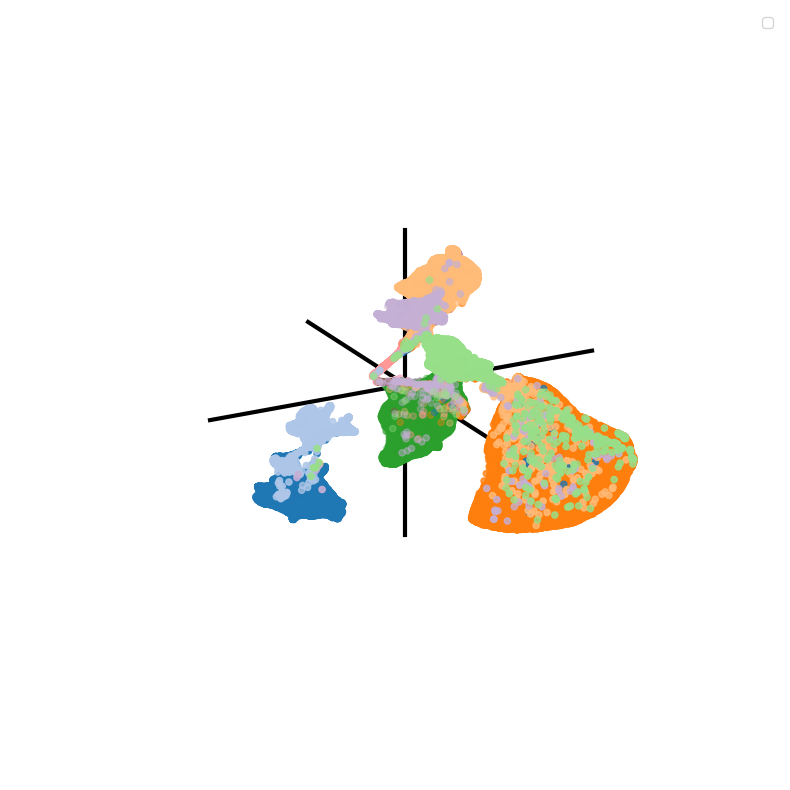

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


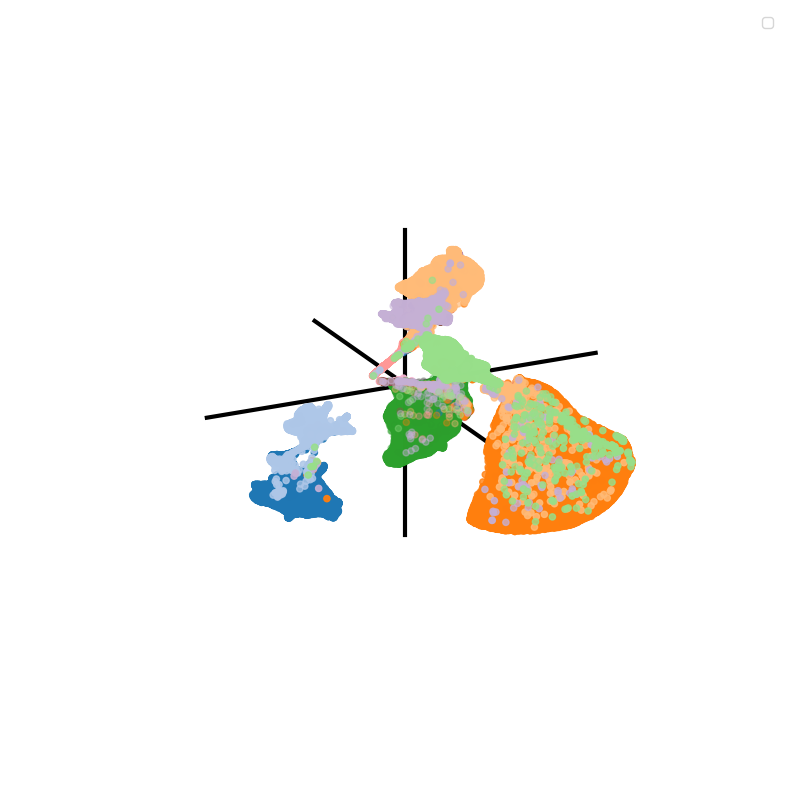

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


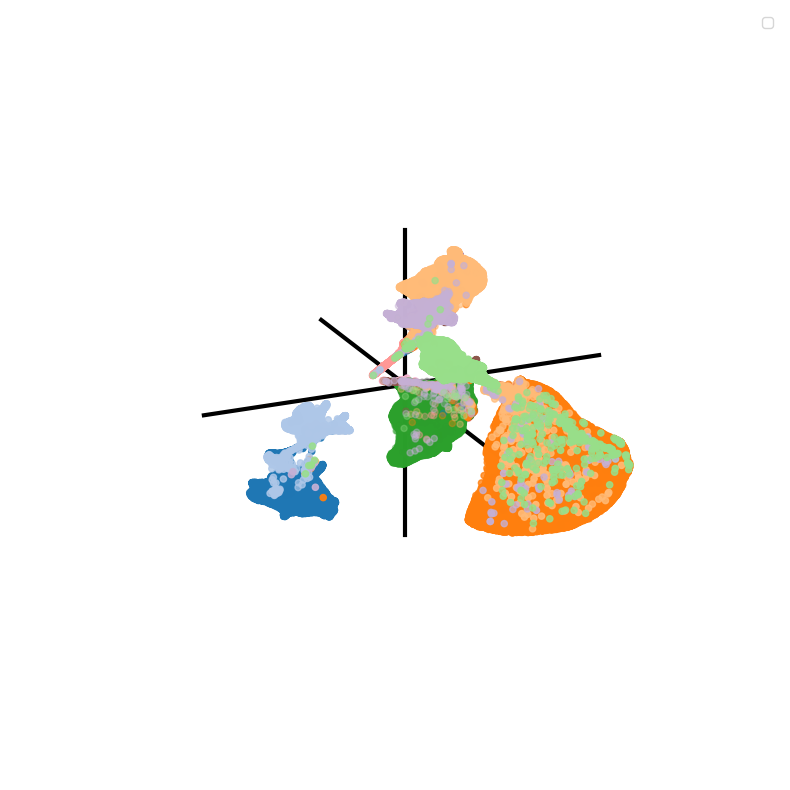

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


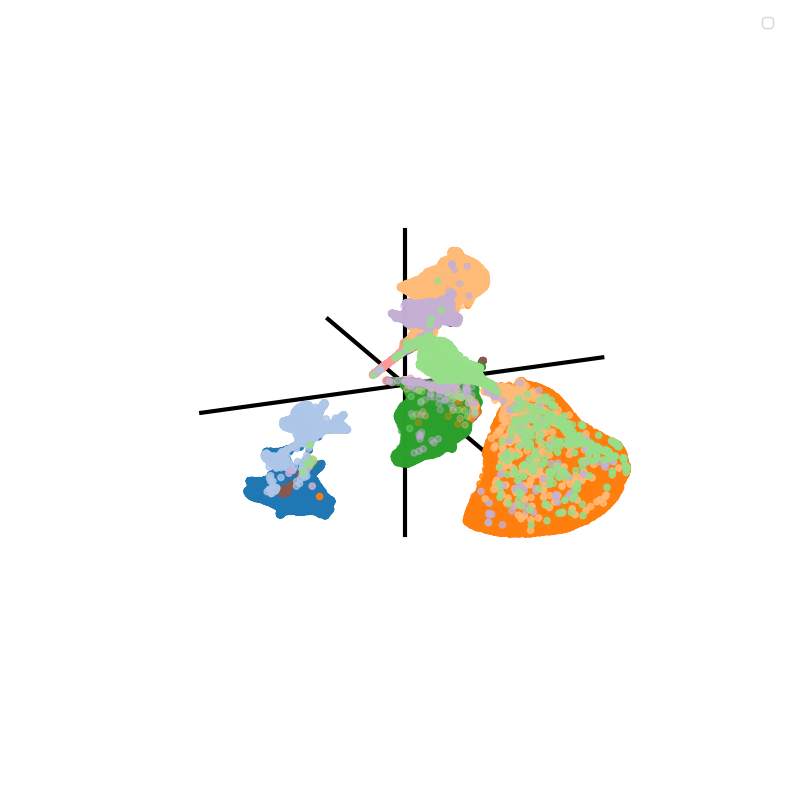

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


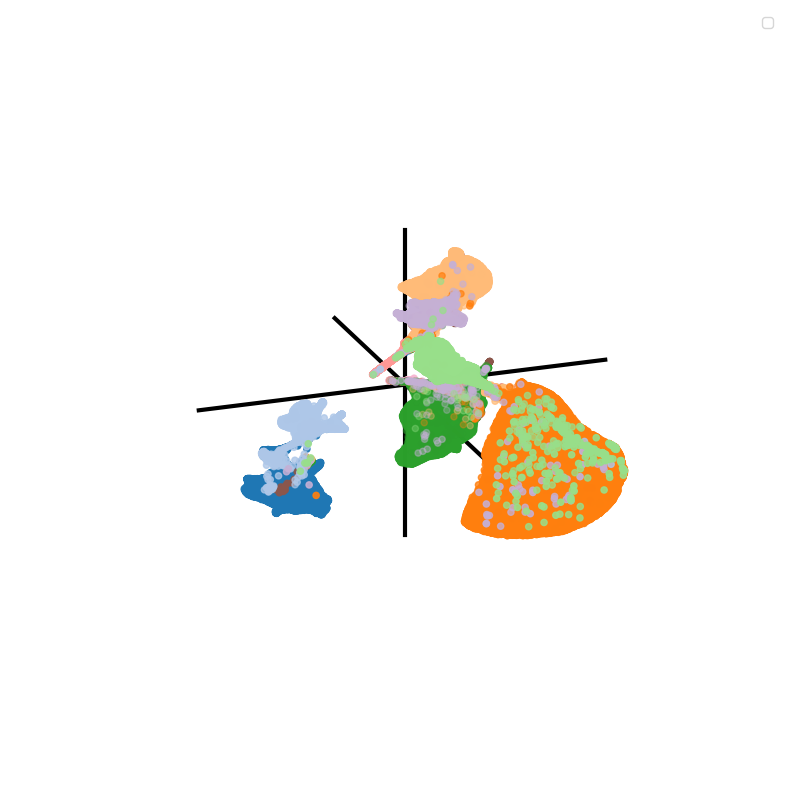

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


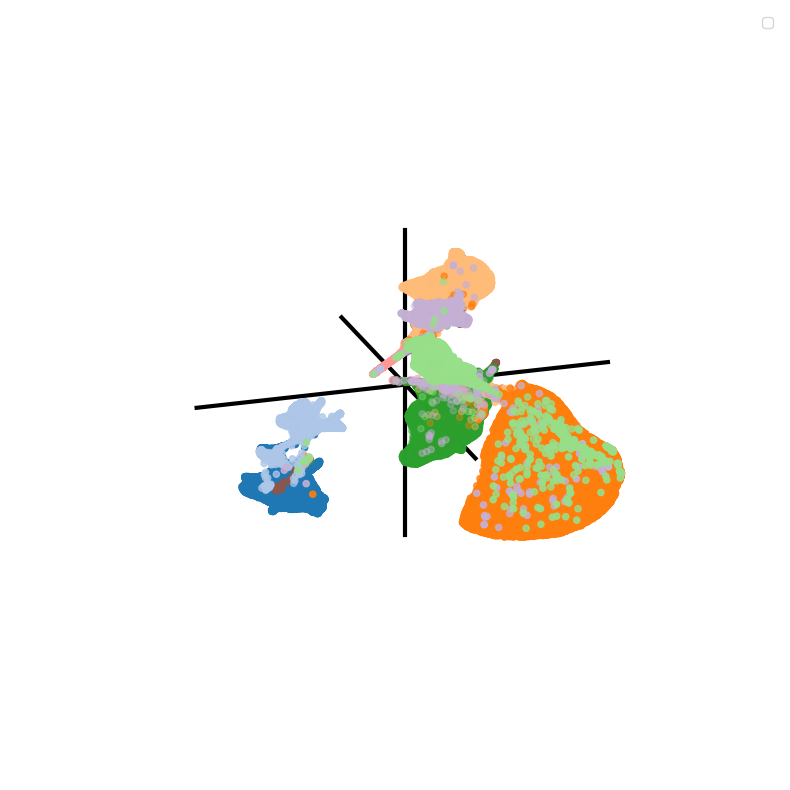

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


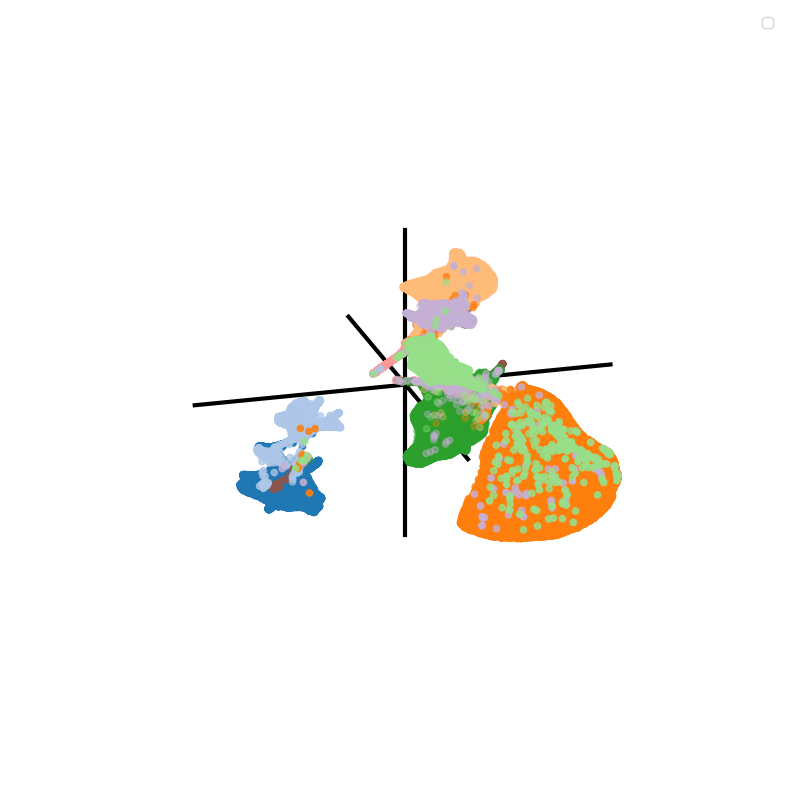

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


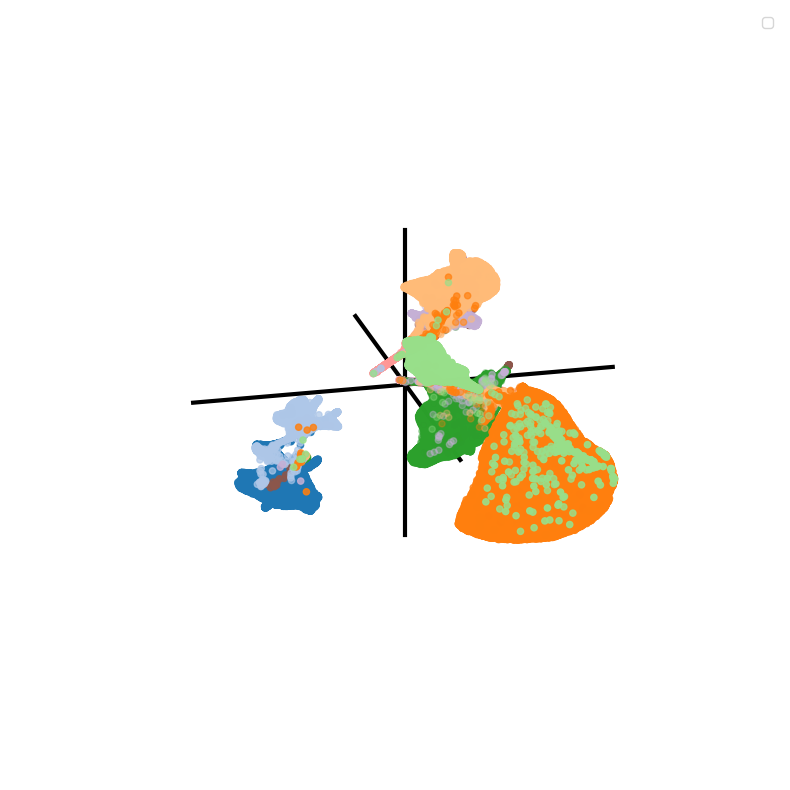

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


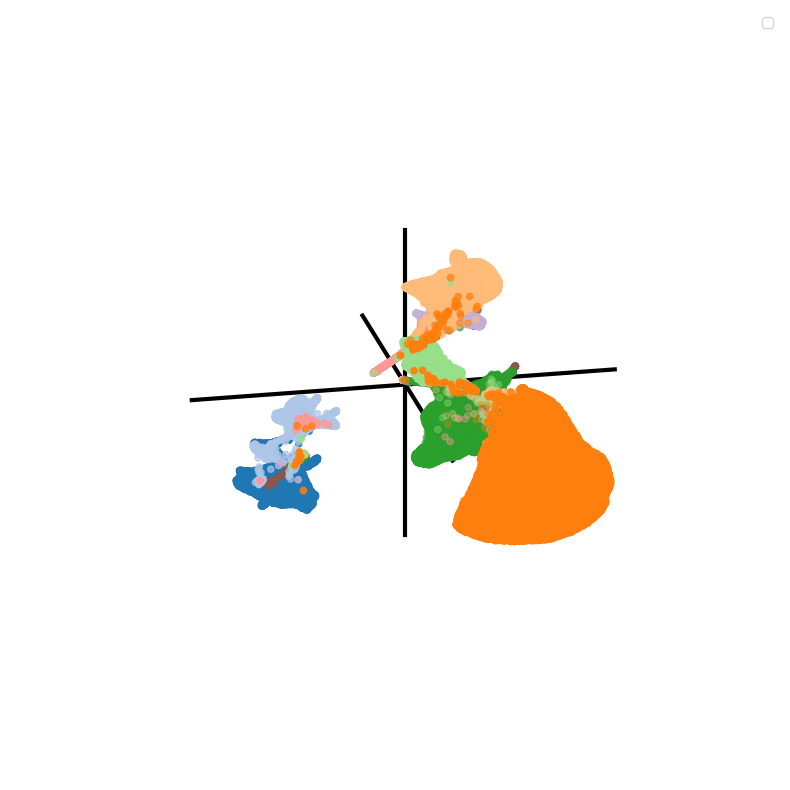

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


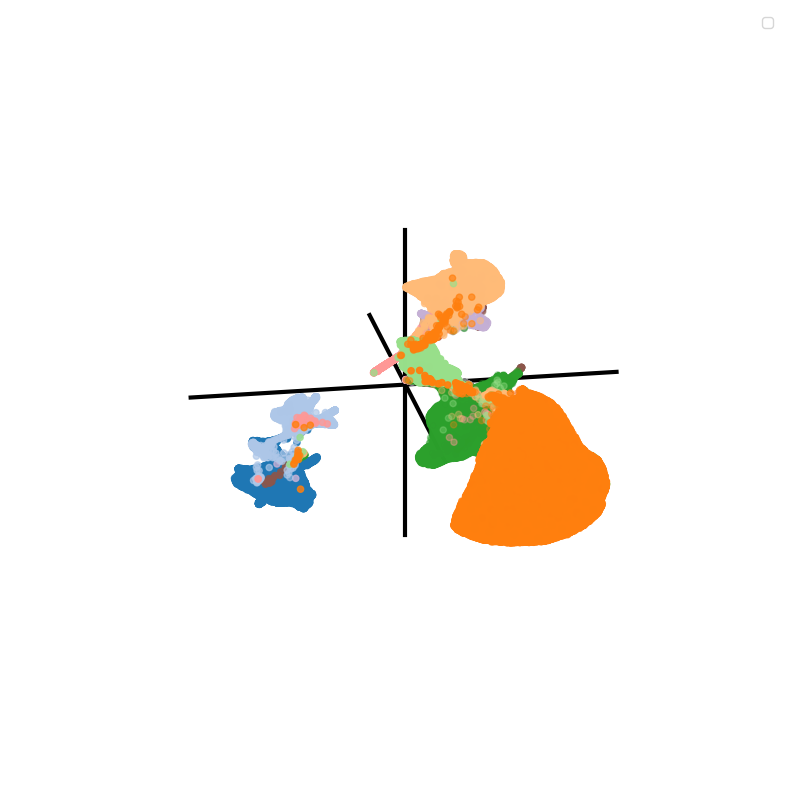

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


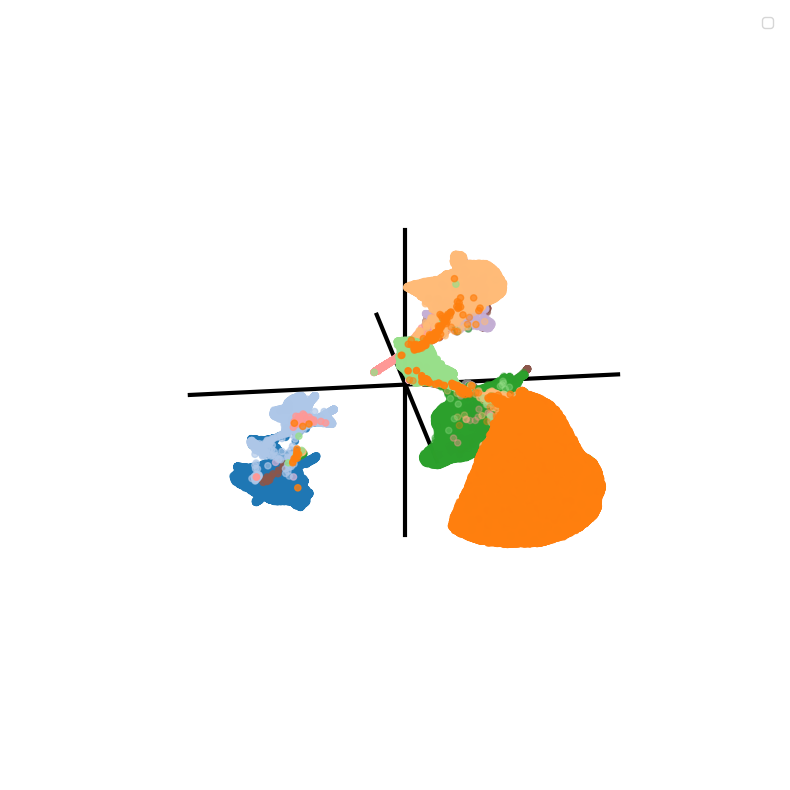

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


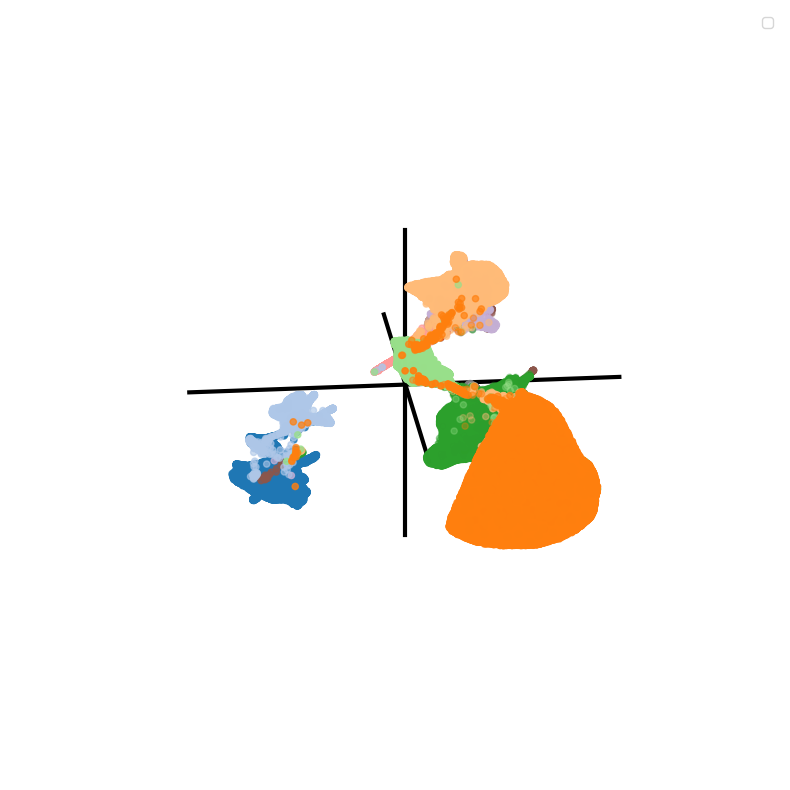

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


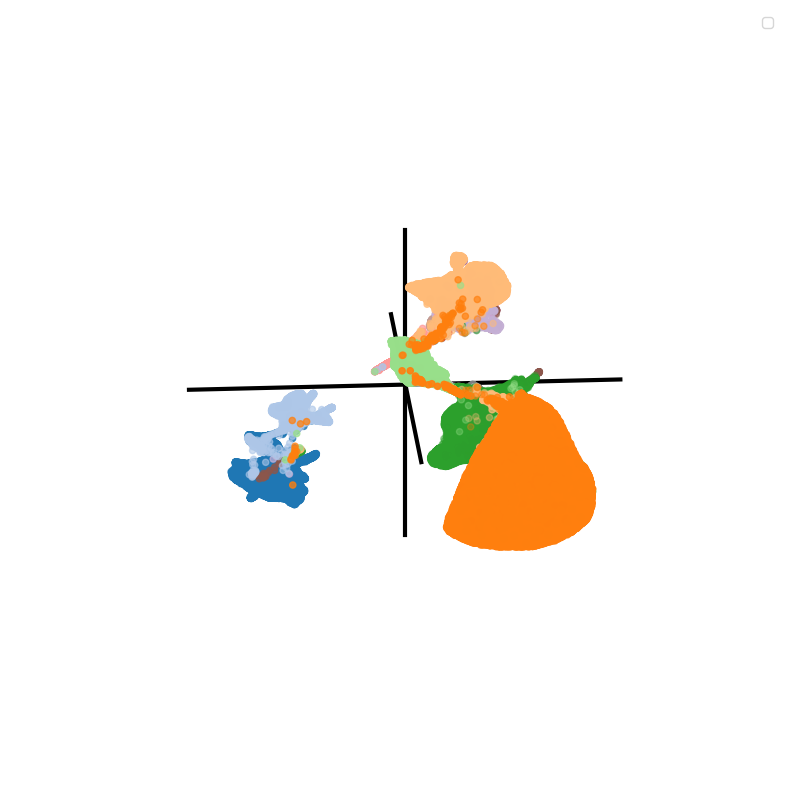

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


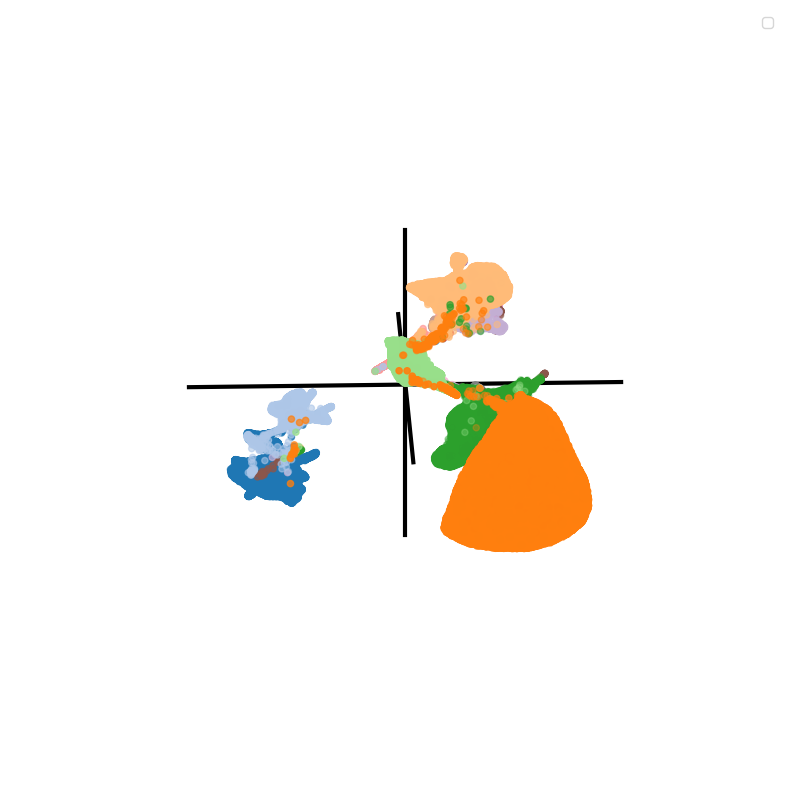

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


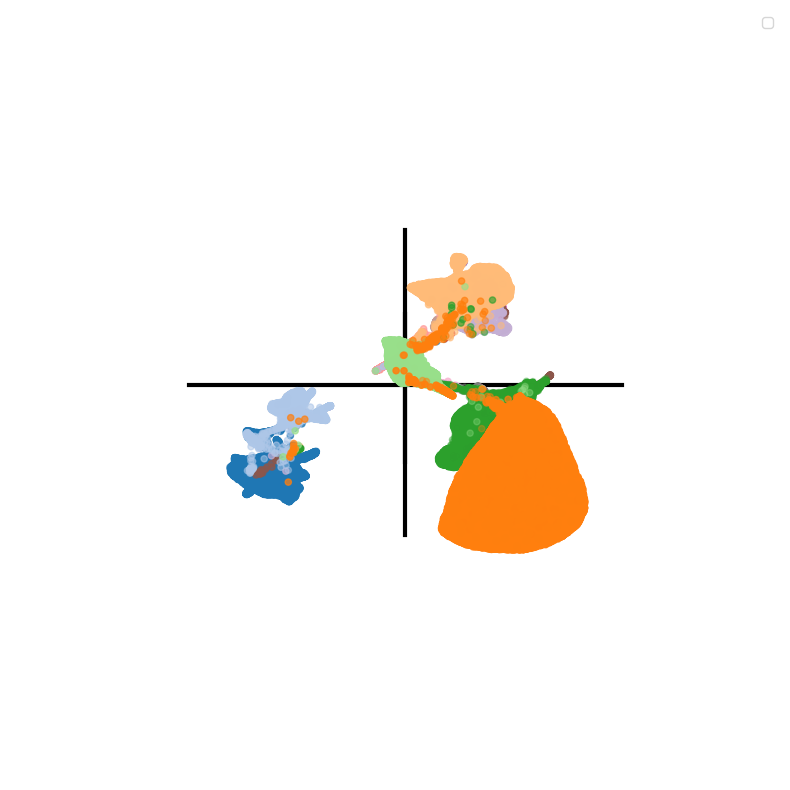

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


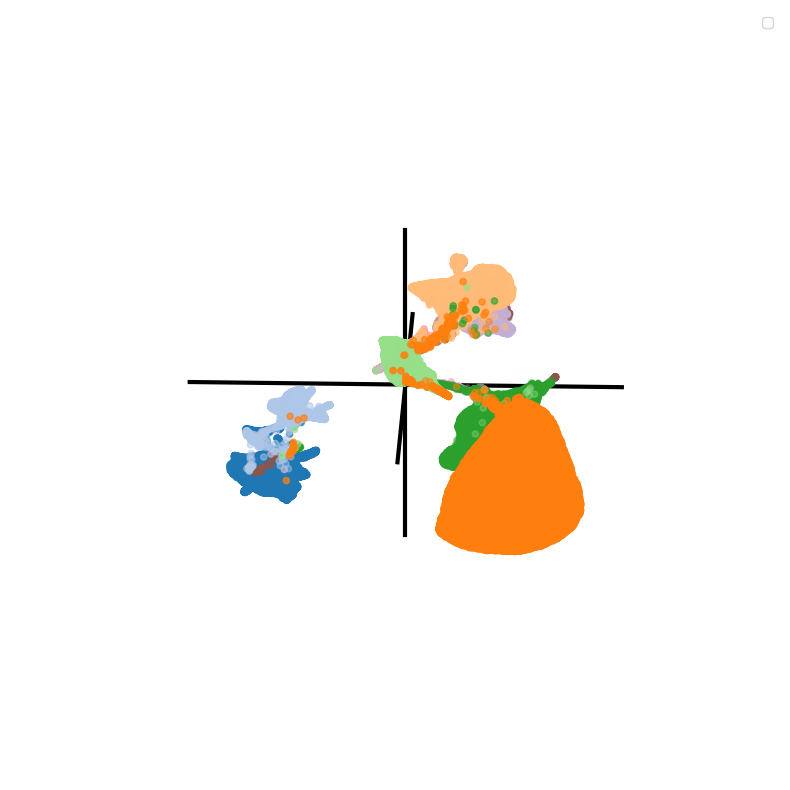

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


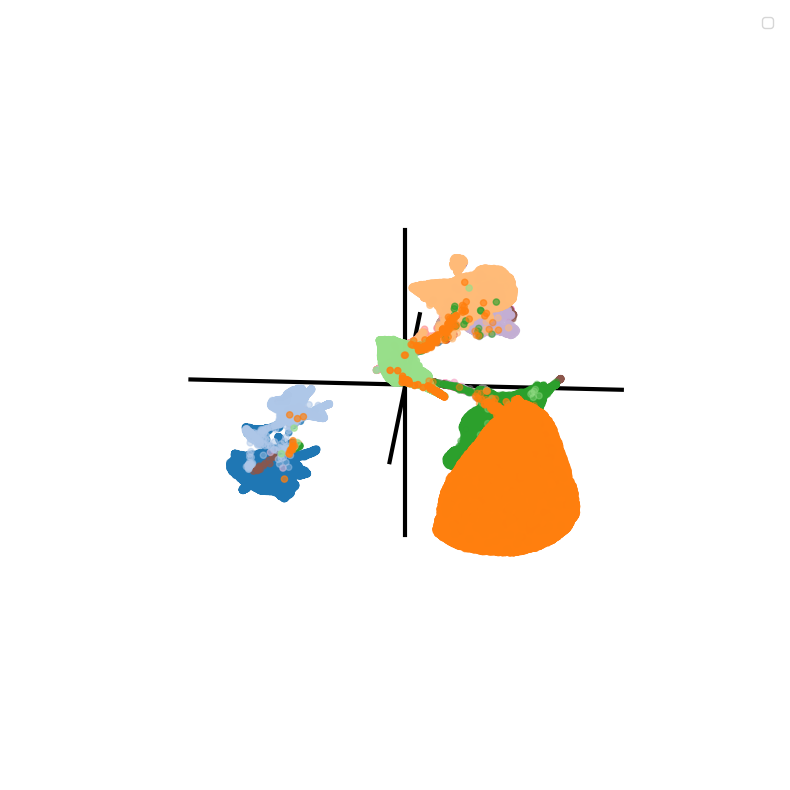

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


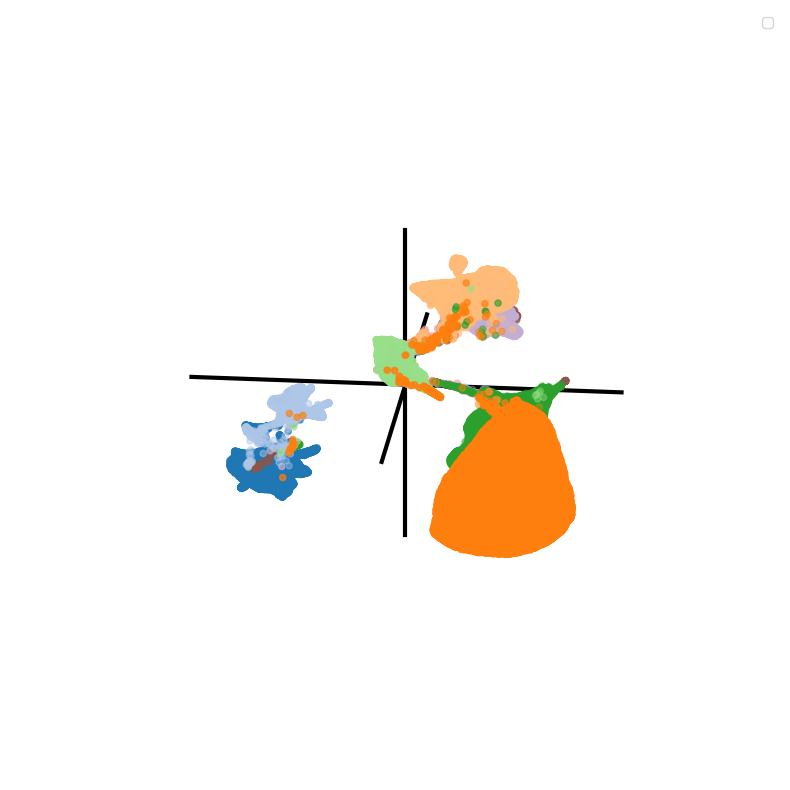

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


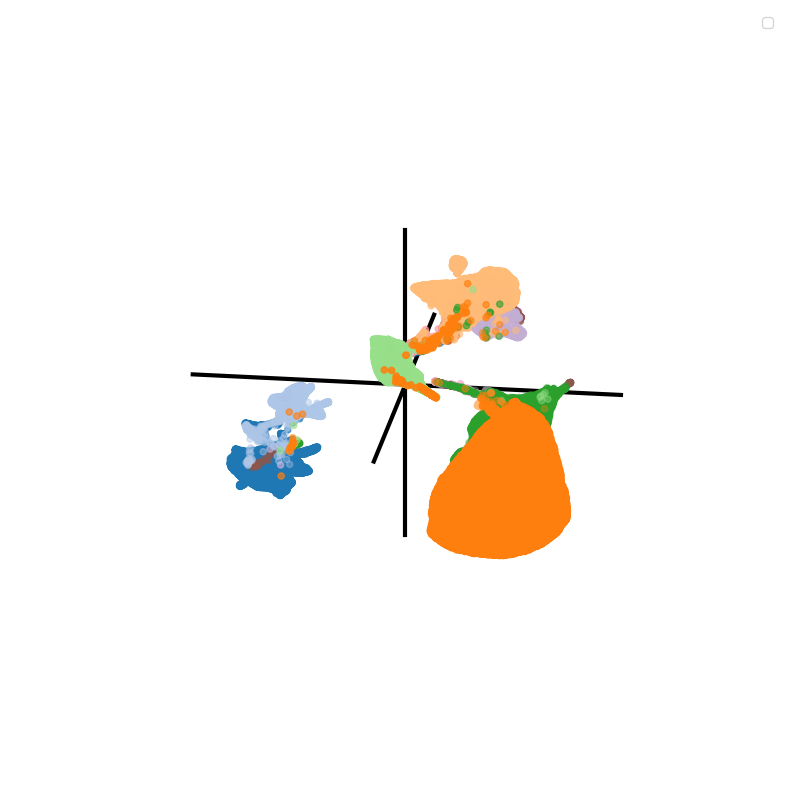

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


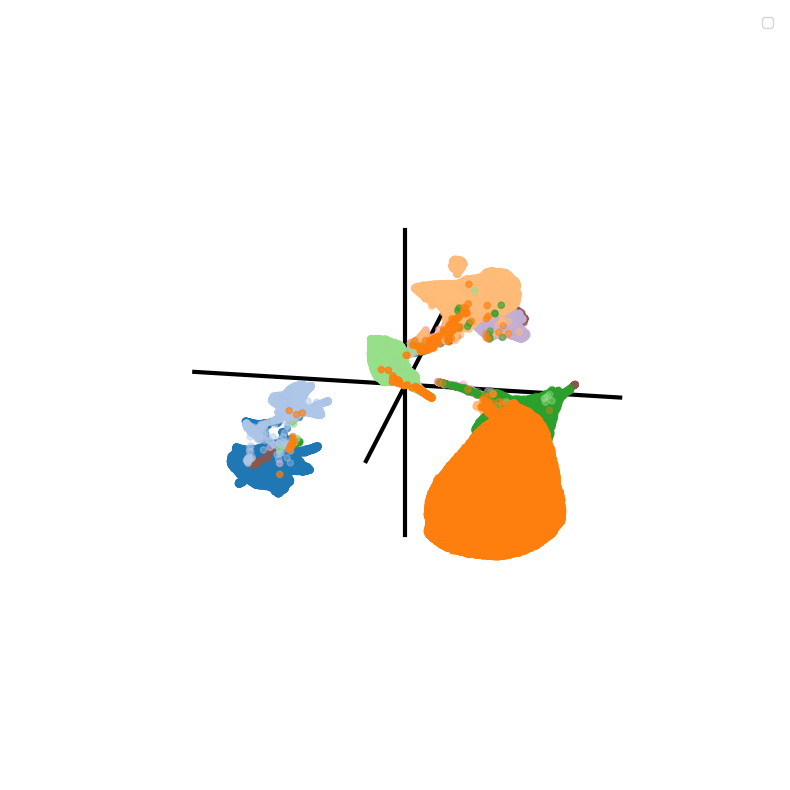

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


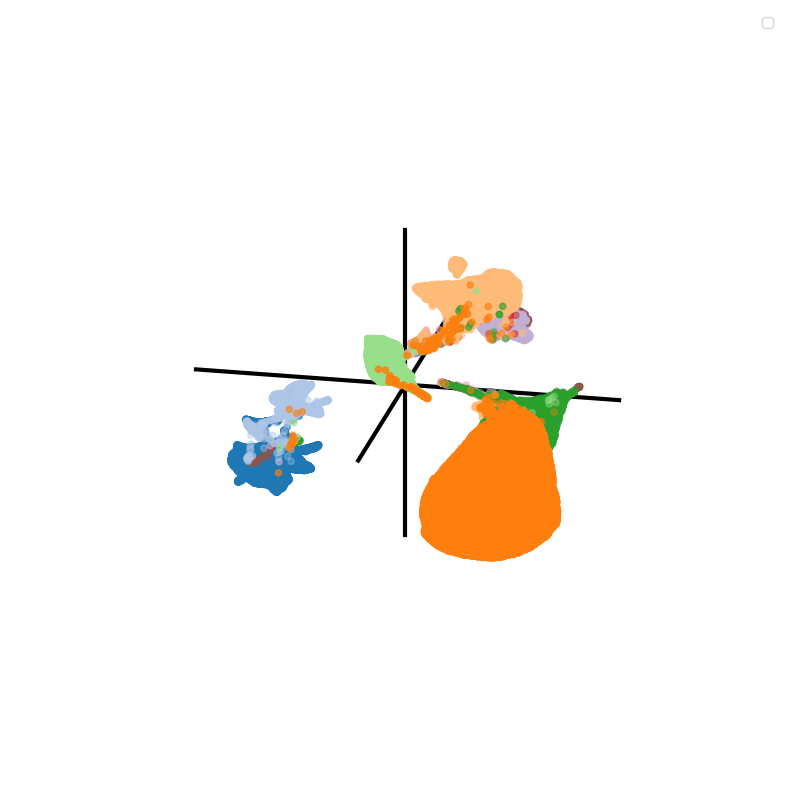

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


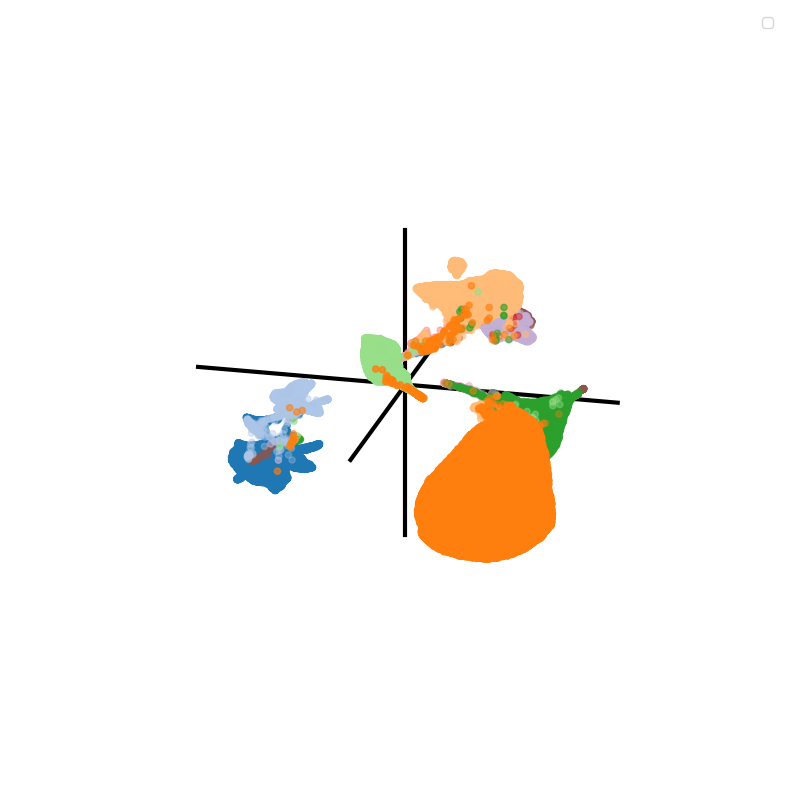

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


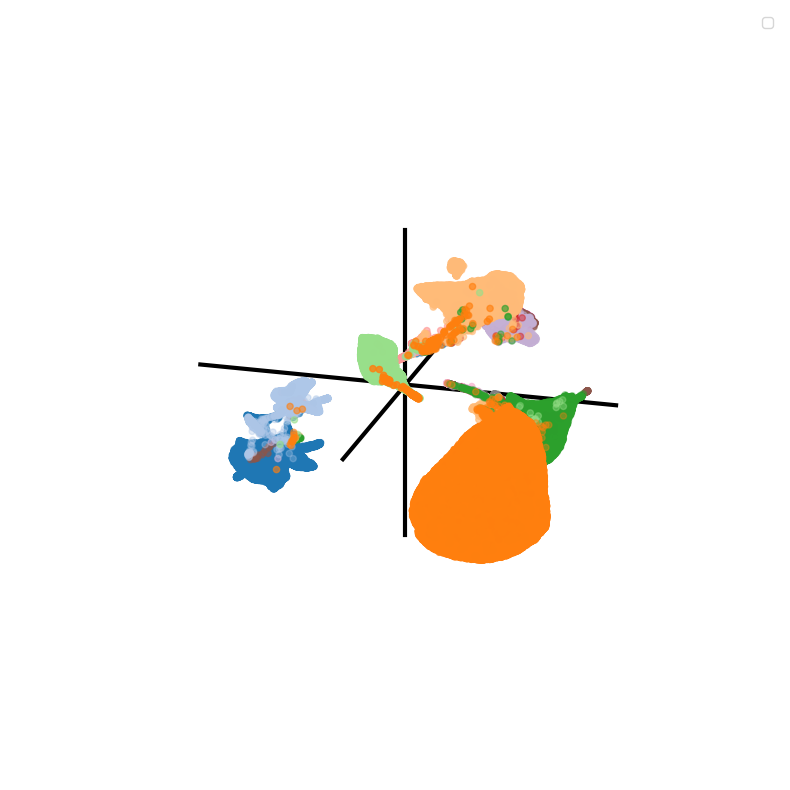

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


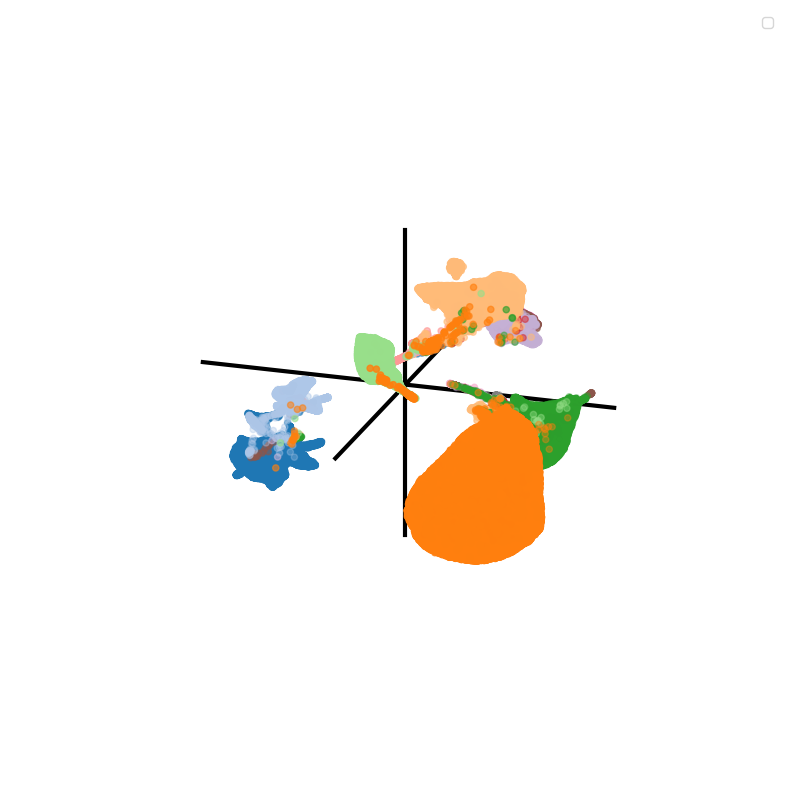

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


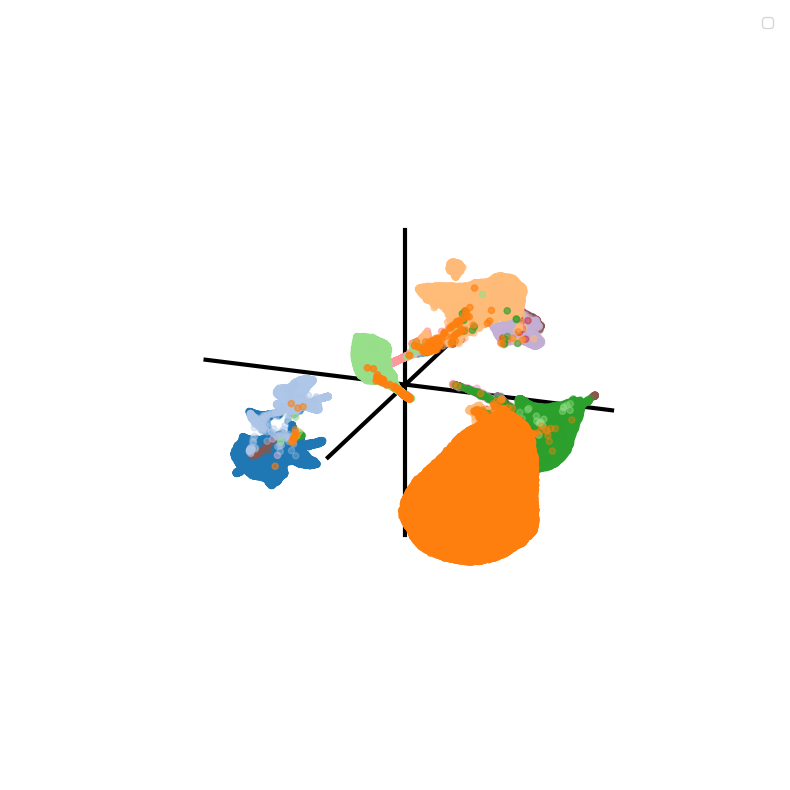

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


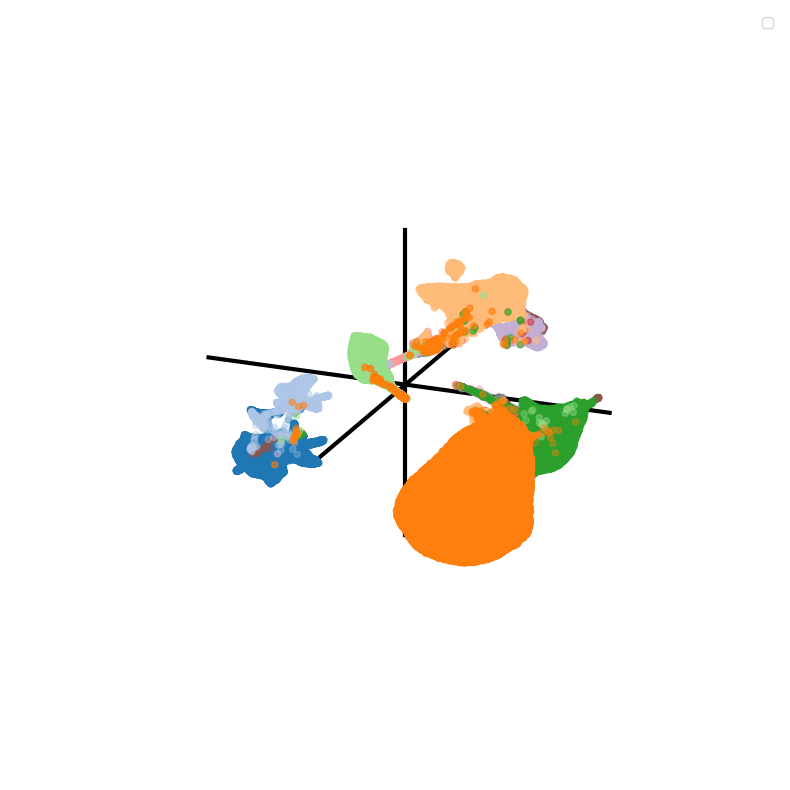

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


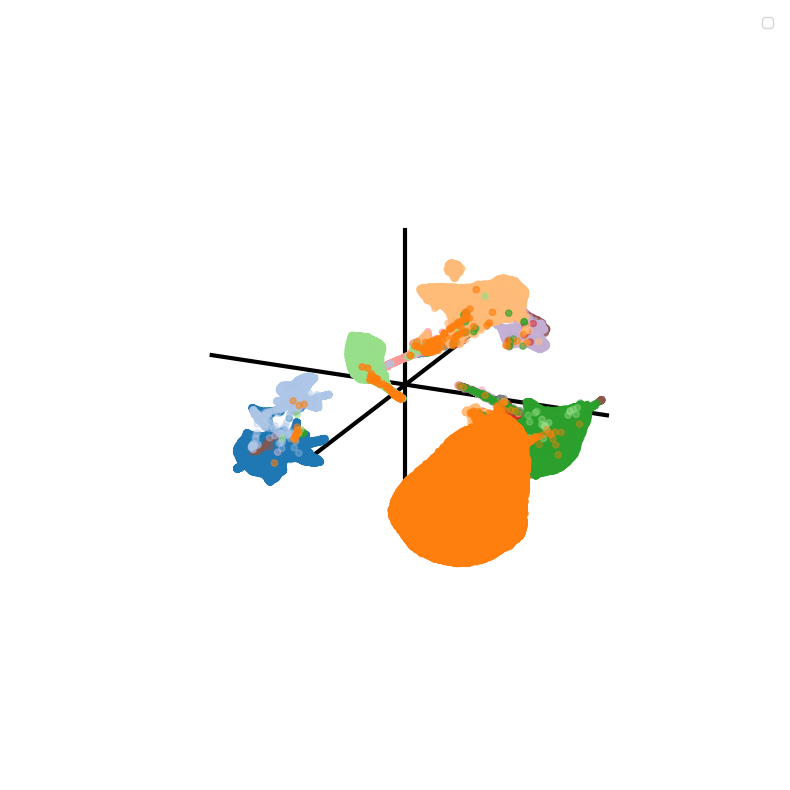

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


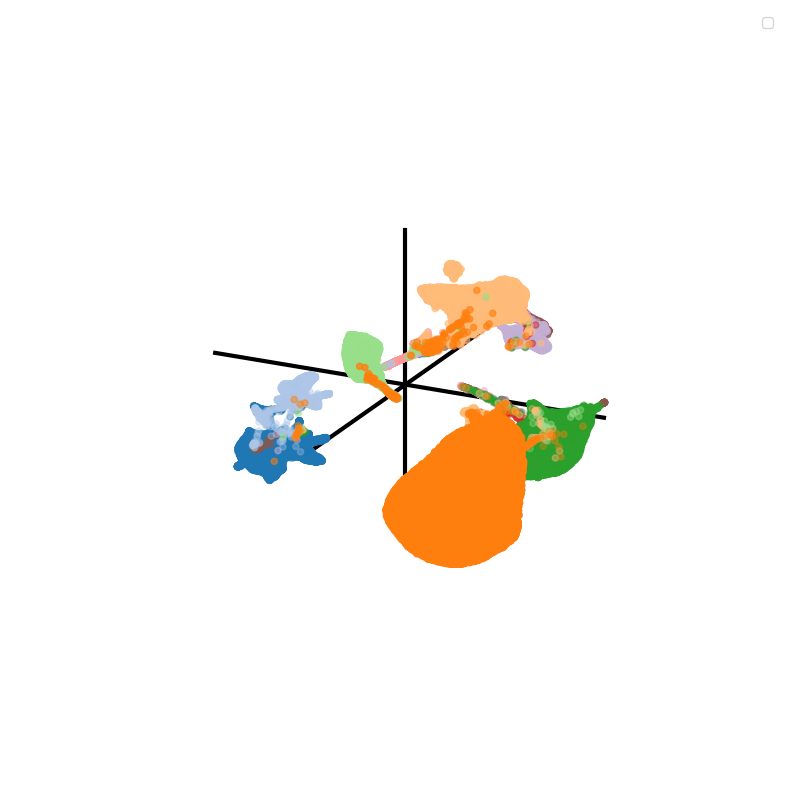

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


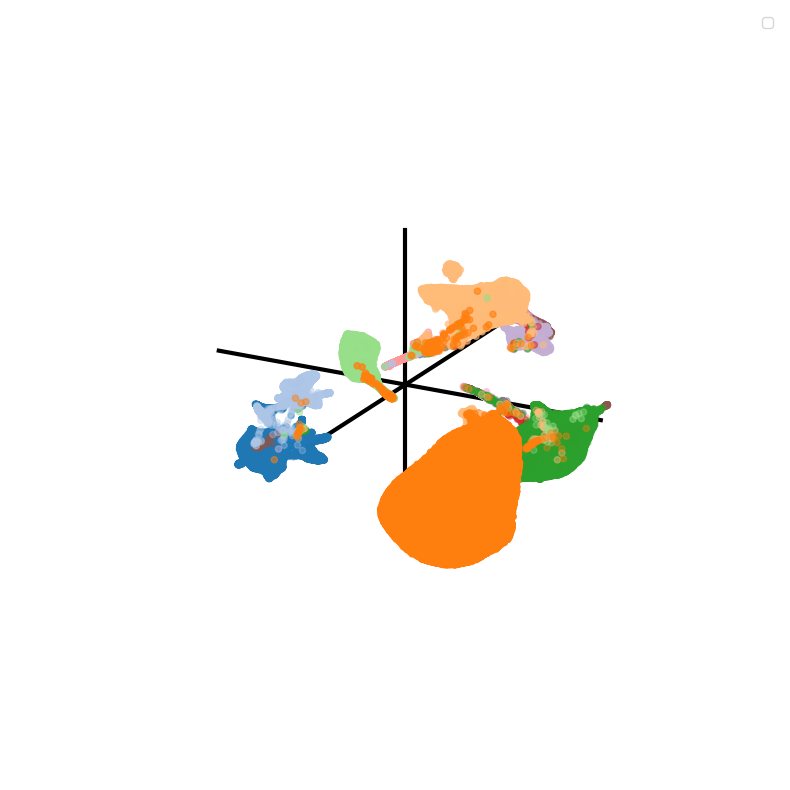

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


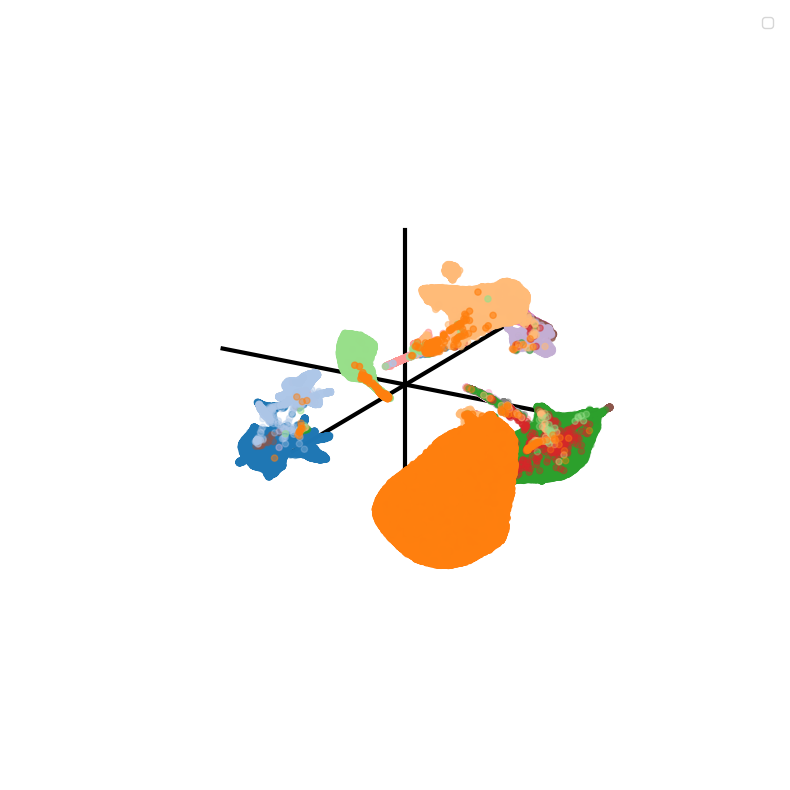

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


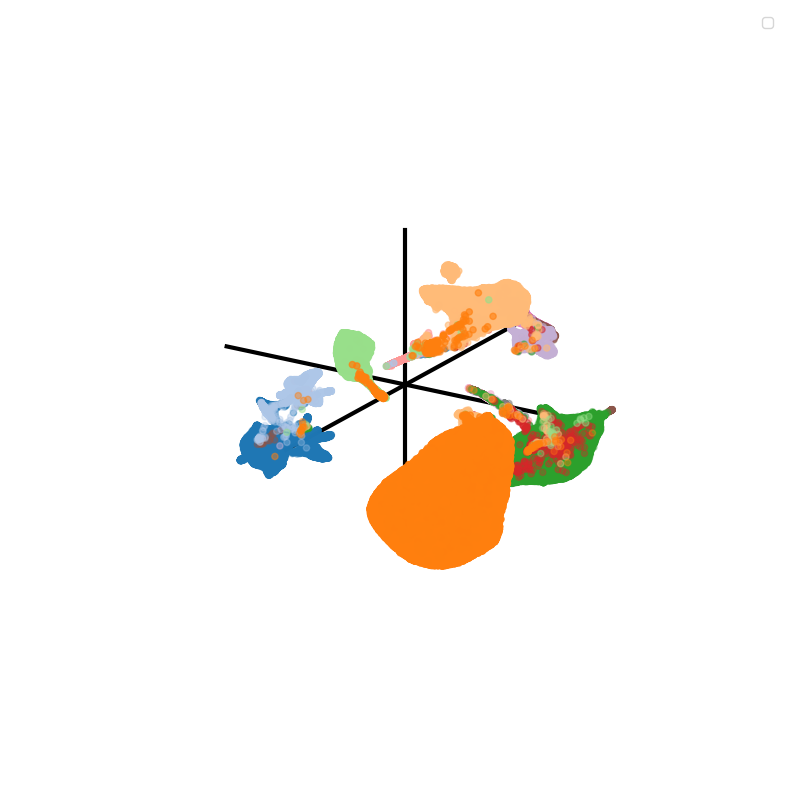

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


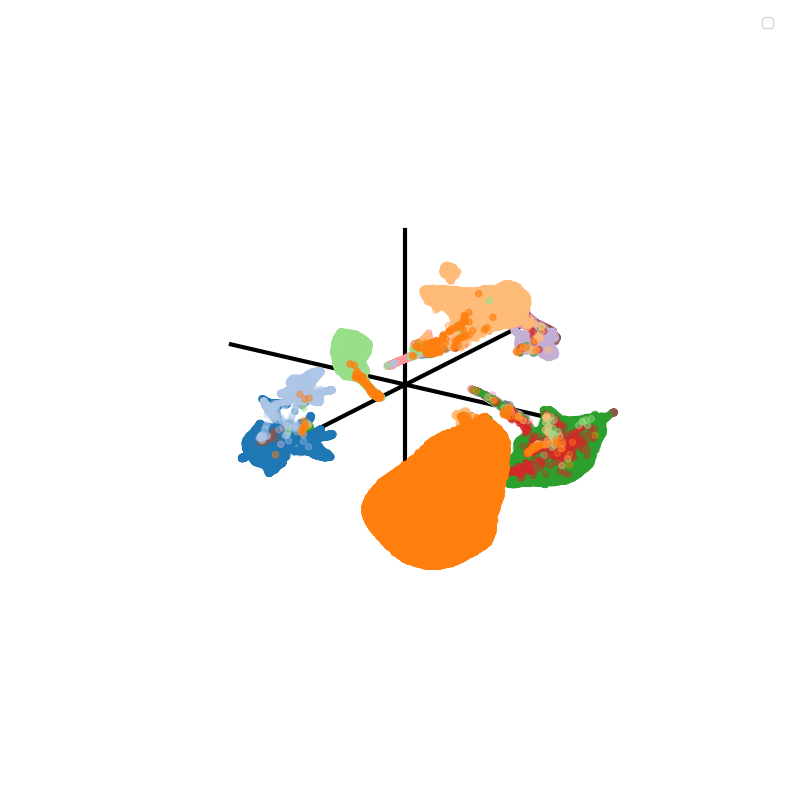

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


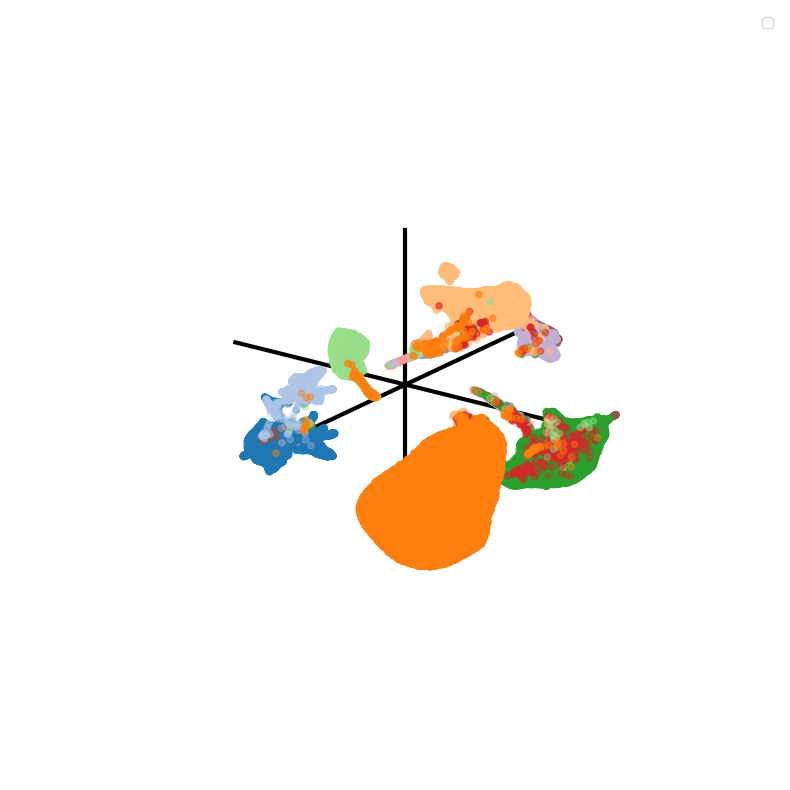

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


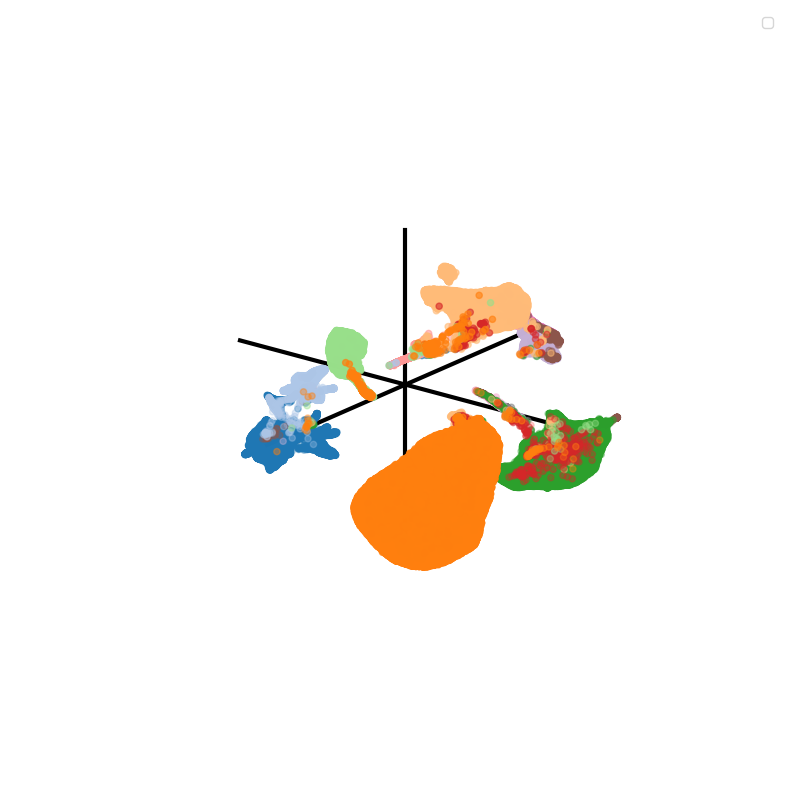

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


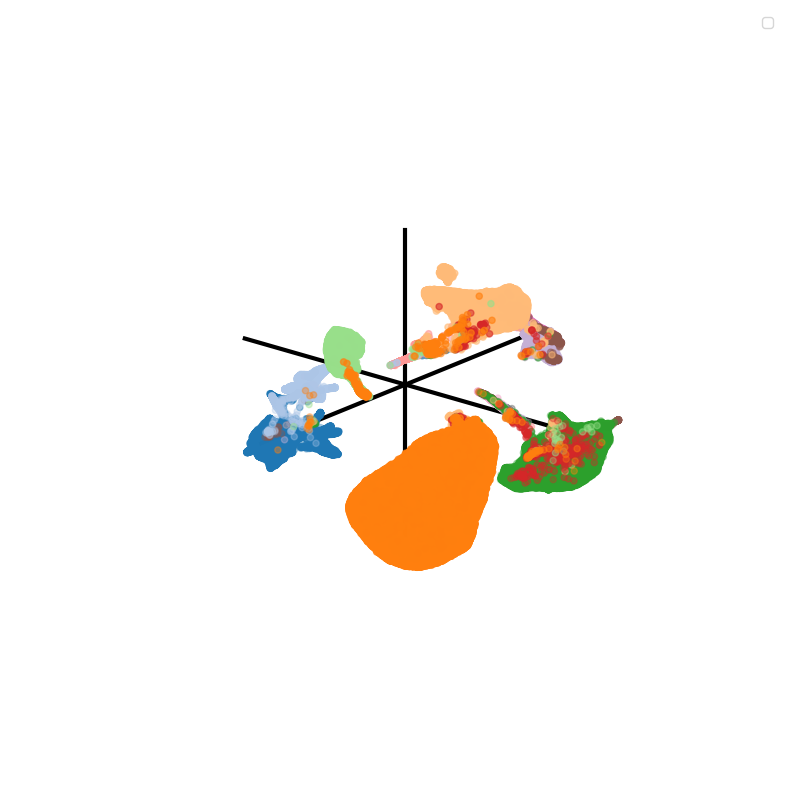

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


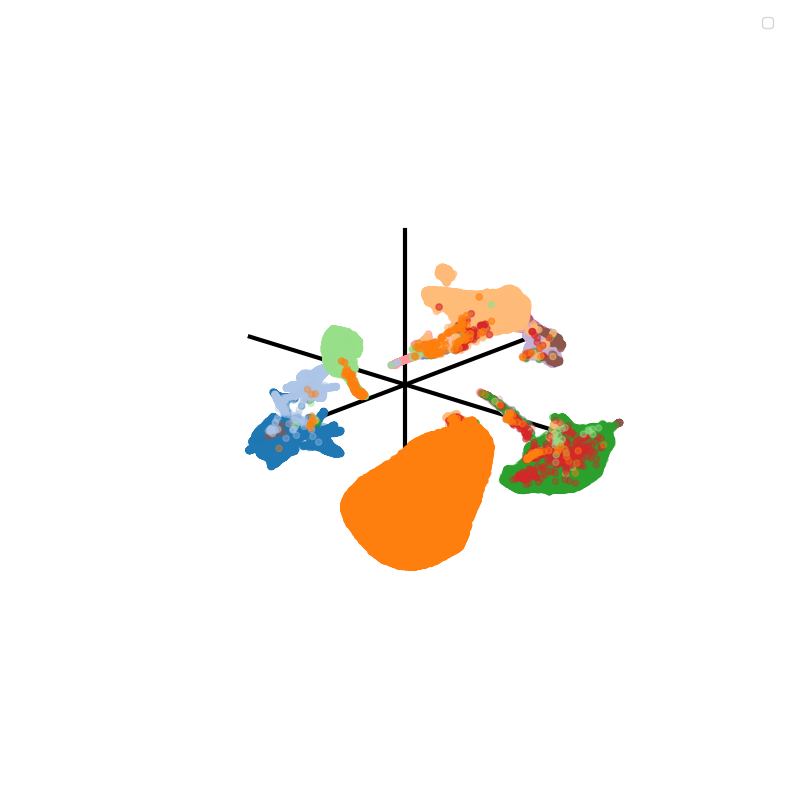

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


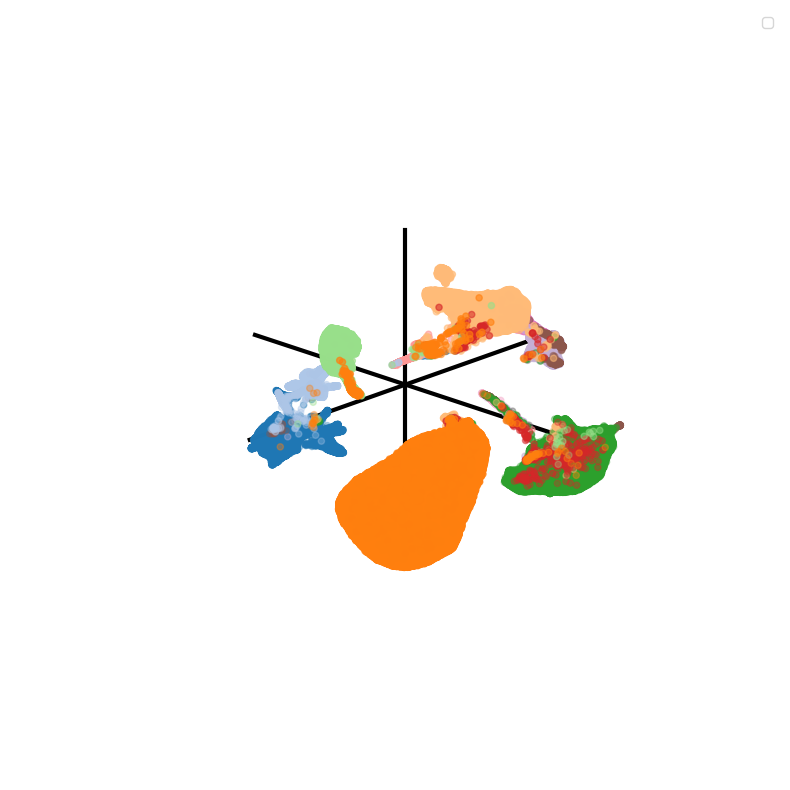

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


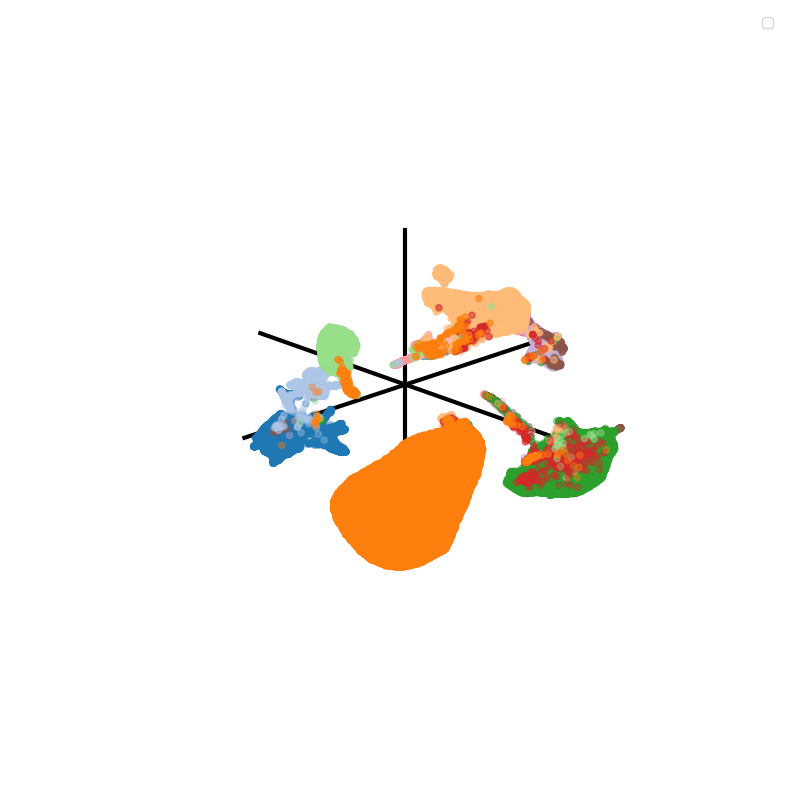

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


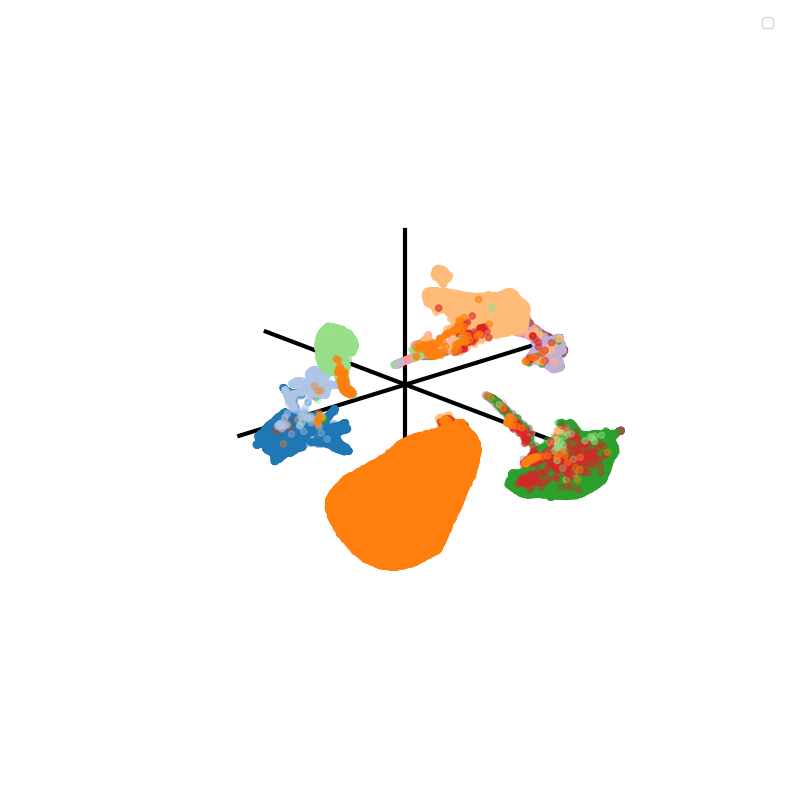

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


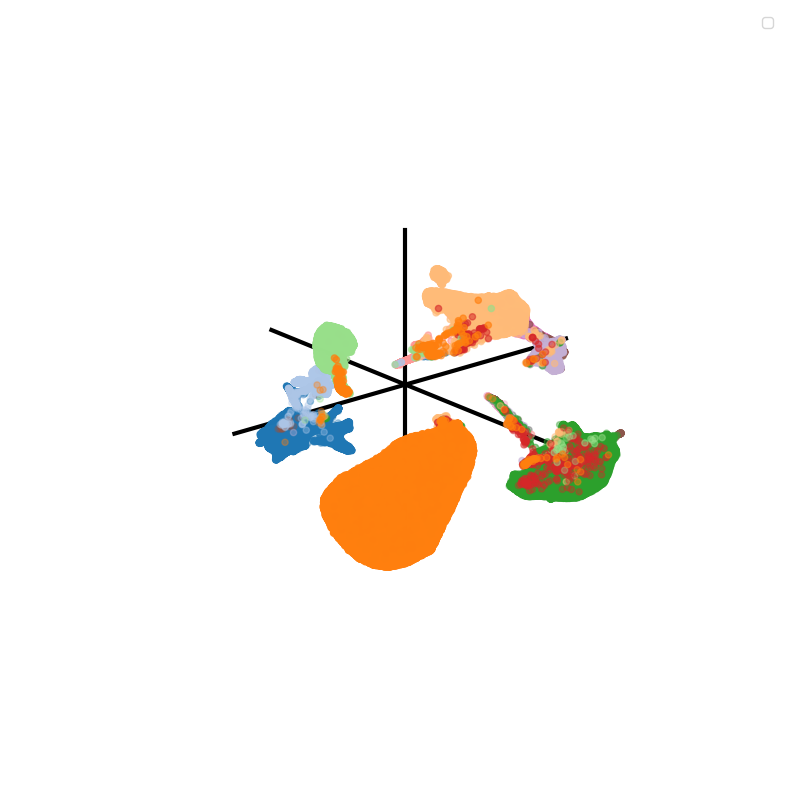

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


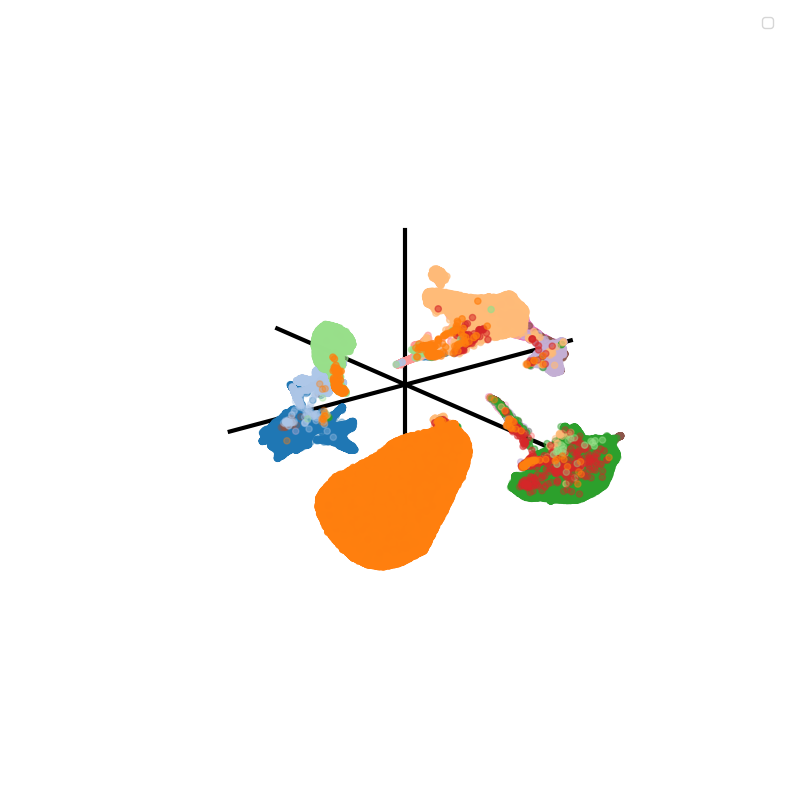

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


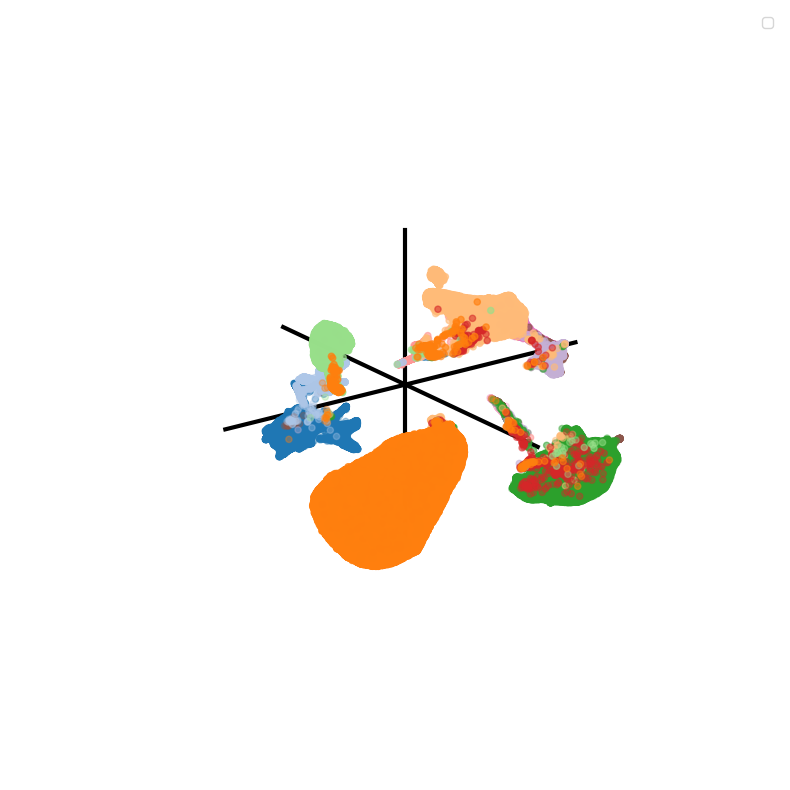

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


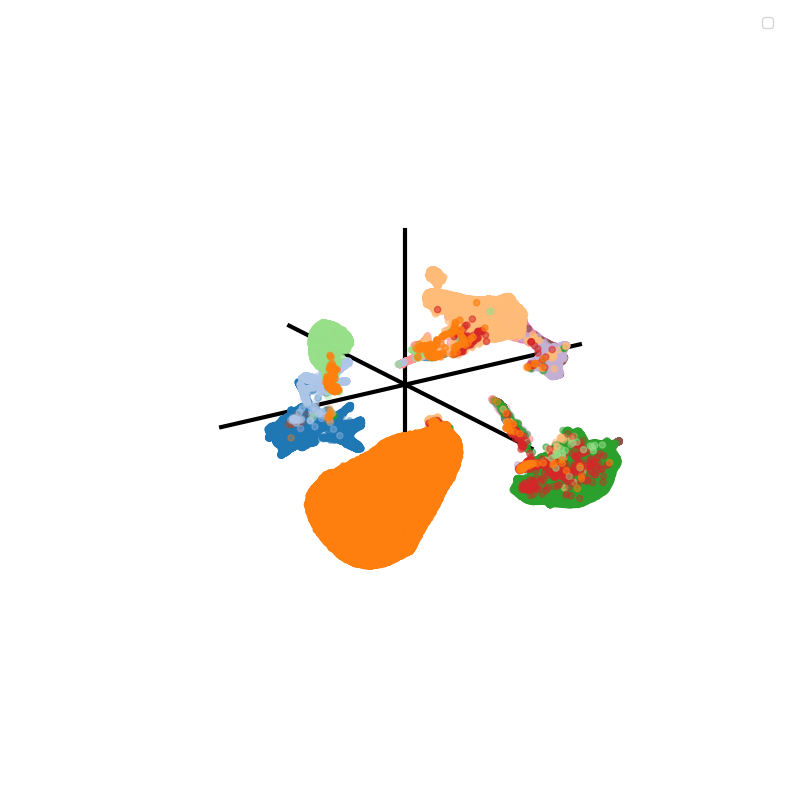

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


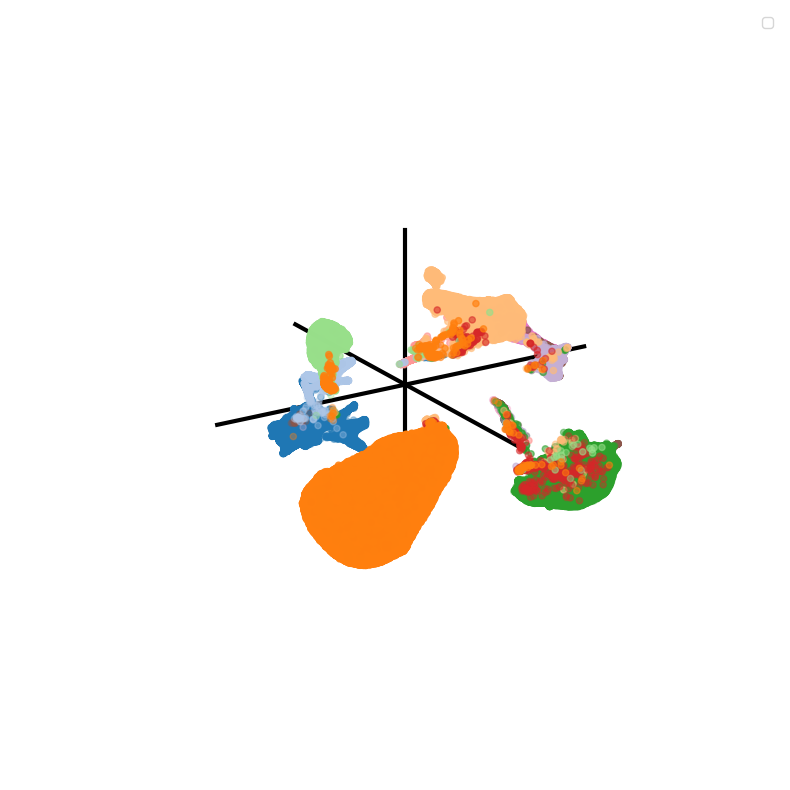

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


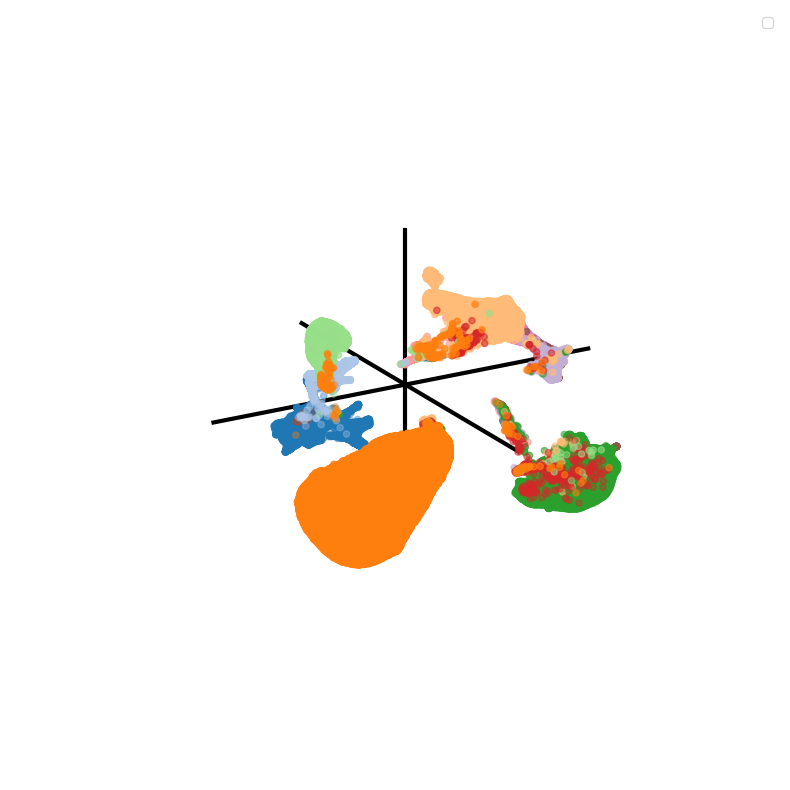

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


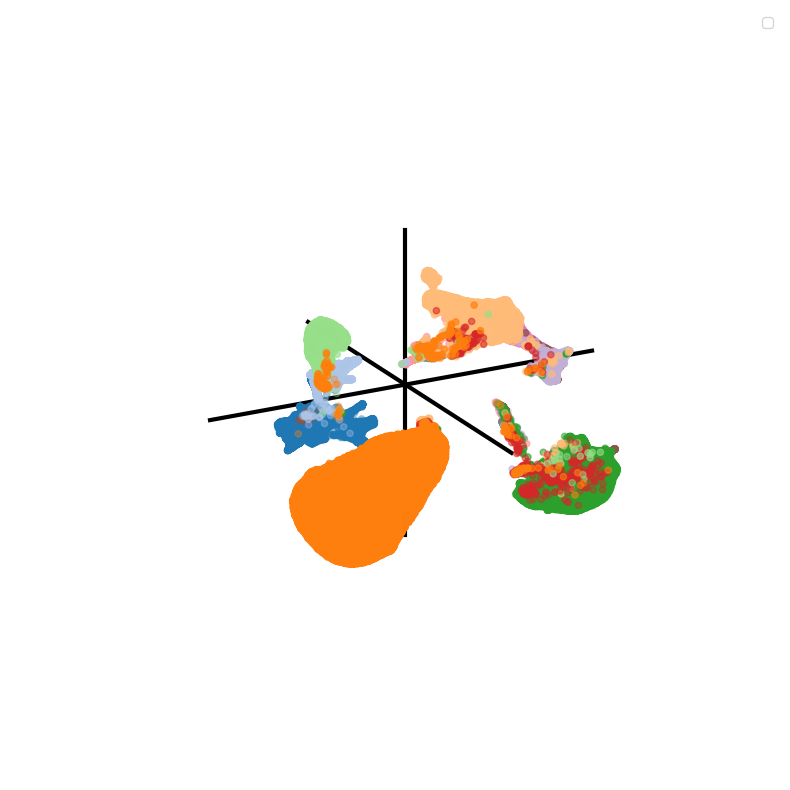

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


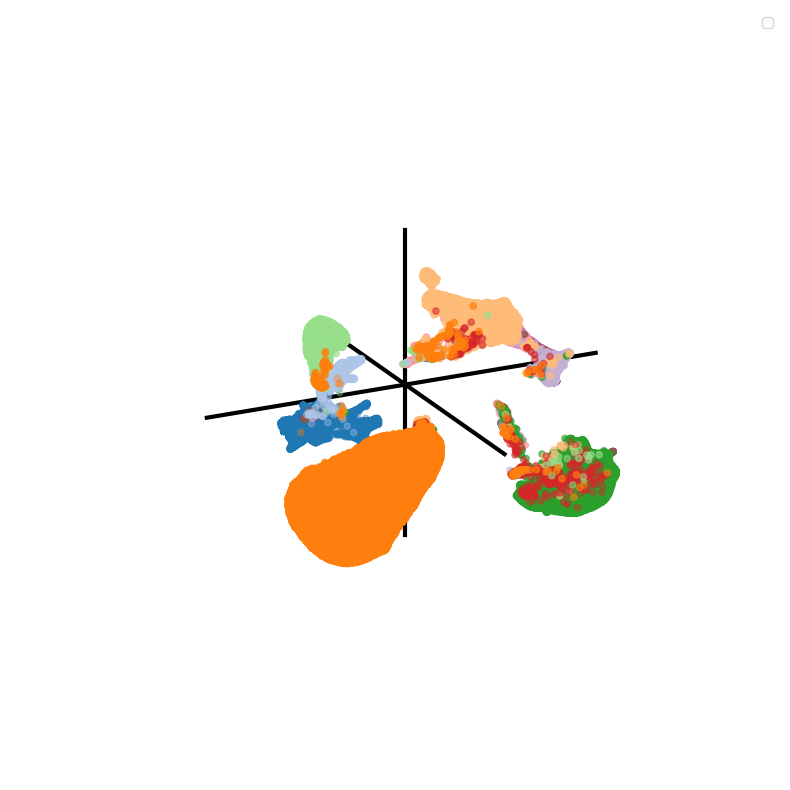

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


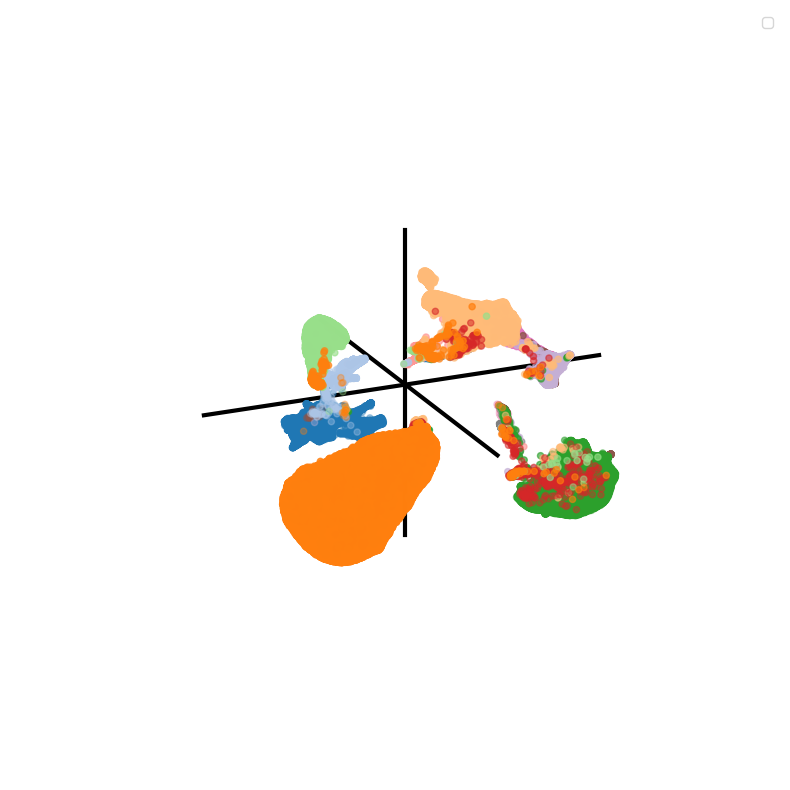

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


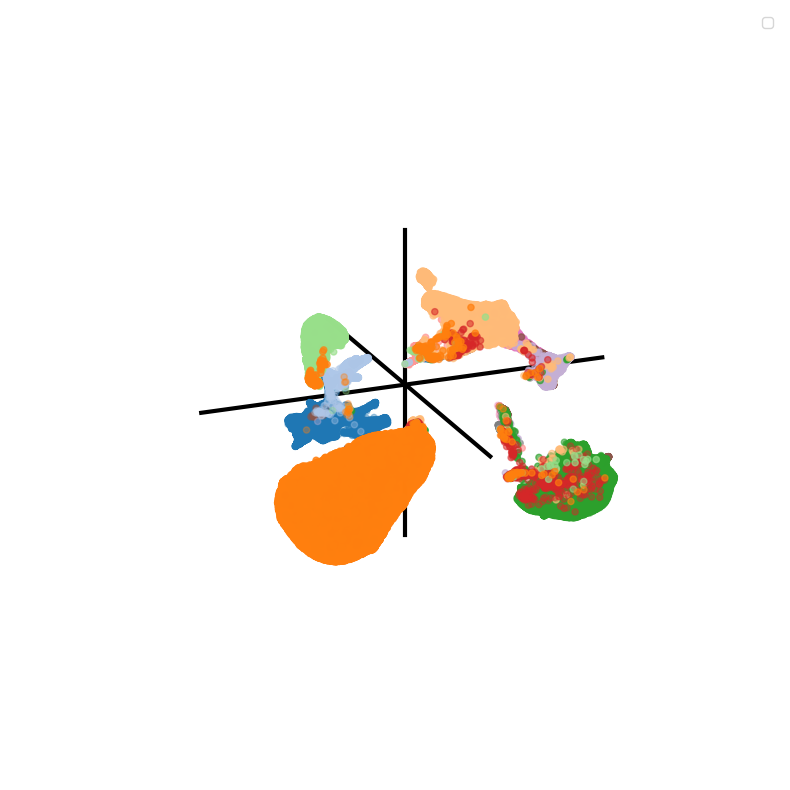

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


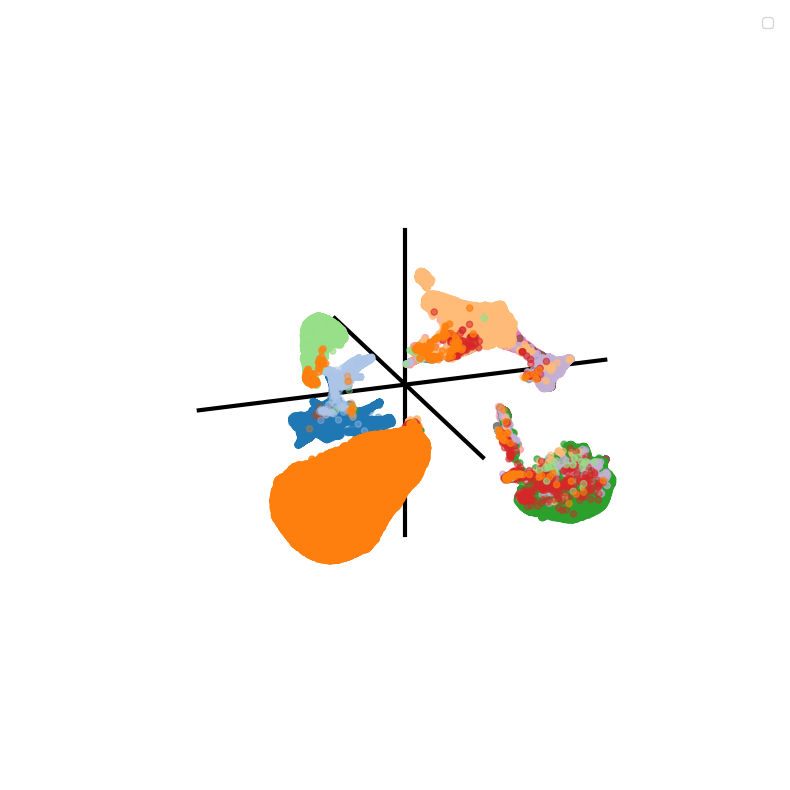

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


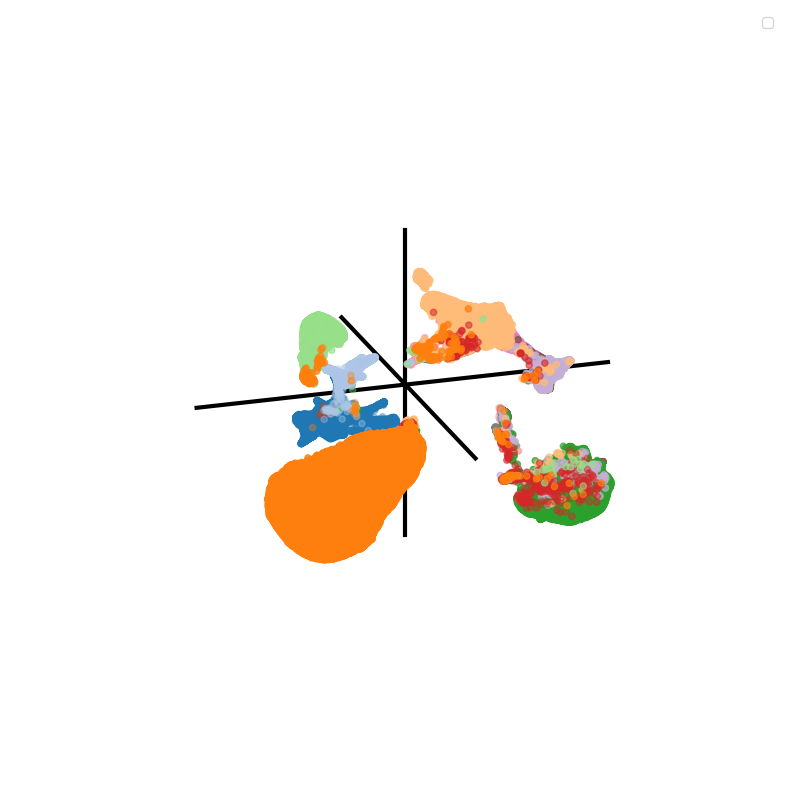

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


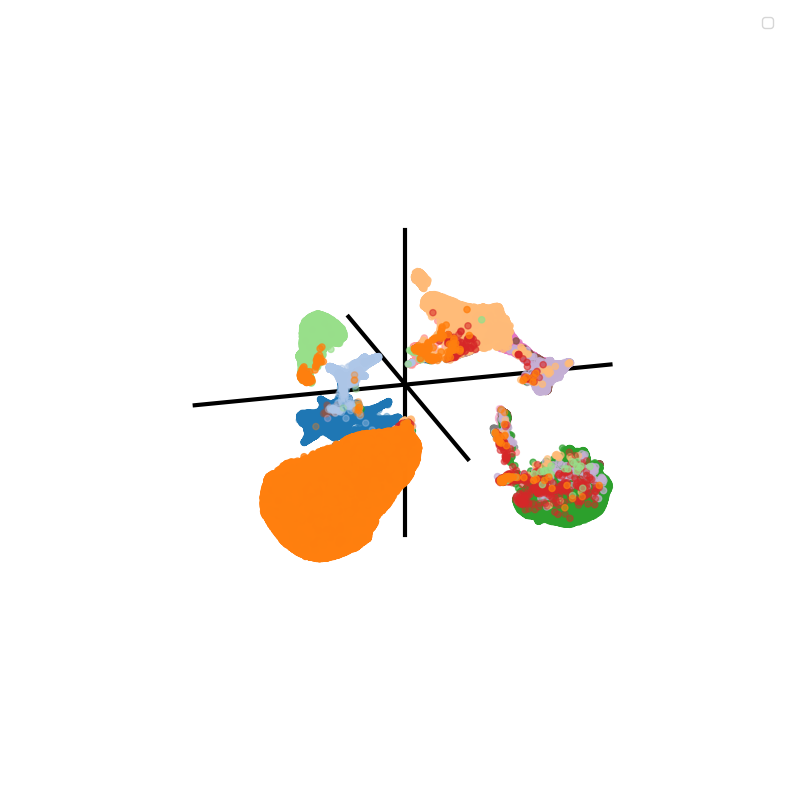

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


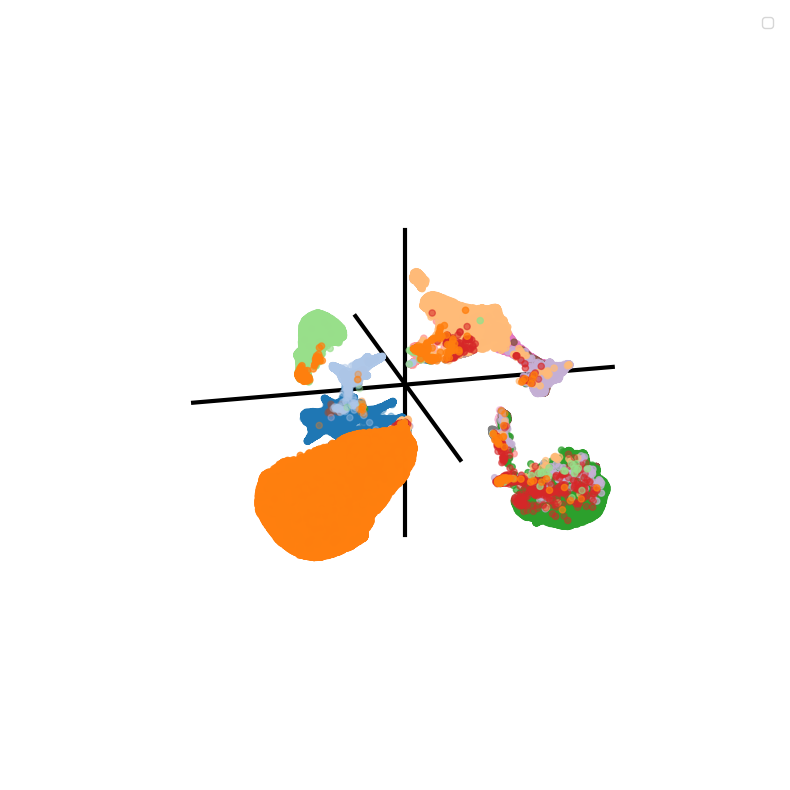

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


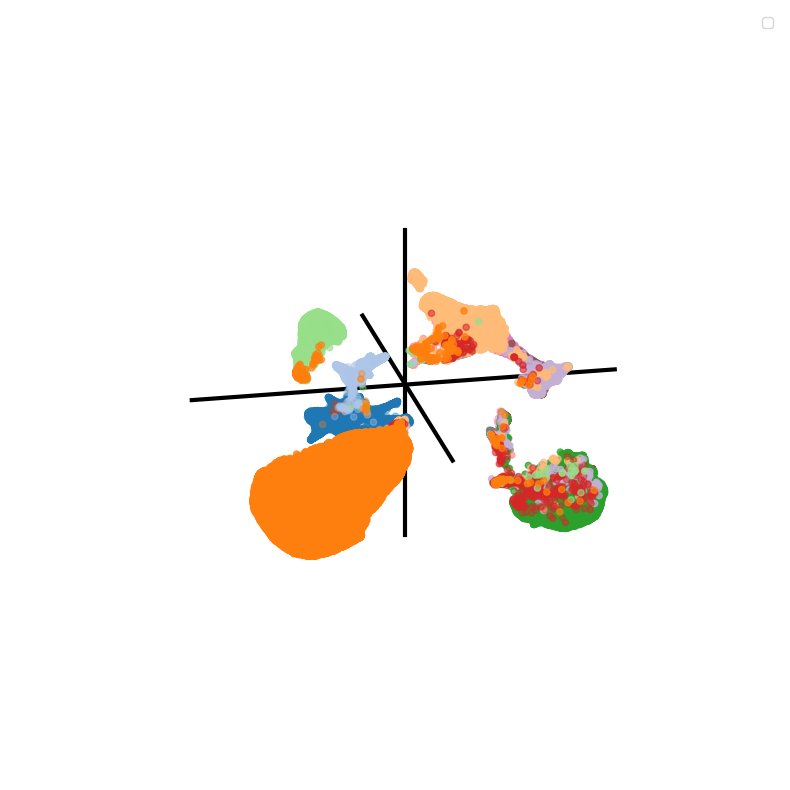

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


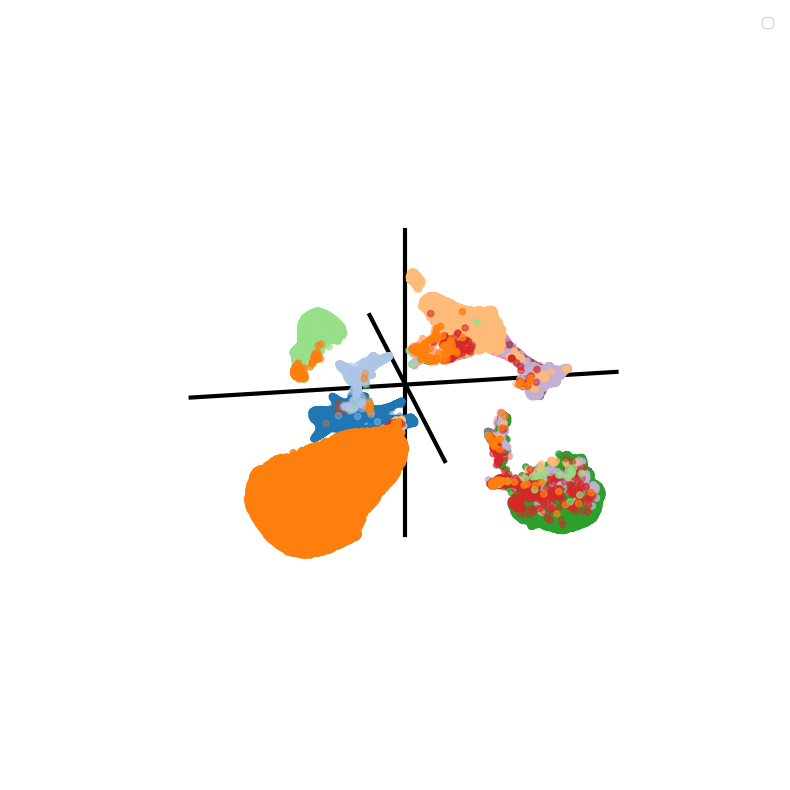

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


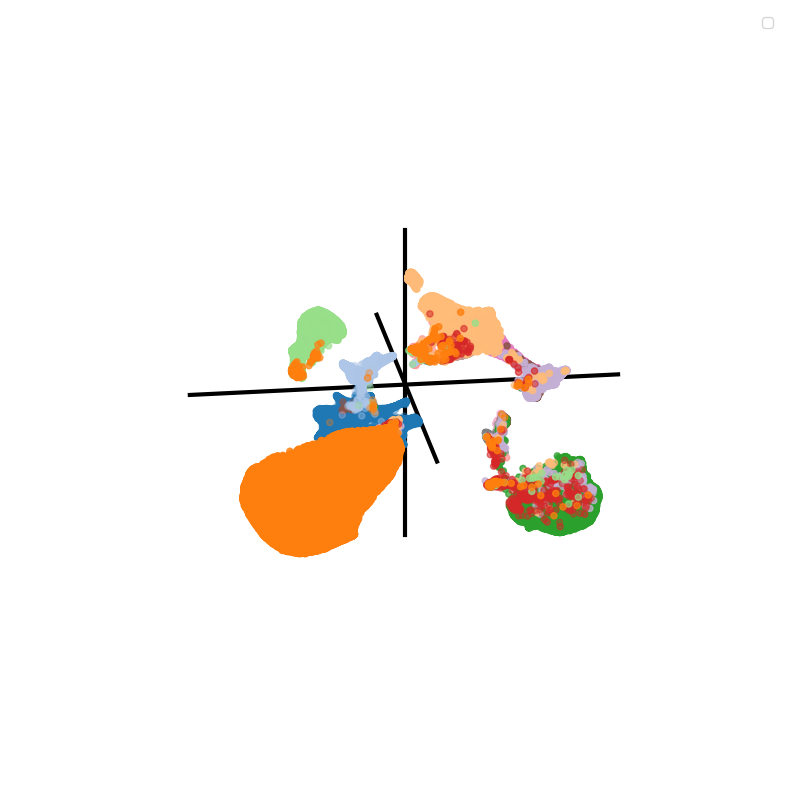

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


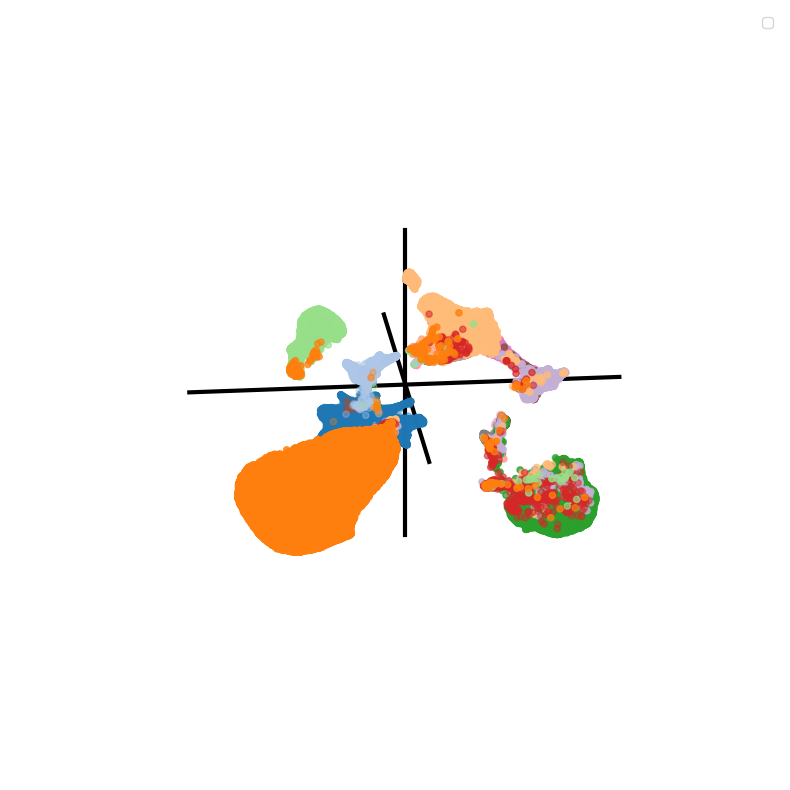

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


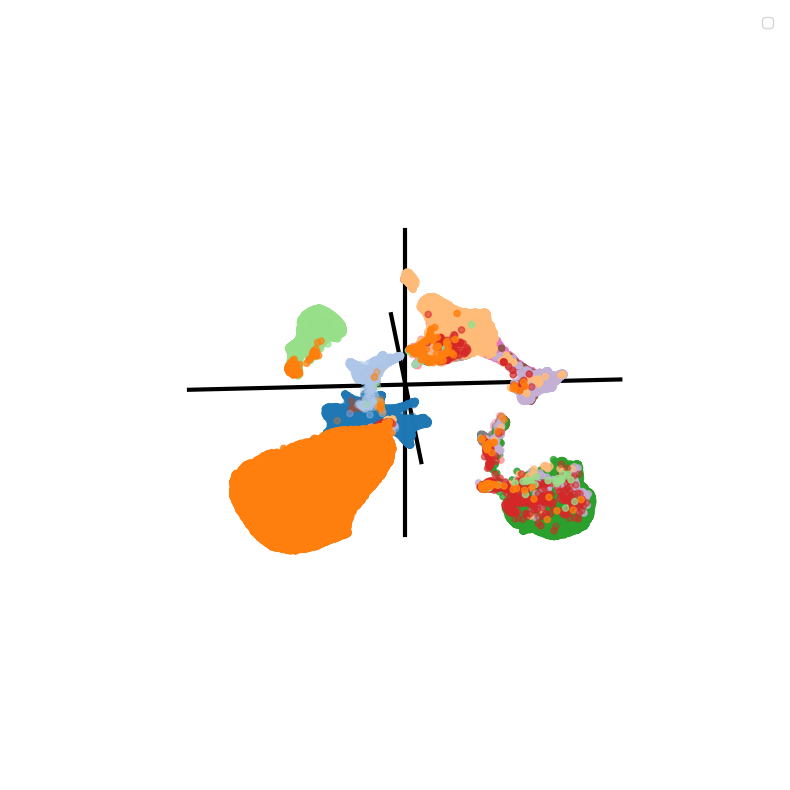

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


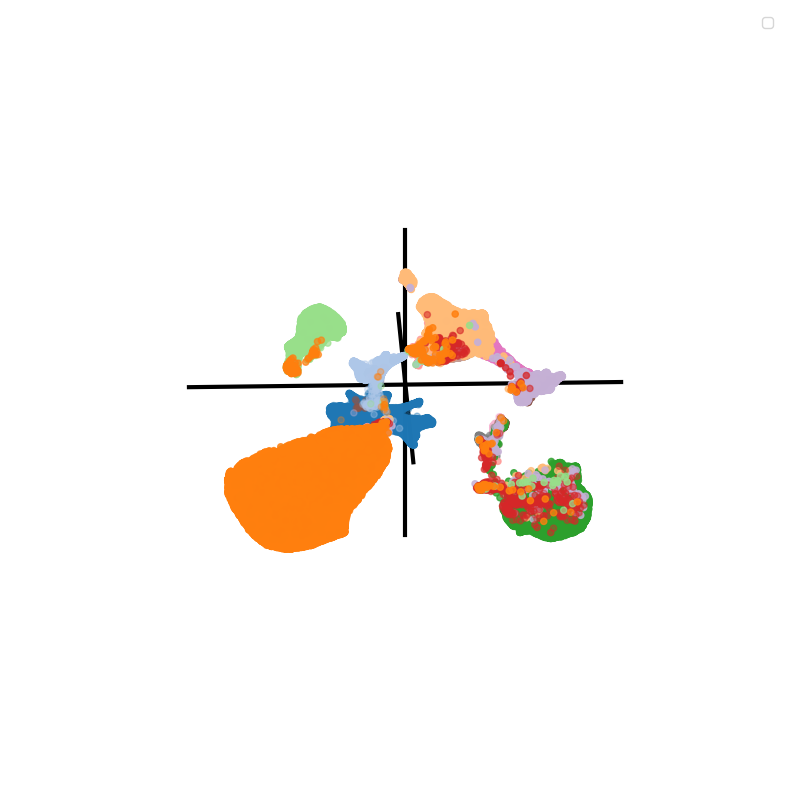

In [107]:
color = dict(zip(adata.obs['cell_type_eval'].unique(), plt.cm.tab20(range(len(adata.obs['cell_type_eval'].unique())))))

for i in range(0, 360, 2):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')

    # Iterate over unique cell types and plot each one separately with its respective color
    for cell_type in adata.obs['cell_type_eval'].unique():
        cell_type_umap = umap[adata.obs['cell_type_eval'] == cell_type]
        ax.scatter(cell_type_umap[:, 0], cell_type_umap[:, 1], cell_type_umap[:, 2],
                   c=color[cell_type])

    # Set labels and legend
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.set_zlabel('UMAP 3')
    ax.legend()

    # Get centers
    x_center= (umap[:,0].max() + umap[:,0].min())/2
    y_center= (umap[:,1].max() + umap[:,1].min())/2
    z_center= (umap[:,2].max() + umap[:,2].min())/2

    #Add lines
    ax.plot([x_center,x_center], [y_center,y_center], [umap[:,2].min() - 2, umap[:,2].max() +2], c = 'k', lw = 3)
    ax.plot([x_center,x_center], [umap[:,1].min() - 2, umap[:,1].max() +2], [z_center,z_center], c = 'k', lw = 3)
    ax.plot([umap[:,0].min() - 2, umap[:,0].max() +2], [y_center,y_center], [z_center,z_center], c = 'k', lw = 3)

    ax.view_init(20,i)
    
    ax.axis('off')
    
    plt.savefig(f'plot3d/{i:003}.png', dpi=100, facecolor ='white')

    plt.show()